In [1]:
import matplotlib.pyplot as plt
import os
import re
import shutil
import string
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

In [2]:
from tensorflow.keras import layers
from tensorflow.keras import losses
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [3]:
print(tf.__version__)

2.12.0-rc1


In [4]:
dataset_dir = os.path.join(os.path.dirname('dataset'), 'DATASET/DTS3000/')

In [5]:
os.listdir(dataset_dir)

['TEST', 'TRAIN']

In [6]:
train_dir = os.path.join(dataset_dir, 'TRAIN')
os.listdir(train_dir)

['EKO', 'KES', 'OLA', 'POL']

In [7]:
test_dir = os.path.join(dataset_dir, 'TEST')
os.listdir(train_dir)

['EKO', 'KES', 'OLA', 'POL']

In [8]:
sample_file = os.path.join(train_dir, 'KES/KES125.txt')

with open(sample_file) as f:
  print(f.read())

8 kebiasaan tidur siang yang buruk malah bikin otak lemot


In [9]:
batch_size = 32
seed = 42

raw_train_ds = tf.keras.utils.text_dataset_from_directory(
    'DATASET/DTS3000//TRAIN', 
    batch_size=batch_size, 
    validation_split=0.2, # Parto law 80:20
    subset='training', # ini digunakan untuk data yang akan di training
    seed=seed)

Found 2400 files belonging to 4 classes.
Using 1920 files for training.


In [10]:
for text_batch, label_batch in raw_train_ds.take(1):
  for i in range(3):
    print("Review", text_batch.numpy()[i])
    print("Label", label_batch.numpy()[i])

Review b'jelang persaingan panas perebutan titel juara dunia di motogp valencia 2022 fabio quartararo justru santai'
Label 2
Review b'ojk potensi kredit bermasalah terus meningkat seiring dampak pandemi pada ekonomi'
Label 0
Review b'penyakit kanker terkait gen dipengaruhi faktor lingkungan'
Label 1


In [11]:
print("Label 0 corresponds to", raw_train_ds.class_names[0])
print("Label 1 corresponds to", raw_train_ds.class_names[1])
print("Label 2 corresponds to", raw_train_ds.class_names[2])
print("Label 3 corresponds to", raw_train_ds.class_names[3])

Label 0 corresponds to EKO
Label 1 corresponds to KES
Label 2 corresponds to OLA
Label 3 corresponds to POL


In [12]:
label = [0,1,2,3]
kategori_berita = ["EKONOMI","KESEHATAN","OLAHRAGA","POLITIK"]

labeling_judul_berita = pd.DataFrame()
labeling_judul_berita['label']= label
labeling_judul_berita['kategori_berita']= kategori_berita

display(labeling_judul_berita)

,label,kategori_berita
0,0,EKONOMI
1,1,KESEHATAN
2,2,OLAHRAGA
3,3,POLITIK


In [13]:
raw_val_ds = tf.keras.utils.text_dataset_from_directory(
    'DATASET/DTS3000/TRAIN', 
    batch_size=batch_size, 
    validation_split=0.2, 
    subset='validation', 
    seed=seed)

Found 2400 files belonging to 4 classes.
Using 480 files for validation.


In [14]:
raw_test_ds = tf.keras.utils.text_dataset_from_directory(
    'DATASET/DTS3000/TEST', 
    batch_size=batch_size)

Found 604 files belonging to 4 classes.


In [15]:
def custom_standardization(input_data):
  # Membuat Semua String menjadi Lower String/ huruf kecil Semua
  lowercase = tf.strings.lower(input_data)
  # Menghapus apabila ada html tag

  stripped_html = tf.strings.regex_replace(lowercase, '<br />', ' ')
  return tf.strings.regex_replace(stripped_html,
                                  '[%s]' % re.escape(string.punctuation),
                                  '')

In [16]:
max_features = 10000
sequence_length = 250

vectorize_layer = layers.TextVectorization(
    # Memanggil fungsi sebelumnya yang mestandarkan semua string input menjadi lower case dan menghilangkan tag html bila ada
    standardize=custom_standardization,
    # Memberikan batasan padding agar panjang matrix sama pada setiap masukan.
    max_tokens=max_features,
    # Output String akan diubah menjadi bentuk integer
    output_mode='int',
    output_sequence_length=sequence_length)

In [17]:
# Make a text-only dataset (without labels), then call adapt
train_text = raw_train_ds.map(lambda x, y: x)
vectorize_layer.adapt(train_text)

In [18]:
def vectorize_text(text, label):
  text = tf.expand_dims(text, -1)
  #print(text)
  return vectorize_layer(text), label

In [19]:
text_batch, label_batch = next(iter(raw_train_ds))
first_review, first_label = text_batch[12], label_batch[12]
print("\nReview -> text_batch[12]", first_review)
print("Label -> Label_batch[12]", raw_train_ds.class_names[first_label])
print("\nVectorized review nya seperti ini \n\n", vectorize_text(first_review, first_label))


Review -> text_batch[12] tf.Tensor(b'fakta dan ahistoris pisahkan olahraga dari politik', shape=(), dtype=string)
Label -> Label_batch[12] POL

Vectorized review nya seperti ini 

 (<tf.Tensor: shape=(1, 250), dtype=int64, numpy=
array([[ 803,    3, 4629, 2893,   86,   20,   27,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    

In [20]:
print("803 ---> ",vectorize_layer.get_vocabulary()[803])
print("3 ---> ",vectorize_layer.get_vocabulary()[3])
print("4629 ---> ",vectorize_layer.get_vocabulary()[4629])
print("2893 ---> ",vectorize_layer.get_vocabulary()[2893])
print("86 ---> ",vectorize_layer.get_vocabulary()[86])
print("20 ---> ",vectorize_layer.get_vocabulary()[20])
print("27 ---> ",vectorize_layer.get_vocabulary()[27])
print('Vocabulary size: {}'.format(len(vectorize_layer.get_vocabulary())))

803 --->  fakta
3 --->  dan
4629 --->  ahistoris
2893 --->  pisahkan
86 --->  olahraga
20 --->  dari
27 --->  politik
Vocabulary size: 4740


In [21]:
embedding_dim = 16

In [22]:
print(layers.Embedding(max_features + 1, embedding_dim)(tf.constant([803,3, 4629, 2893, 86, 20, 27])))

tf.Tensor(
[[ 0.03701246  0.00589422  0.01574213 -0.04211736 -0.03159733 -0.00417638
  -0.04011218 -0.00287487  0.00777964  0.03194671 -0.00592994  0.03457531
  -0.00120188  0.01887772  0.0169895  -0.00164891]
 [-0.0133121   0.02837524 -0.03531108 -0.0209612   0.0171417   0.00806614
  -0.0310684   0.01655171  0.02066315  0.04871129  0.02074571 -0.01805993
   0.04143489  0.03545341 -0.00467602 -0.02830111]
 [-0.02680699  0.03396447 -0.0037801  -0.00937526 -0.00759441  0.04246882
  -0.00424143  0.01332288 -0.03929115 -0.04499025 -0.02549363  0.02482026
  -0.0011458   0.0255521   0.02122768  0.01719803]
 [-0.02514597 -0.02293867 -0.01922329 -0.01710401 -0.01615009 -0.04950687
  -0.03054552 -0.01982931 -0.01984296  0.01633558 -0.00964095  0.02803058
   0.02097202  0.0349772  -0.005347   -0.02296053]
 [-0.02283639  0.00770644  0.01049362 -0.03445498 -0.02841233 -0.00545127
   0.0205763   0.0355303  -0.04725124  0.01005057  0.0476617  -0.01533609
  -0.01628556 -0.03621036 -0.0327582  -0.0030

In [23]:
train_ds = raw_train_ds.map(vectorize_text)
val_ds = raw_val_ds.map(vectorize_text)
test_ds = raw_test_ds.map(vectorize_text)

In [24]:
# Tunning dataset train, validasi dan test dengan AUTOTUNE untuk optimisasi shape data
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [25]:
model = tf.keras.Sequential([
  layers.Embedding(max_features + 1, embedding_dim),
  layers.Dropout(0.2),
  layers.GlobalAveragePooling1D(),
  layers.Dropout(0.2),
  layers.Dense(4)])

model.summary()



img_file = 'model_arch.png'
tf.keras.utils.plot_model(model, to_file=img_file, show_shapes=True, show_layer_names=True)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, None, 16)          160016    
                                                                 
 dropout (Dropout)           (None, None, 16)          0         
                                                                 
 global_average_pooling1d (G  (None, 16)               0         
 lobalAveragePooling1D)                                          
                                                                 
 dropout_1 (Dropout)         (None, 16)                0         
                                                                 
 dense (Dense)               (None, 4)                 68        
                                                                 
Total params: 160,084
Trainable params: 160,084
Non-trainable params: 0
__________________________________________________

In [26]:
model.compile(loss = losses.SparseCategoricalCrossentropy(from_logits=True), optimizer = 'adam', metrics = ['accuracy'])

In [27]:
early_stopping = EarlyStopping(monitor='val_loss',patience=5)
checkpoint = ModelCheckpoint(filepath='BEST_AJA.h5',save_best_only=True, save_weights_only=True)

In [31]:
export_model = tf.keras.Sequential([
  vectorize_layer,
  tf.keras.models.load_model('D:\BISMILLAH SKRIPSI\Codingan Skripsi\RNN_MULTIKLASIFIKASI_JUDUL_BERITA\RNN_MODEL_BASIC_210523.h5'),
  layers.Activation('softmax')
])
export_model.compile(loss = losses.SparseCategoricalCrossentropy(from_logits=True), optimizer = 'adam', metrics = ['accuracy'])



# Test it with `raw_test_ds`, which yields raw strings
loss, accuracy = export_model.evaluate(raw_test_ds)
print(accuracy)

19/19 [==============================] - 1s 12ms/step - loss: 0.2140 - accuracy: 0.9321
0.9321191906929016


In [32]:
No = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151,
      152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302,
      303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453,
      454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472, 473, 474, 475, 476, 477, 478, 479, 480, 481, 482, 483, 484, 485, 486, 487, 488, 489, 490, 491, 492, 493, 494, 495, 496, 497, 498, 499, 500, 501, 502, 503, 504, 505, 506, 507, 508, 509, 510, 511, 512, 513, 514, 515, 516, 517, 518, 519, 520, 521, 522, 523, 524, 525, 526, 527, 528, 529, 530, 531, 532, 533, 534, 535, 536, 537, 538, 539, 540, 541, 542, 543, 544, 545, 546, 547, 548, 549, 550, 551, 552, 553, 554, 555, 556, 557, 558, 559, 560, 561, 562, 563, 564, 565, 566, 567, 568, 569, 570, 571, 572, 573, 574, 575, 576, 577, 578, 579, 580, 581, 582, 583, 584, 585, 586, 587, 588, 589, 590, 591, 592, 593, 594, 595, 596, 597, 598, 599, 600, 601, 602, 603, 604]
Judul_Berita = ["luhut akan rapat bahas hasil audit impor krl bekas dari bpkp","cara bayar zakat fitrah lewat tokopedia",
                "simak promo bsi jelang lebaran 2023","dubes ri untuk as kunjungan kongres as ke ri untuk memperkuat hubungan ekonomi",
                "waspada banyak tawaran investasi bodong dan pinjol ilegal jelang lebaran","kementerian pupr masih tunggu usulan bujt soal diskon tarif tol saat mudik lebaran 2023",
                "menteri pupr sebut stadion sudah siap jika ri jadi tuan rumah piala dunia u17","ethereum hingga polygon melonjak lebih dari 5 persen simak rincian harga kripto hari ini",
                "inggris denda tiktok rp 23794 miliar karena penyalahgunaan data pribadi","harga emas dunia menguat didorong data pelemahan ekonomi as",
                "belum mampu bangkit ihsg dan rupiah melemah di awal perdagangan","amazon phk lebih dari 100 karyawan di divisi video game","menavigasi dampak pemangkasan produksi minyak opec",
                "semakin berkilau harga emas antam naik rp 10000 per gram","rapat dengan pertamina anggota dpr curhat susah minta sumbangan","disubsidi pemerintah rp 7 juta sekian biaya konversi ke motor listrik",
                "ihsg bakal menguat hari ini simak rekomendasi sahamnya","data ekonomi as lemah wall street berakhir di zona merah","rincian harga emas hari ini di pegadaian dari 05 gram hingga 1 kg","pedagang pasar harga cabai bisa naik 200 persen pada h7 lebaran",
                "ini modus dugaan rafael dalam merampok uang negara","harga minyak dunia naik tipis dipicu kekhawatiran menurunnya permintaan","ini alasan pekerja otorita ikn belum digaji berbulanbulan","mendag peringatkan pelaku usaha jangan timbun dan mainkan harga sembako",
                "jadwal dan lokasi pasar murah di jakarta ada paket sembako rp 11000","profil boenjamin setiawan dokter terkaya ri yang meninggal dunia","harapan menaker pengemudi ojol dikasih apresiasi walau tak dapat thr","pertamina janji perbaikan rumah warga akibat ledakan kilang dumai rampung sebelum lebaran",
                "perusahaan antariksa milik miliarder inggris ajukan kebangkrutan","ketika menaker keberatan dilabeli menteri titipan pengusaha","benarkah denny sumargo jadi ceo lion parcel ini penjelasan perusahaan","menaker bujuk pengusaha bayar thr lebih awal dan tidak dicicil","ojk sebut kredit macet di fintech lending terus melandai",
                "kemenhub pastikan bandara kertajati siap layani penerbangan charter umrah pada 15 april","soal gagal bayar tanifund ojk perusahaan disanksi pendanaan yang macet diselesaikan","program sedekah energi listrik tenaga surya untuk rumah ibadah","sepanjang 2022 agincourt resources rehabilitasi 346 hektar lahan tambang",
                "tampil di incosmetics 2023 spanyol indonesia raup potensi transaksi rp 193 miliar","kemenperin gandeng gapmmi boyong 31 perusahaan mamin tampil di hannover messe 2023","indodax tawarkan sejumlah fitur baru untuk permudah transaksi kripto","kronologi dugaan tppu emas batangan ilegal rp 189 triliun di bea cukai versi kemenkeu",
                "cara daftar mitra driver lalamove","otorita ikn beberapa bulan ke depan ada investor mulai investasi di ikn","dalam sebulan fasilitas pertamina meledak 2 kali wapres maruf perbaiki tata kelola","resmi stock split kini saham bank mandiri diperdagangkan di kisaran rp 5200","sering berbeda data produksi beras kementan tegaskan kutip data bps",
                "bank bjb tebar dividen rp 11 triliun","undangundang yang mengatur tentang bumn uu nomor 19 tahun 2003","bsi siapkan uang tunai rp 376 triliun untuk hadapi mudik lebaran 2023","bpjs kesehatan uji coba kelas rawat inap standar rumah sakit diminta harus berbenah","dirut bni ingin bangun sistem pembayaran hingga pendanaan pembangunan di ikn",
                "realisasi anggaran ojk capai 262 persen pada kuartal i2023","jenisjenis bumn berdasarkan klasifikasi usahanya","mentan syl harap pembenahan saluran irigasi di blitar dongkrak indeks pertanaman","rapat soal kebakaran kilang dpr singgung soal sedekah pertamina ke dapil","laba bersih nicl naik 230 persen jadi rp 150 miliar pada 2022",
                "berhadiah motor listrik pemerintah gelar sayembara logo ikn","dirut pertamina ungkap 4 pemicu terbakarnya kilang minyak","duduk perkara transaksi dugaan tppu senilai rp 189 triliun di bea cukai","mendag kalau mau murah beli beras bulog","ojk targetkan 34 pojk turunan uu ppsk rampung tahun ini","bifast kerap alami gangguan asosiasi sistem pembayaran beberkan penyebabnya",
                "luhut ajak ketua komisi pembangunan china zheng shanjie lihat langsung proyek kcjb dan ikn","simak cara transfer bca ke dana dan sebaliknya","investasi asing di batam naik 485 persen proyeknya capai 1738","ihsg dan rupiah parkir di zona hijau sore ini","minat pengguna kartu debit gpn kian berkurang ini alasannya","cek diskon dan promo harga tiket hingga akomodasi untuk lebaran 2023 di tiketcom",
                "kementerian bumn rombak direksi jasa raharja berikut susunan barunya","marak investasi bodong bappebti perkuat literasi perdagangan berjangka komoditi","penangkapan ikan terukur diminati investor asing kkp siapkan aturan turunan pp 112023","cek rekening thr asn 2023 cair mulai hari ini","ojk terima 4852 pengaduan konsumen sampai maret 2023 paling banyak dari sektor iknb","promo blibli ada diskon 90 persen hingga 14 april 2023",
                "harga garam naik lebih dari 100 persen mendag zulhas garagara permintaan tinggi","pertamina ungkap kronologi ledakan di kilang dumai ada kebocoran pipa hidrogen","beda kata mahfud md vs kemenkeu di kasus tppu rp 189 triliun bea cukai soal impor atau ekspor emas","tumbuh 3195 persen laba rukun raharja capai 1083 juta dollar as pada 2022","lahan pertanian lampung terendam banjir hingga puso mentan syl imbau petani ikut program autp",
                "ojk beri waktu tambahan kresna life kumpulkan persetujuan pemegang polis","kadin desak as adil soal subsidi hijau mineral kendaraan listrik","ipo amman mineral dikabarkan tertunda ojk masih berlanjut","cara mengambil barang yang tertinggal di grabcar","operasional kereta bandara turun 35 persen selama lebaran ini sebabnya","ojk proyeksikan proses merger bank mnc dan bank nobu rampung agustus 2023","278 juta kendaraan diprediksi tinggalkan jabotabek pada h7 lebaran",
                "upaya selesaikan kasusnya indosurya life serahkan policyholders bail out ke ojk","bei masih ada 44 perusahaan antre listing di bursa","lowongan kerja bumn pt twc simak posisi dan persyaratannya","sambut lebaran 2023 bca siapkan uang tunai rp 6948 triliun","mudik 2023 ini skenario jasa marga antisipasi kepadatan di tol layang mbz","simak rincian kurs rupiah hari ini di bca hingga bank mandiri","sandiaga targetkan perputaran ekonomi lebaran 2023 hingga rp 150 triliun",
                "skk migas pastikan ledakan kilang dumai tak berdampak ke kegiatan lifting","minat masyarakat terhadap asuransi jiwa meningkat aaji perluas literasi dengan dirikan studio podcast","buka lelang impor beras bos bulog 4 negara sudah menawarkan","emas antam naik rp 5000 simak rincian harganya","ojk sebut ada 107 rencana ipo di bursa efek sebesar rp 12383 triliun","ihsg awal sesi lanjutkan kenaikan rupiah menguat jauhi level 15000","11 perusahaan asuransi dalam pengawasan khusus ojk",
                "opec pangkas produksi minyak harga emas dunia tembus 2000 dollar as","impor beras 500000 ton dan pesan jokowi ke bulog","opec pangkas produksi harga minyak dunia melonjak 6 persen","elon musk ubah logo twitter jadi anjing shiba inu dogecoin melonjak lebih dari 30 persen","ihsg hari ini diproyeksi masih bisa lanjutkan penguatan simak rekomendasi sahamnya","wall street bertahan di tengah rencana pemangkasan produksi minyak opec","lantik mantan wakil ketua kpk jadi ketua komwasjak sri mulyani komitmen memperkuat sektor perpajakan",
                "rupiah diproyeksi kembali menguat setelah kemarin ditutup di bawah level 15000","populer money bea cukai soal dugaan pencucian uang ekspor emas rp 189 triliun indofood soal viral video es krim rasa indomie goreng","pt telkom merupakan salah satu bumn yang berbentuk perseroan","141 juta tiket kereta mudik lebaran sudah terjual paling laris h2 dan h2","ultra voucher catat laba rp 118 miliar tahun 2022","viral di medsos pmi ilegal di suriah mengaku dijual sakit dan pengin pulang ini tanggapan kemenaker","kimia farma catat rugi bersih rp 17004 miliar di 2022",
                "kepala otorita ikn akui keteteran kejar target minta dpr bujuk menteri panrb rekrut direktur dari swasta","watsons tebar diskon promo hingga 70 persen lewat 44 ramadan sale","pabrik pelapis pipa cladtek dorong tkdn hingga 53 persen","tips aman gunakan listrik selama ramadhan dari pln","ojk dampak masalah bank di as dan eropa relatif terbatas pada perbankan indonesia","kadi mulai penyelidikan antidumping impor nilon film asal tiongkok thailand dan taiwan","pejabat eselon i ke bawah otorita ikn belum terima gaji berbulanbulan","subsidi mobil listrik resmi berlaku bayar ppn hanya 1 persen",
                "luhut bakal terbang ke china nego bunga utang kereta cepat jakartabandung","jasa marga siapkan 4 ruas dan akses fungsional selama mudik dan balik lebaran 2023","ojk kredit perbankan tumbuh 1064 persen tembus rp 63753 triliun","industri manufaktur ri cetak hattrick ekspansi 3 bulan berturutturut","wamen bumn hasil audit dana pensiun bumn akan diumumkan setelah lebaran","ojk pendapatan premi asuransi jiwa melandai asuransi umum dan reasuransi melonjak","telkomselindihome bakal digabung kapitalisasi pasar telkom ditaksir capai rp 500 triliun","digugat wanaartha life ojk belum terima surat panggilan dari ptun",
                "wamen bumn ungkap alasan operasional kereta cepat jakartabandung molor jadi agustus 2023","laba bersih rmk energy sepanjang tahun 2022 melonjak jadi rp 4041 miliar","bulog ungkap pesan jokowi soal impor beras 2 juta ton","fresh factory kantongi pendanaan 415 juta dollar as","stabilkan harga pangan selama ramadhan bapanas fasilitasi pendistribusiannya","ditjen bea cukai musnahkan ribuan balpres pakaian bekas senilai rp 174 miliar","harga gabah dan beras di sejumlah provinsi turun bps panen raya sudah merata","bi pastikan jumlah uang beredar selama lebaran 2023 tercukupi","ntp maret 2023 naik 3 subsektor pertanian ini jadi kuncinya",
                "kebutuhan bansos jadi alasan pemerintah impor lagi 500000 ton beras","ihsg dan rupiah sore ini parkir di zona hijau","jelang lebaran id food siapkan 127900 ton gula dan 2460 ton daging sapi","cek pasar rawamangun mendag minta pedagang jangan ambil untung berlebihan","tekan harga bulog gelontorkan 563643 ton beras di pasar","ntp maret capai 11085 jagung cabai rawit kopi sawit dan karet jadi komoditas dominan","menyoal relevansi konsep kepuasan pelanggan","berlaku april segini nilai tkdn mobil dan bus listrik agar dapat insentif pajak","5 tips atur keuangan di bulan ramadan","harga gabah kian merosot tapi harga beras masih naik",
                "sepanjang 2022 perusahaan jepang di ri serap ribuan pekerja magang","bi catat realisasi penukaran uang baru ramadhan rp 426 triliun 20 persen dari target",
               "mengapa overthinking sering datang di malam hari","pahami gejala dan cara mengatasi baby blues","kenali apa itu obat pholcodine kegunaan dan efek sampingnya","bpom jamin tidak ada obat mengandung pholcodine terdaftar di indonesia","apa itu kemoterapi prosedur dan efek sampingnya","3 penyebab gerd saat puasa kambuh dan tips untuk penderita","obat batuk anak dan efek sampingnya yang harus diwaspadai orangtua","3 cara atasi kurang tidur selama ramadhan","5 ciriciri batuk tbc dan cara mengobatinya","7 obat alami untuk batuk anak balita sebelum bertambah parah","kenapa yogurt baik untuk berbuka puasa kenali manfaat dan anjurannya",
                "6 buah pilihan untuk penderita kolesterol tinggi buka puasa","11 makanan buka puasa untuk penderita kolesterol tinggi","jangan sepelekan efek rabun jauh pada anak","7 manfaat buah blewah untuk hidrasi dan menurunkan risiko kanker","mengenal apa itu sleep apnea gejala penyebab dan cara mengatasinya","apakah sakit saat haid sama dengan sakit saat melahirkan","6 cara mengatasi bibir kering dan mengelupas secara alami","10 penyebab gigi kuning dan cara mengatasinya","10 kebiasaan buruk penyebab sakit ginjal yang jarang disadari","2 penyebab mata kering dan perih yang perlu diketahui","6 akibat tidak sahur untuk kesehatan bisa lemas sampai maag kambuh",
                "6 komplikasi sembelit yang berlangsung lama harus diwaspadai","6 penyebab insomnia akut dan cara mengatasinya","mengenal penyebab dan cara mengatasi pusing saat haid","10 manfaat air kelapa untuk meningkatkan energi dan cegah batu ginjal","6 cara mengatasi bibir kering dan mengelupas saat puasa","mengenali gejala penyebab dan cara mengatasi bibir kering","4 manfaat probiotik saat puasa yang sayang dilewatkan","kenapa kepala pusing saat puasa ini 6 penyebab dan cara mengatasinya","8 jenis obat penyebab sembelit yang perlu diketahui","10 obat alami untuk mengatasi sembelit semangka hingga kopi","3 bahaya tidur setelah makan sahur untuk kesehatan","5 penyebab insomnia pada wanita yang perlu diketahui", 
                "pertolongan pertama untuk mengobati luka bakar karena petasan","kenali apa itu sembelit penyebab dan tandatanda","apakah ibu hamil boleh puasa kenali risiko dan tips amannya","digitalisasi data kesehatan babak baru pembangunan kesehatan indonesia","aturan minum air putih saat puasa untuk memenuhi kebutuhan cairan","10 manfaat buah semangka untuk hidrasi sampai cegah penyakit jantung","6 komplikasi menopause dini yang perlu diwaspadai wanita","5 penyebab berat badan naik saat puasa yang terkadang tidak disadari","5 rekomendasi makanan sahur agar berenergi selama berpuasa","5 tips puasa untuk penderita diabetes agar gula darah tetap terkontrol","8 buah pilihan untuk penderita penyakit ginjal buka puasa",
                "hut ke14 audy dental ajak masyarakat jaga kesehatan gigi dan ikut senyum tanpa ragu","bpom dan idai nyatakan obat sirop sudah aman","4 efek makan gorengan terlalu banyak untuk kesehatan","3 jenis obat batuk untuk orang dewasa dan efek sampingnya","16 cara mengobati mata merah dan berair","panduan sikat gigi saat puasa agar kesehatan mulut tetap terjaga","5 tips puasa untuk penderita asam lambung agar ibadah ramadhan lancar","7 buah pilihan untuk penderita asam urat buka puasa","4 fungsi obat kumur tak hanya untuk bau mulut","5 kebiasaan pemicu bau mulut saat puasa termasuk kurang air putih","10 manfaat puasa untuk kesehatan mental dan fisik","pentingnya deteksi cepat kasus tuberkulosis resisten obat", 
                "menu daging dan diolah dengan minyak masih jadi favorit selama puasa","cara mengobati menopause dini yang perlu diketahui para wanita","6 makanan buka puasa untuk penderita asam urat","8 obat alami untuk batuk saat hamil air garam hingga sup ayam","kapan waktu sikat gigi yang tepat simak penjelasan ahli berikut","4 tips lancar berpuasa untuk ibu hamil","berkontribusi tangani covid19 aplikasi good doctor raih penghargaan","kenali apa itu menopause dini penyebab dan tandatanda","sedang program hamil hindari 4 jenis makanan berikut","apakah penyakit kanker bisa menular","pahami bagaimana kanker berkembang dan menyebar","6 penyebab gigi sensitif sering berdarah dan cara mengatasinya","12 penyebab dan cara mengatasi badan sakit semua", 
                "6 obat asam urat dan efek sampingnya yang perlu diperhatikan","ketahui manfaat ibadah puasa untuk penderita diabetes menurut ahli","tandatanda kanker otak pada anak berdasar lokasinya","18 tandatanda kanker otak pada anak yang harus diwaspadai orangtua","12 makanan buka puasa untuk penderita penyakit ginjal","bahan aktif terbaru dalam skincare yang bakal tren","7 cara merawat gigi yang terlanjur berlubang","apa itu kanker ginjal metastatik","13 cara menghitamkan rambut beruban karena stres","apakah aman minum air panas selama kehamilan","5 dampak negatif memaksa anak makan orangtua perlu tahu","11 tandatanda ginjal bermasalah yang pantang diabaikan","10 obat alami untuk sariawan madu hingga teh kamomil","9 penyebab mata bengkak dan cara mengatasinya",
                "8 tandatanda kanker ginjal stadium 4 yang perlu diketahui", "6 cara agar tidak burnout kelelahan mental karena bekerja","5 penyebab demensia sesuai jenisnya tak hanya usia","6 manfaat buah salak meningkatkan energi dan kesehatan mata","berapa kebutuhan air putih ibu hamil","apakah burnout dan stres sama berikut 3 perbedaannya","ketahui panduan makan untuk mengontrol gula darah","6 penyebab gigi retak dan cara mengatasinya","11 dampak insomnia bagi kesehatan yang perlu diwaspadai","12 obat alami untuk meriang dari kunyit hingga sup ayam","ketahui nutrisi tepat saat sahur agar tidak lemas selama puasa","apakah ibu hamil boleh minum kombucha","alasan bayi lebih aman gunakan physical sunscreen","bolehkah remaja lakukan perawatan kulit di klinik",
                "kenali apa itu malaise penyebab dan tandatandanya","5 manfaat makan ikan kembung yang punya gizi tak kalah dari salmon","mengapa kecemasan memicu sesak napas","8 tandatanda kanker ginjal stadium 1 yang perlu diwaspadai","4 cara meredakan sakit kepala tanpa obat","mengenal apa itu hoarding disorder penyebab dan cara mengatasinya","8 manfaat sayur pakcoy mencegah kanker dan penyakit kronis lain","6 penyebab gigi patah dan cara mengatasinya","6 cara mengatasi mata merah dan gatal secara alami","kenali obat antibiotik kegunaan jenis dan efek sampingnya","anak terkena penyakit jantung rematik makanan apa yang perlu dihindari","4 manfaat mengejutkan mendengarkan musik metal untuk kesehatan mental","apa itu penyakit jantung rematik kenali penyebab hingga pencegahannya", 
                "meski enak ini bahaya mengonsumsi makanan terlalu pedas","4 efek tidur dengan kipas angin semalaman untuk kesehatan","kenali apa itu ispa penyebab dan tandatanda","mengapa penderita demensia mudah marah kenali 4 penyebabnya","3 dampak buruk emotional eating dan cara mengatasinya","8 penyebab mata merah dan cara mengatasinya","6 kebiasaan yang menyebabkan gula darah tinggi pantang disepelekan","11 gejala awal demensia yang perlu diwaspadai","6 penyebab gigi renggang dan cara mengatasinya","kenali perawatan asma berdasarkan zonanya","8 gejala diabetes yang tak biasa dari kesemutan hingga sakit mata","muda dan rajin olahraga juga bisa stroke apa sebabnya","tandatanda asma yang perlu diperhatikan","kenali apa itu asma penyebab dan tandatandanya","waspada tidur tidak teratur bisa jadi faktor penyebab aterosklerosis", 
                "8 penyebab mimisan saat hamil dan cara menghentikan perdarahannya","5 pemicu gula darah tinggi yang tak terduga termasuk kopi","tenggorokan kering saat bangun tidur bisa jadi ini penyebabnya","potensi pengobatan baru covid19 untuk cegah sakit parah","kenali apa itu fomo penyebab dan dampaknya pada kesehatan mental","kenali apa itu obat sidiadryl injeksi kegunaan dan efek sampingnya","9 penyebab bayi berkeringat saat tidur kapan perlu ke dokter","10 makanan yang perlu dihindari penderita gangguan pernapasan","mengenal manfaat minum air dingin dan efek sampingnya untuk kesehatan","11 penyebab gigi tidak rata dan cara mengatasinya","kenali apa itu gula darah tinggi dari gejala hingga pencegahannya","15 tandatanda penyakit ginjal kronis stadium akhir pantang diabaikan","kenapa uban tidak boleh dicabut berikut 2 efek sampingnya",
                "10 penyebab mata terasa perih dan cara mengatasinya","tips mencegah bahaya abu vulkanik untuk kesehatan","7 makanan dan minuman untuk bantu agar cepat tidur di malam hari","4 bahaya abu vulkanik untuk kesehatan yang harus diwaspadai","apakah radang otak bisa sembuh","peningkatan kasus diabetes anak terkait tingginya konsumsi gula","8 efek kerja tanpa libur untuk kesehatan mental dan fisik","jaga tekanan darah normal dengan pola makan","8 cara mengatasi burnout kelelahan mental dan fisik karena pekerjaan","gampang berkeringat saat beraktivitas waspadai gejala hiperhidrosis","berapa kadar trigliserida normal di dalam darah","tandatanda radang otak yang harus diwaspadai",
               "laga terakhir greysia polii","tangis greysia polii saat pamit","selebrasi fajarrian melenggang ke final usai kalahkan china","reaksi kevinmarcus usai kandas oleh pebulu tangkis china","ekspresi anthony ginting gagal melaju ke final indonesia masters","senyum apriyanifadia seusai tembus final indonesia masters 2022","aksi fajarrian tumbangkan wakil china taipei di indonesia masters","bekuk wakil korea apriyanifadia melenggang ke semifinal indonesia masters","anthony ginting melaju ke semifinal indonesia masters 2022","22 pembalap siap bersaing di formula e jakarta","aksi rahmat erwin abdullah raih emas dan pecahkan rekor sea games",
                "mohammad yasin raih medali perak sea games 2021","lifter papua natasya beteyob sumbangkan perunggu sea games untuk indonesia","aksi eko yuli irawan raih medali emas sea games 2021","pembalap banyak terjatuh enea bastianini juara motogp prancis","pln mobile proliga 2022 bogor lavani cetak sejarah bandung bjb tandamata juara lagi","terkesan begini testimoni pengguna xl saat nonton motogp mandalika","3 warna ban mobil formula 1 jadi strategi seru yang disajikan racing team","bukan asal ngegas ini 3 keseruan yang tersaji di sirkuit formula 1","mengenal tugas dan fungsi marshal di ajang balap motogp","tempati janji aleix espargaro lempar helm ke tribun penonton",
                "senyum kemenangan pembalap motogp di sirkuit mandalika","xl axiata hadirkan game simulator motogp di booth sirkuit mandalika seperti apa","gaya jokowi turun ke lintasan motogp saat hujan mengguyur sirkuit mandalika","aksi pembalap motogp bersaing ketat di lintasan basah sirkuit mandalika","miguel oliveira dedikasikan kemenangan motogp mandalika untuk risman ini sosoknya","momen jokowi saat serahkan piala untuk juara motogp mandalika","aksi pawang hujan curi perhatian di gelaran motogp mandalika","miguel oliveira berhasil jadi pemenang perdana motogp mandalika","pembalap moto2 thailand juara di sirkuit mandalika","sirkuit mandalika diterpa hujan deras start motogp ditunda",
                "breaking news marc marquez gegar otak tak turun balap motogp mandalika","hasil moto3 gp mandalika dennis foggia menang mario aji raih poin perdana","marc marquez alami insiden parah di sesi pemanasan dilarikan ke rumah sakit","marc marquez jatuh di sesi pemanasan motogp mandalika quartararo tercepat","kesibukan pit lane sirkuit mandalika di sesi pemanasan motogp","motogp mandalika quartararo tercepat di latihan bebas kedua marquez jatuh","motogp mandalika suhu panas lombok jadi tantangan besar pembalap","mandalika berlumpur saat fp1 moto3 petugas langsung bersihkan lintasan","motogp mandalika pol espargaro pimpin sesi latihan bebas 1","momen jokowi salam kepal dengan pembalap motogp",
                "mau nonton langsung motogp mandalika baca alur masuknya agar tak tersesat","ini putra bangsa yang turun gelaran balap motogp mandalika 2022","jadwal lengkap motogp mandalika 1820 maret 2022","aksi tibo monabesa sukses pertahankan gelar wbc usai kalahkan petinju filipina","inagurasi lead by indihome telkom siapkan atlet esport terbaik","main solid di pln mobile proliga 2022 jakarta elektrik pln optimis meraih kemenangan","bersama spotv indihome hadirkan tayangan olahraga terbaik dunia","aksi pembalap reli dakar taklukkan ganasnya gurun arab saudi","dengan skortv nex parabola hadirkan allinone sports eports wellness tv channel","targetkan juara di pln mobile proliga 2022 ini susunan pemain jakarta elektrik pln",
                "dipercaya lagi le minerale penuhi kebutuhan air mineral bwf world tour finals 2021","6 wakil tuan rumah siap berebut tiket final indonesia open 2021","terus dukung indonesia atlet bulutangkis siap melaju ke final indonesia open 2021","greysiaapriyani lolos ke final indonesia open 2021","tni al gelar kasal cup 2021","aksi minions tekuk wakil malaysia di indonesia open 2021","tumbangkan wakil jepang greysiaapriyani tembus semifinal indonesia open","maju ke perempat final indonesia open 2021 greysiaapriyani siap lawan ganda jepang","hujan deras tunda race 2 wsbk di sirkuit mandalika","toprak razgatlioglu rebut juara dunia wsbk 2021 di sirkuit internasional mandalika","momen perpisahan valentino rossi di motogp",
                "semarak penutupan peparnas papua 2021","lifter rani puji astuti pecahkan rekor nasional di peparnas papua","kegigihan atlet disabilitas di peparnas xvi papua","selebrasi quartararo kunci juara dunia motogp marquez menang gp misano","ekspresi valentino rossi terima penghargaan prestasi seumur hidup","kejurda rc rally sejabodetabek di cirendeu","ingin nonton balap superbike di sirkuit mandalika wajib vaksin 2 kali","tim bulutangkis indonesia angkat piala thomas","selebrasi anthony sinisuka ginting rebut piala thomas 2020","pameran seni untuk wisatawan dan memeriahkan pon papua","kiprah lokapala di pon xx bangkitkan industri game nasional","aksi lifter susi susanti pecahkan rekor asia di pon papua","aksi tyson fury saat pukul ko deontay wilder",
                "odekta sabet medali emas maraton putri","farrel armandio tangkas sabet emas nomor 200 meter gaya punggung","pesenam dki nabila evandestiera borong tiga emas pon papua","tim tenis jatim sapu bersih 7 medali emas pon papua","pesenam artistik putri dki raih empat medali emas pon papua","intip tim sepak bola wanita palestina latihan di hebron","ressa kania dewi raih emas usai berenang 5000 meter di pon papua","erick thohir kunjungi dan doakan legenda bulutangkis indonesia verawaty fajrin","petenis cantik termuda emma raducanu raih juara as terbuka 2021","greysia apriyani berangkatkan asisten pelatih umrah setelah meraih medali emas olimpiade tokyo 2020","kegagalan di olimpiade tokyo 2020 membuat jonatan christie sempat susah move on", 
                "sprinter saptoyoga purnomo raih medali perunggu paralimpiade 2020","potret ni nengah widiasih pamerkan medali perak paralimpiade 2020","semarak pesta pembukaan paralimpiade tokyo 2020","jokijoki cantik di kejuaraan dunia horse show 2021","bonus olimpiade tokyo 2020 cair lagi greysia polii dan apriyani rahayu miliki hunian baru di utara","pukulan telak urga bikin manny pacquiao babak belur","greysia apriyani dan anthony ginting diguyur bonus dari pbsi","sukses di olimpiade tokyo anthony ginting dan windy cantika diguyur bonus dari pemprov jabar","greysia apriyani dan anthony ginting diguyur bonus rp23 miliar dari pengusaha lukas buntoro","eko yuli irawan dianugerahi tanda kehormatan oleh gubernur jatim atas prestasi di olimpiade tokyo",
                "kisah perjuangan eko yuli irawan sebelum sukses persembahkan medali perak olimpiade tokyo 2020 untuk","hebat kompleks pusat pelatihan olahraga diberi nama greysia polii apriyani rahayu","greysia apriyani banjir bonus lagi dapat rumah dari pb jaya raya pemprov jakarta guyur rp800 juta","presiden jokowi serahkan bonus untuk atlet peraih medali di olimpiade tokyo 2020","cerita anthony ginting dihinggapi rasa sedih dan kecewa sebelum bangkit rebut medali perunggu olimpi","kisah lompatan karier anthony ginting masih di daftar tunggu indonesia open pada 2015 rebut perung","presiden oca mengapresiasi seluruh pihak yang membuat olimpiade tokyo 2020 sukses luar biasa","analisis imelda wiguna atas kesuksesan greysia apriyani di olimpiade tokyo 2020 peran pelatih dap",
                "kondisi motor pedrosa dan savadori yang terbakar di motogp styria","back to back medali emas yuk kita simak perjalanan tim sepak bola putra brasil di olimpiade tokyo 2","statistik pebasket sue bird selama olimpiade tokyo 2020 menakjubkan","13 petinju peraih medali emas olimpiade tokyo 2020 siapa saja","kawinkan medali emas tim putra dan putri yuk kita simak perjalanan timnas basket amerika serikat di","catatan mantan menpora serunya nonton olimpiade tokyo 2020 di vidiocom","5 top skorer sepak bola putra olimpiade tokyo 2020","eks menpora andi mallarangeng puji layanan platform streaming vidiocom selama gelaran olimpiade tokyo","yang berjaya di olimpiade tokyo 2020","telah usai yuk simak serunya pertarungan bola voli olimpiade tokyo 2020",
                "raih medali emas di olimpiade tokyo 2020 tim voli putri amerika serikat cetak sejarah","pemain dengan status pencetak gol terbanyak sepanjang sejarah cabor sepak bola di ajang olimpiade tokyo 2020","beragam catatan menarik milik kevin durant usai meraih medali emas ketiga di ajang olimpiade","hasil final cabor tinju olimpiade tokyo 2020 kuba raih medali emas keempat","hasil final basket putri olimpiade tokyo 2020 tuan rumah jepang takluk ditangan juara bertahan as","jadwal dan link live streaming final balap sepeda sprint putri olimpiade tokyo 2020","raih medali emas olimpiade tokyo 2020 koleksi trofi dani alves melebihi chelsea dan manchester city","hasil sepak bola olimpiade tokyo 2020 kerja keras bungkam spanyol brasil raih medali emas",
                "hasil olimpiade carlo paalam takluk ditangan galal yafai di final olimpiade tokyo 2020 kelas fly","bungkam brasil argentina bawa pulang medali perunggu bola voli putra olimpiade tokyo 2020","alasan greysia polii selalu tebar senyuman saat bertanding di olimpiade tokyo 2020","tundukkan prancis amerika serikat rebut medali emas basket olimpiade tokyo 2020","greysia polii tes covid19 lebih menegangkan ketimbang pertandingan olimpiade 2020","yuk tengok pemain kunci brasil vs spanyol di final sepak bola olimpiade tokyo adu hebat richarlison","lisa carrington gagal raih medali emas keempatnya di ajang olimpiade tokyo 2020","jadwal dan link live streaming final lari estafet 4x400 olimpiade tokyo 2020 di vidio sabtu 7 agustus",
                "nurul akmal mohon warganet setop bahas body shaming noc indonesia minta ciptakan lingkungan kondusi","data dan fakta menarik final sepakbola putra brasil vs spanyol olimpiade tokyo 2020","prediksi final sepak bola olimpiade tokyo 2020 brasil vs spanyol partai penentuan demi medali emas","dramatis bekuk swedia kanada sabet medali emas sepak bola putri olimpiade tokyo 2020","klasemen perolehan medali olimpiade tokyo 2020 6 agustus 2020 indonesia masih terbaik di asia tenggara","hasil olimpiade lisa carrington tembus semifinal nomor kayak empat putri 500m","tidak terhentikan kuba rebut medali emas ketiga dari tinju di olimpiade tokyo 2020","highlights timnas basket putri as melaju ke final olimpiade tokyo 2020","atlet olimpiade tokyo ambil bagian dalam konser amal indonesia tangguh untuk kapal isolasi terpusat",
                "hasil sepak bola olimpiade tokyo 2020 bungkam jepang meksiko sabet perunggu","eng hian jangan cepat puas apriyani rahayu ayo pertahankan gelar di olimpiade 2024","masih penasaran dengan medali emas olimpiade eko yuli belum mau pensiun","eko yuli ingin membangun sesuatu dari bonus olimpiade 2020 rahmat dan windy pilih ditabung","emas olimpiade tokyo persembahan apriyani rahayu bukti pondasi kuat pb pelita bakrie","greysia polii tunggu waktu yang tepat untuk gantung raket","inilah 5 tim sepak bola putri tersukses dalam sejarah olimpiade","ekspresi valentino rossi umumkan pensiun dari motogp","hasil orleans masters 2023 3 wakil indonesia tembus perempatfinal termasuk lanny triaribka sugiarto","5 pebulu tangkis terbaik di dunia menurut legenda denmark mathias boe nomor 1 andalan ganda putra indonesia",
                "menpora dito ariotedjo bakal temui wayan koster untuk bahas anoc world beach games 2023","hasil nba 20222023 hari ini dallas mavericks dan la clippers samasama tumbang",
               "ketum partai prima pede jadi peserta pemilu 2024","langgar kode etik ketua kpu disanksi peringatan keras terakhir oleh dkpp","warga turki turun ke jalan protes serangan israel ke alaqsa","setelah prabowo kini giliran zulhas diajak jokowi naik mobil ri 1","kpu nyatakan partai prima lolos syarat verifikasi administrasi","lebih dekat dengan kombes darmanto perwira sederhana tanpa merasa sederhana","kementerian kelautan dan perikanan dapat anggaran rp 629 t tahun ini","kedatangan sekda riau ke kpk klarifikasi lhkpn","tak dapat rekomendasi impor kci diminta poles krl yang mau pensiun","pengamat politik ugm apresiasi seleksi menteri detikcom",
                "gembargembor koalisi besar senjata pamungkas pilpres 2024","panas gelora dan pks sumsel saling lapor soal kantor dpw","alasan pan tak undang nasdem dkk pro anies ke silaturahmi bareng jokowi","jelang pemilu kadiskominfo fokus perangi hoaks","bukber golkar jabar kang ace sebut solidaritas jadi modal menang pemilu","bawaslu tabanan fokus perlindungan hak pilih penyandang disabilitas","marak partai rekrut artiseks pejabat jadi bacaleg ngefek nggak sih","pkb bidik jabar jadi lumbung suara di pemilu 2024","golkar jabar minta soksi jadi tulang punggung pemenangan partai","sandiaga bertemu ketua majelis ppp di tengah isu pindah partai insyaallah",
                "koalisi besar masih wacana tapi psi sudah gabung duluan","sekjen gerindra yakin wacana koalisi besar tak alot","sowan ke ponpes raudlatut tarbiyyah airlangga didoakan jadi presiden","demokrat yakin nasdem tak tergoda koalisi besar sudah terikat sama kita","muzani sampaikan salam prabowo dan bicara politik saat bertemu khofifah","pkb koalisi besar akan sulit jika tak paham kesepakatan kkir","prabowo saya sama pdip tak seseram yang diharapkan","prabowo dunia alami ketegangan indonesia harus bersatu","megawati ingin jatah ri 1 di koalisi besar golkar gabung saja dulu","survei capres mipos usai pildun u20 ri batal ganjar melorot ke urutan 3",
                "mega ingin jatah ri 1 jika gabung koalisi besar pan perlu kesepakatan","sandiaga dikabarkan pindah ppp gerindra ungkit lagi soal koordinasi","ppp anggap wajar megawati minta jatah ri 1 jika gabung koalisi besar","moeldoko tak menyerah picu gejolak demokrat daerah","regina anggota termuda dprd kediri ajukan mundur pdip bilang dipecat","pd ungkap pengurus di 34 provinsi sambangi pengadilan usai pk moeldoko","ppi pildun u20 batal di ri tak berdampak ke elektabilitas pdip dan ganjar","ppp eks kepala bnpt boy rafli amar bakal gabung ke partai","ppp ungkap sandiaga uno akan gabung partainya","bakal bertemu ahy yang safari ramadan di solo ini jawaban gibran",
                "polri verifikasi ulang temuan 9198 personel masuk daftar pemilih 2024","dpr sahkan perppu pemilu dan 8 ruu provinsi tito sekali pukul 9 uu","klasemen sementara the matchmaker berubah prabowoerick kini di puncak","ahli hukum tata negara beberkan relasi parpol pengusung dengan presiden","dpr sahkan perppu pemilu jadi undangundang","rapat paripurna pengesahan perppu pemilu jadi uu 43 anggota dpr hadir fisik","makin banyak tokoh angkat kaki dari nasdem","kpu gandeng himpunan psikologi cek kesehatan caleg dprdprd untuk 2024","ketua kpu ogah komentar sanksi dkpp sudah disidang sudah cukup","alasan connie bakrie mundur nasdem berorientasi flying highplaying cheap",
                "dkpp nyatakan komisioner kpu idham tak lakukan intimidasi","ketua komisi ii dpr insyaallah besok pagi perppu pemilu jadi uu","yusril ihza mahendra kunjungi prabowo kamis sore ini bahas pilpres 2024","pkb pertemuan elite partai politik hanya bicara elektabilitas capres minim gagasan","ditanya soal pembahasan capres hary tanoe koalisinya dulu yang dibicarakan","gerindra serahkan ke sandiaga uno soal rencana gabung ppp","prabowo kita ingin barisan cukup besar untuk jamin keberlangsungan pembangunan","besok bawaslu umumkan hasil pengusutan kasus bagibagi amplop berlogo pdip di sumenep","punya kualitas erick thohir dinilai layak jadi cawapres terkuat","sandiaga uno positif pindah ppp kata politikus gerindra",
                "dpr undang sri mulyani dan mahfud md rapat bersama komisi iii bukan untuk ributribut","wacana koalisi besar di pilpres 2024 ppp tinggal finalisasi siapa capresnya","setia pada jokowi alasan psi gabung ke koalisi besar kib dan kir","5 parpol betuk koalisi besar pengamat capres dari kkir cawapres dari kib","megawati bakal adakan pertemuan dengan kib dan kkir bahas wacana koalisi besar di pemilu 2024","demokrat klaim koalisi besar sulit terbentuk sebut semuanya berebut posisi capres","waketum golkar ide koalisi besar dari kelima parpol kemudian disambut baik jokowi","koalisi besar diwacanakan pks sebut bukan ancaman bagi koalisi perubahan","giring bismillah psi masuk koalisi besar tim jokowi hari ini",
                "megawati setuju rencana koalisi besar budiman pdip boleh dong ajukan jadi ri 1","partai berkarya gugat kpu minta pemilu 2024 ditunda","puan naiknya elektabilitas erick thohir sebagai cawapres 2024 bisa dijelaskan melalui data","sanksi dkpp ke kpu dinilai bisa munculkan rasa ketidakpercayaan publik ke penyelenggara pemilu","pan jika kibkkir bersatu banyak keuntungan elektoral bagi parpol","buka peluang koalisi dengan gerindra pdip prosesnya masih panjang","wacana duet prabowoairlangga untuk pilpres 2024 golkar kita belum bicara caprescawapres","jubir ahlan wa sahlan sandiaga uno dan boy rafli amar akan gabung ppp","peluang dampingi prabowo airlangga pimpinan koalisi besar dibahas pada chapter berikutnya",
                "mahfud md lebih baik punya dpr dan parpol jelek daripada tak ada sama sekali","loyalis murka anas urbaningrum disebut sejarah kelam partai demokrat","dpr setujui perppu pemilu menjadi undangundang","pengamat politik jika koalisi besar kibkkir terbentuk jokowi jadi king maker 2024","wacana koalisi besar kibkkir pks lebih baik diputaran kedua","pengamat duet prabowoairlangga merepresentasikan arah politik jokowi","gugat batas minimal usia capres dan cawapres ke mk psi sebut ingin anak muda punya hak","kasus rafael alun bawa nama artis sahroni minta dicek kebenarannya","golkar singgung soal koalisi besar pdip masih ambil posisi sendiri kita hormati","hasto ingatkan penataan kampus harus terintegrasi dengan kebijakan strategis pembangunan",
                "sahroni soal dito jadi menpora akhirnya dijabat anak muda punya track record baik","golkar serius matangkan konsep pembentukan koalisi besar menang pilpres 2024 jadi target utama","alasan airlangga ajukan dito ariotedjo jadi menpora termuda gantikan zainudin amali","tak ikut pertemuan 5 ketum parpol dengan jokowi pdip kami diundang kok","soal upaya pk demokrat deli serdang moeldoko ora ngerti aku","pdip nilai wajar adanya koalisi besar parpol walau terminologi ini tak dianut indonesia","golkar dito ariotedjo anak muda kreatif dan inovasinya terlihat selama pimpin ampi","ahy perilaku moeldoko tidak mencerminkan sikap kesatria","pdip koalisi besar tidak menjamin kemenangan pemilu 2024 ditentukan figur capres","gigih perjuangkan piala dunia u20 nama erick thohir melejit",
                "pdip nyatakan siap bekerja sama dengan koalisi besar","ahy ungkap motif moeldoko rebut demokrat ingin gagalkan pencapresan anies dan bubarkan koalisi perubahan","pdip soal gagasan koalisi besar bagus sekali semakin baik dan ringan untuk menang","csis gelar konferensi dorong minat anak muda dalam politik","partai perindo komitmen siapkan kuota keterwakilan perempuan di politik","menguak siapa dalang yang memulai perang dunia ke2","sri mulyani tahun politik perbedaan tak berarti saya benci kamu","kaesang mau terjun ke politik jokowi saya tidak mempengaruhi","indonesia political power sistem proporsional tertutup menghambat partisipasi politik","cerita ketua dpw pemuda perindo dki punya keinginan harus buat proposal ke orangtua","demo bubar jalan di depan gedung dpr kembali dibuka",
                "meski terbuka sidang vonis anak ag dibatasi untuk 20 orang","ada demo mahasiswa di dpr arus lalu lintas dialihkan","pj gubernur dki geram kasi sudin perumahan rakyat selvy mandagi nginap di kempinski rp27 juta","mars perindo versi terbaru tunjukkan keindahan keberagaman indonesia","dpp rpa perindo gelar konsolidasi dengan dpd rpa perindo jaksel","silaturahmi dengan pbb prabowo kami terbuka kerja sama dengan siapa saja","heboh ruang penyidik kosong buntut polemik brigjen endar ini kata kpk","berkat kunjungan zelensky polandia janji pasok lebih banyak jet tempur ke ukraina","modus gratifikasi rafael alun giring wajib pajak bermasalah konsul ke perusahaannya hasilkan rp 13 miliar","pemberi gratifikasi rafael alun trisambaodo bisa dipidana jika","banyak polemik pendirian rumah ibadah kemenag pemda wajib fasilitasi",
                "kuasa hukum d harap hakim tunggal vonis ag dengan enam tahun penjara","mui sebut pihak bermesraan dengan israel tak punya hati nurani","rudiantara ungkap kemenhan kembalikan operator satelit ke kominfo tahun 2018","pemilu 2024 kurang dari satu tahun lagi prabowo anggap wajar pimpinan parpol kerap bertemu","gerindra masih berharap sandiaga uno tidak pindah ke partai lain","penasihat hukum minta ag divonis bebas","prabowo di depan yusril jangan saling hujat dan ejek hal negatif itu tak cocok untuk budaya indonesia","anggota komisi ii tata ruang ikn dan daerah penyangga harus segera diselesaikan","demokrat anggap kemacetan jakarta bertambah parah karena anies tak lagi memimpin","singgung soal bagibagi amplop berlogo pdip di masjid bawaslu ingatkan sanksi berat politik uang","komisi v dpr minta stmkg tingkatkan kompetensi lulusannya",
                "demo minta firli bahuri dicopot memanas massa nyalakan flare dan bentrok dengan polisi","kapolri sebut masalah endar priantoro akan diselesaikan di internal kpk","bupati zaki terima delegasi as yang tinjau program sanitasi dan air minum di tangerang","rudiantara ungkap alasan kemenhan jadi operator satelit slot orbit 123","pb pmii hingga hmi geruduk kpk protes pencopotan endar priantoro oleh firli","pleidoi ag ditolak jaksa minta hakim tetap jatuhkan hukuman 4 tahun penjara","hasto sebut anies tak berani bersikap soal piala dunia u20 demokrat jangan orang diam ditanggapi","inspektorat dki diminta segera ungkap hasil pemeriksaan kabid dishub dki yang anakistrinya pamer harta","gaspol hari ini jalan politik megawati di mata hasto kristiyanto","prabowo kalau pbb tidak dukung saya kali ini kebangetan","safari ramadhan bupati trenggalek buka endorse gratis untuk umkm",
                "yusril ingin jadi cawapres prabowo pkb tutup pintu untuk figur luar koalisi","riset litbang kompas kubu kontra ganjar tunggangi isu piala dunia u20 buat naikkan tokoh lain","hasto sebut anies belum setara dengan jokowi demokrat ojo dibandingke","sekda riau mengaku diklarifikasi lhkpn dan tas mewah istri","din syamsudin akui terlibat diskusi dengan hasto pdip untuk tolak timnas israel","pemeriksaan kabid dishub soal flexing tak kunjung selesai anggota dprd inspektorat kenapa selama itu","riset litbang kompas pendukung munculkan narasi positif hingga tafsir politik buat bela ganjar di medsos","eks pegawai kpk sebut kisruh pencopotan endar priantoro dimulai firli dkk","sama seperti pdip muhammadiyah juga dukung sistem pemilu diubah"]

Kategori_Berita = ["Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi", "Ekonomi",
                  "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan","Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan","Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan","Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan", "Kesehatan","Kesehatan", "Kesehatan", "Kesehatan","Kesehatan",
                  "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga","Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga","Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga","Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga","Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga","Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga","Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga","Olahraga", "Olahraga", "Olahraga", "Olahraga", "Olahraga",
                  "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik", "Politik","Politik"]
Hasil_Prediksi = ["?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?","?","?","?",
                 "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?","?","?","?",
                 "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?","?","?","?",
                 "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?", "?","?","?","?"]

prediksi_rnn_berita = pd.DataFrame()
prediksi_rnn_berita['No']= No
prediksi_rnn_berita['Judul_Berita']= Judul_Berita
prediksi_rnn_berita['Kategori_Berita']= Kategori_Berita
prediksi_rnn_berita['Hasil_Prediksi']= Hasil_Prediksi

display(prediksi_rnn_berita)

,No,Judul_Berita,Kategori_Berita,Hasil_Prediksi
0,1,luhut akan rapat bahas hasil audit impor krl b...,Ekonomi,?
1,2,cara bayar zakat fitrah lewat tokopedia,Ekonomi,?
2,3,simak promo bsi jelang lebaran 2023,Ekonomi,?
3,4,dubes ri untuk as kunjungan kongres as ke ri u...,Ekonomi,?
4,5,waspada banyak tawaran investasi bodong dan pi...,Ekonomi,?
...,...,...,...,...
599,600,din syamsudin akui terlibat diskusi dengan has...,Politik,?
600,601,pemeriksaan kabid dishub soal flexing tak kunj...,Politik,?
601,602,riset litbang kompas pendukung munculkan naras...,Politik,?
602,603,eks pegawai kpk sebut kisruh pencopotan endar ...,Politik,?


In [33]:
def Pie_Chart_Visualization(x):

          # Pie chart, where the slices will be ordered and plotted counter-clockwise:
          labels = ['EKO', 'KES', 'OLA', 'POL']
          sizes = export_model.predict(prediksi_rnn_berita['Judul_Berita'])[x].tolist()
     

          explode = (0, 0, 0, 0)  # only "explode" the 2nd slice (i.e. 'Hogs')
          
          fig1, ax1 = plt.subplots()
          ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
                  shadow=True, startangle=90)
          ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

          plt.show()

def Winner(x):

          winner = np.argmax(export_model.predict(prediksi_rnn_berita['Judul_Berita'])[x])

          if winner == 0:
            prediksi_rnn_berita['Hasil_Prediksi'][x]= 'EKONOMI'
            print('Best Prediction Adalah : Ekonomi \n')
          elif winner == 1:
            prediksi_rnn_berita['Hasil_Prediksi'][x]= 'KESEHATAN'
            print('Best Prediction Adalah : Kesehatan \n')
          elif winner == 2:
            prediksi_rnn_berita['Hasil_Prediksi'][x]= 'OLAHRAGA'
            print('Best Prediction Adalah : Olahraga \n')            
          else :
            prediksi_rnn_berita['Hasil_Prediksi'][x]= 'POLITIK'
            print('Best Prediction Adalah : Politik \n')

'luhut akan rapat bahas hasil audit impor krl bekas dari bpkp'

19/19 [==============================] - 0s 4ms/step


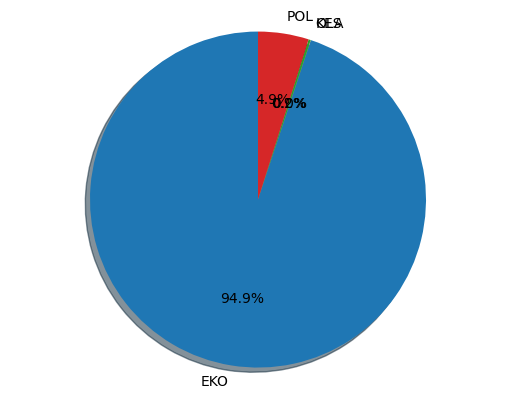

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



C:\Users\HP\AppData\Local\Temp\ipykernel_10472\1077503453.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediksi_rnn_berita['Hasil_Prediksi'][x]= 'EKONOMI'


'cara bayar zakat fitrah lewat tokopedia'

19/19 [==============================] - 0s 4ms/step


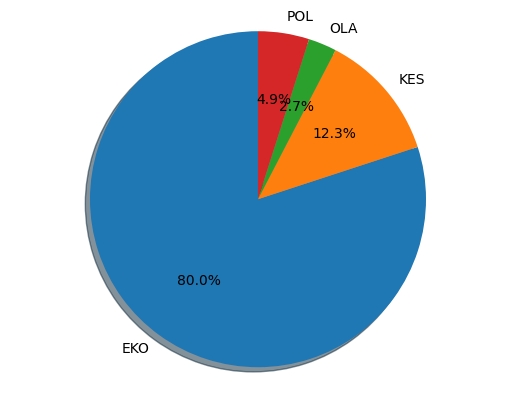

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'simak promo bsi jelang lebaran 2023'

19/19 [==============================] - 0s 3ms/step


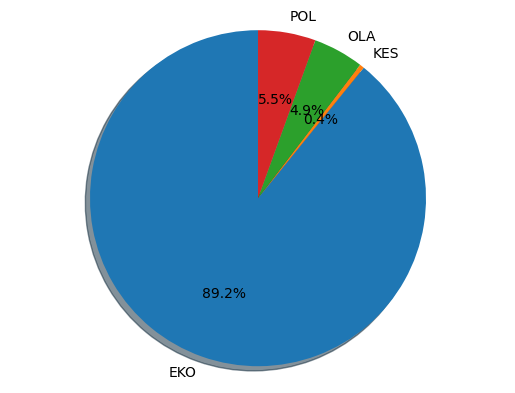

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'dubes ri untuk as kunjungan kongres as ke ri untuk memperkuat hubungan ekonomi'

19/19 [==============================] - 0s 4ms/step


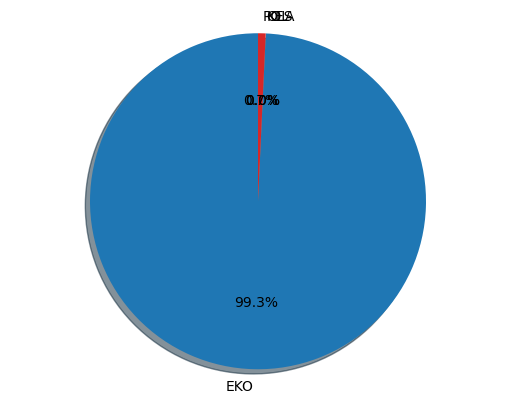

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'waspada banyak tawaran investasi bodong dan pinjol ilegal jelang lebaran'

19/19 [==============================] - 0s 3ms/step


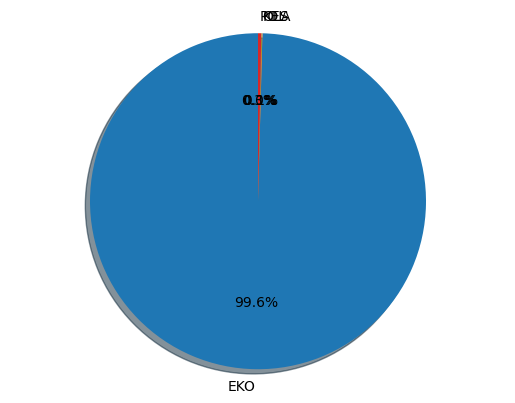

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'kementerian pupr masih tunggu usulan bujt soal diskon tarif tol saat mudik lebaran 2023'

19/19 [==============================] - 0s 4ms/step


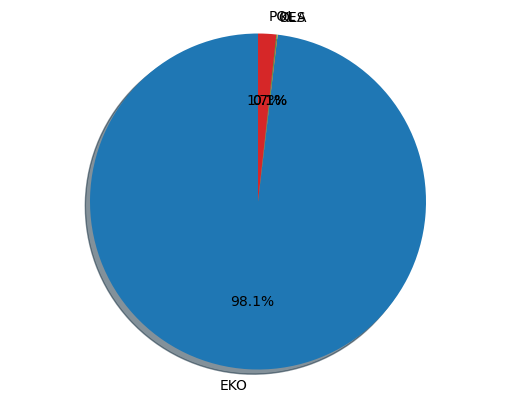

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'menteri pupr sebut stadion sudah siap jika ri jadi tuan rumah piala dunia u17'

19/19 [==============================] - 0s 4ms/step


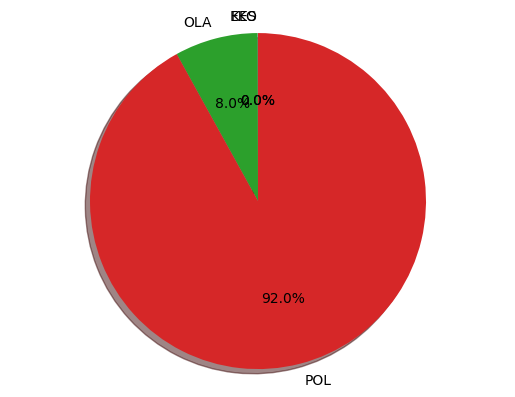

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



C:\Users\HP\AppData\Local\Temp\ipykernel_10472\1077503453.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediksi_rnn_berita['Hasil_Prediksi'][x]= 'POLITIK'


'ethereum hingga polygon melonjak lebih dari 5 persen simak rincian harga kripto hari ini'

19/19 [==============================] - 0s 3ms/step


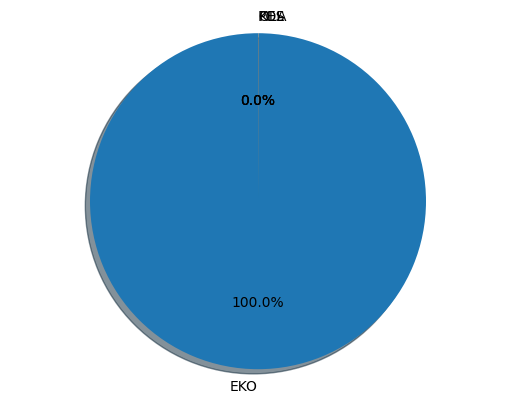

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'inggris denda tiktok rp 23794 miliar karena penyalahgunaan data pribadi'

19/19 [==============================] - 0s 4ms/step


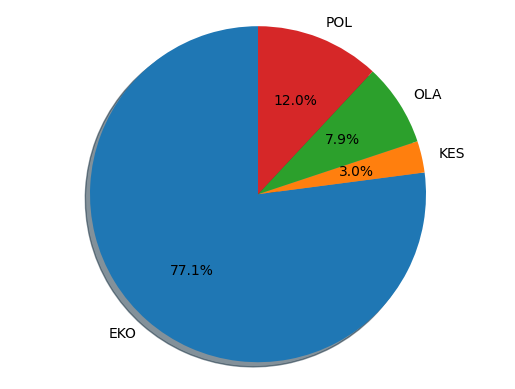

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'harga emas dunia menguat didorong data pelemahan ekonomi as'

19/19 [==============================] - 0s 3ms/step


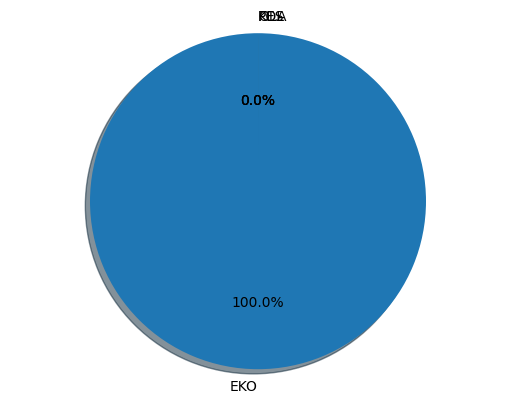

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'belum mampu bangkit ihsg dan rupiah melemah di awal perdagangan'

19/19 [==============================] - 0s 4ms/step


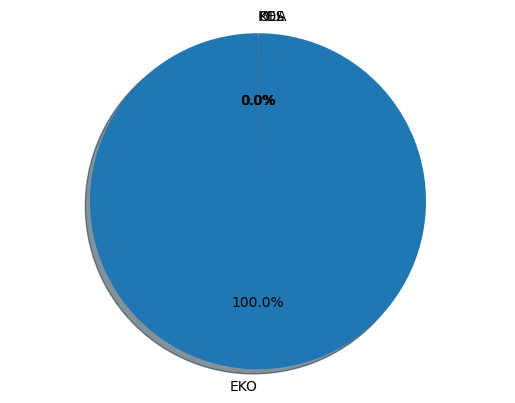

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'amazon phk lebih dari 100 karyawan di divisi video game'

19/19 [==============================] - 0s 3ms/step


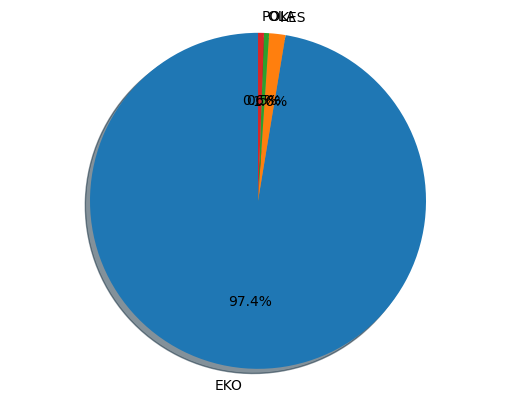

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'menavigasi dampak pemangkasan produksi minyak opec'

19/19 [==============================] - 0s 3ms/step


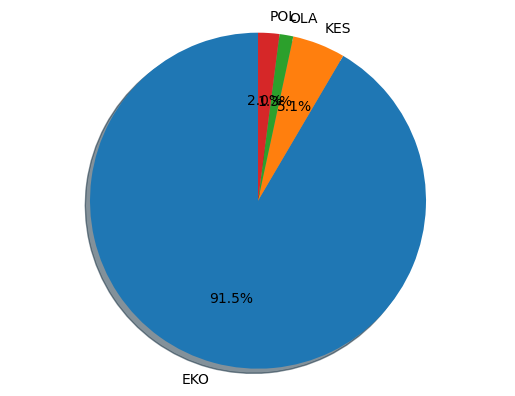

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'semakin berkilau harga emas antam naik rp 10000 per gram'

19/19 [==============================] - 0s 4ms/step


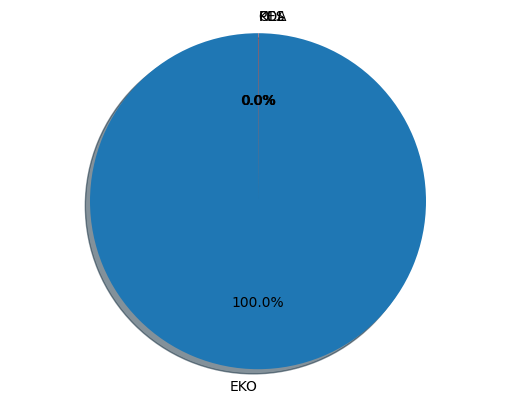

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'rapat dengan pertamina anggota dpr curhat susah minta sumbangan'

19/19 [==============================] - 0s 4ms/step


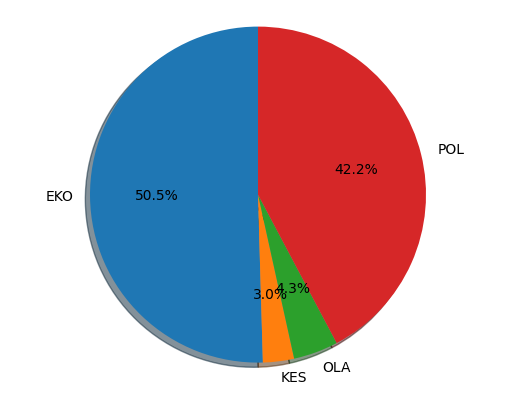

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'disubsidi pemerintah rp 7 juta sekian biaya konversi ke motor listrik'

19/19 [==============================] - 0s 3ms/step


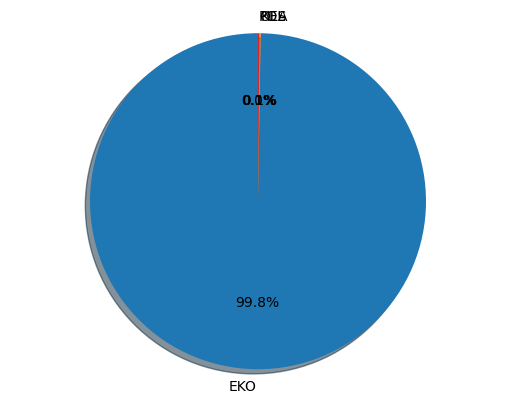

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'ihsg bakal menguat hari ini simak rekomendasi sahamnya'

19/19 [==============================] - 0s 4ms/step


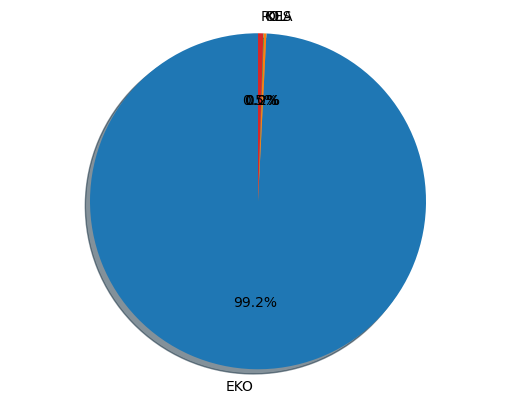

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'data ekonomi as lemah wall street berakhir di zona merah'

19/19 [==============================] - 0s 3ms/step


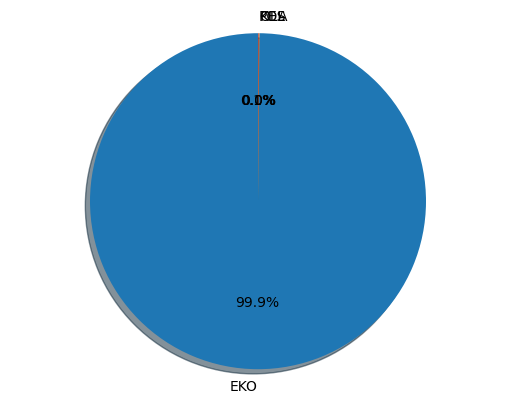

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'rincian harga emas hari ini di pegadaian dari 05 gram hingga 1 kg'

19/19 [==============================] - 0s 4ms/step


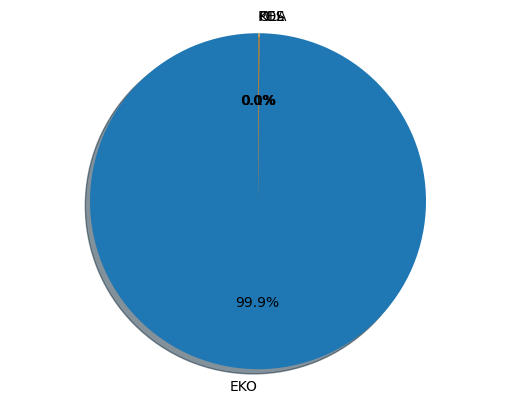

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'pedagang pasar harga cabai bisa naik 200 persen pada h7 lebaran'

19/19 [==============================] - 0s 4ms/step


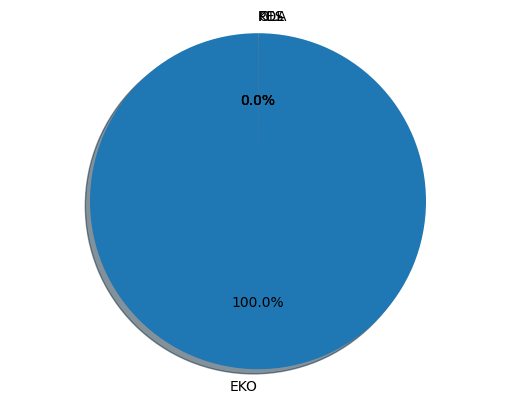

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'ini modus dugaan rafael dalam merampok uang negara'

19/19 [==============================] - 0s 3ms/step


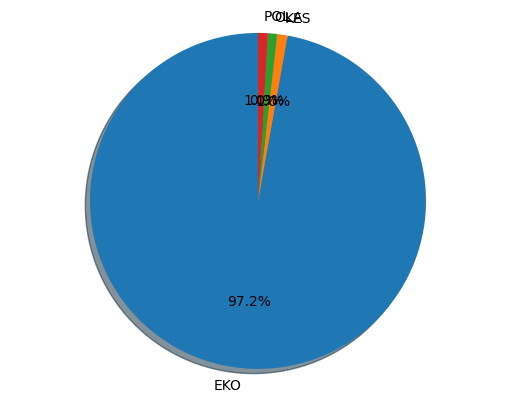

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'harga minyak dunia naik tipis dipicu kekhawatiran menurunnya permintaan'

19/19 [==============================] - 0s 4ms/step


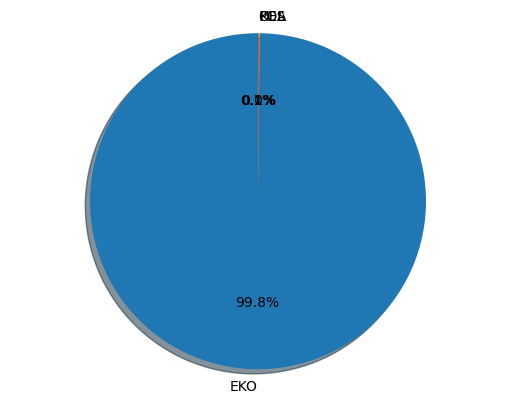

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'ini alasan pekerja otorita ikn belum digaji berbulanbulan'

19/19 [==============================] - 0s 3ms/step


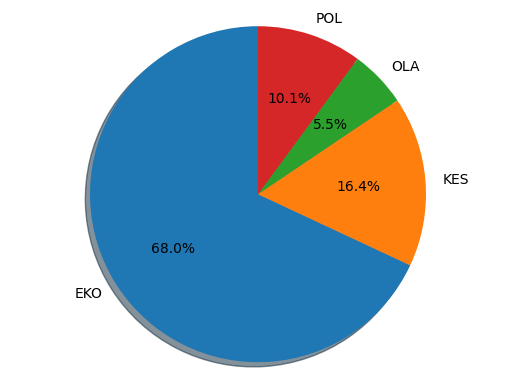

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'mendag peringatkan pelaku usaha jangan timbun dan mainkan harga sembako'

19/19 [==============================] - 0s 4ms/step


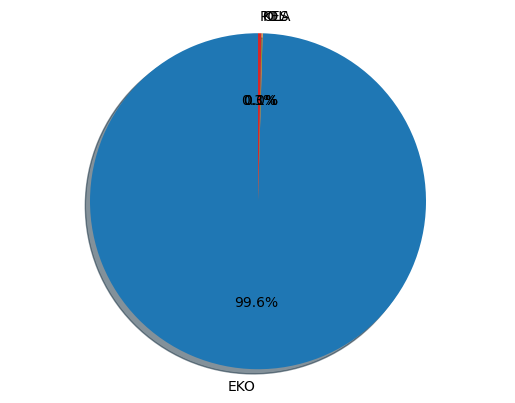

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'jadwal dan lokasi pasar murah di jakarta ada paket sembako rp 11000'

19/19 [==============================] - 0s 4ms/step


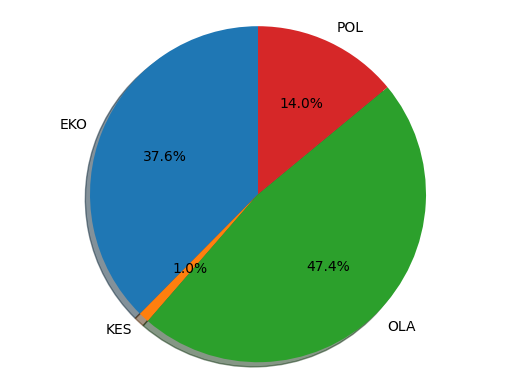

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



C:\Users\HP\AppData\Local\Temp\ipykernel_10472\1077503453.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediksi_rnn_berita['Hasil_Prediksi'][x]= 'OLAHRAGA'


'profil boenjamin setiawan dokter terkaya ri yang meninggal dunia'

19/19 [==============================] - 0s 4ms/step


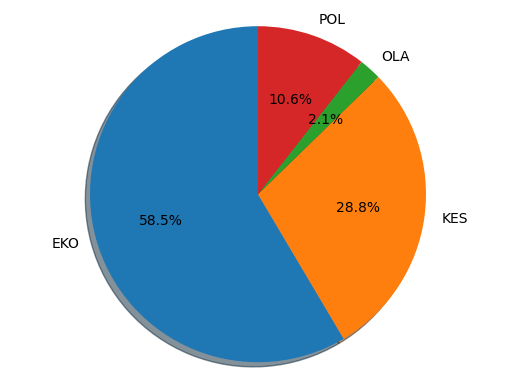

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'harapan menaker pengemudi ojol dikasih apresiasi walau tak dapat thr'

19/19 [==============================] - 0s 3ms/step


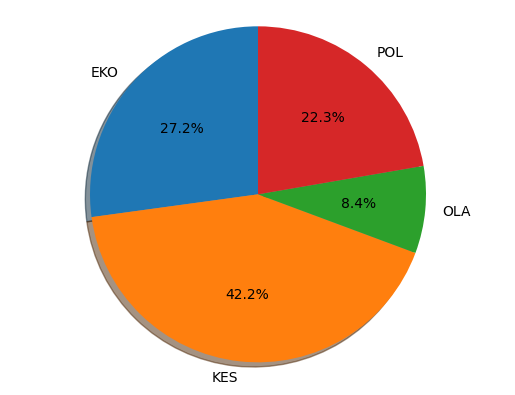

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



C:\Users\HP\AppData\Local\Temp\ipykernel_10472\1077503453.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediksi_rnn_berita['Hasil_Prediksi'][x]= 'KESEHATAN'


'pertamina janji perbaikan rumah warga akibat ledakan kilang dumai rampung sebelum lebaran'

19/19 [==============================] - 0s 3ms/step


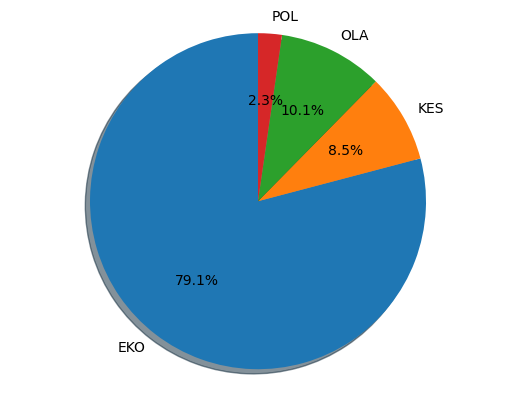

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'perusahaan antariksa milik miliarder inggris ajukan kebangkrutan'

19/19 [==============================] - 0s 3ms/step


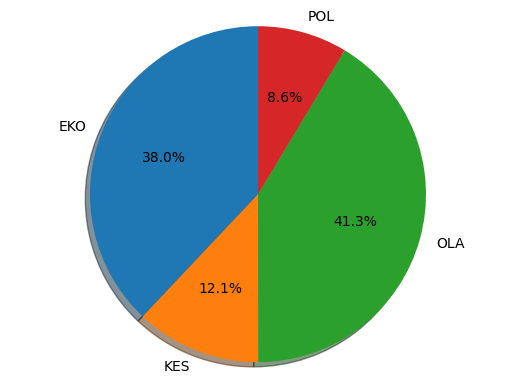

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'ketika menaker keberatan dilabeli menteri titipan pengusaha'

19/19 [==============================] - 0s 6ms/step


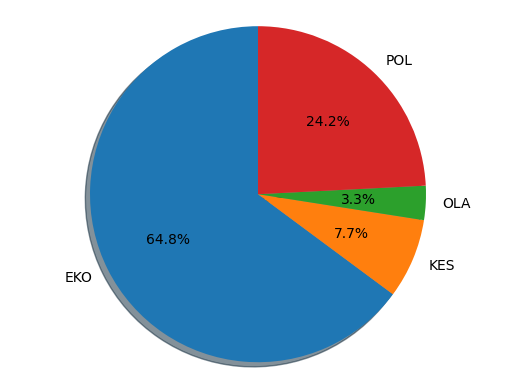

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'benarkah denny sumargo jadi ceo lion parcel ini penjelasan perusahaan'

19/19 [==============================] - 0s 3ms/step


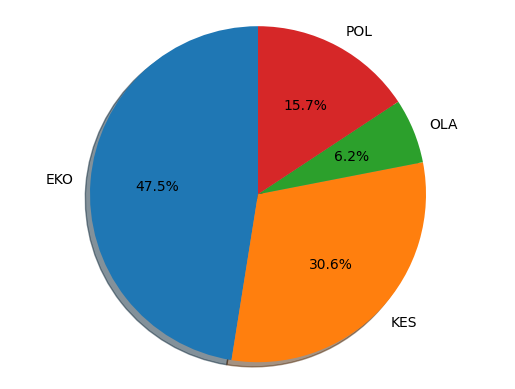

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'menaker bujuk pengusaha bayar thr lebih awal dan tidak dicicil'

19/19 [==============================] - 0s 3ms/step


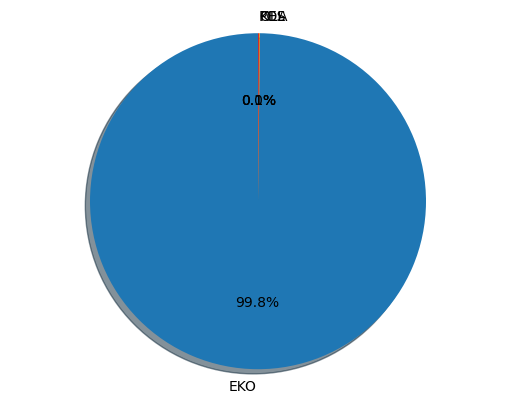

None

19/19 [==============================] - 0s 5ms/step
Best Prediction Adalah : Ekonomi 



'ojk sebut kredit macet di fintech lending terus melandai'

19/19 [==============================] - 0s 3ms/step


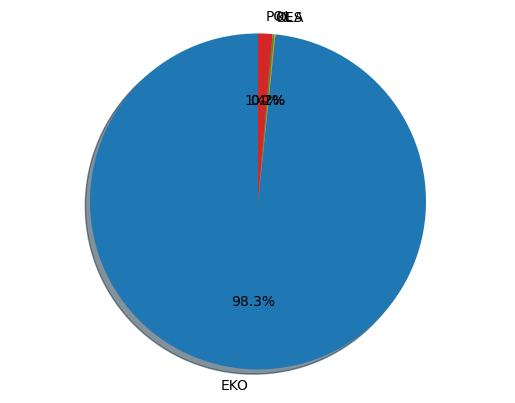

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'kemenhub pastikan bandara kertajati siap layani penerbangan charter umrah pada 15 april'

19/19 [==============================] - 0s 3ms/step


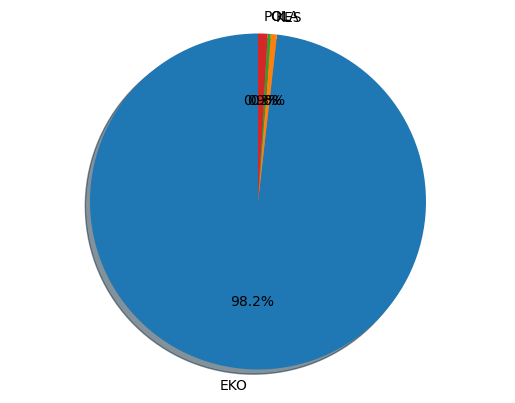

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'soal gagal bayar tanifund ojk perusahaan disanksi pendanaan yang macet diselesaikan'

19/19 [==============================] - 0s 3ms/step


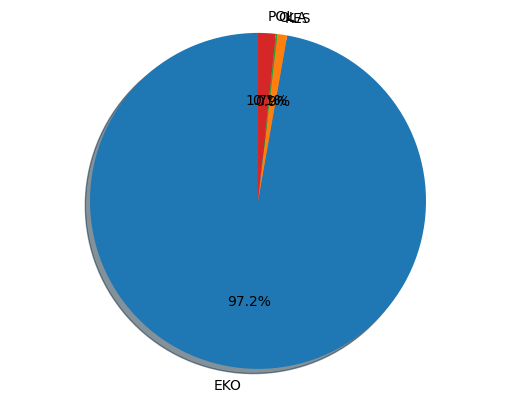

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'program sedekah energi listrik tenaga surya untuk rumah ibadah'

19/19 [==============================] - 0s 3ms/step


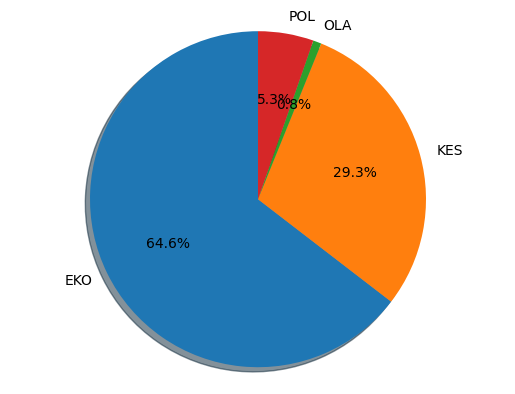

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'sepanjang 2022 agincourt resources rehabilitasi 346 hektar lahan tambang'

19/19 [==============================] - 0s 4ms/step


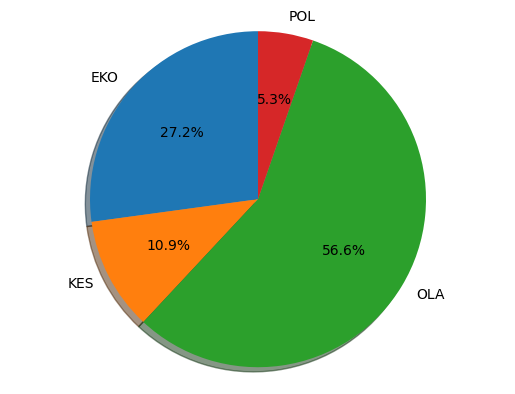

None

19/19 [==============================] - 0s 2ms/step
Best Prediction Adalah : Olahraga 



'tampil di incosmetics 2023 spanyol indonesia raup potensi transaksi rp 193 miliar'

19/19 [==============================] - 0s 2ms/step


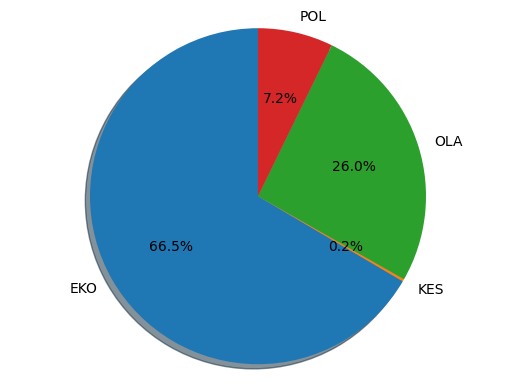

None

19/19 [==============================] - 0s 2ms/step
Best Prediction Adalah : Ekonomi 



'kemenperin gandeng gapmmi boyong 31 perusahaan mamin tampil di hannover messe 2023'

19/19 [==============================] - 0s 2ms/step


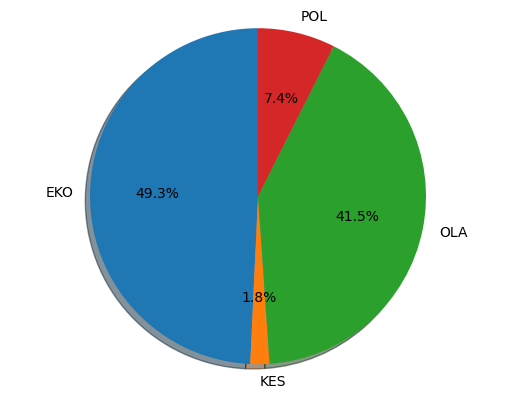

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'indodax tawarkan sejumlah fitur baru untuk permudah transaksi kripto'

19/19 [==============================] - 0s 3ms/step


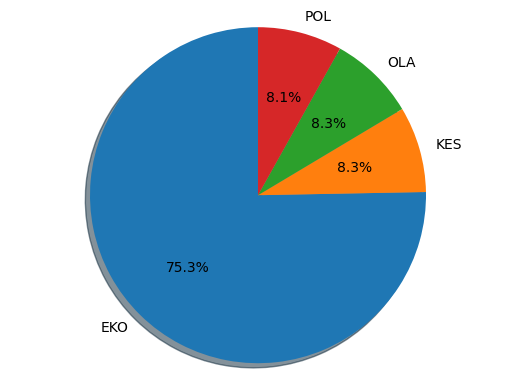

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'kronologi dugaan tppu emas batangan ilegal rp 189 triliun di bea cukai versi kemenkeu'

19/19 [==============================] - 0s 4ms/step


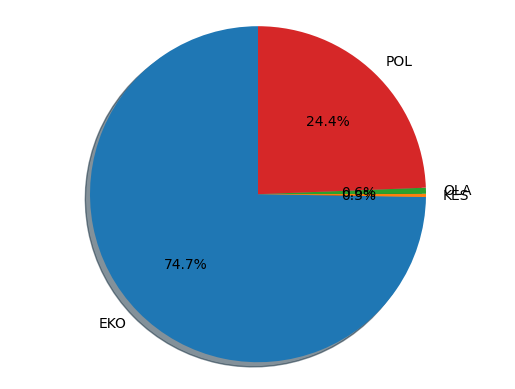

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'cara daftar mitra driver lalamove'

19/19 [==============================] - 0s 4ms/step


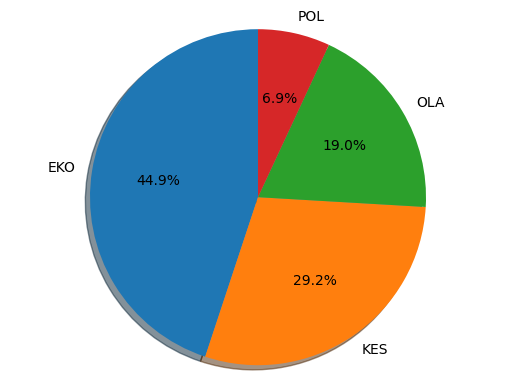

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'otorita ikn beberapa bulan ke depan ada investor mulai investasi di ikn'

19/19 [==============================] - 0s 4ms/step


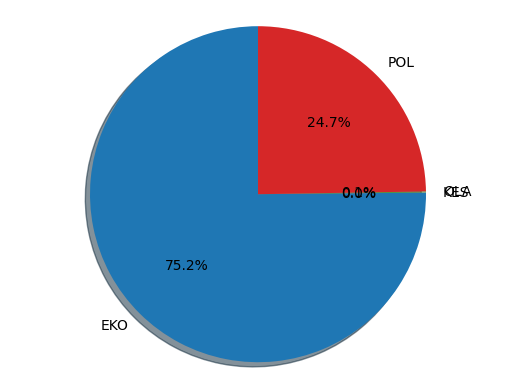

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'dalam sebulan fasilitas pertamina meledak 2 kali wapres maruf perbaiki tata kelola'

19/19 [==============================] - 0s 3ms/step


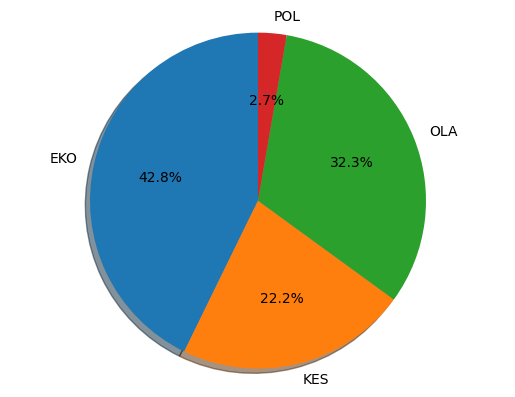

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'resmi stock split kini saham bank mandiri diperdagangkan di kisaran rp 5200'

19/19 [==============================] - 0s 3ms/step


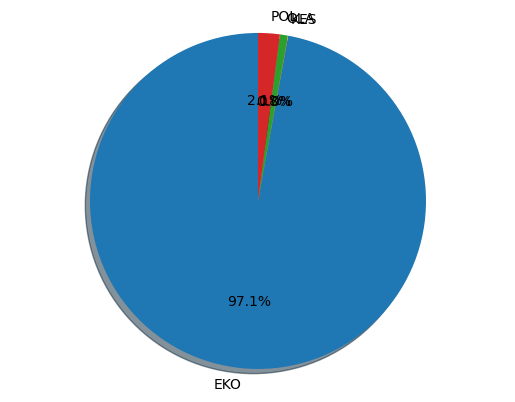

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'sering berbeda data produksi beras kementan tegaskan kutip data bps'

19/19 [==============================] - 0s 3ms/step


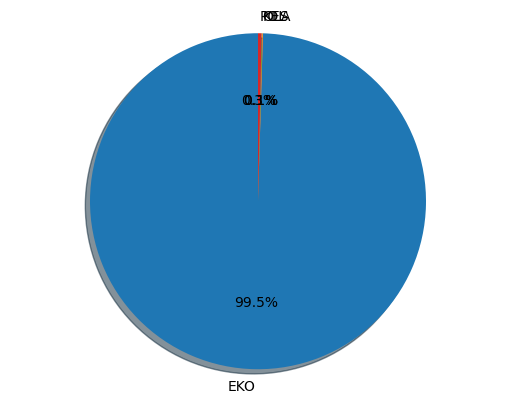

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'bank bjb tebar dividen rp 11 triliun'

19/19 [==============================] - 0s 3ms/step


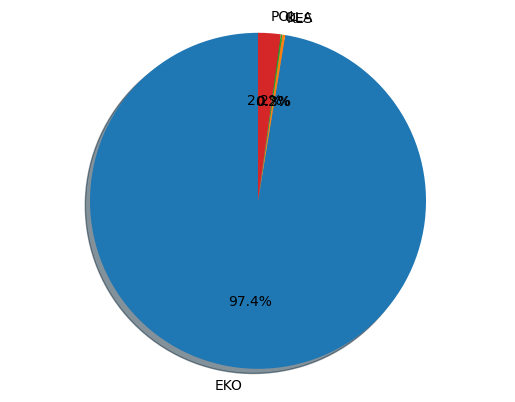

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'undangundang yang mengatur tentang bumn uu nomor 19 tahun 2003'

19/19 [==============================] - 0s 3ms/step


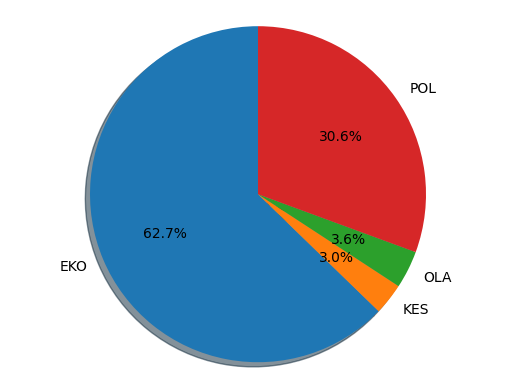

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'bsi siapkan uang tunai rp 376 triliun untuk hadapi mudik lebaran 2023'

19/19 [==============================] - 0s 3ms/step


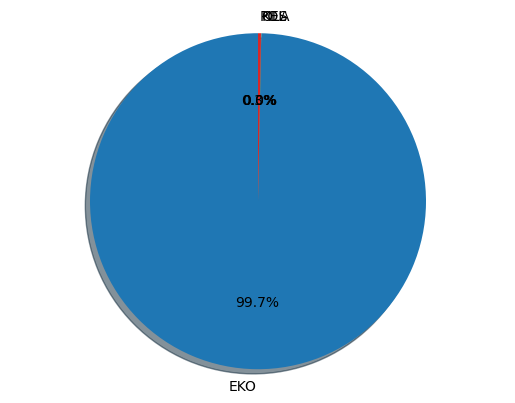

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'bpjs kesehatan uji coba kelas rawat inap standar rumah sakit diminta harus berbenah'

19/19 [==============================] - 0s 4ms/step


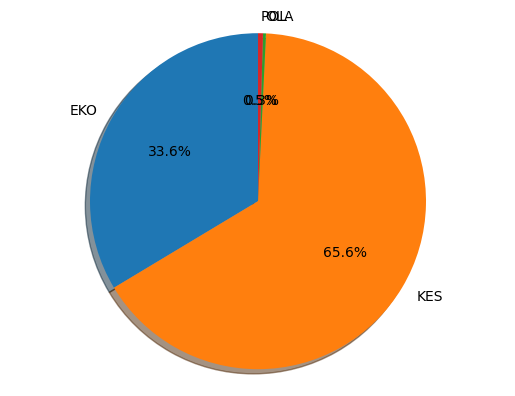

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'dirut bni ingin bangun sistem pembayaran hingga pendanaan pembangunan di ikn'

19/19 [==============================] - 0s 4ms/step


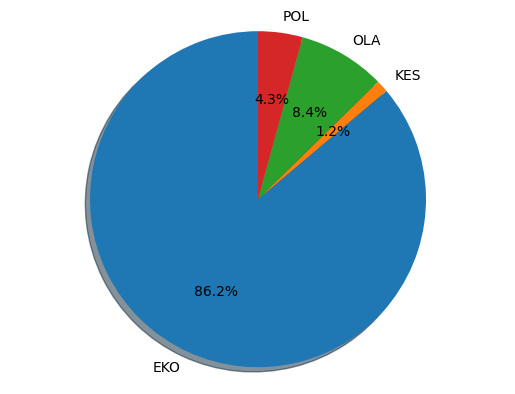

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'realisasi anggaran ojk capai 262 persen pada kuartal i2023'

19/19 [==============================] - 0s 5ms/step


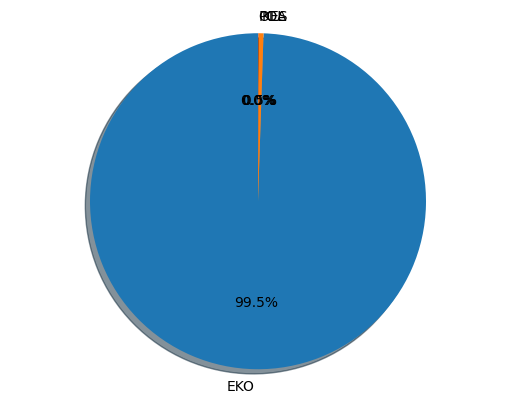

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'jenisjenis bumn berdasarkan klasifikasi usahanya'

19/19 [==============================] - 0s 3ms/step


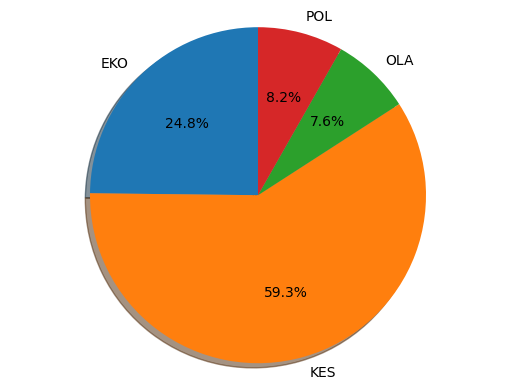

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'mentan syl harap pembenahan saluran irigasi di blitar dongkrak indeks pertanaman'

19/19 [==============================] - 0s 3ms/step


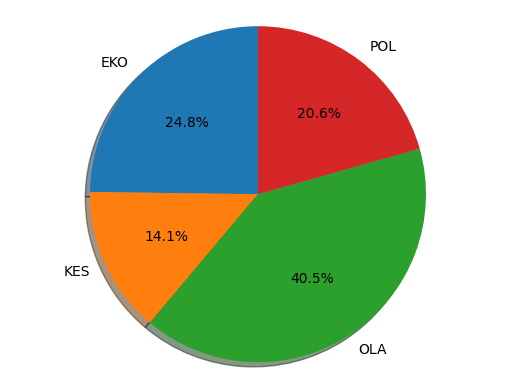

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'rapat soal kebakaran kilang dpr singgung soal sedekah pertamina ke dapil'

19/19 [==============================] - 0s 3ms/step


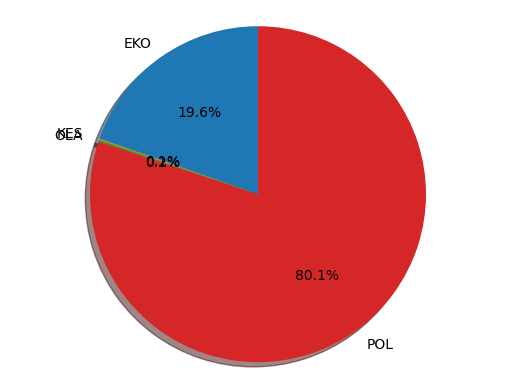

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'laba bersih nicl naik 230 persen jadi rp 150 miliar pada 2022'

19/19 [==============================] - 0s 4ms/step


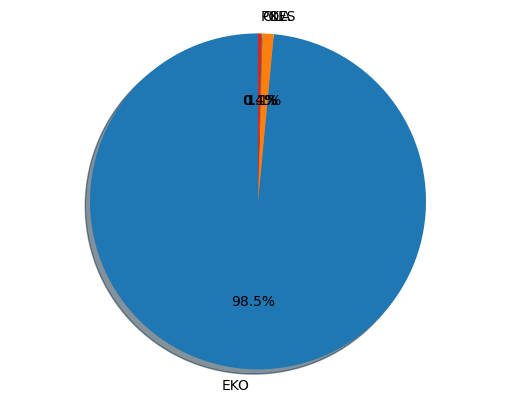

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'berhadiah motor listrik pemerintah gelar sayembara logo ikn'

19/19 [==============================] - 0s 3ms/step


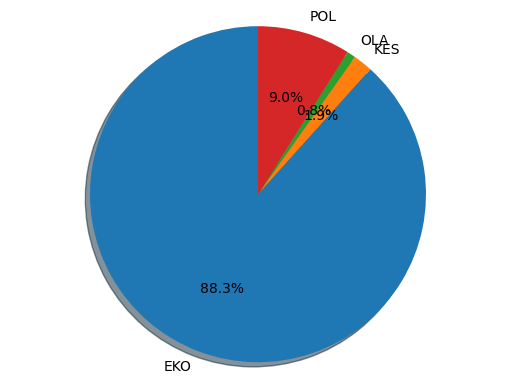

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'dirut pertamina ungkap 4 pemicu terbakarnya kilang minyak'

19/19 [==============================] - 0s 4ms/step


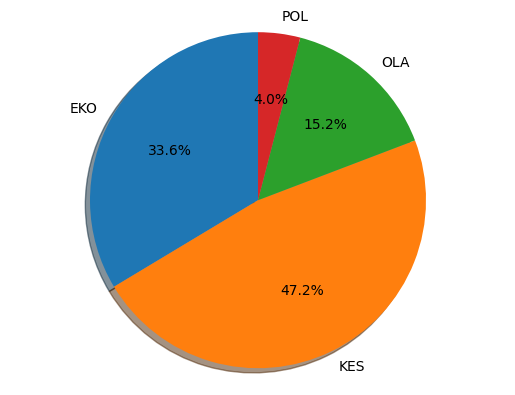

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'duduk perkara transaksi dugaan tppu senilai rp 189 triliun di bea cukai'

19/19 [==============================] - 0s 3ms/step


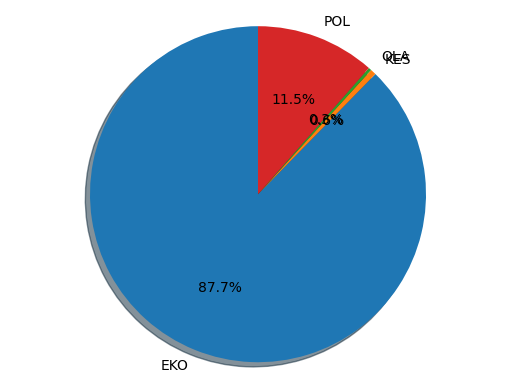

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'mendag kalau mau murah beli beras bulog'

19/19 [==============================] - 0s 3ms/step


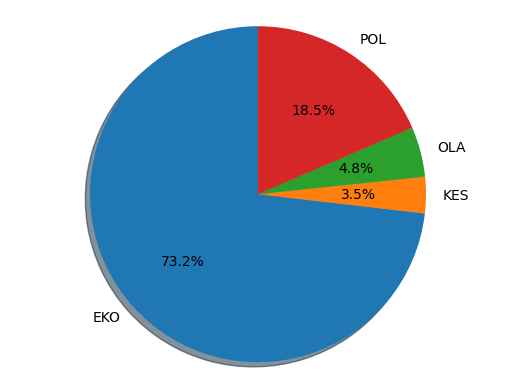

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'ojk targetkan 34 pojk turunan uu ppsk rampung tahun ini'

19/19 [==============================] - 0s 4ms/step


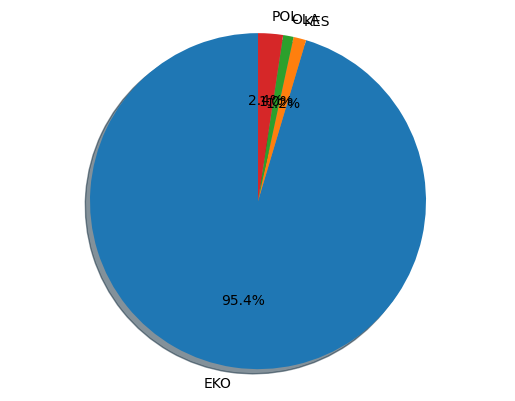

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'bifast kerap alami gangguan asosiasi sistem pembayaran beberkan penyebabnya'

19/19 [==============================] - 0s 3ms/step


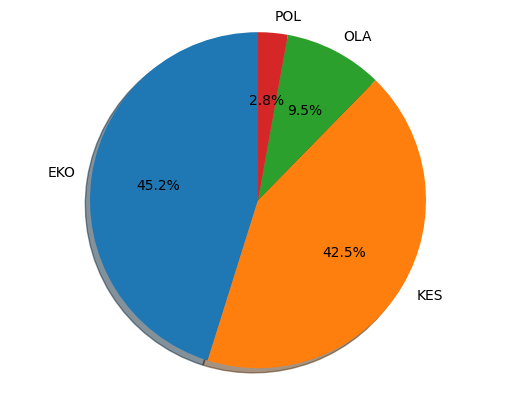

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'luhut ajak ketua komisi pembangunan china zheng shanjie lihat langsung proyek kcjb dan ikn'

19/19 [==============================] - 0s 3ms/step


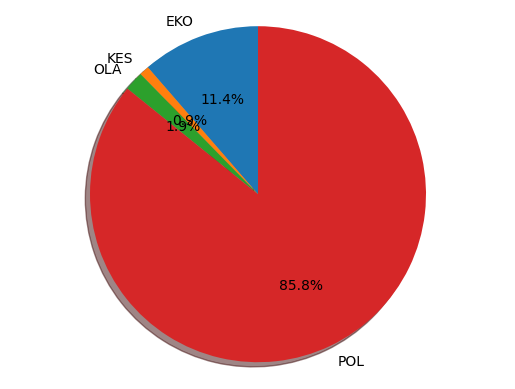

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'simak cara transfer bca ke dana dan sebaliknya'

19/19 [==============================] - 0s 4ms/step


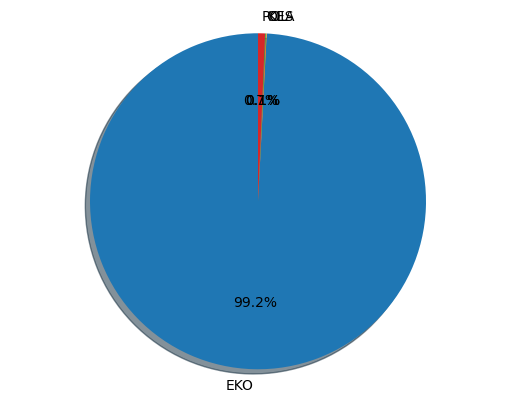

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'investasi asing di batam naik 485 persen proyeknya capai 1738'

19/19 [==============================] - 0s 4ms/step


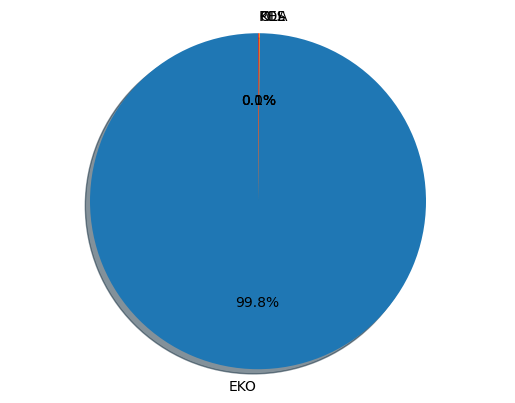

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'ihsg dan rupiah parkir di zona hijau sore ini'

19/19 [==============================] - 0s 4ms/step


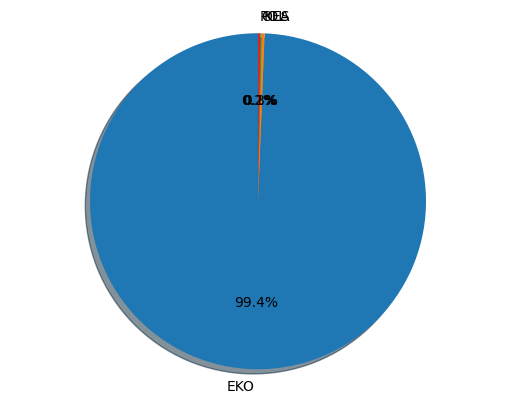

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'minat pengguna kartu debit gpn kian berkurang ini alasannya'

19/19 [==============================] - 0s 3ms/step


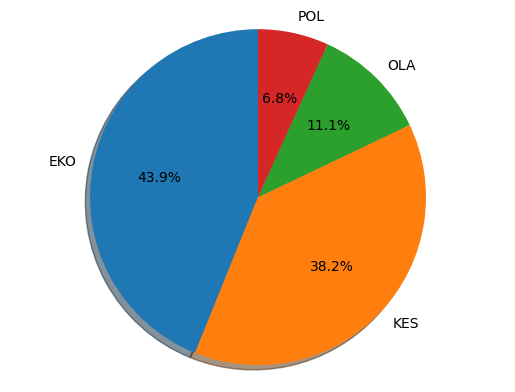

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'cek diskon dan promo harga tiket hingga akomodasi untuk lebaran 2023 di tiketcom'

19/19 [==============================] - 0s 3ms/step


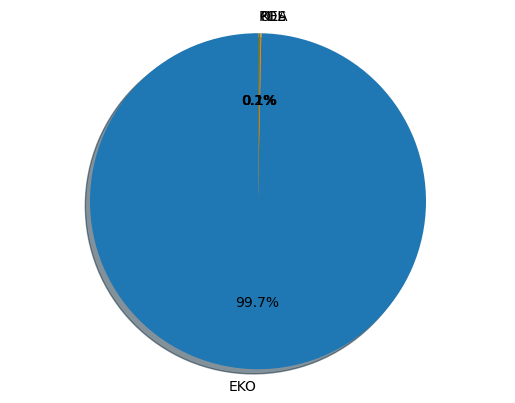

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'kementerian bumn rombak direksi jasa raharja berikut susunan barunya'

19/19 [==============================] - 0s 3ms/step


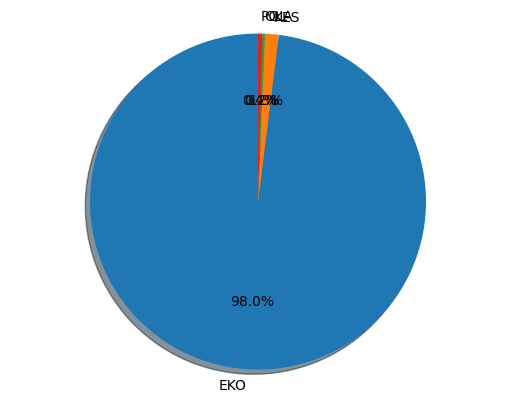

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'marak investasi bodong bappebti perkuat literasi perdagangan berjangka komoditi'

19/19 [==============================] - 0s 4ms/step


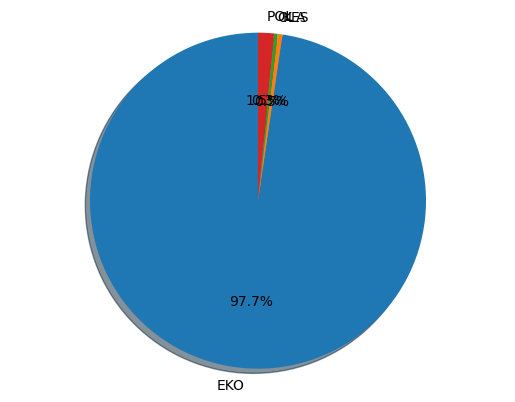

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'penangkapan ikan terukur diminati investor asing kkp siapkan aturan turunan pp 112023'

19/19 [==============================] - 0s 4ms/step


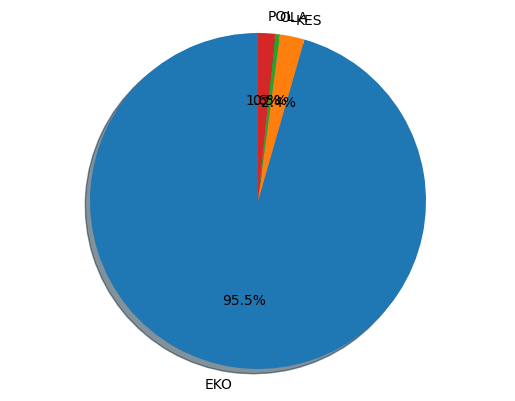

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'cek rekening thr asn 2023 cair mulai hari ini'

19/19 [==============================] - 0s 4ms/step


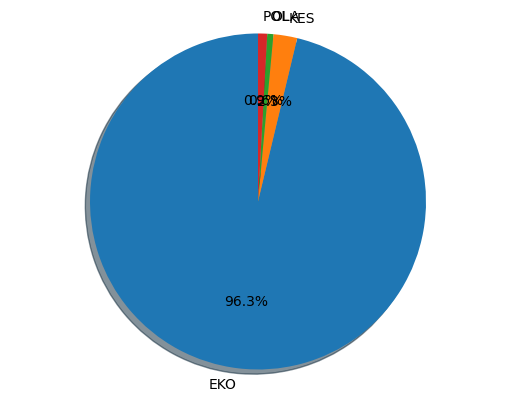

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'ojk terima 4852 pengaduan konsumen sampai maret 2023 paling banyak dari sektor iknb'

19/19 [==============================] - 0s 3ms/step


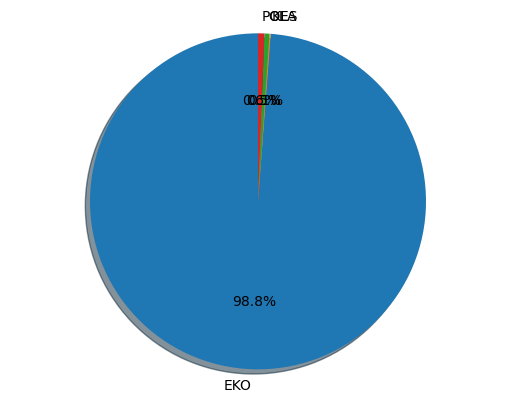

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'promo blibli ada diskon 90 persen hingga 14 april 2023'

19/19 [==============================] - 0s 3ms/step


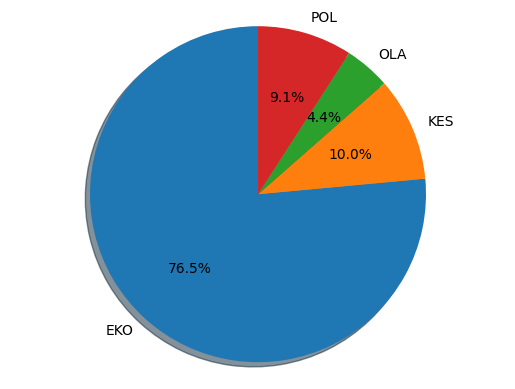

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'harga garam naik lebih dari 100 persen mendag zulhas garagara permintaan tinggi'

19/19 [==============================] - 0s 4ms/step


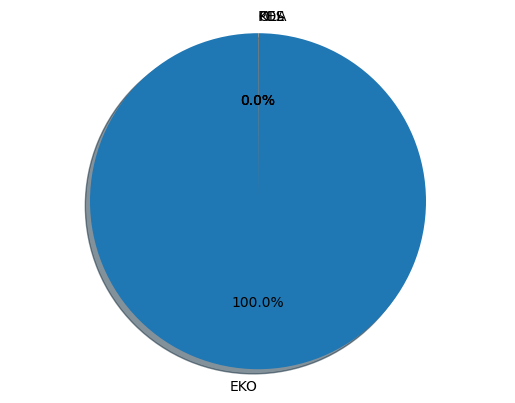

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'pertamina ungkap kronologi ledakan di kilang dumai ada kebocoran pipa hidrogen'

19/19 [==============================] - 0s 3ms/step


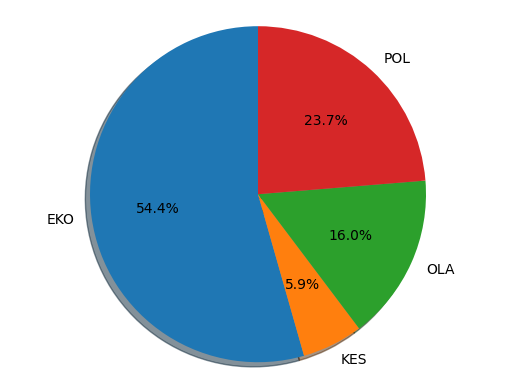

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'beda kata mahfud md vs kemenkeu di kasus tppu rp 189 triliun bea cukai soal impor atau ekspor emas'

19/19 [==============================] - 0s 3ms/step


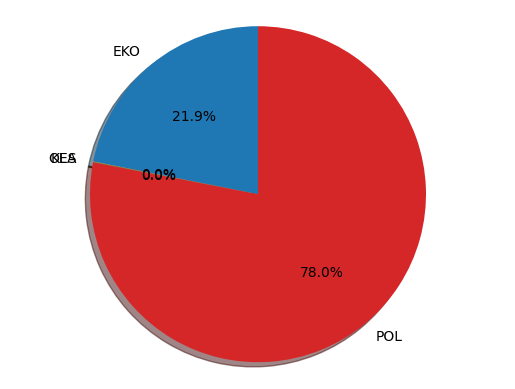

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'tumbuh 3195 persen laba rukun raharja capai 1083 juta dollar as pada 2022'

19/19 [==============================] - 0s 3ms/step


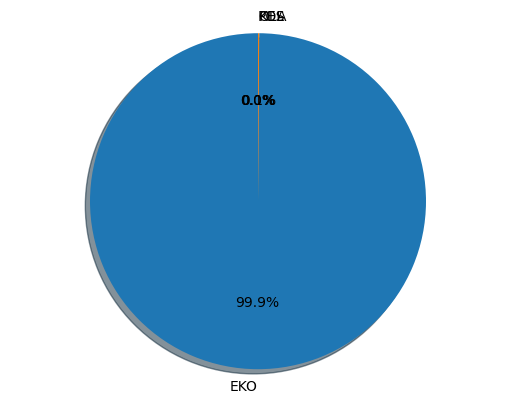

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'lahan pertanian lampung terendam banjir hingga puso mentan syl imbau petani ikut program autp'

19/19 [==============================] - 0s 4ms/step


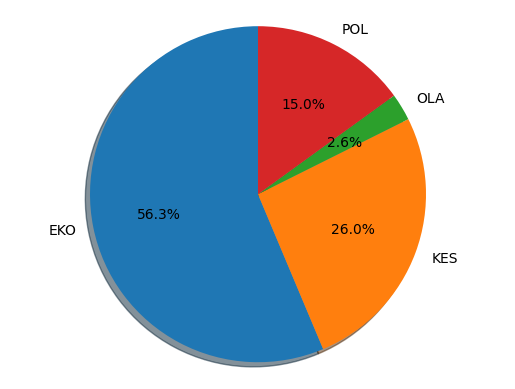

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'ojk beri waktu tambahan kresna life kumpulkan persetujuan pemegang polis'

19/19 [==============================] - 0s 4ms/step


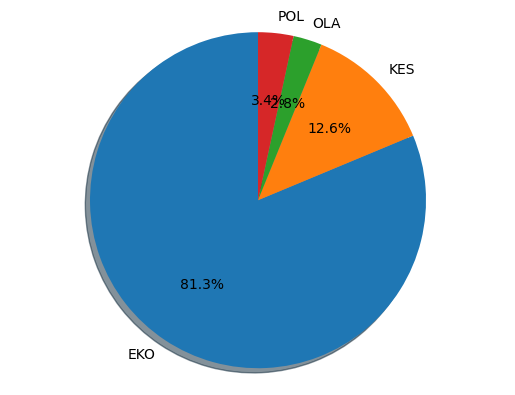

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'kadin desak as adil soal subsidi hijau mineral kendaraan listrik'

19/19 [==============================] - 0s 4ms/step


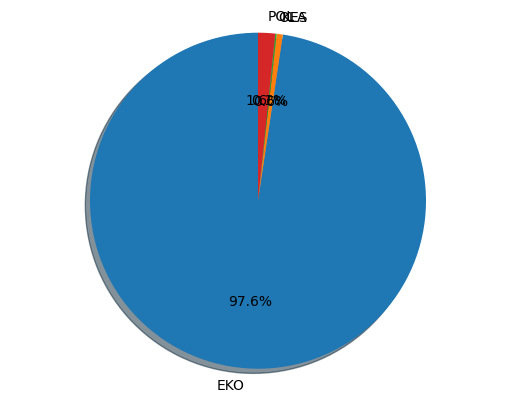

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'ipo amman mineral dikabarkan tertunda ojk masih berlanjut'

19/19 [==============================] - 0s 2ms/step


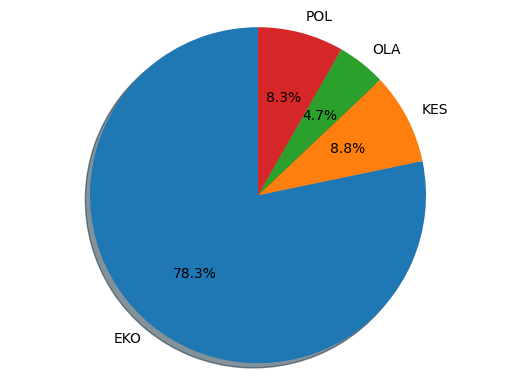

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'cara mengambil barang yang tertinggal di grabcar'

19/19 [==============================] - 0s 3ms/step


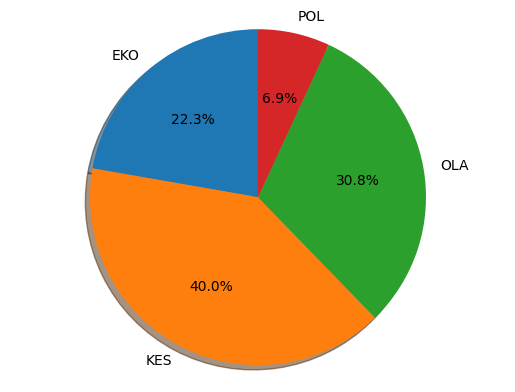

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'operasional kereta bandara turun 35 persen selama lebaran ini sebabnya'

19/19 [==============================] - 0s 4ms/step


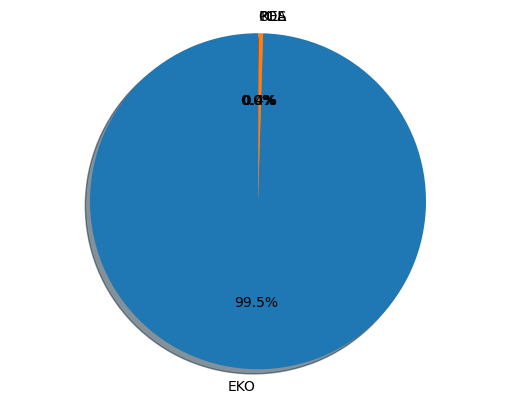

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'ojk proyeksikan proses merger bank mnc dan bank nobu rampung agustus 2023'

19/19 [==============================] - 0s 4ms/step


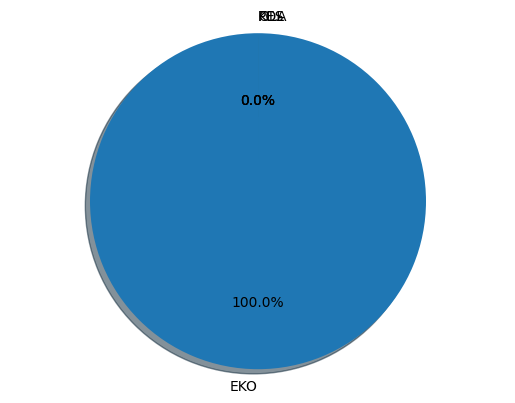

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'278 juta kendaraan diprediksi tinggalkan jabotabek pada h7 lebaran'

19/19 [==============================] - 0s 4ms/step


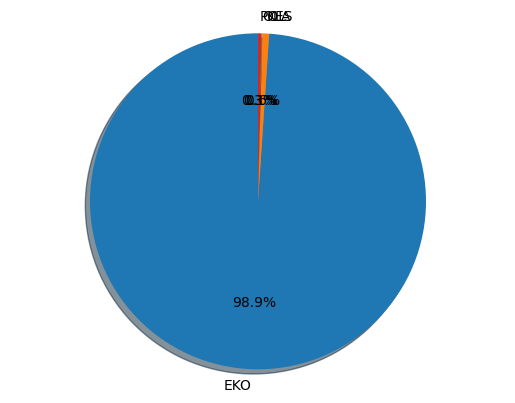

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'upaya selesaikan kasusnya indosurya life serahkan policyholders bail out ke ojk'

19/19 [==============================] - 0s 3ms/step


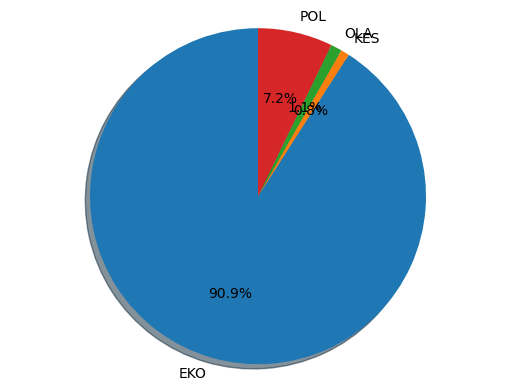

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'bei masih ada 44 perusahaan antre listing di bursa'

19/19 [==============================] - 0s 3ms/step


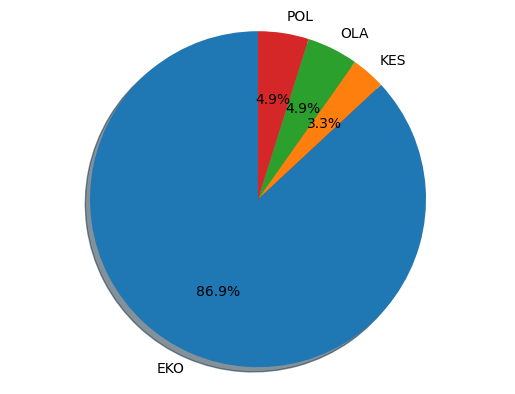

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'lowongan kerja bumn pt twc simak posisi dan persyaratannya'

19/19 [==============================] - 0s 4ms/step


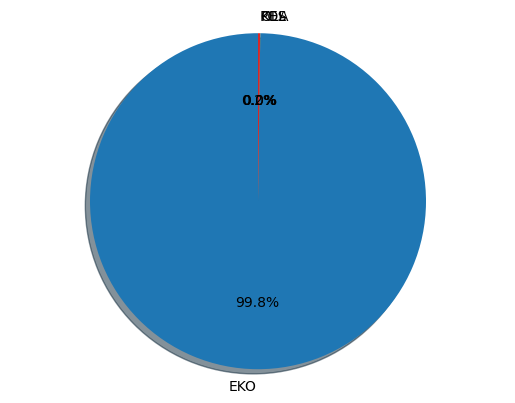

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'sambut lebaran 2023 bca siapkan uang tunai rp 6948 triliun'

19/19 [==============================] - 0s 4ms/step


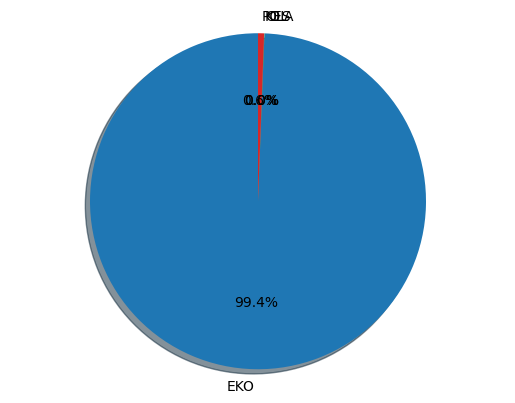

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'mudik 2023 ini skenario jasa marga antisipasi kepadatan di tol layang mbz'

19/19 [==============================] - 0s 4ms/step


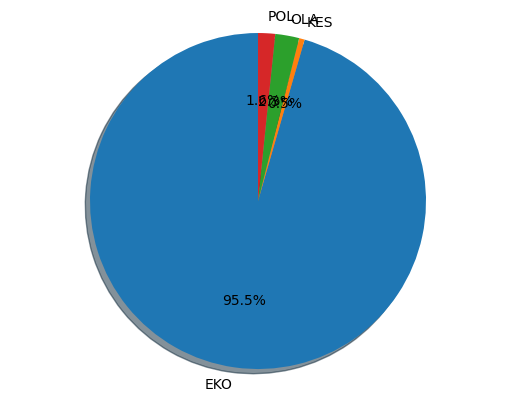

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'simak rincian kurs rupiah hari ini di bca hingga bank mandiri'

19/19 [==============================] - 0s 4ms/step


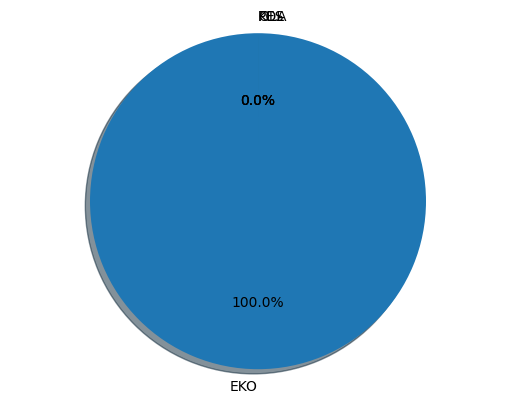

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'sandiaga targetkan perputaran ekonomi lebaran 2023 hingga rp 150 triliun'

19/19 [==============================] - 0s 3ms/step


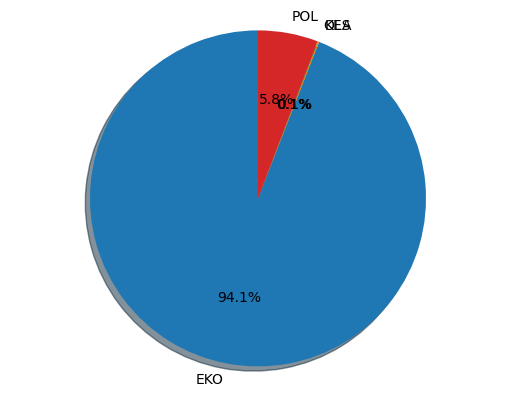

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'skk migas pastikan ledakan kilang dumai tak berdampak ke kegiatan lifting'

19/19 [==============================] - 0s 3ms/step


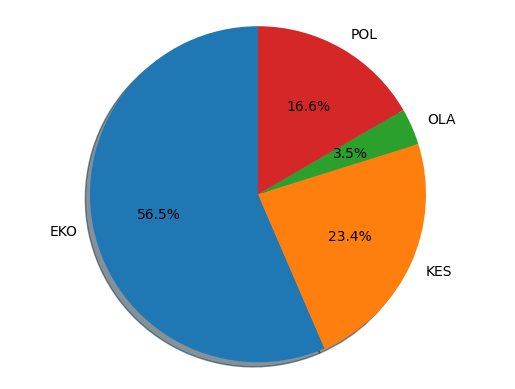

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'minat masyarakat terhadap asuransi jiwa meningkat aaji perluas literasi dengan dirikan studio podcast'

19/19 [==============================] - 0s 4ms/step


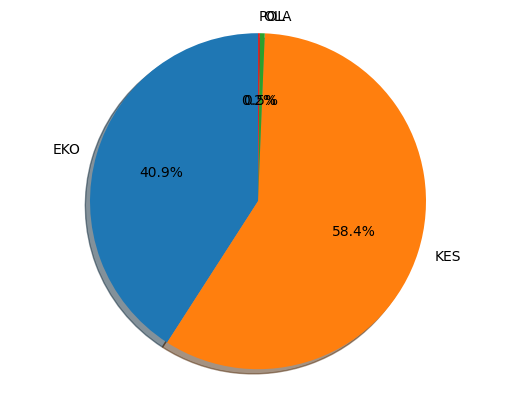

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'buka lelang impor beras bos bulog 4 negara sudah menawarkan'

19/19 [==============================] - 0s 4ms/step


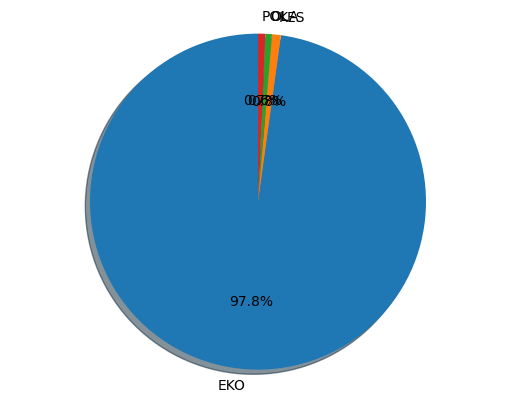

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'emas antam naik rp 5000 simak rincian harganya'

19/19 [==============================] - 0s 4ms/step


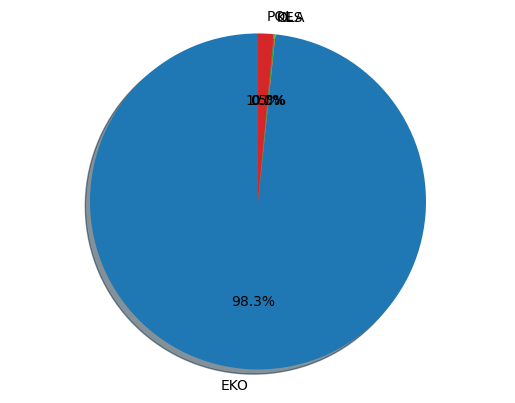

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'ojk sebut ada 107 rencana ipo di bursa efek sebesar rp 12383 triliun'

19/19 [==============================] - 0s 3ms/step


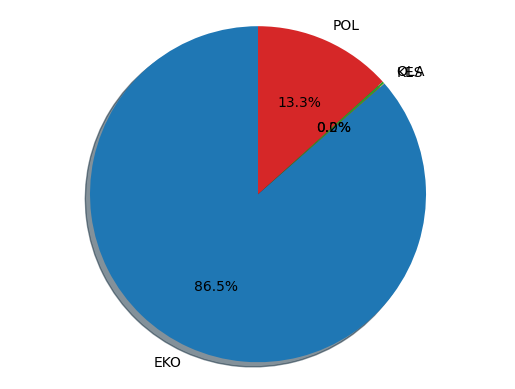

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'ihsg awal sesi lanjutkan kenaikan rupiah menguat jauhi level 15000'

19/19 [==============================] - 0s 3ms/step


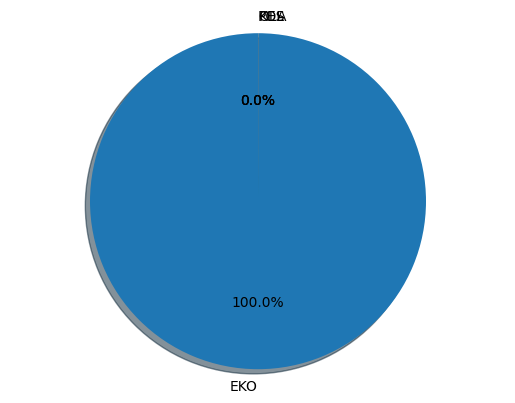

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'11 perusahaan asuransi dalam pengawasan khusus ojk'

19/19 [==============================] - 0s 4ms/step


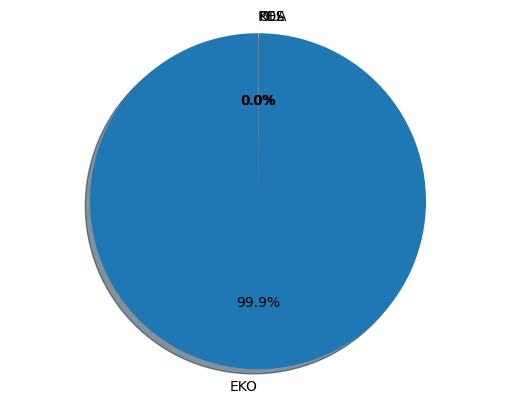

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'opec pangkas produksi minyak harga emas dunia tembus 2000 dollar as'

19/19 [==============================] - 0s 3ms/step


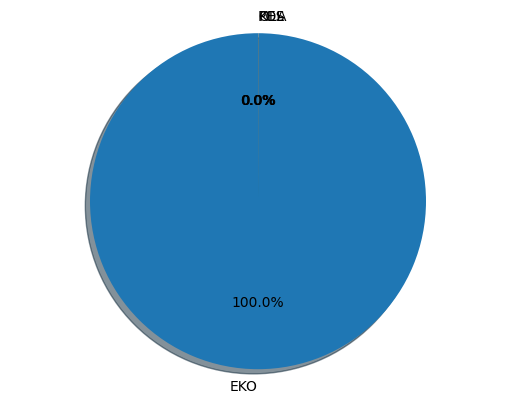

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'impor beras 500000 ton dan pesan jokowi ke bulog'

19/19 [==============================] - 0s 4ms/step


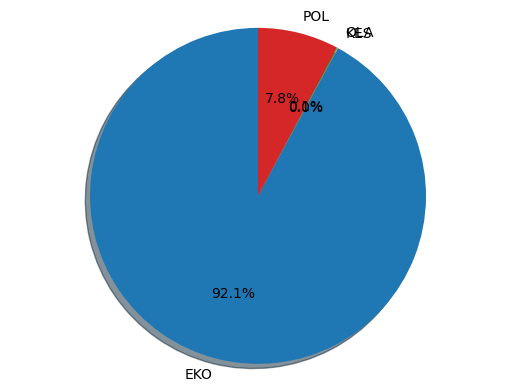

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'opec pangkas produksi harga minyak dunia melonjak 6 persen'

19/19 [==============================] - 0s 3ms/step


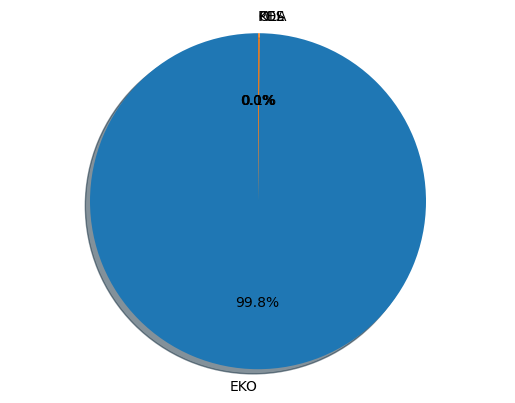

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'elon musk ubah logo twitter jadi anjing shiba inu dogecoin melonjak lebih dari 30 persen'

19/19 [==============================] - 0s 4ms/step


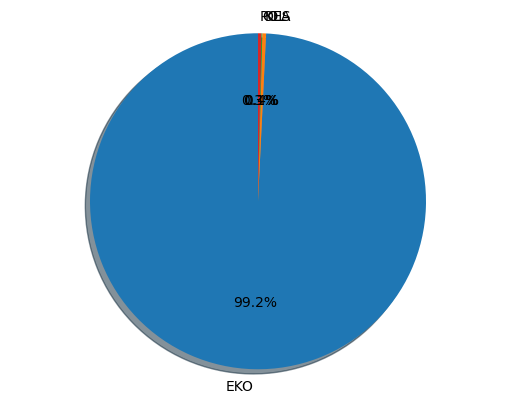

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'ihsg hari ini diproyeksi masih bisa lanjutkan penguatan simak rekomendasi sahamnya'

19/19 [==============================] - 0s 4ms/step


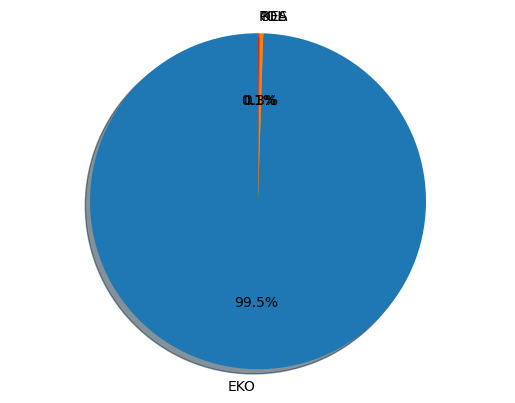

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'wall street bertahan di tengah rencana pemangkasan produksi minyak opec'

19/19 [==============================] - 0s 4ms/step


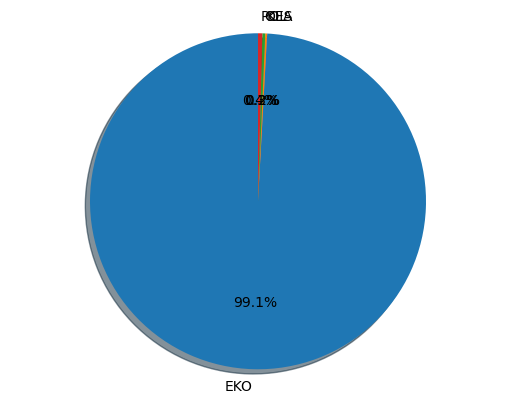

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'lantik mantan wakil ketua kpk jadi ketua komwasjak sri mulyani komitmen memperkuat sektor perpajakan'

19/19 [==============================] - 0s 3ms/step


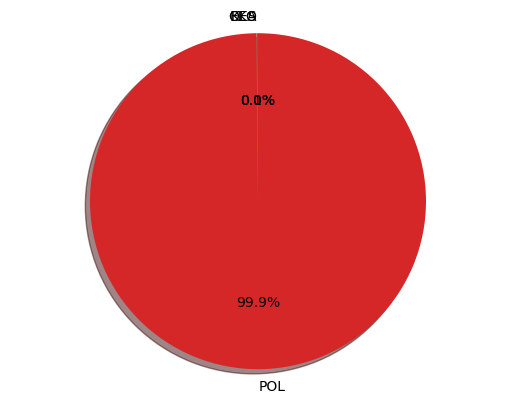

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'rupiah diproyeksi kembali menguat setelah kemarin ditutup di bawah level 15000'

19/19 [==============================] - 0s 3ms/step


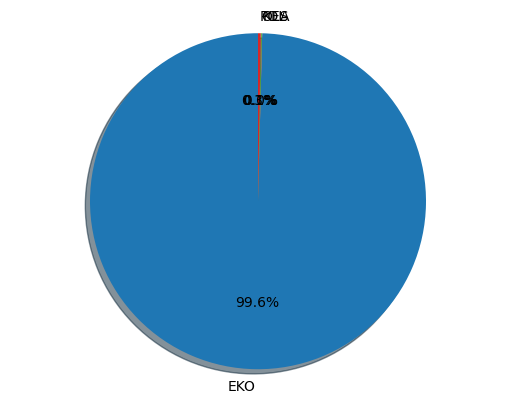

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'populer money bea cukai soal dugaan pencucian uang ekspor emas rp 189 triliun indofood soal viral video es krim rasa indomie goreng'

19/19 [==============================] - 0s 4ms/step


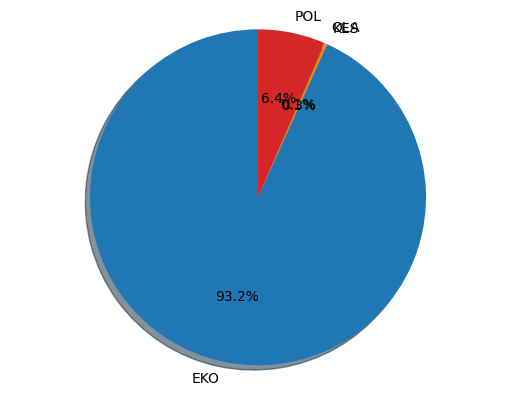

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'pt telkom merupakan salah satu bumn yang berbentuk perseroan'

19/19 [==============================] - 0s 4ms/step


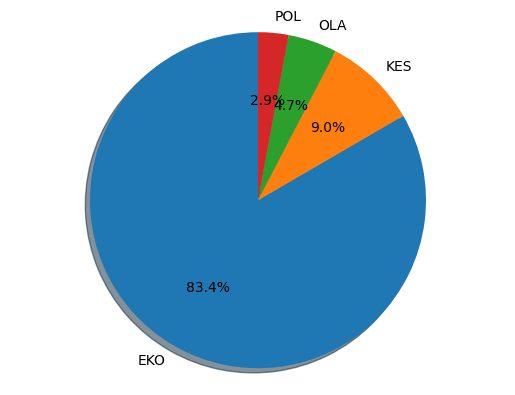

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'141 juta tiket kereta mudik lebaran sudah terjual paling laris h2 dan h2'

19/19 [==============================] - 0s 4ms/step


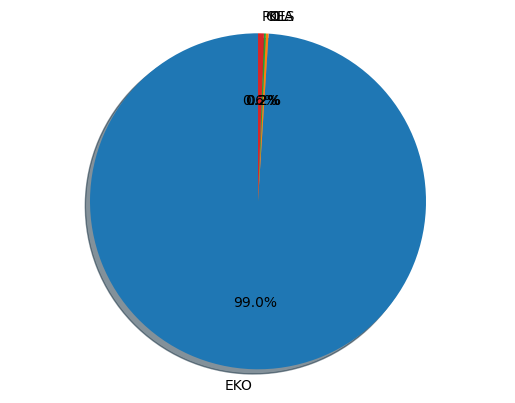

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'ultra voucher catat laba rp 118 miliar tahun 2022'

19/19 [==============================] - 0s 4ms/step


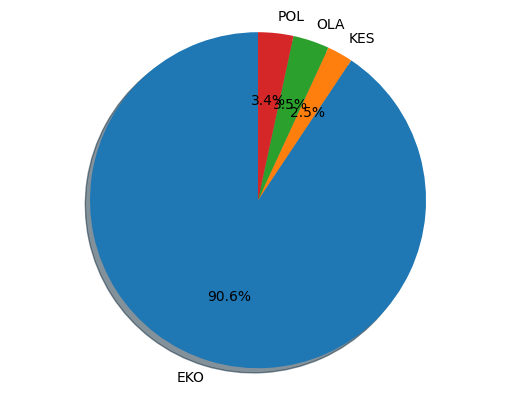

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'viral di medsos pmi ilegal di suriah mengaku dijual sakit dan pengin pulang ini tanggapan kemenaker'

19/19 [==============================] - 0s 4ms/step


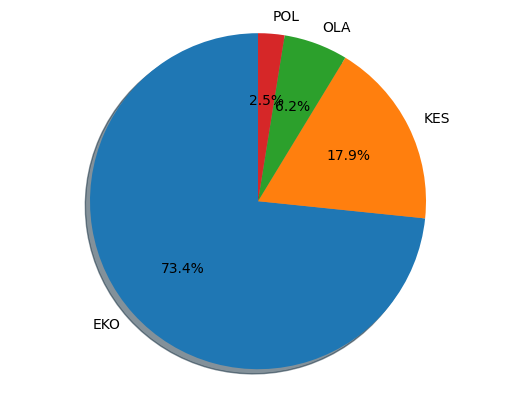

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'kimia farma catat rugi bersih rp 17004 miliar di 2022'

19/19 [==============================] - 0s 3ms/step


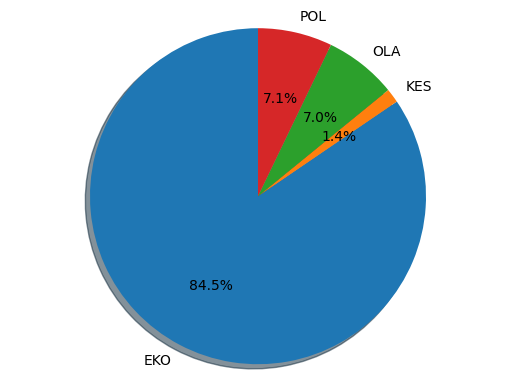

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'kepala otorita ikn akui keteteran kejar target minta dpr bujuk menteri panrb rekrut direktur dari swasta'

19/19 [==============================] - 0s 3ms/step


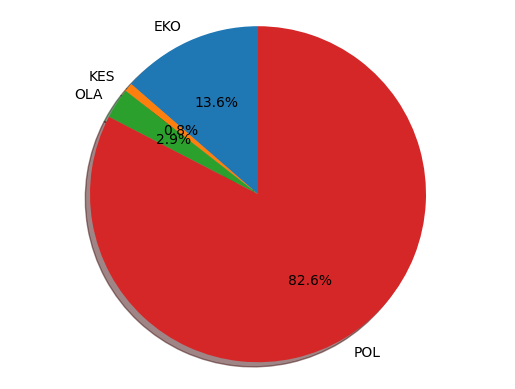

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'watsons tebar diskon promo hingga 70 persen lewat 44 ramadan sale'

19/19 [==============================] - 0s 4ms/step


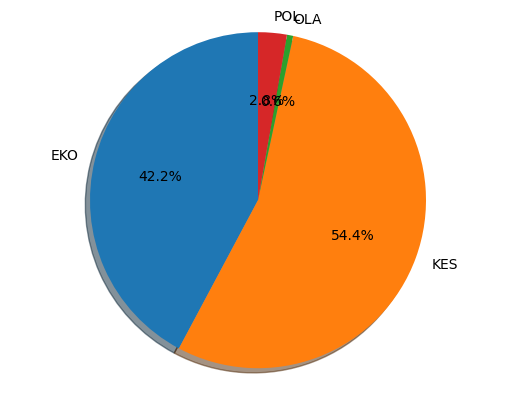

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'pabrik pelapis pipa cladtek dorong tkdn hingga 53 persen'

19/19 [==============================] - 0s 4ms/step


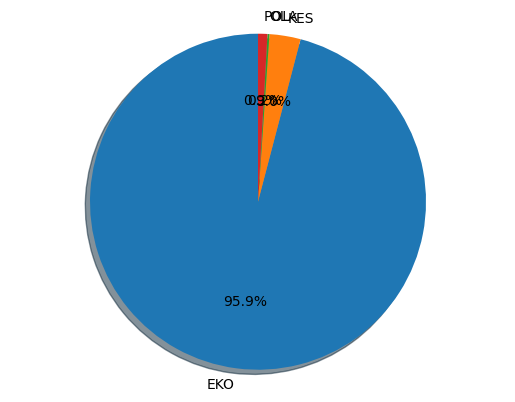

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'tips aman gunakan listrik selama ramadhan dari pln'

19/19 [==============================] - 0s 4ms/step


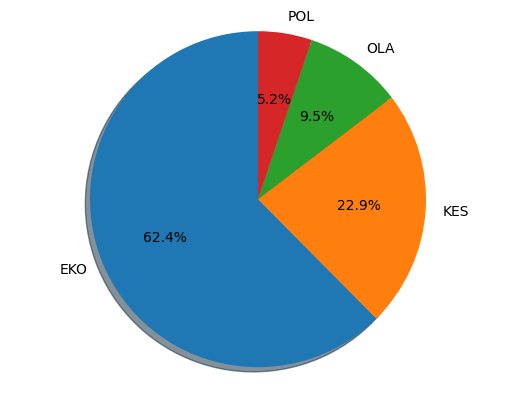

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'ojk dampak masalah bank di as dan eropa relatif terbatas pada perbankan indonesia'

19/19 [==============================] - 0s 3ms/step


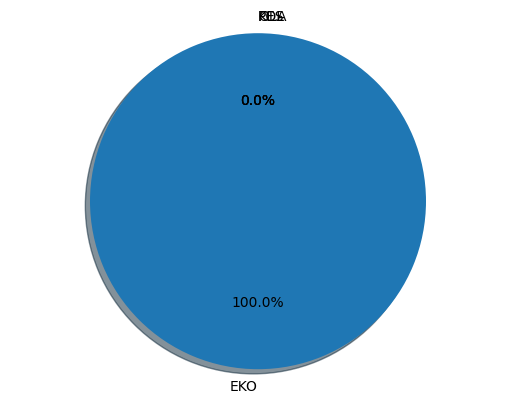

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'kadi mulai penyelidikan antidumping impor nilon film asal tiongkok thailand dan taiwan'

19/19 [==============================] - 0s 4ms/step


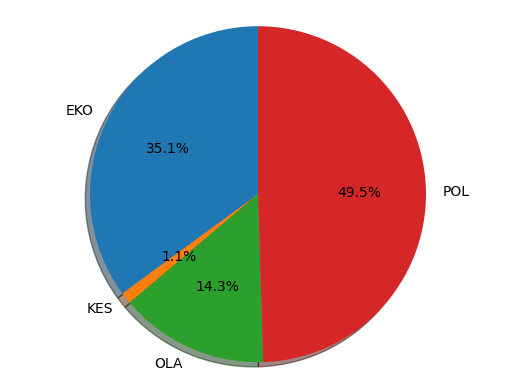

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'pejabat eselon i ke bawah otorita ikn belum terima gaji berbulanbulan'

19/19 [==============================] - 0s 4ms/step


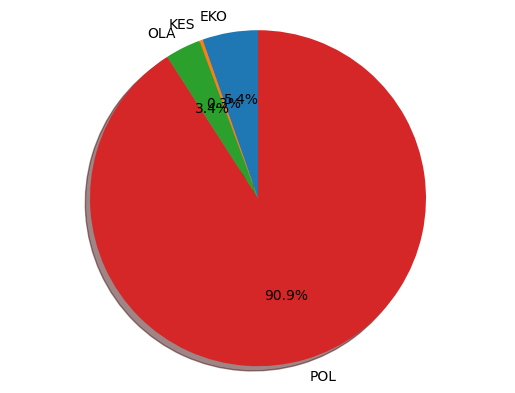

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'subsidi mobil listrik resmi berlaku bayar ppn hanya 1 persen'

19/19 [==============================] - 0s 3ms/step


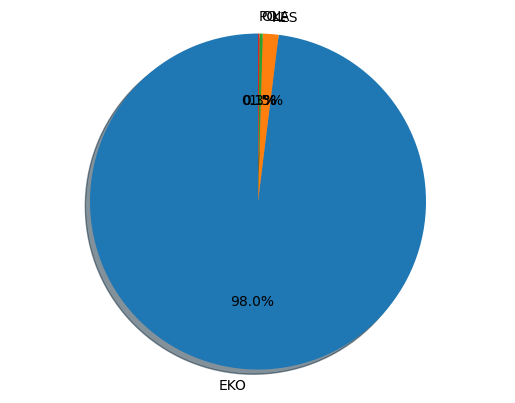

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'luhut bakal terbang ke china nego bunga utang kereta cepat jakartabandung'

19/19 [==============================] - 0s 3ms/step


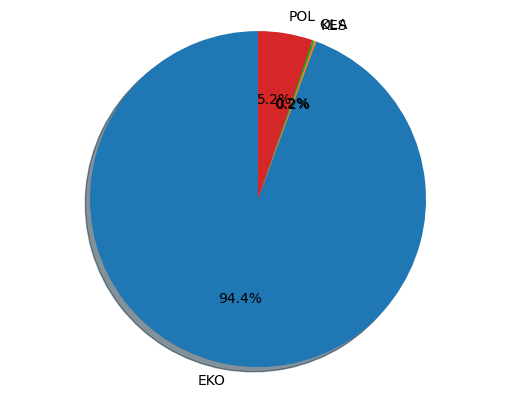

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'jasa marga siapkan 4 ruas dan akses fungsional selama mudik dan balik lebaran 2023'

19/19 [==============================] - 0s 4ms/step


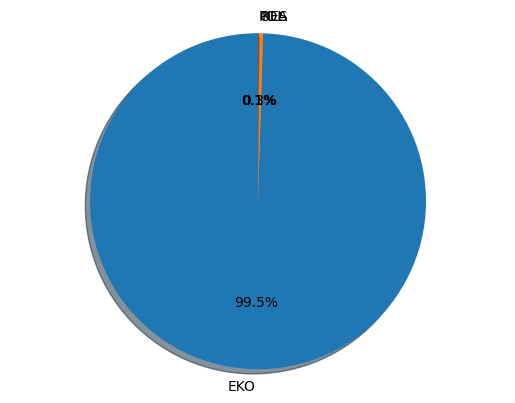

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'ojk kredit perbankan tumbuh 1064 persen tembus rp 63753 triliun'

19/19 [==============================] - 0s 6ms/step


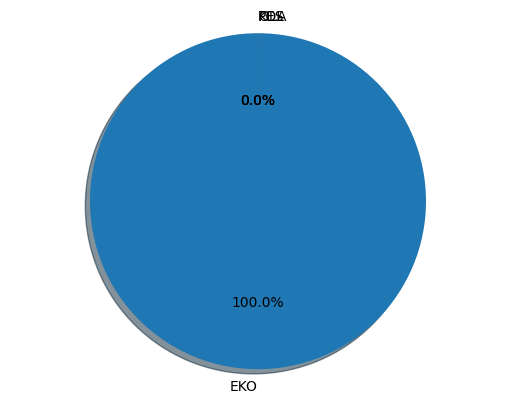

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'industri manufaktur ri cetak hattrick ekspansi 3 bulan berturutturut'

19/19 [==============================] - 0s 3ms/step


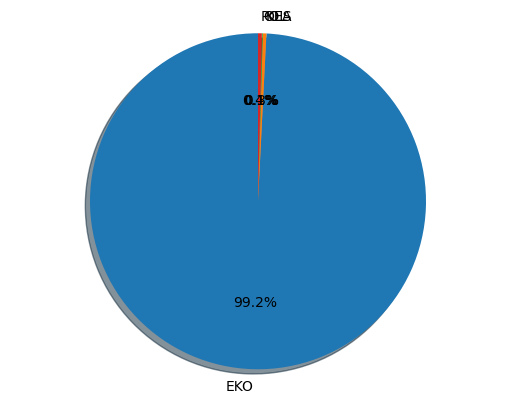

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'wamen bumn hasil audit dana pensiun bumn akan diumumkan setelah lebaran'

19/19 [==============================] - 0s 4ms/step


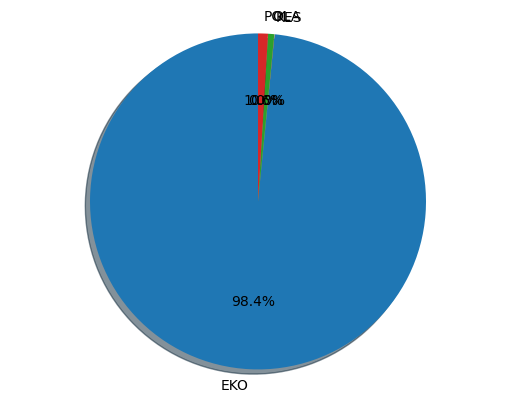

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'ojk pendapatan premi asuransi jiwa melandai asuransi umum dan reasuransi melonjak'

19/19 [==============================] - 0s 4ms/step


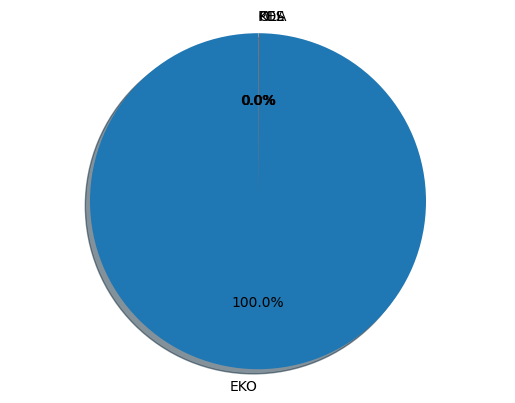

None

19/19 [==============================] - 0s 5ms/step
Best Prediction Adalah : Ekonomi 



'telkomselindihome bakal digabung kapitalisasi pasar telkom ditaksir capai rp 500 triliun'

19/19 [==============================] - 0s 3ms/step


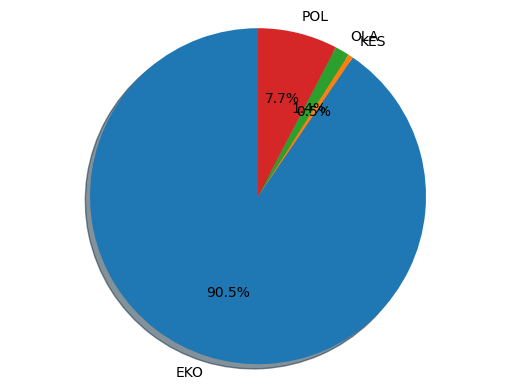

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'digugat wanaartha life ojk belum terima surat panggilan dari ptun'

19/19 [==============================] - 0s 4ms/step


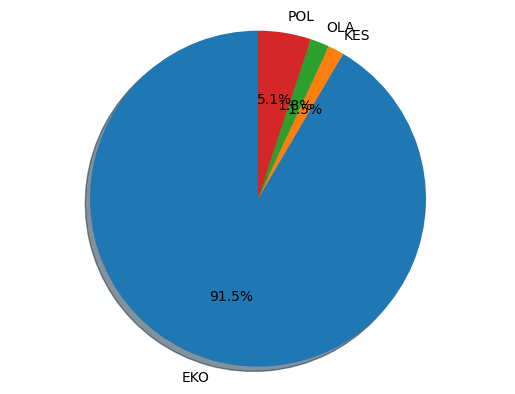

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'wamen bumn ungkap alasan operasional kereta cepat jakartabandung molor jadi agustus 2023'

19/19 [==============================] - 0s 4ms/step


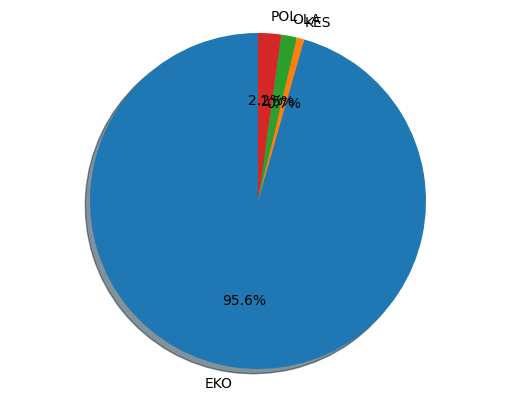

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'laba bersih rmk energy sepanjang tahun 2022 melonjak jadi rp 4041 miliar'

19/19 [==============================] - 0s 3ms/step


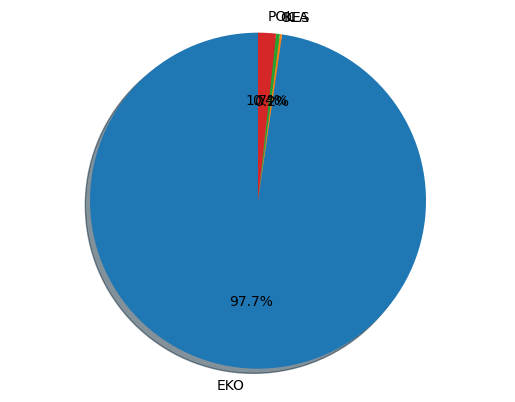

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'bulog ungkap pesan jokowi soal impor beras 2 juta ton'

19/19 [==============================] - 0s 4ms/step


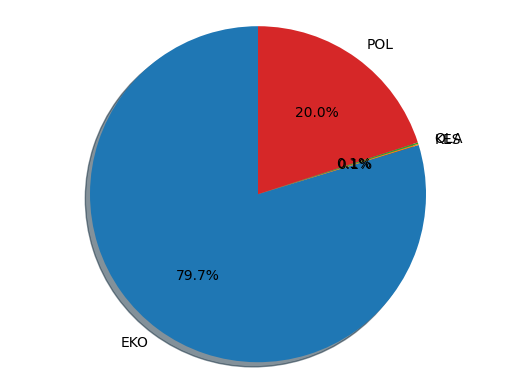

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'fresh factory kantongi pendanaan 415 juta dollar as'

19/19 [==============================] - 0s 4ms/step


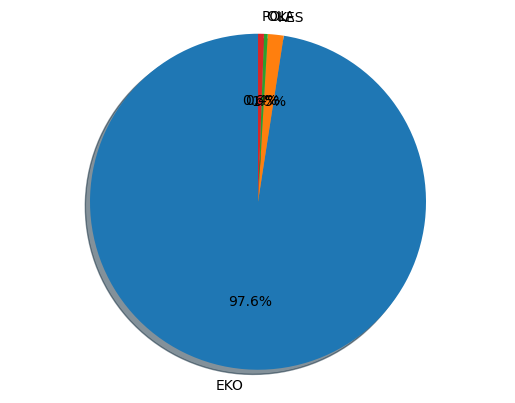

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'stabilkan harga pangan selama ramadhan bapanas fasilitasi pendistribusiannya'

19/19 [==============================] - 0s 3ms/step


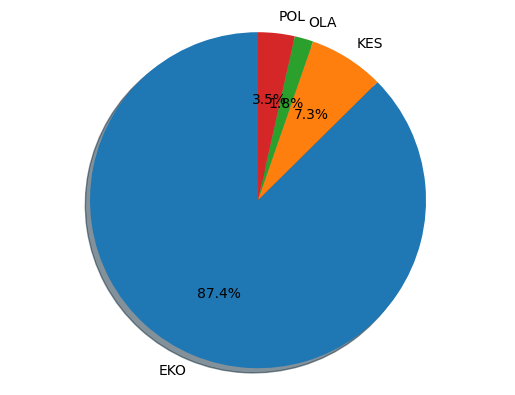

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'ditjen bea cukai musnahkan ribuan balpres pakaian bekas senilai rp 174 miliar'

19/19 [==============================] - 0s 4ms/step


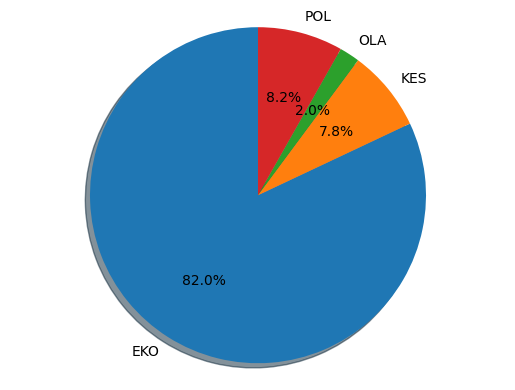

None

19/19 [==============================] - 0s 2ms/step
Best Prediction Adalah : Ekonomi 



'harga gabah dan beras di sejumlah provinsi turun bps panen raya sudah merata'

19/19 [==============================] - 0s 3ms/step


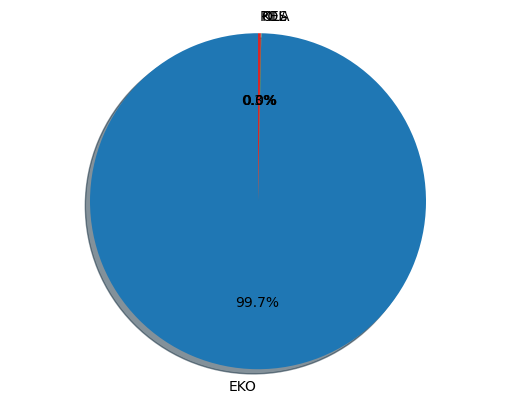

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'bi pastikan jumlah uang beredar selama lebaran 2023 tercukupi'

19/19 [==============================] - 0s 3ms/step


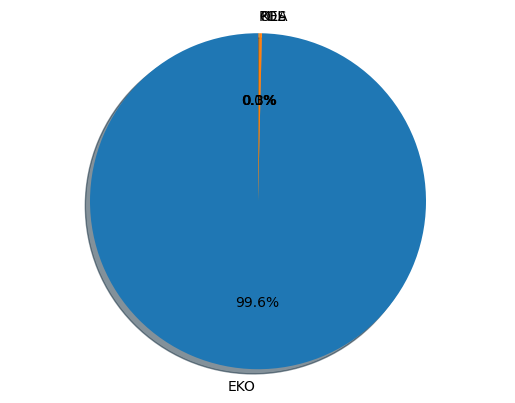

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'ntp maret 2023 naik 3 subsektor pertanian ini jadi kuncinya'

19/19 [==============================] - 0s 3ms/step


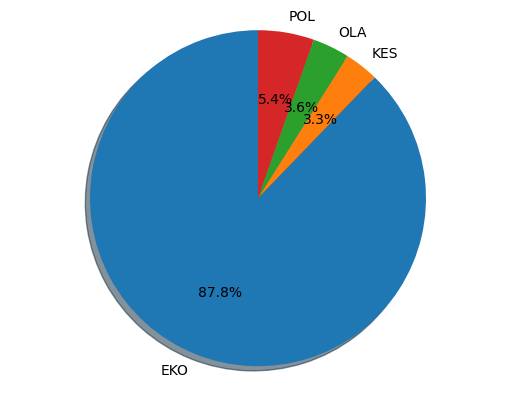

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'kebutuhan bansos jadi alasan pemerintah impor lagi 500000 ton beras'

19/19 [==============================] - 0s 4ms/step


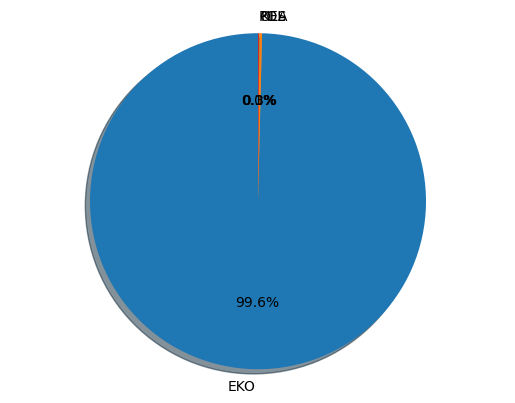

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'ihsg dan rupiah sore ini parkir di zona hijau'

19/19 [==============================] - 0s 4ms/step


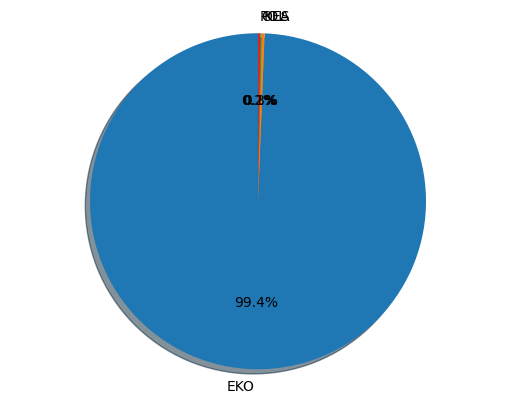

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'jelang lebaran id food siapkan 127900 ton gula dan 2460 ton daging sapi'

19/19 [==============================] - 0s 3ms/step


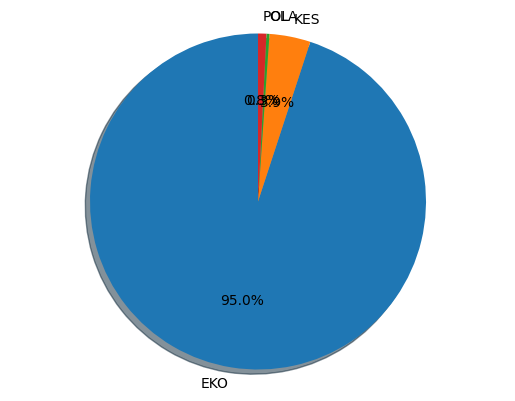

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'cek pasar rawamangun mendag minta pedagang jangan ambil untung berlebihan'

19/19 [==============================] - 0s 4ms/step


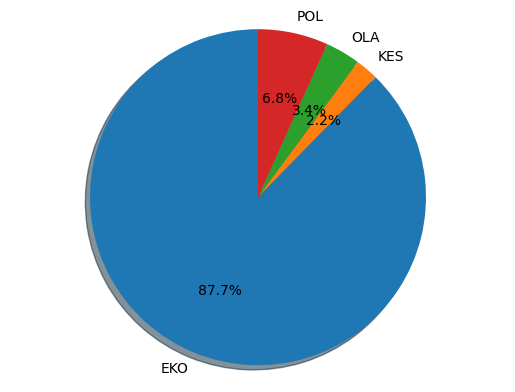

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'tekan harga bulog gelontorkan 563643 ton beras di pasar'

19/19 [==============================] - 0s 4ms/step


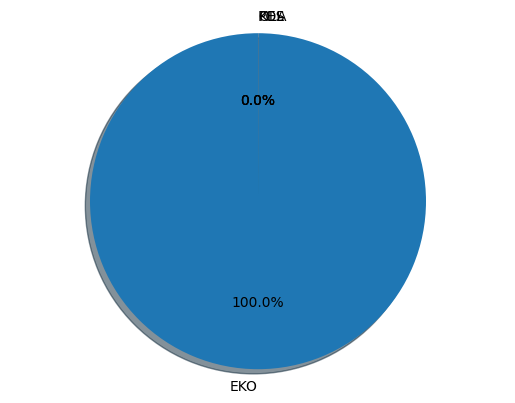

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'ntp maret capai 11085 jagung cabai rawit kopi sawit dan karet jadi komoditas dominan'

19/19 [==============================] - 0s 4ms/step


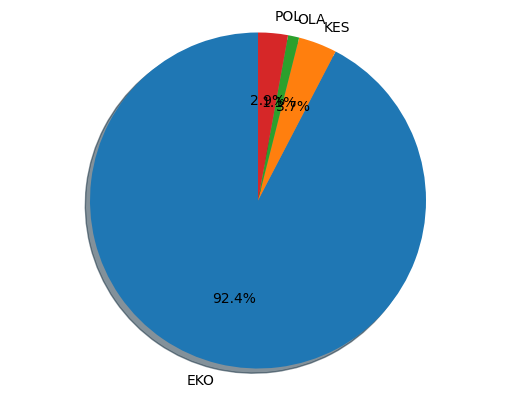

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'menyoal relevansi konsep kepuasan pelanggan'

19/19 [==============================] - 0s 3ms/step


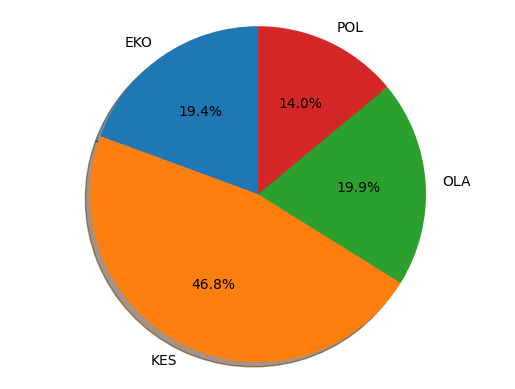

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'berlaku april segini nilai tkdn mobil dan bus listrik agar dapat insentif pajak'

19/19 [==============================] - 0s 3ms/step


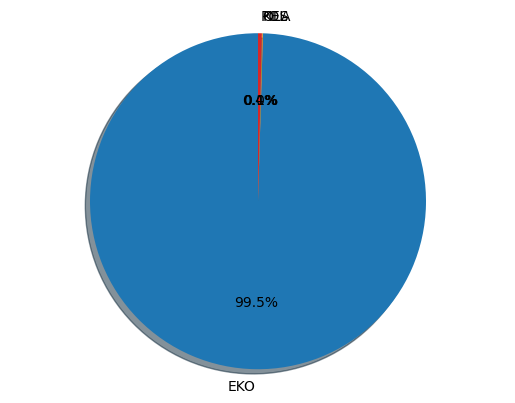

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'5 tips atur keuangan di bulan ramadan'

19/19 [==============================] - 0s 4ms/step


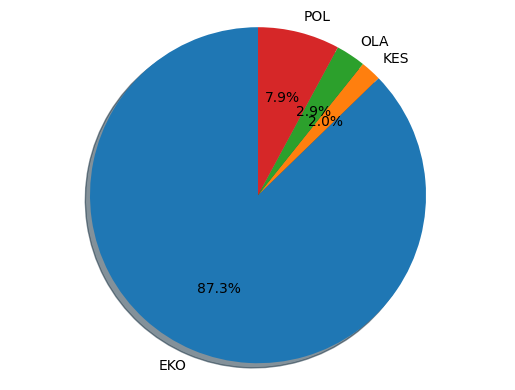

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'harga gabah kian merosot tapi harga beras masih naik'

19/19 [==============================] - 0s 3ms/step


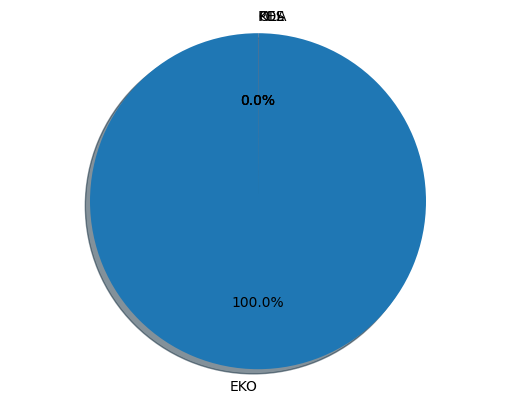

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'sepanjang 2022 perusahaan jepang di ri serap ribuan pekerja magang'

19/19 [==============================] - 0s 4ms/step


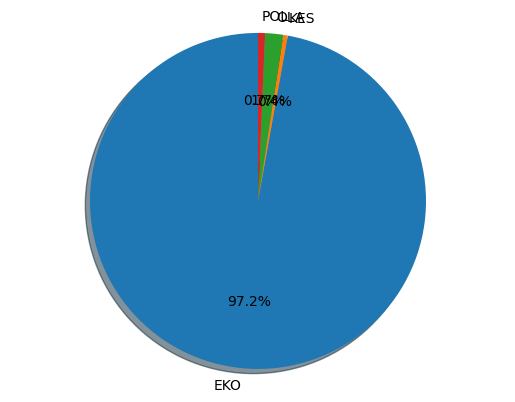

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'bi catat realisasi penukaran uang baru ramadhan rp 426 triliun 20 persen dari target'

19/19 [==============================] - 0s 4ms/step


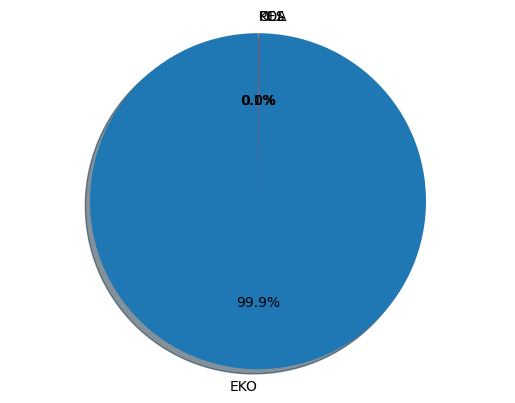

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'mengapa overthinking sering datang di malam hari'

19/19 [==============================] - 0s 4ms/step


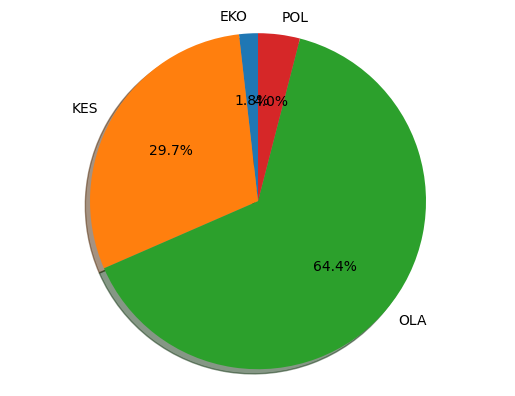

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'pahami gejala dan cara mengatasi baby blues'

19/19 [==============================] - 0s 3ms/step


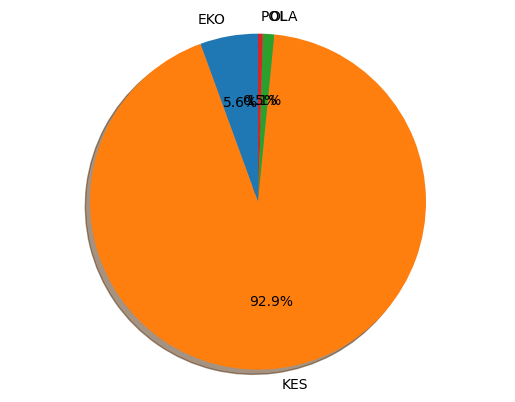

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'kenali apa itu obat pholcodine kegunaan dan efek sampingnya'

19/19 [==============================] - 0s 3ms/step


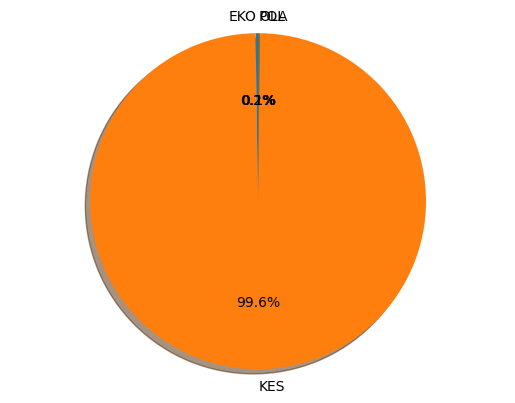

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'bpom jamin tidak ada obat mengandung pholcodine terdaftar di indonesia'

19/19 [==============================] - 0s 3ms/step


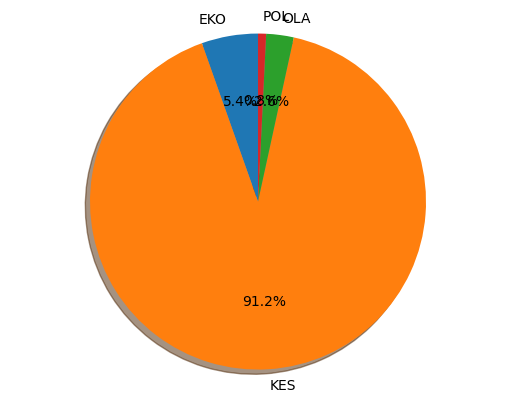

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'apa itu kemoterapi prosedur dan efek sampingnya'

19/19 [==============================] - 0s 3ms/step


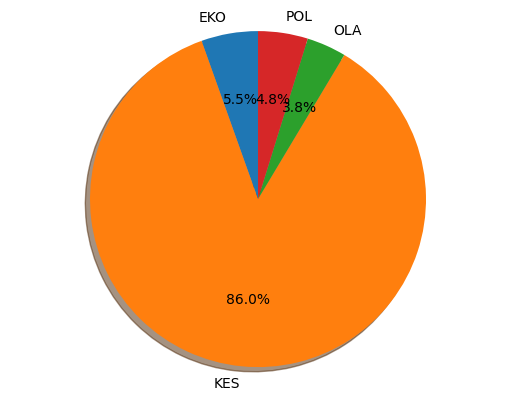

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'3 penyebab gerd saat puasa kambuh dan tips untuk penderita'

19/19 [==============================] - 0s 3ms/step


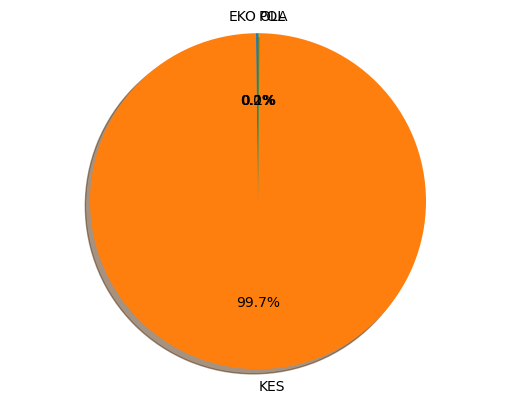

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'obat batuk anak dan efek sampingnya yang harus diwaspadai orangtua'

19/19 [==============================] - 0s 4ms/step


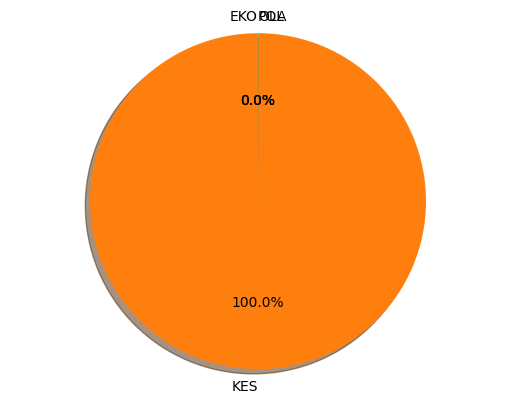

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'3 cara atasi kurang tidur selama ramadhan'

19/19 [==============================] - 0s 3ms/step


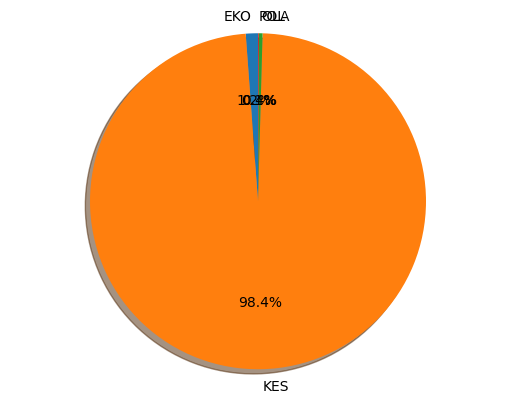

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'5 ciriciri batuk tbc dan cara mengobatinya'

19/19 [==============================] - 0s 3ms/step


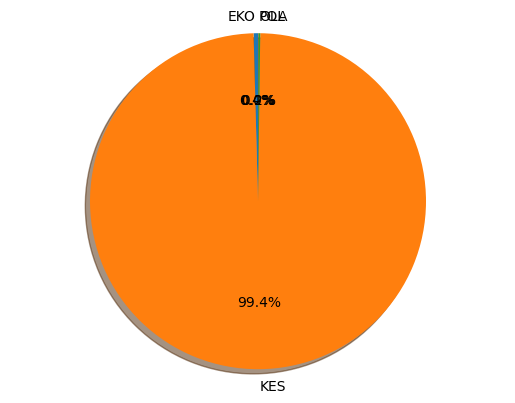

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'7 obat alami untuk batuk anak balita sebelum bertambah parah'

19/19 [==============================] - 0s 4ms/step


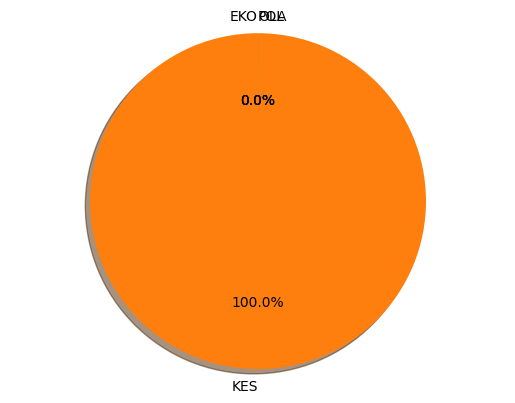

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'kenapa yogurt baik untuk berbuka puasa kenali manfaat dan anjurannya'

19/19 [==============================] - 0s 4ms/step


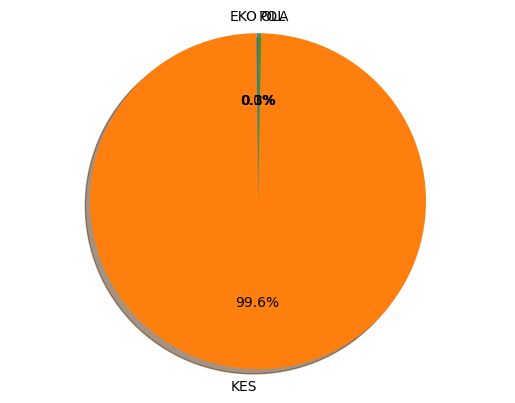

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'6 buah pilihan untuk penderita kolesterol tinggi buka puasa'

19/19 [==============================] - 0s 3ms/step


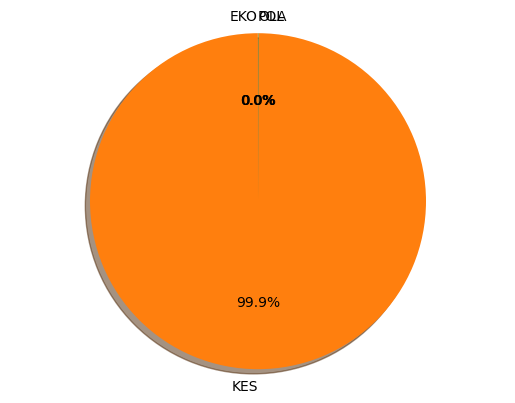

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'11 makanan buka puasa untuk penderita kolesterol tinggi'

19/19 [==============================] - 0s 4ms/step


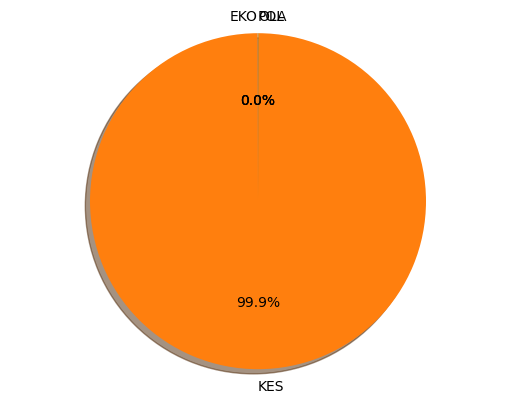

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'jangan sepelekan efek rabun jauh pada anak'

19/19 [==============================] - 0s 4ms/step


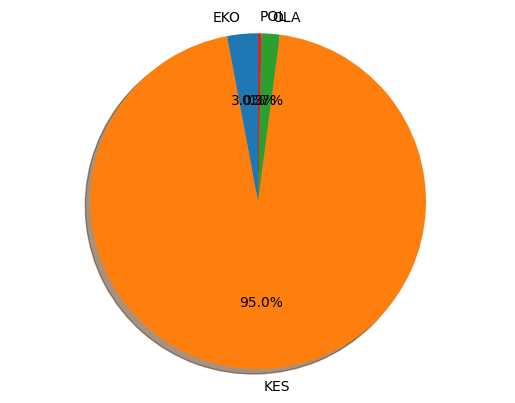

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'7 manfaat buah blewah untuk hidrasi dan menurunkan risiko kanker'

19/19 [==============================] - 0s 4ms/step


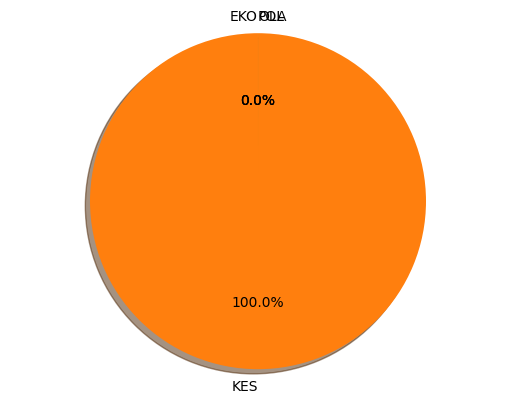

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'mengenal apa itu sleep apnea gejala penyebab dan cara mengatasinya'

19/19 [==============================] - 0s 4ms/step


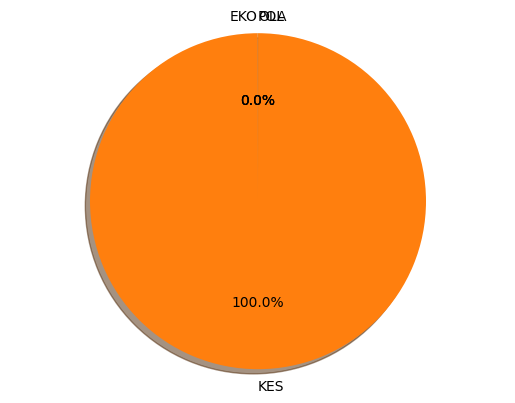

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'apakah sakit saat haid sama dengan sakit saat melahirkan'

19/19 [==============================] - 0s 3ms/step


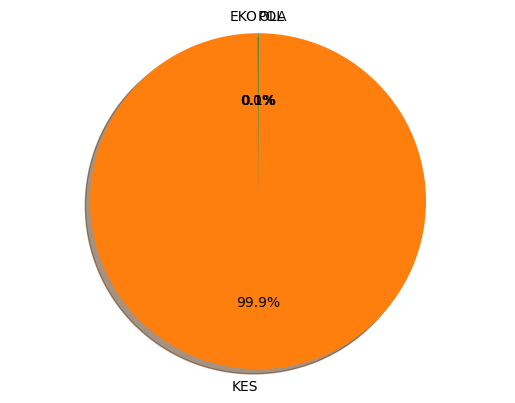

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'6 cara mengatasi bibir kering dan mengelupas secara alami'

19/19 [==============================] - 0s 4ms/step


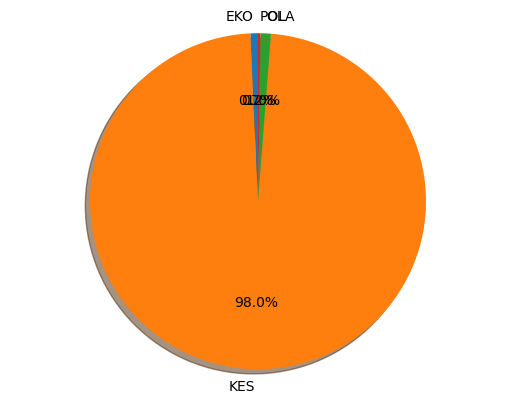

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'10 penyebab gigi kuning dan cara mengatasinya'

19/19 [==============================] - 0s 4ms/step


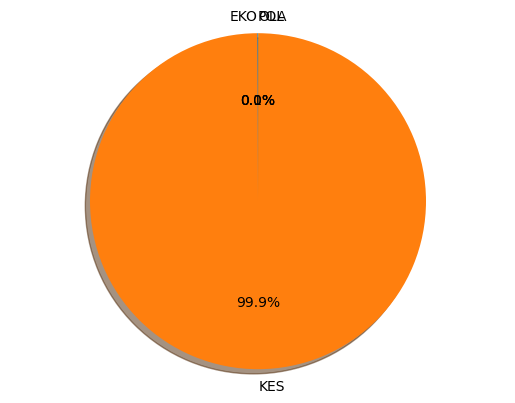

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'10 kebiasaan buruk penyebab sakit ginjal yang jarang disadari'

19/19 [==============================] - 0s 4ms/step


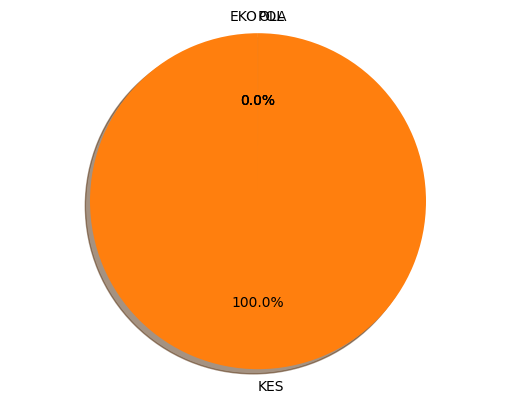

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'2 penyebab mata kering dan perih yang perlu diketahui'

19/19 [==============================] - 0s 3ms/step


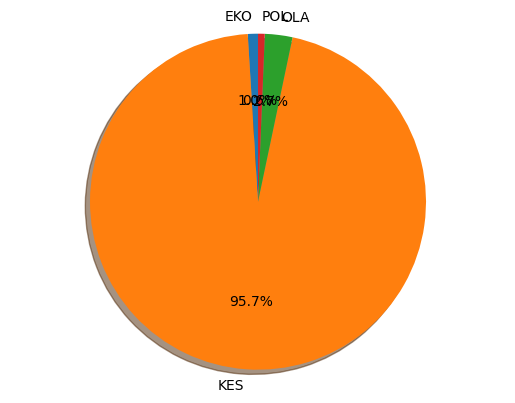

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'6 akibat tidak sahur untuk kesehatan bisa lemas sampai maag kambuh'

19/19 [==============================] - 0s 4ms/step


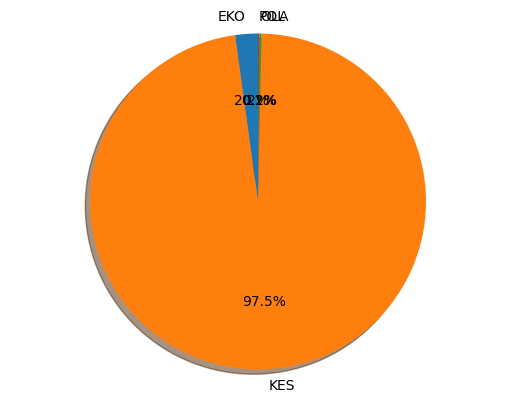

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'6 komplikasi sembelit yang berlangsung lama harus diwaspadai'

19/19 [==============================] - 0s 3ms/step


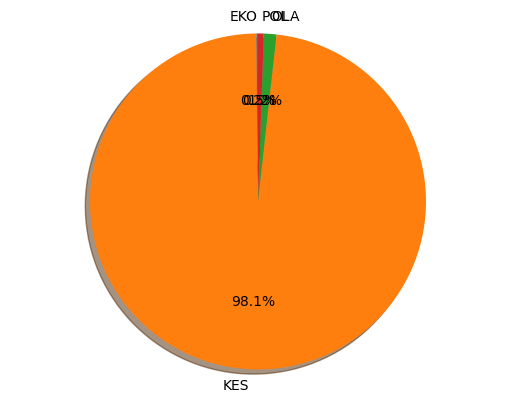

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'6 penyebab insomnia akut dan cara mengatasinya'

19/19 [==============================] - 0s 3ms/step


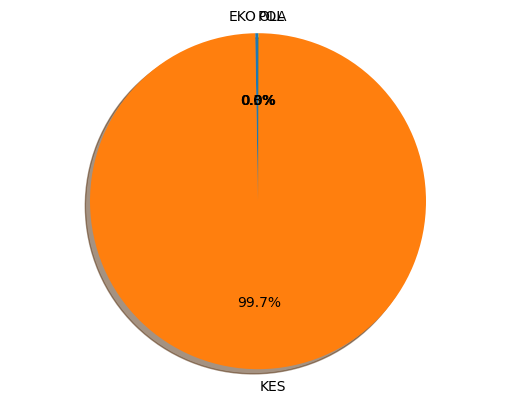

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'mengenal penyebab dan cara mengatasi pusing saat haid'

19/19 [==============================] - 0s 3ms/step


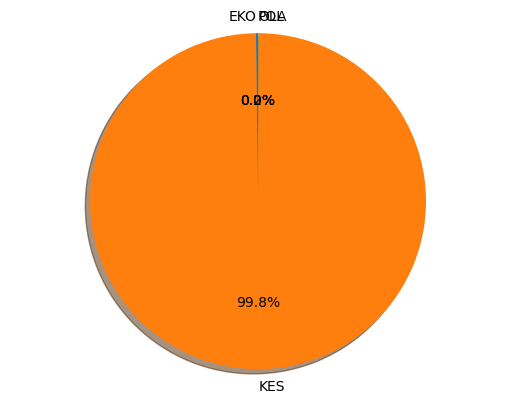

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'10 manfaat air kelapa untuk meningkatkan energi dan cegah batu ginjal'

19/19 [==============================] - 0s 3ms/step


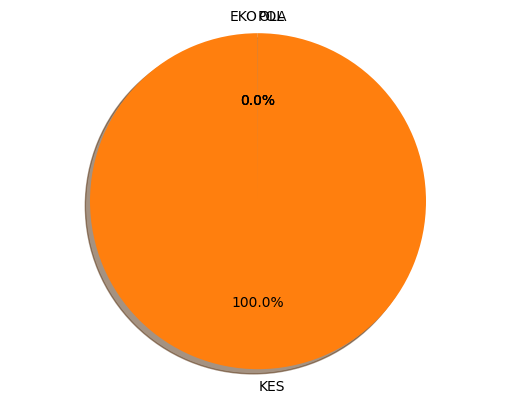

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'6 cara mengatasi bibir kering dan mengelupas saat puasa'

19/19 [==============================] - 0s 4ms/step


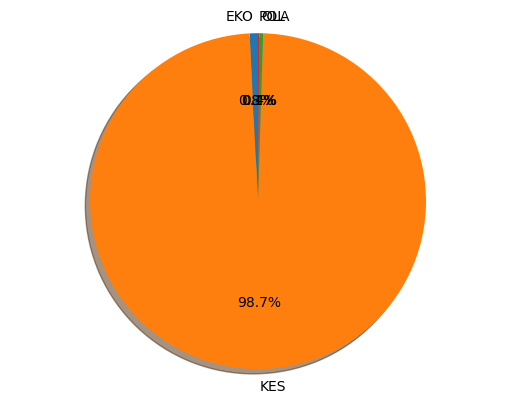

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'mengenali gejala penyebab dan cara mengatasi bibir kering'

19/19 [==============================] - 0s 4ms/step


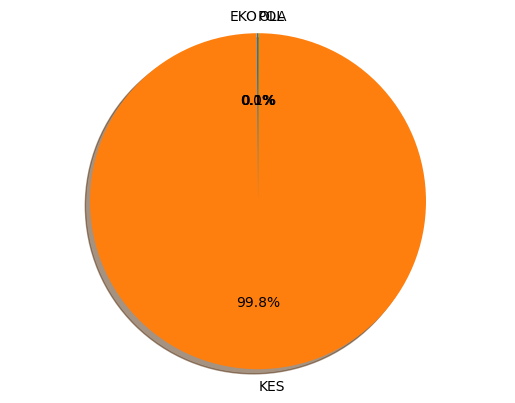

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'4 manfaat probiotik saat puasa yang sayang dilewatkan'

19/19 [==============================] - 0s 4ms/step


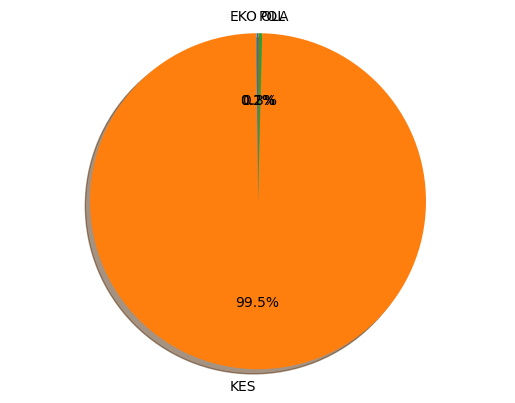

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'kenapa kepala pusing saat puasa ini 6 penyebab dan cara mengatasinya'

19/19 [==============================] - 0s 4ms/step


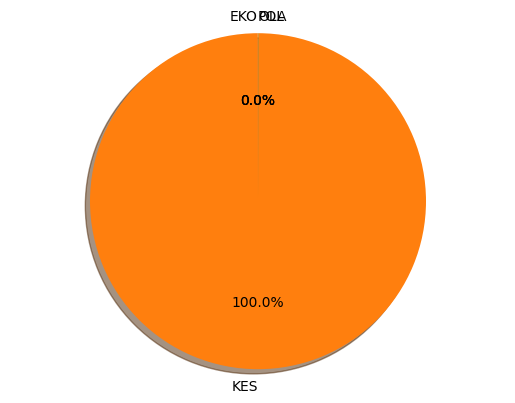

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'8 jenis obat penyebab sembelit yang perlu diketahui'

19/19 [==============================] - 0s 4ms/step


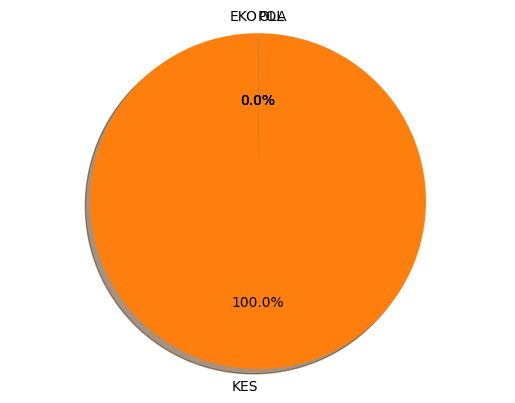

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'10 obat alami untuk mengatasi sembelit semangka hingga kopi'

19/19 [==============================] - 0s 3ms/step


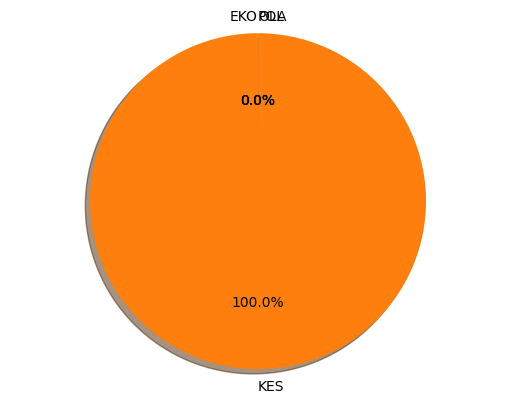

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'3 bahaya tidur setelah makan sahur untuk kesehatan'

19/19 [==============================] - 0s 4ms/step


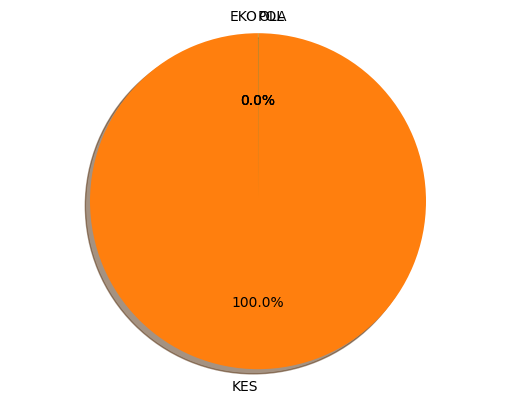

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'5 penyebab insomnia pada wanita yang perlu diketahui'

19/19 [==============================] - 0s 4ms/step


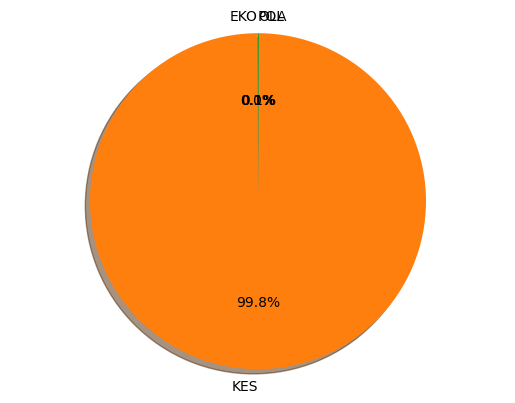

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'pertolongan pertama untuk mengobati luka bakar karena petasan'

19/19 [==============================] - 0s 4ms/step


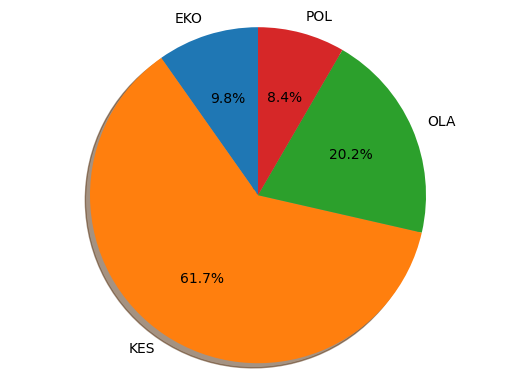

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'kenali apa itu sembelit penyebab dan tandatanda'

19/19 [==============================] - 0s 4ms/step


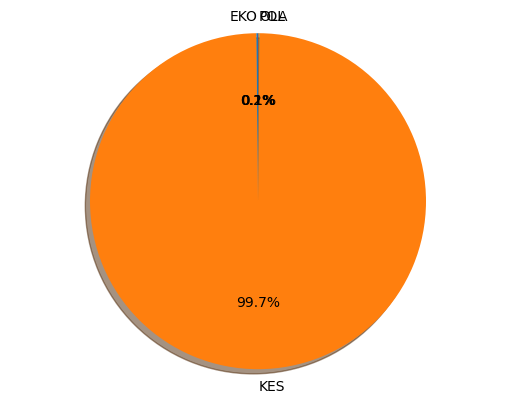

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'apakah ibu hamil boleh puasa kenali risiko dan tips amannya'

19/19 [==============================] - 0s 4ms/step


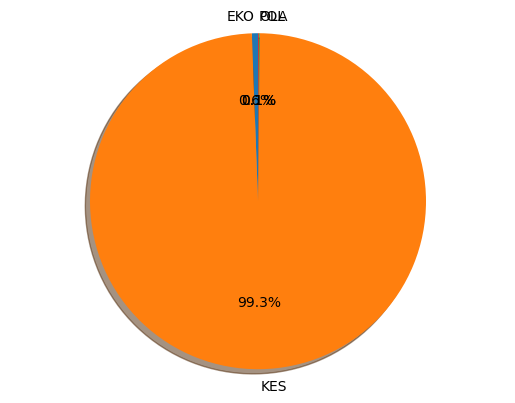

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'digitalisasi data kesehatan babak baru pembangunan kesehatan indonesia'

19/19 [==============================] - 0s 4ms/step


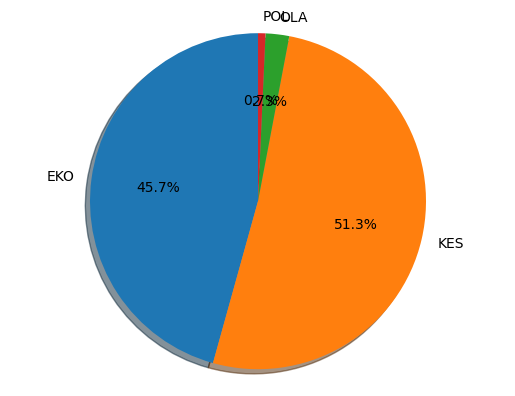

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'aturan minum air putih saat puasa untuk memenuhi kebutuhan cairan'

19/19 [==============================] - 0s 4ms/step


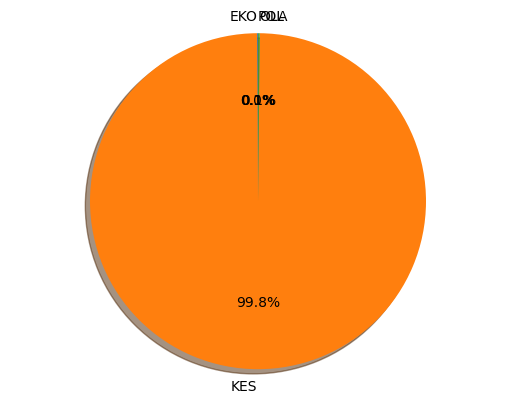

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'10 manfaat buah semangka untuk hidrasi sampai cegah penyakit jantung'

19/19 [==============================] - 0s 4ms/step


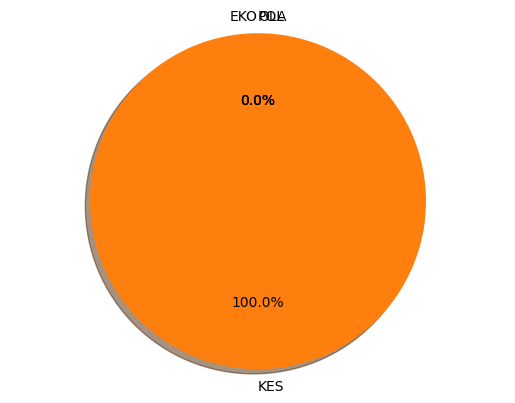

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'6 komplikasi menopause dini yang perlu diwaspadai wanita'

19/19 [==============================] - 0s 3ms/step


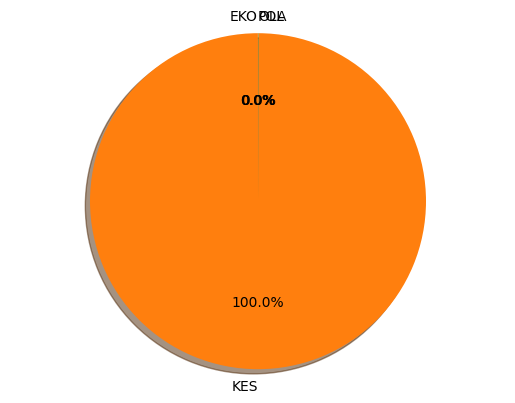

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'5 penyebab berat badan naik saat puasa yang terkadang tidak disadari'

19/19 [==============================] - 0s 3ms/step


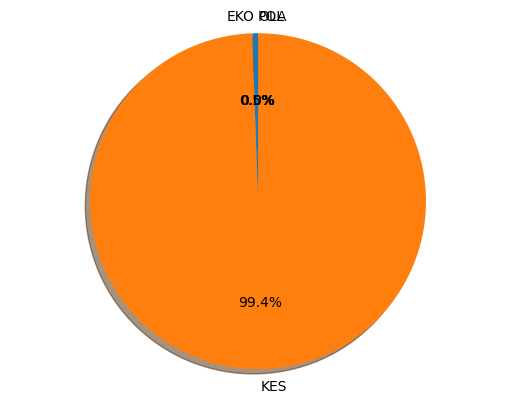

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'5 rekomendasi makanan sahur agar berenergi selama berpuasa'

19/19 [==============================] - 0s 3ms/step


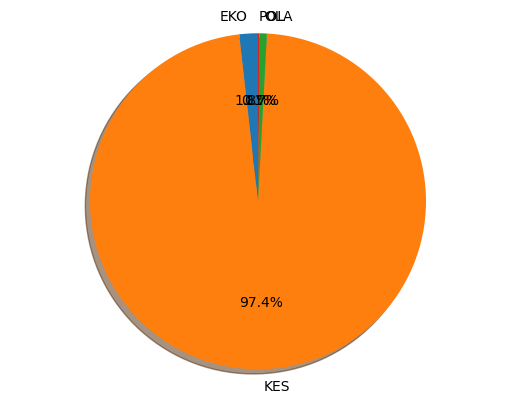

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'5 tips puasa untuk penderita diabetes agar gula darah tetap terkontrol'

19/19 [==============================] - 0s 4ms/step


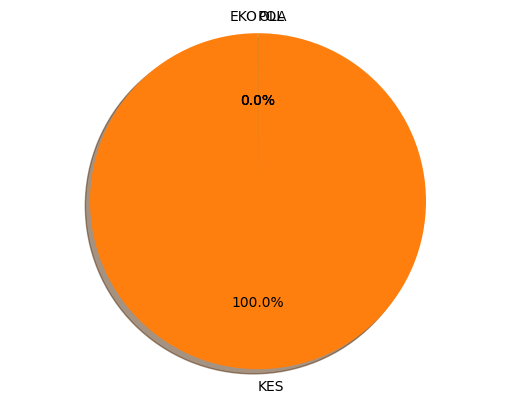

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'8 buah pilihan untuk penderita penyakit ginjal buka puasa'

19/19 [==============================] - 0s 4ms/step


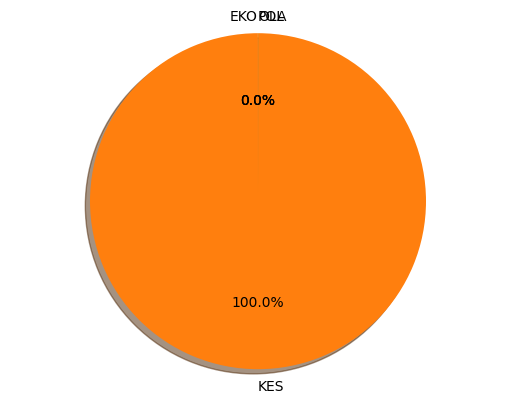

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'hut ke14 audy dental ajak masyarakat jaga kesehatan gigi dan ikut senyum tanpa ragu'

19/19 [==============================] - 0s 3ms/step


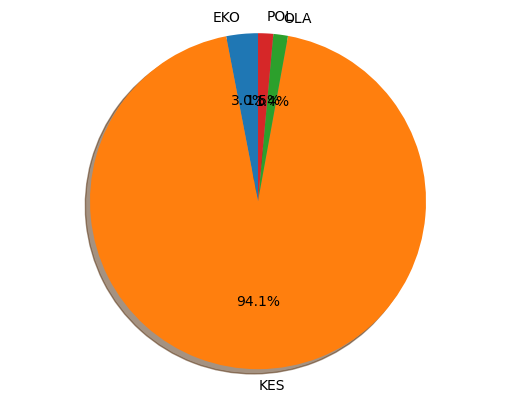

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'bpom dan idai nyatakan obat sirop sudah aman'

19/19 [==============================] - 0s 3ms/step


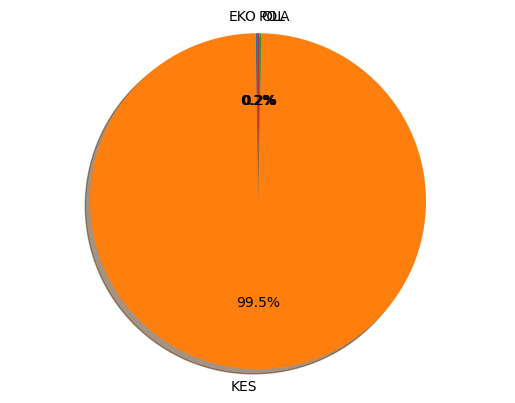

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'4 efek makan gorengan terlalu banyak untuk kesehatan'

19/19 [==============================] - 0s 4ms/step


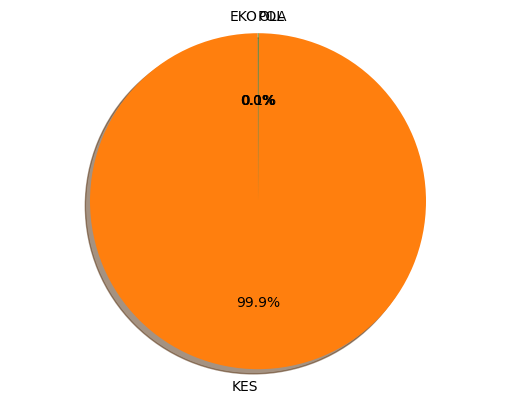

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'3 jenis obat batuk untuk orang dewasa dan efek sampingnya'

19/19 [==============================] - 0s 3ms/step


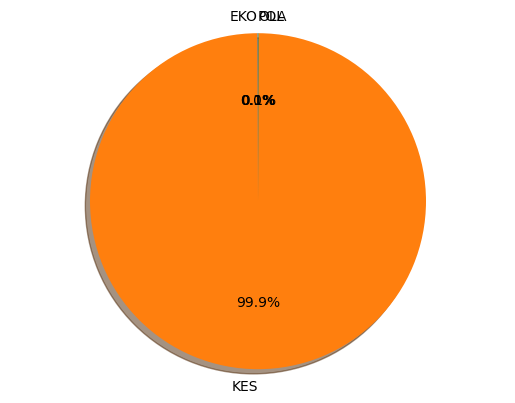

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'16 cara mengobati mata merah dan berair'

19/19 [==============================] - 0s 4ms/step


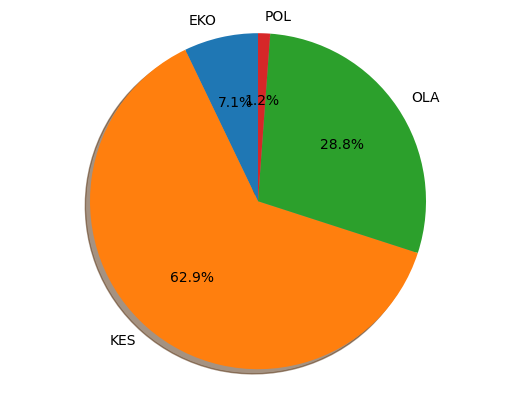

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'panduan sikat gigi saat puasa agar kesehatan mulut tetap terjaga'

19/19 [==============================] - 0s 4ms/step


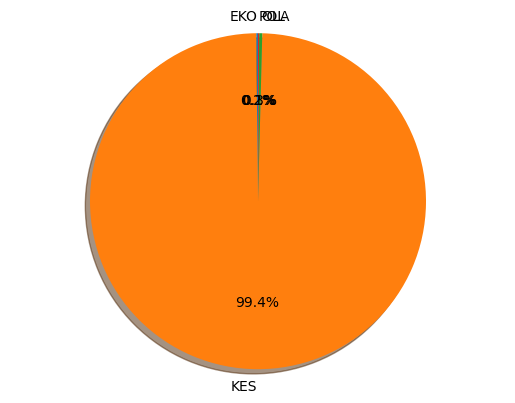

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'5 tips puasa untuk penderita asam lambung agar ibadah ramadhan lancar'

19/19 [==============================] - 0s 4ms/step


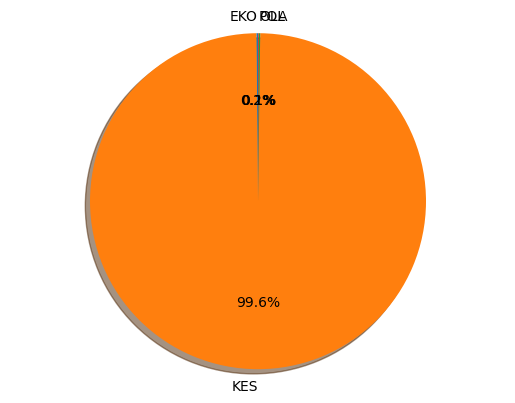

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'7 buah pilihan untuk penderita asam urat buka puasa'

19/19 [==============================] - 0s 3ms/step


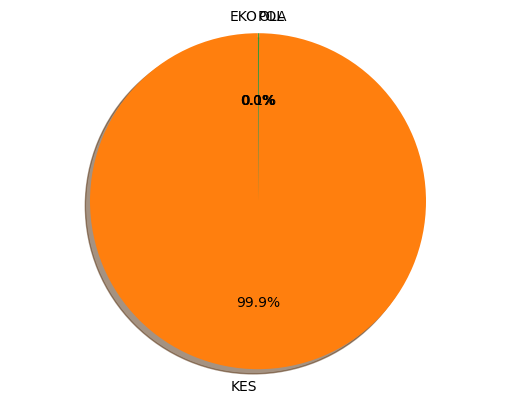

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'4 fungsi obat kumur tak hanya untuk bau mulut'

19/19 [==============================] - 0s 4ms/step


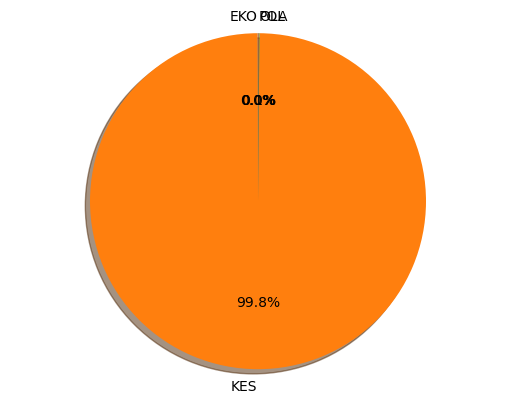

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'5 kebiasaan pemicu bau mulut saat puasa termasuk kurang air putih'

19/19 [==============================] - 0s 4ms/step


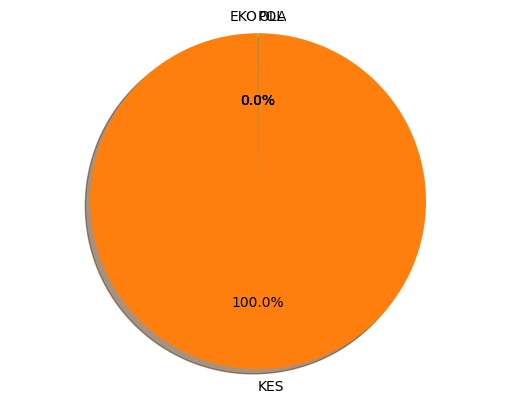

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'10 manfaat puasa untuk kesehatan mental dan fisik'

19/19 [==============================] - 0s 4ms/step


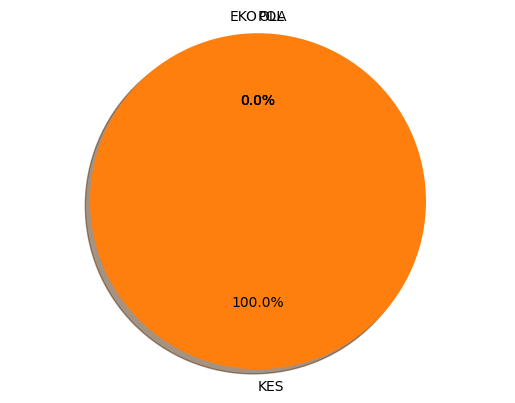

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'pentingnya deteksi cepat kasus tuberkulosis resisten obat'

19/19 [==============================] - 0s 3ms/step


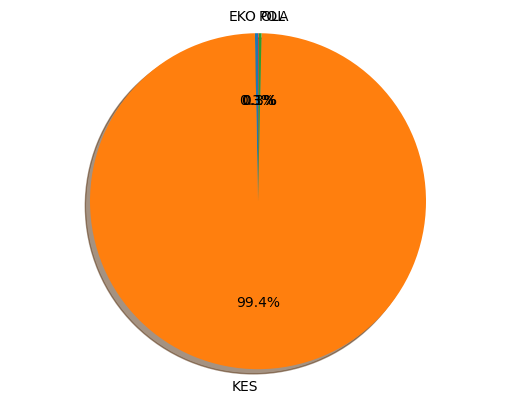

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'menu daging dan diolah dengan minyak masih jadi favorit selama puasa'

19/19 [==============================] - 0s 4ms/step


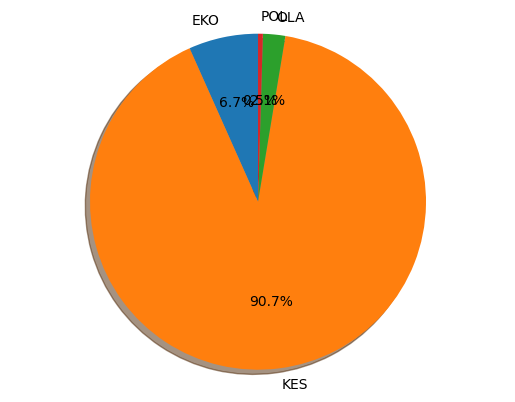

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'cara mengobati menopause dini yang perlu diketahui para wanita'

19/19 [==============================] - 0s 4ms/step


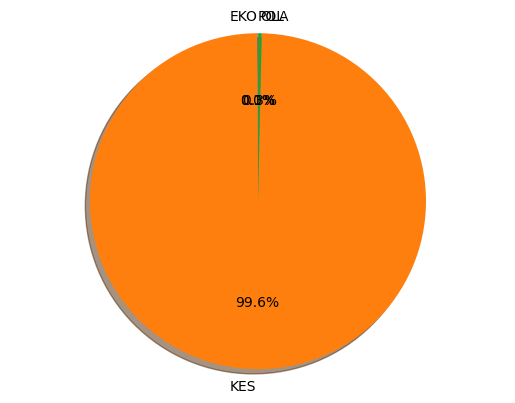

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'6 makanan buka puasa untuk penderita asam urat'

19/19 [==============================] - 0s 3ms/step


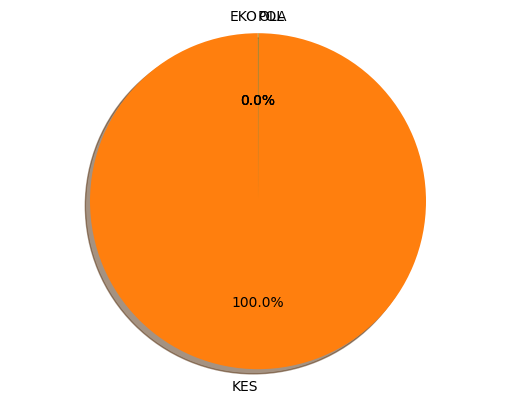

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'8 obat alami untuk batuk saat hamil air garam hingga sup ayam'

19/19 [==============================] - 0s 3ms/step


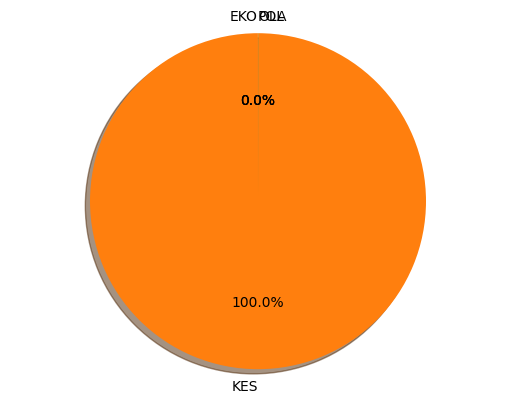

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'kapan waktu sikat gigi yang tepat simak penjelasan ahli berikut'

19/19 [==============================] - 0s 3ms/step


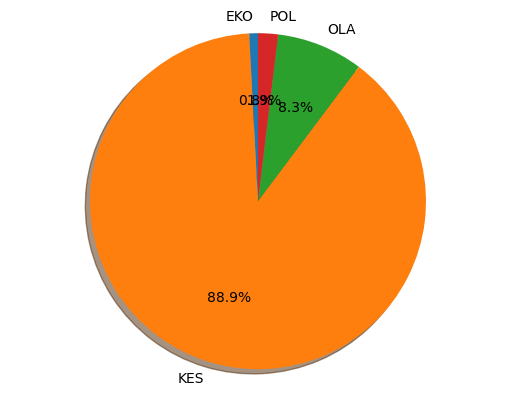

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'4 tips lancar berpuasa untuk ibu hamil'

19/19 [==============================] - 0s 4ms/step


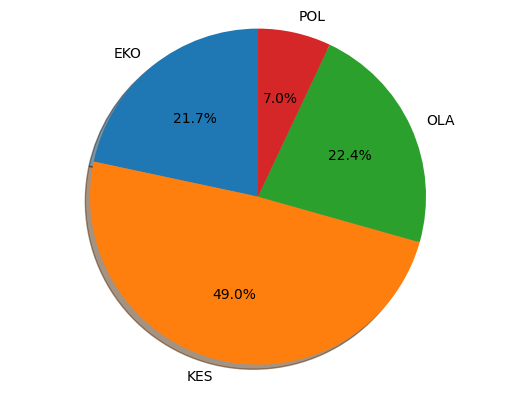

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'berkontribusi tangani covid19 aplikasi good doctor raih penghargaan'

19/19 [==============================] - 0s 3ms/step


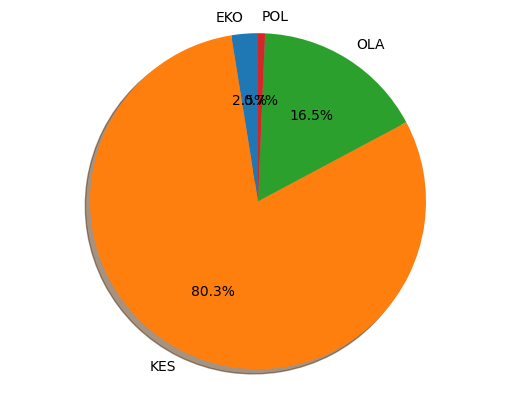

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'kenali apa itu menopause dini penyebab dan tandatanda'

19/19 [==============================] - 0s 4ms/step


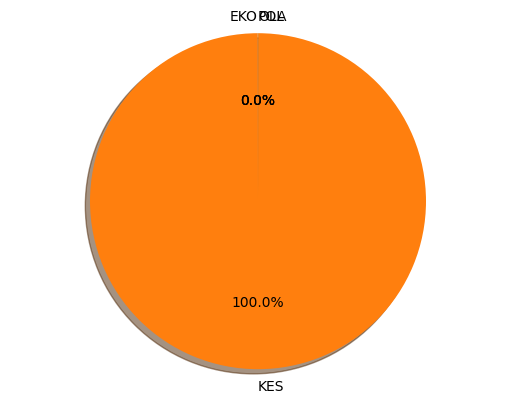

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'sedang program hamil hindari 4 jenis makanan berikut'

19/19 [==============================] - 0s 3ms/step


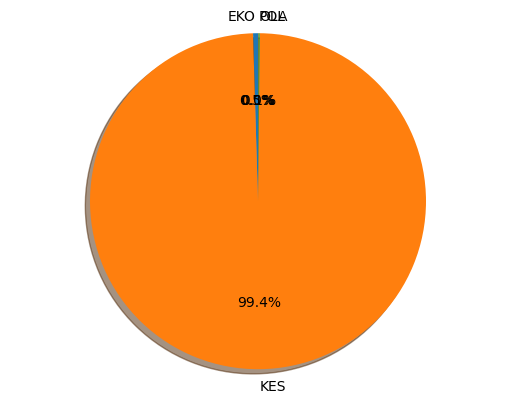

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'apakah penyakit kanker bisa menular'

19/19 [==============================] - 0s 4ms/step


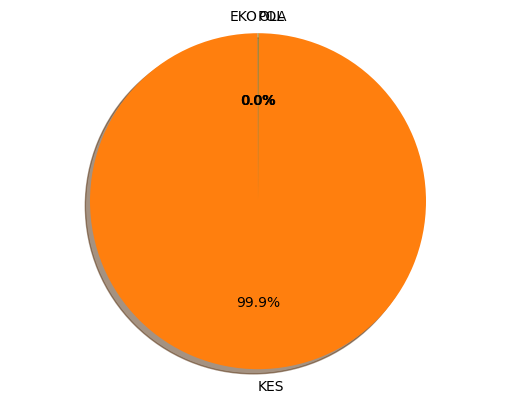

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'pahami bagaimana kanker berkembang dan menyebar'

19/19 [==============================] - 0s 3ms/step


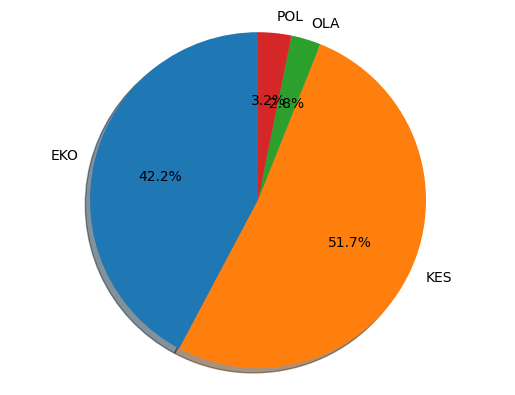

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'6 penyebab gigi sensitif sering berdarah dan cara mengatasinya'

19/19 [==============================] - 0s 3ms/step


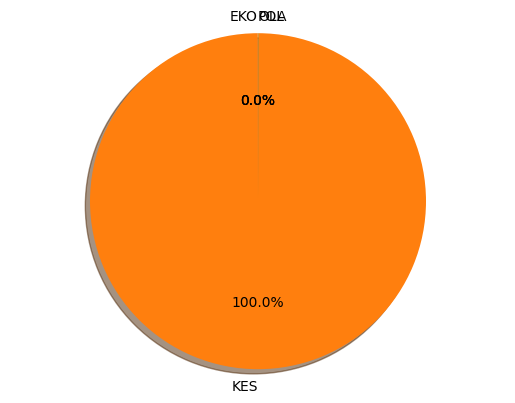

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'12 penyebab dan cara mengatasi badan sakit semua'

19/19 [==============================] - 0s 4ms/step


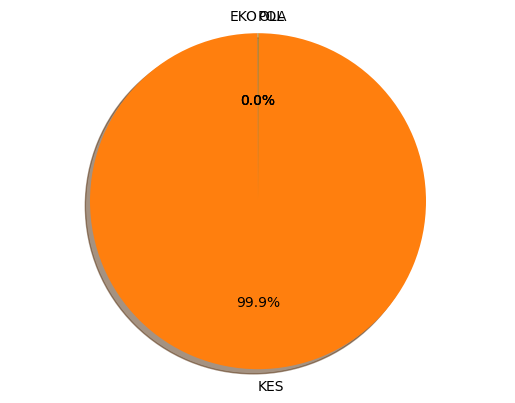

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'6 obat asam urat dan efek sampingnya yang perlu diperhatikan'

19/19 [==============================] - 0s 3ms/step


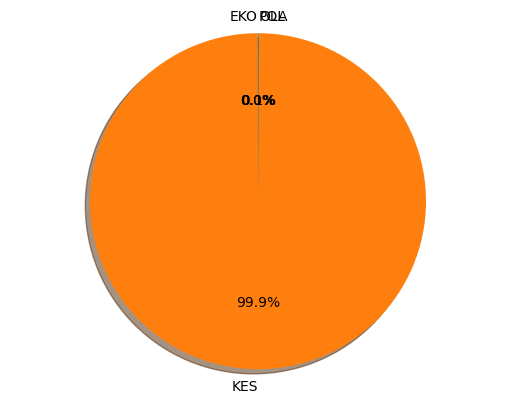

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'ketahui manfaat ibadah puasa untuk penderita diabetes menurut ahli'

19/19 [==============================] - 0s 3ms/step


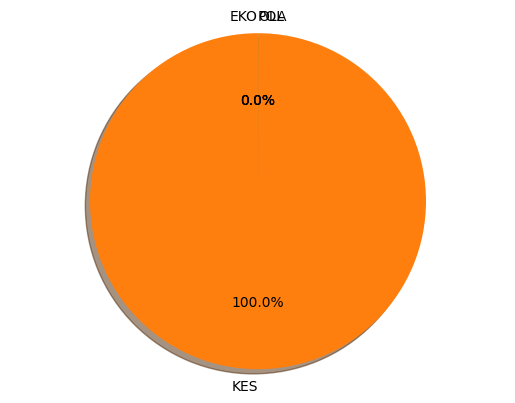

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'tandatanda kanker otak pada anak berdasar lokasinya'

19/19 [==============================] - 0s 3ms/step


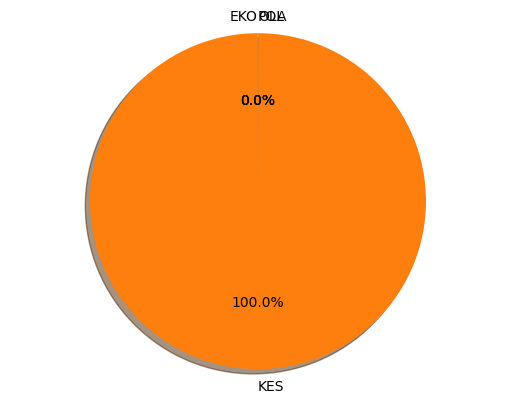

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'18 tandatanda kanker otak pada anak yang harus diwaspadai orangtua'

19/19 [==============================] - 0s 4ms/step


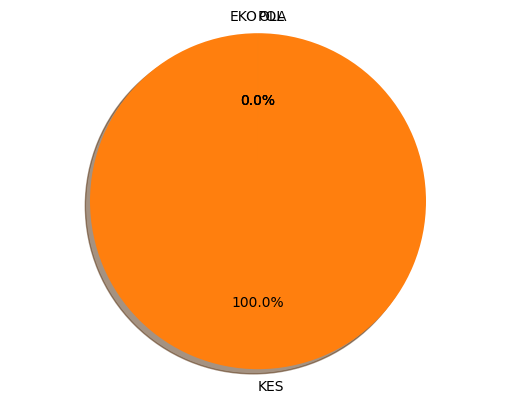

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'12 makanan buka puasa untuk penderita penyakit ginjal'

19/19 [==============================] - 0s 3ms/step


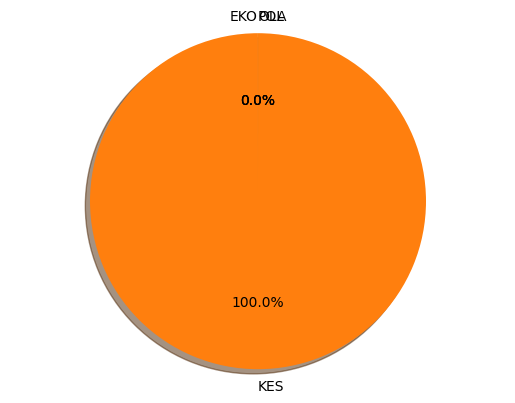

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'bahan aktif terbaru dalam skincare yang bakal tren'

19/19 [==============================] - 0s 4ms/step


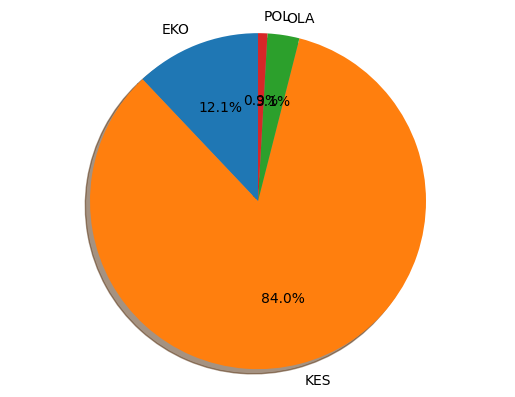

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'7 cara merawat gigi yang terlanjur berlubang'

19/19 [==============================] - 0s 4ms/step


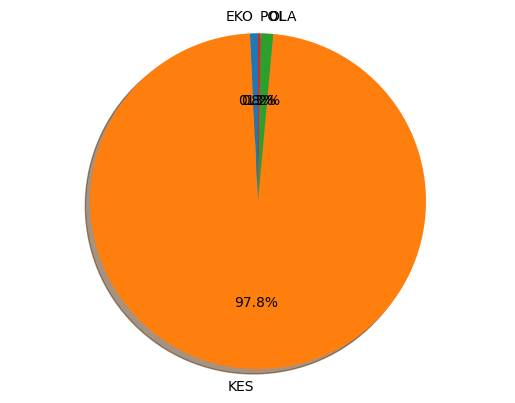

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'apa itu kanker ginjal metastatik'

19/19 [==============================] - 0s 3ms/step


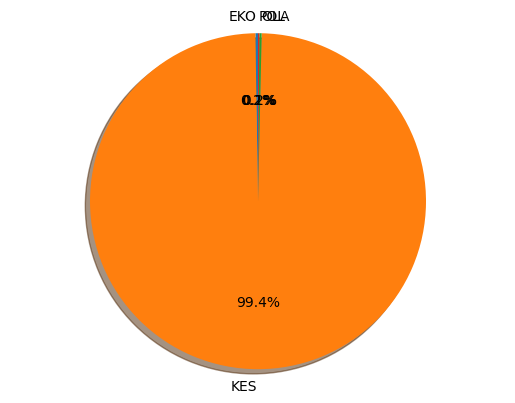

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'13 cara menghitamkan rambut beruban karena stres'

19/19 [==============================] - 0s 4ms/step


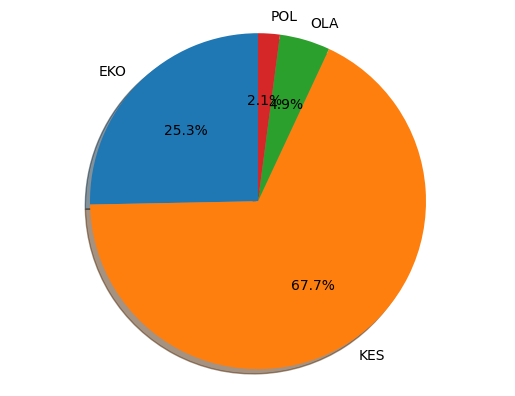

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'apakah aman minum air panas selama kehamilan'

19/19 [==============================] - 0s 4ms/step


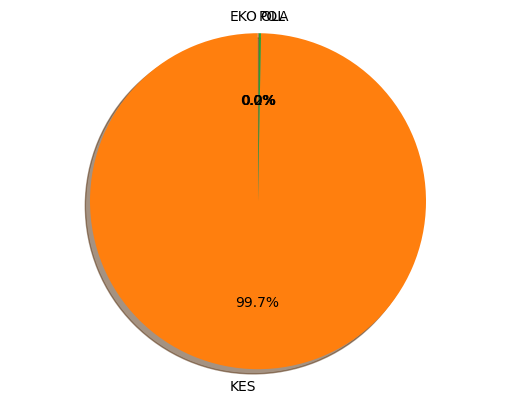

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'5 dampak negatif memaksa anak makan orangtua perlu tahu'

19/19 [==============================] - 0s 4ms/step


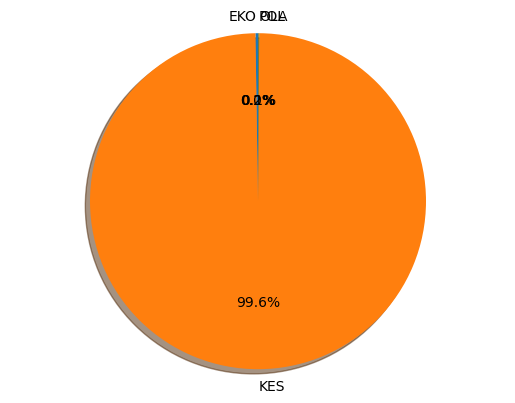

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'11 tandatanda ginjal bermasalah yang pantang diabaikan'

19/19 [==============================] - 0s 3ms/step


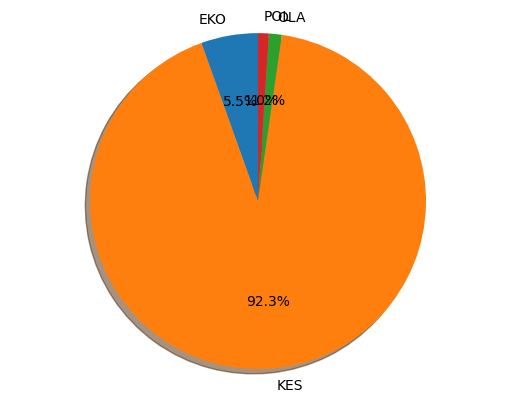

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'10 obat alami untuk sariawan madu hingga teh kamomil'

19/19 [==============================] - 0s 3ms/step


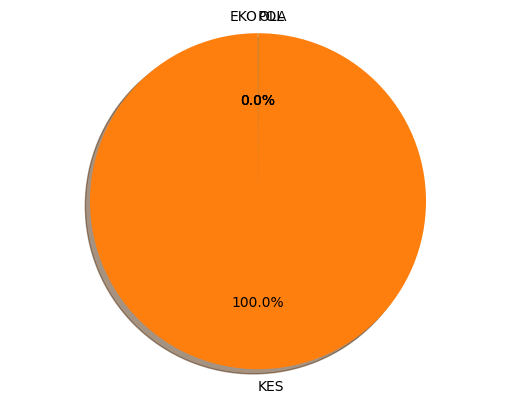

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'9 penyebab mata bengkak dan cara mengatasinya'

19/19 [==============================] - 0s 3ms/step


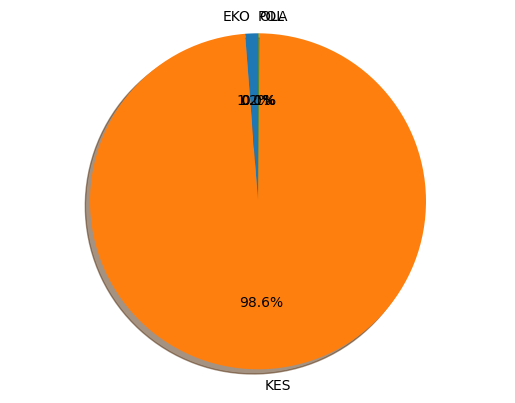

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'8 tandatanda kanker ginjal stadium 4 yang perlu diketahui'

19/19 [==============================] - 0s 3ms/step


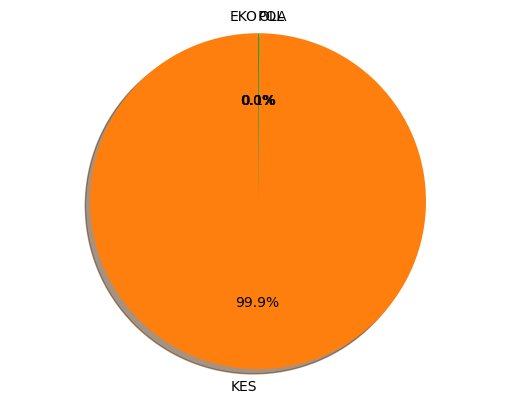

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'6 cara agar tidak burnout kelelahan mental karena bekerja'

19/19 [==============================] - 0s 3ms/step


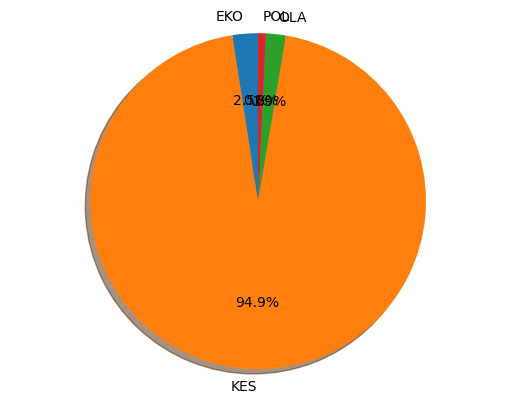

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'5 penyebab demensia sesuai jenisnya tak hanya usia'

19/19 [==============================] - 0s 4ms/step


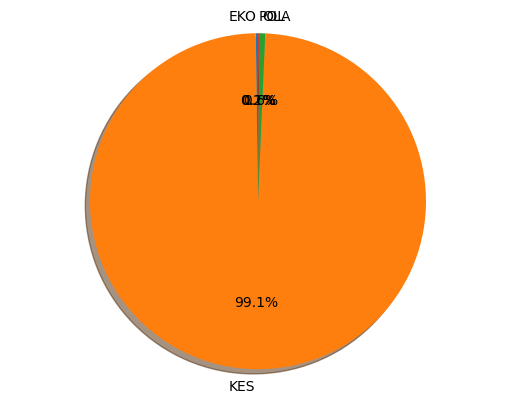

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'6 manfaat buah salak meningkatkan energi dan kesehatan mata'

19/19 [==============================] - 0s 4ms/step


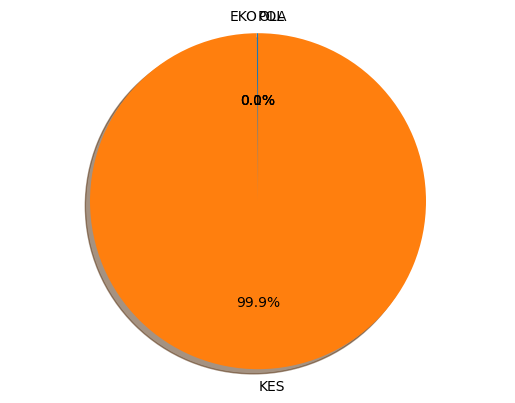

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'berapa kebutuhan air putih ibu hamil'

19/19 [==============================] - 0s 3ms/step


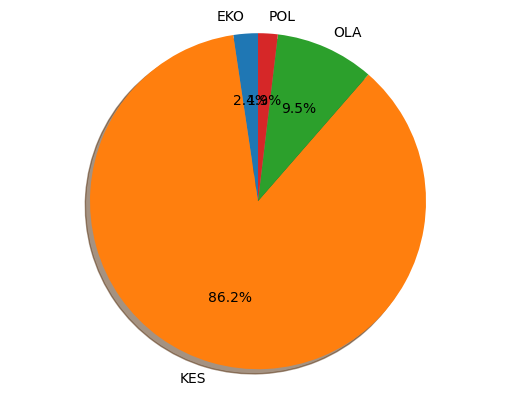

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'apakah burnout dan stres sama berikut 3 perbedaannya'

19/19 [==============================] - 0s 2ms/step


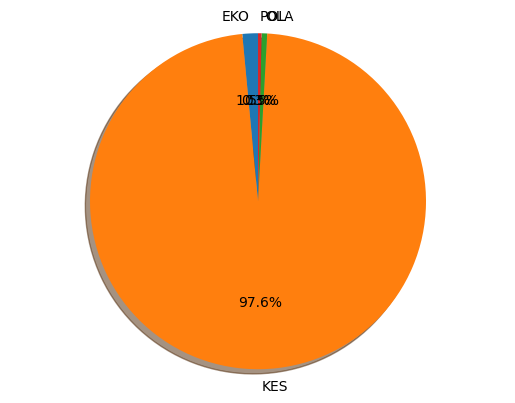

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'ketahui panduan makan untuk mengontrol gula darah'

19/19 [==============================] - 0s 4ms/step


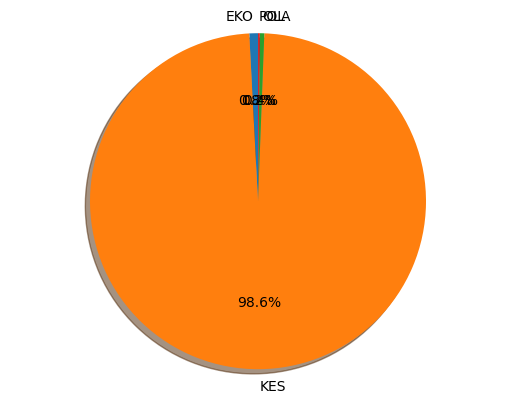

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'6 penyebab gigi retak dan cara mengatasinya'

19/19 [==============================] - 0s 3ms/step


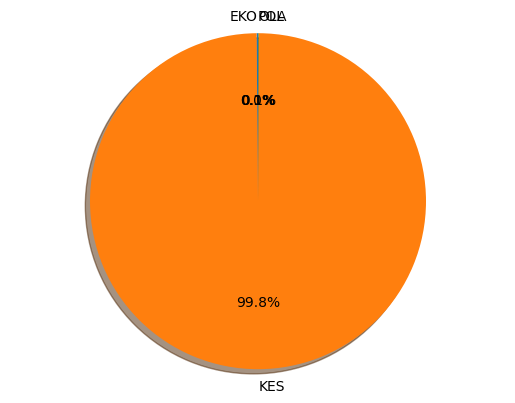

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'11 dampak insomnia bagi kesehatan yang perlu diwaspadai'

19/19 [==============================] - 0s 3ms/step


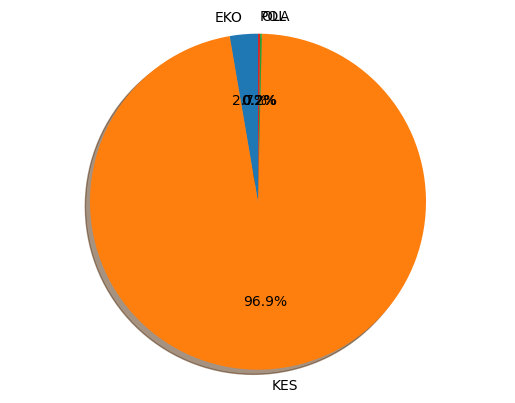

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'12 obat alami untuk meriang dari kunyit hingga sup ayam'

19/19 [==============================] - 0s 3ms/step


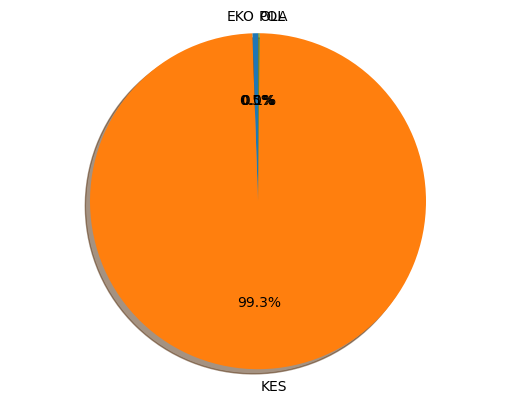

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'ketahui nutrisi tepat saat sahur agar tidak lemas selama puasa'

19/19 [==============================] - 0s 3ms/step


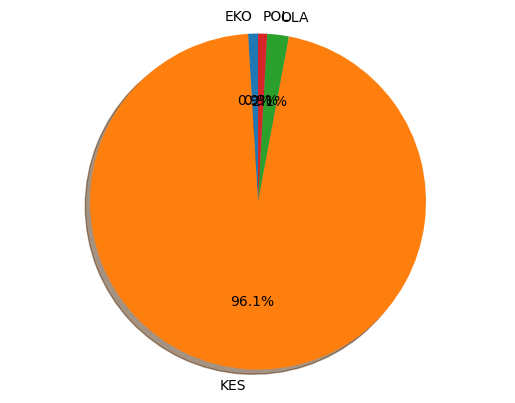

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'apakah ibu hamil boleh minum kombucha'

19/19 [==============================] - 0s 3ms/step


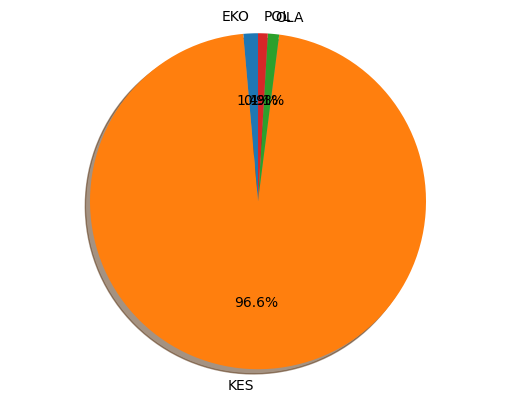

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'alasan bayi lebih aman gunakan physical sunscreen'

19/19 [==============================] - 0s 3ms/step


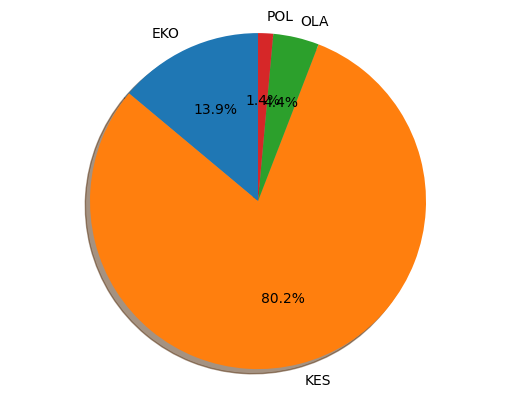

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'bolehkah remaja lakukan perawatan kulit di klinik'

19/19 [==============================] - 0s 3ms/step


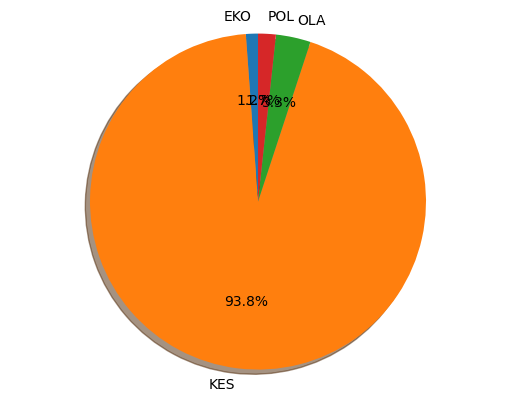

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'kenali apa itu malaise penyebab dan tandatandanya'

19/19 [==============================] - 0s 4ms/step


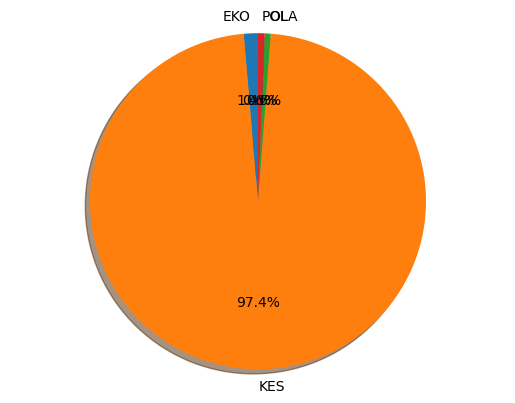

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'5 manfaat makan ikan kembung yang punya gizi tak kalah dari salmon'

19/19 [==============================] - 0s 3ms/step


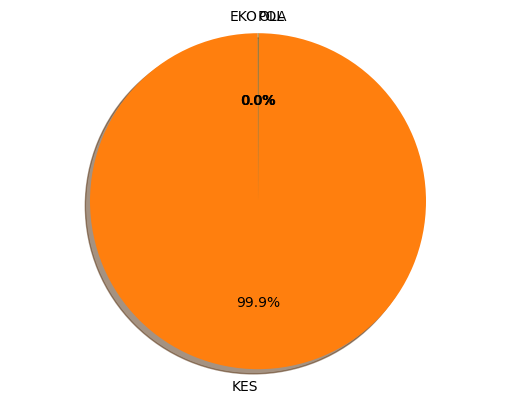

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'mengapa kecemasan memicu sesak napas'

19/19 [==============================] - 0s 4ms/step


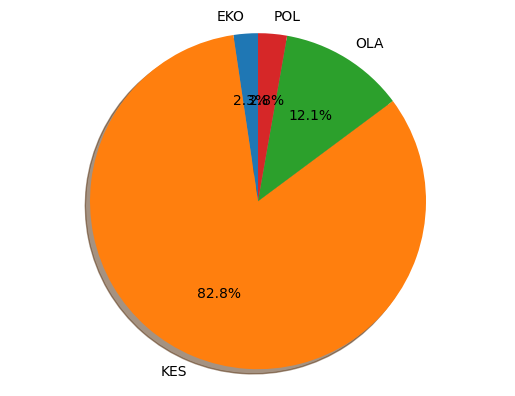

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'8 tandatanda kanker ginjal stadium 1 yang perlu diwaspadai'

19/19 [==============================] - 0s 4ms/step


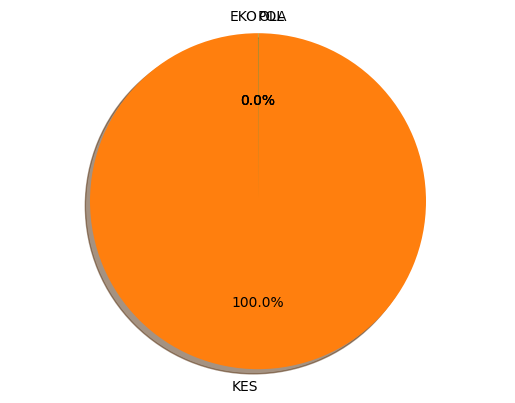

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'4 cara meredakan sakit kepala tanpa obat'

19/19 [==============================] - 0s 5ms/step


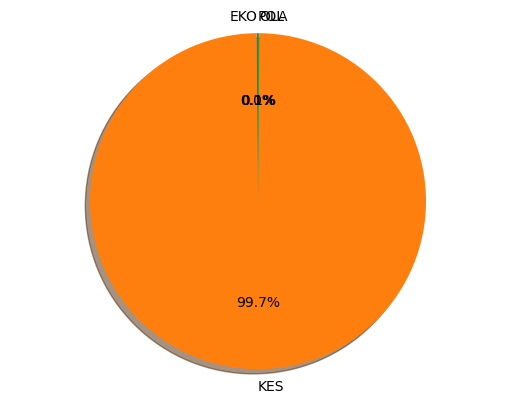

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'mengenal apa itu hoarding disorder penyebab dan cara mengatasinya'

19/19 [==============================] - 0s 3ms/step


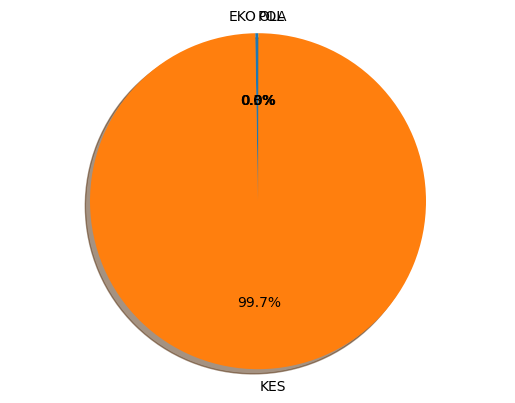

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'8 manfaat sayur pakcoy mencegah kanker dan penyakit kronis lain'

19/19 [==============================] - 0s 3ms/step


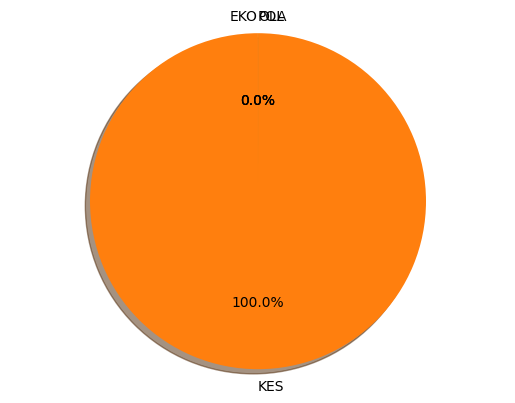

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'6 penyebab gigi patah dan cara mengatasinya'

19/19 [==============================] - 0s 4ms/step


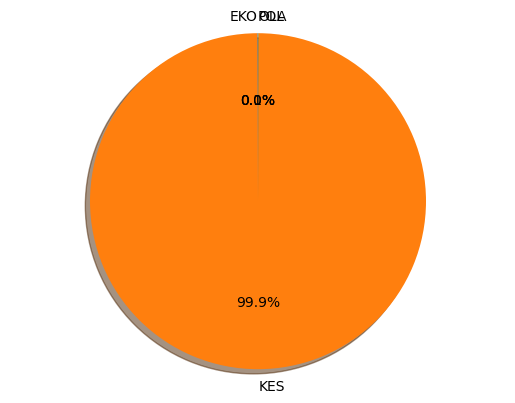

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'6 cara mengatasi mata merah dan gatal secara alami'

19/19 [==============================] - 0s 3ms/step


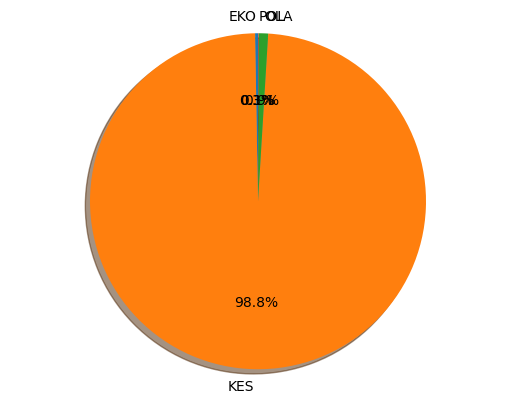

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'kenali obat antibiotik kegunaan jenis dan efek sampingnya'

19/19 [==============================] - 0s 3ms/step


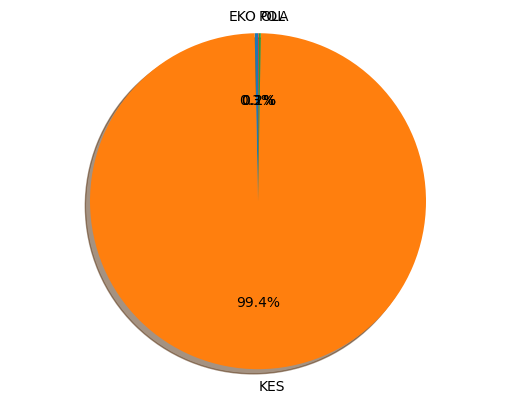

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'anak terkena penyakit jantung rematik makanan apa yang perlu dihindari'

19/19 [==============================] - 0s 3ms/step


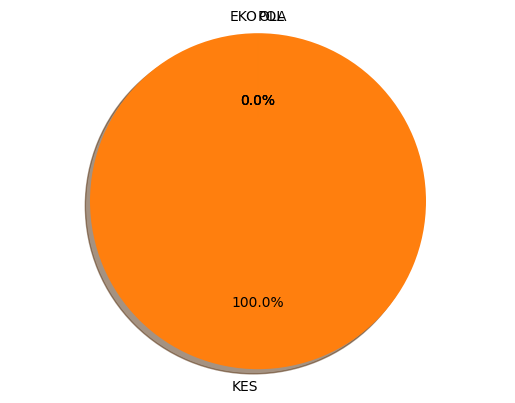

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'4 manfaat mengejutkan mendengarkan musik metal untuk kesehatan mental'

19/19 [==============================] - 0s 3ms/step


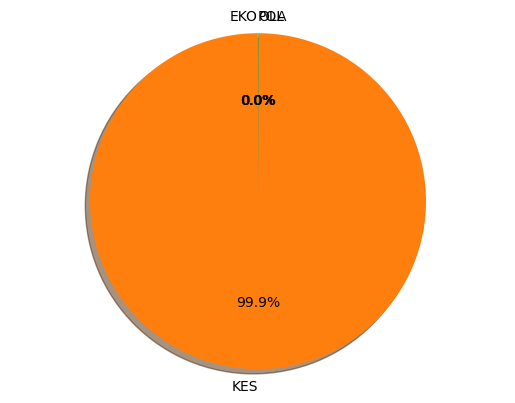

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'apa itu penyakit jantung rematik kenali penyebab hingga pencegahannya'

19/19 [==============================] - 0s 3ms/step


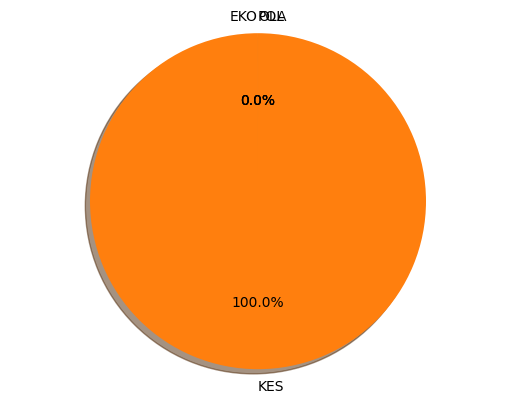

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'meski enak ini bahaya mengonsumsi makanan terlalu pedas'

19/19 [==============================] - 0s 4ms/step


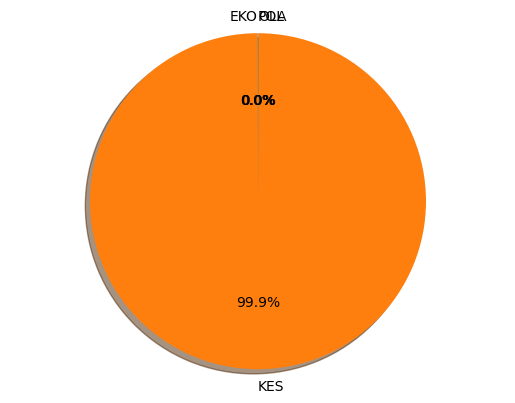

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'4 efek tidur dengan kipas angin semalaman untuk kesehatan'

19/19 [==============================] - 0s 4ms/step


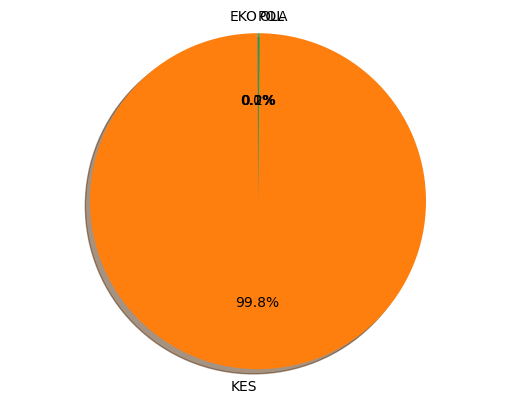

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'kenali apa itu ispa penyebab dan tandatanda'

19/19 [==============================] - 0s 3ms/step


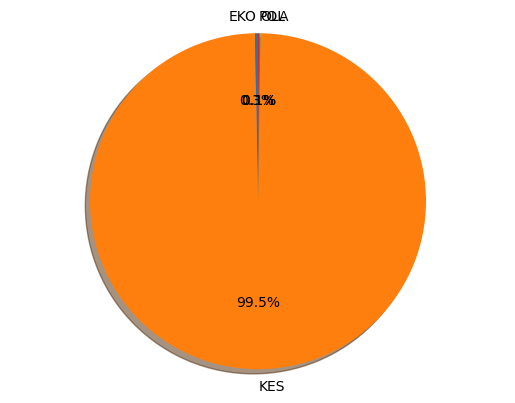

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'mengapa penderita demensia mudah marah kenali 4 penyebabnya'

19/19 [==============================] - 0s 3ms/step


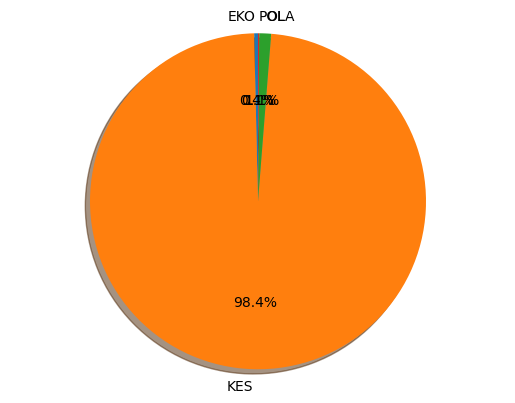

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'3 dampak buruk emotional eating dan cara mengatasinya'

19/19 [==============================] - 0s 3ms/step


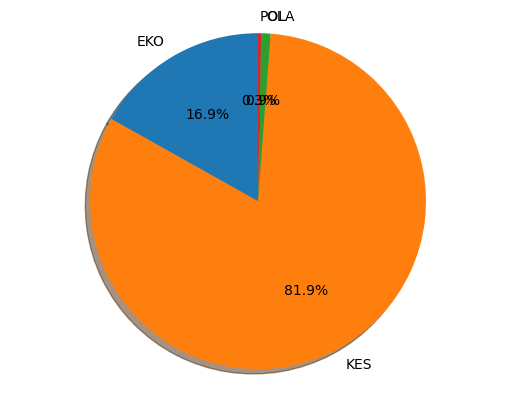

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'8 penyebab mata merah dan cara mengatasinya'

19/19 [==============================] - 0s 4ms/step


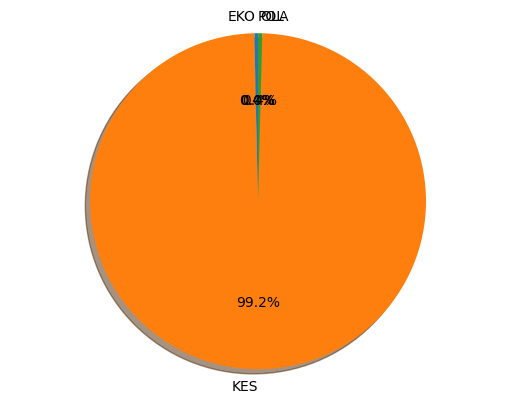

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'6 kebiasaan yang menyebabkan gula darah tinggi pantang disepelekan'

19/19 [==============================] - 0s 3ms/step


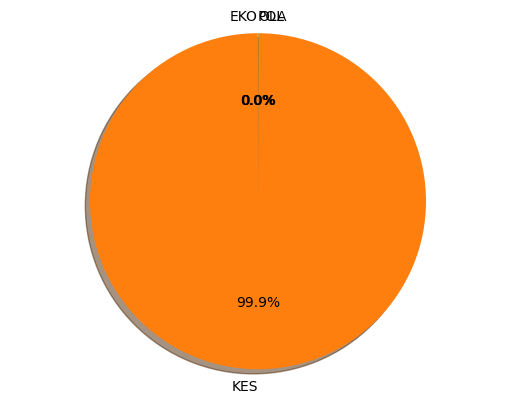

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'11 gejala awal demensia yang perlu diwaspadai'

19/19 [==============================] - 0s 4ms/step


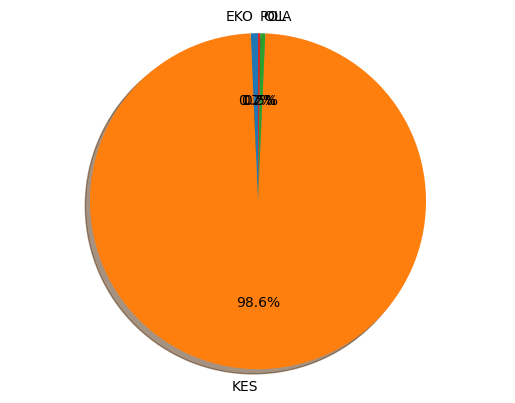

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'6 penyebab gigi renggang dan cara mengatasinya'

19/19 [==============================] - 0s 3ms/step


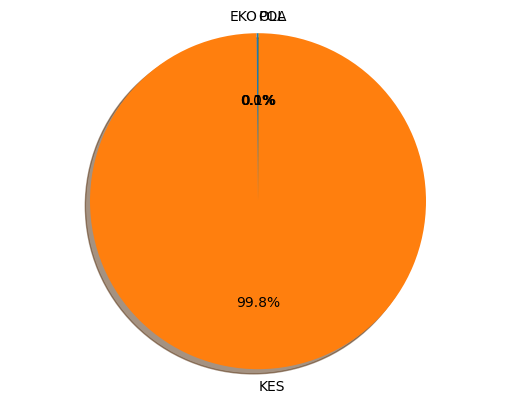

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'kenali perawatan asma berdasarkan zonanya'

19/19 [==============================] - 0s 4ms/step


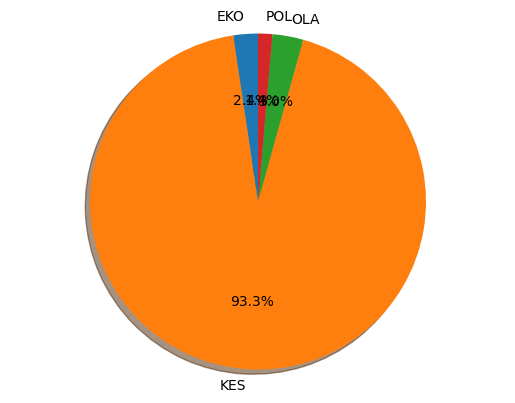

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'8 gejala diabetes yang tak biasa dari kesemutan hingga sakit mata'

19/19 [==============================] - 0s 3ms/step


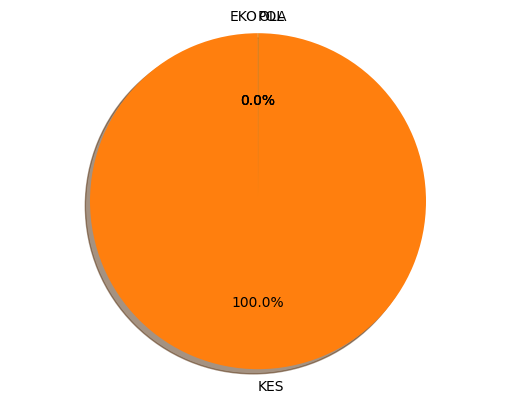

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'muda dan rajin olahraga juga bisa stroke apa sebabnya'

19/19 [==============================] - 0s 3ms/step


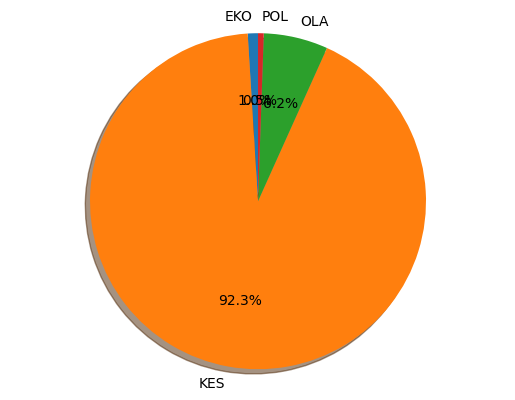

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'tandatanda asma yang perlu diperhatikan'

19/19 [==============================] - 0s 3ms/step


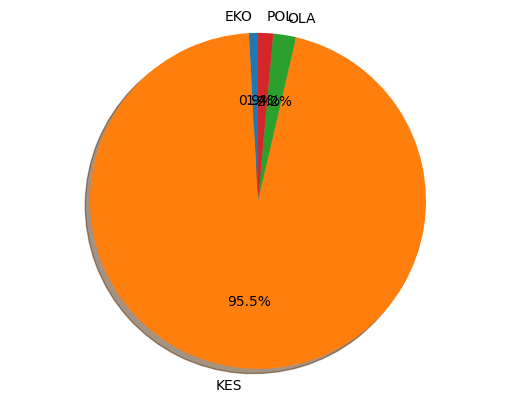

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'kenali apa itu asma penyebab dan tandatandanya'

19/19 [==============================] - 0s 4ms/step


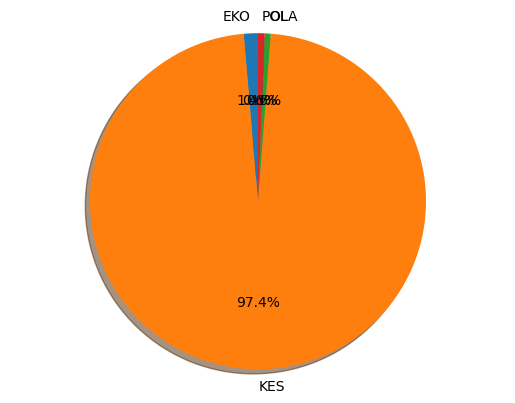

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'waspada tidur tidak teratur bisa jadi faktor penyebab aterosklerosis'

19/19 [==============================] - 0s 3ms/step


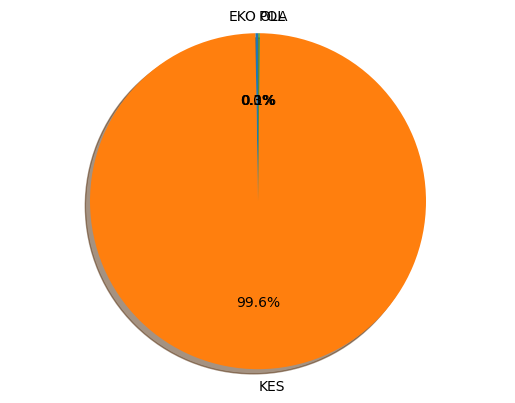

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'8 penyebab mimisan saat hamil dan cara menghentikan perdarahannya'

19/19 [==============================] - 0s 3ms/step


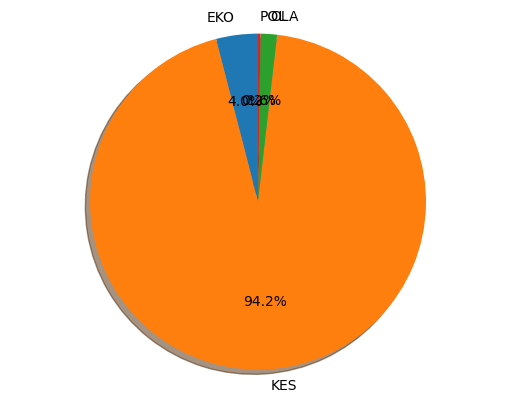

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'5 pemicu gula darah tinggi yang tak terduga termasuk kopi'

19/19 [==============================] - 0s 3ms/step


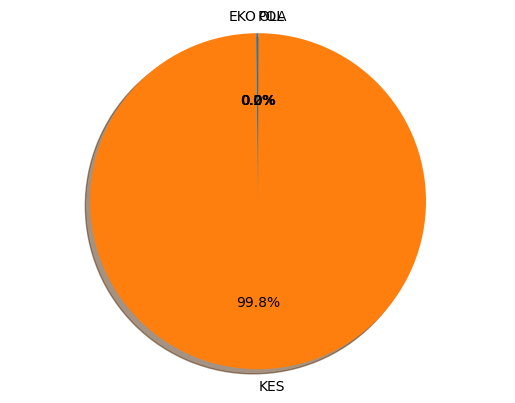

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'tenggorokan kering saat bangun tidur bisa jadi ini penyebabnya'

19/19 [==============================] - 0s 3ms/step


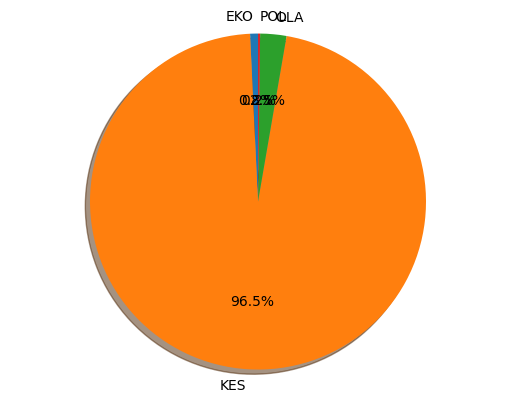

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'potensi pengobatan baru covid19 untuk cegah sakit parah'

19/19 [==============================] - 0s 3ms/step


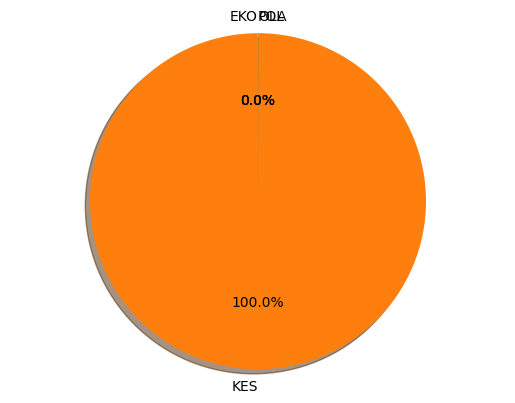

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'kenali apa itu fomo penyebab dan dampaknya pada kesehatan mental'

19/19 [==============================] - 0s 3ms/step


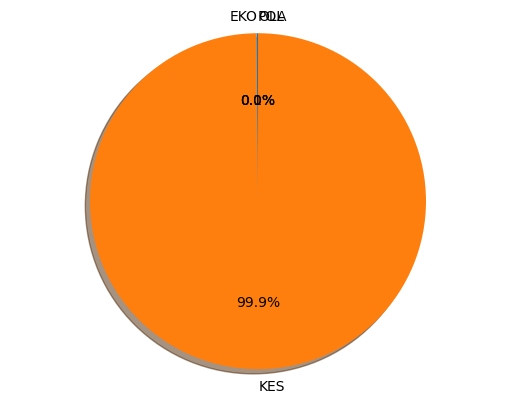

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'kenali apa itu obat sidiadryl injeksi kegunaan dan efek sampingnya'

19/19 [==============================] - 0s 3ms/step


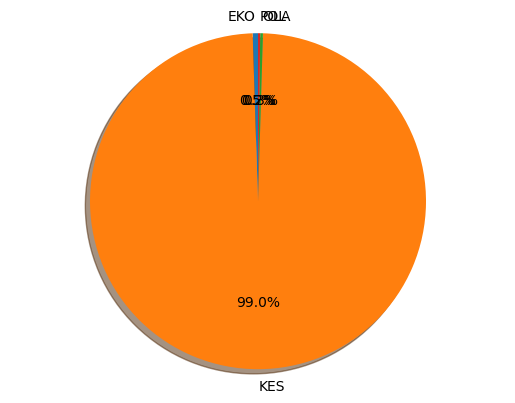

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'9 penyebab bayi berkeringat saat tidur kapan perlu ke dokter'

19/19 [==============================] - 0s 4ms/step


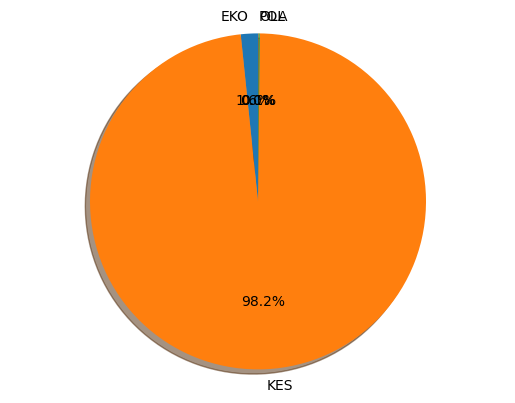

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'10 makanan yang perlu dihindari penderita gangguan pernapasan'

19/19 [==============================] - 0s 4ms/step


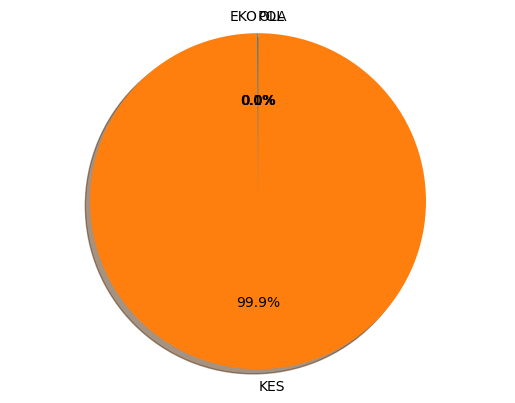

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'mengenal manfaat minum air dingin dan efek sampingnya untuk kesehatan'

19/19 [==============================] - 0s 3ms/step


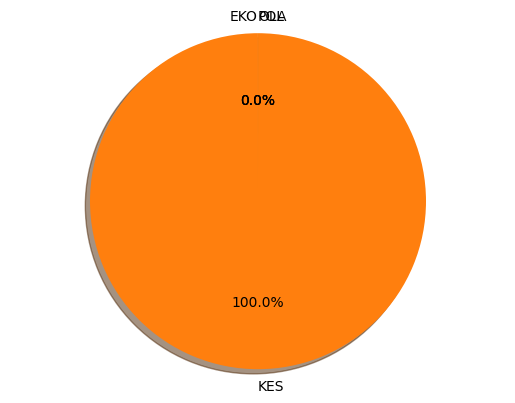

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'11 penyebab gigi tidak rata dan cara mengatasinya'

19/19 [==============================] - 0s 3ms/step


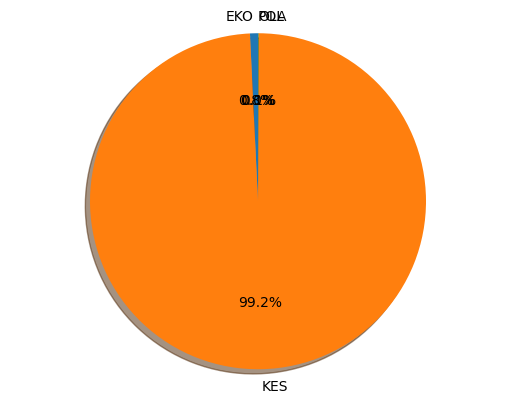

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'kenali apa itu gula darah tinggi dari gejala hingga pencegahannya'

19/19 [==============================] - 0s 3ms/step


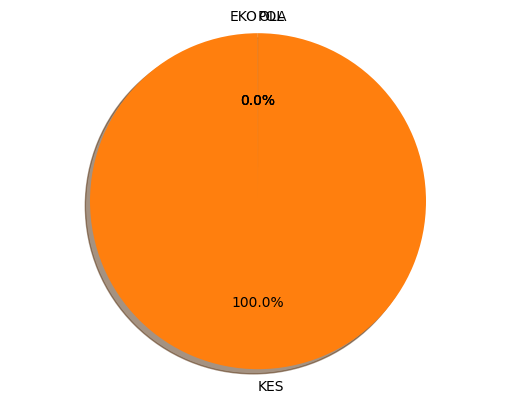

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'15 tandatanda penyakit ginjal kronis stadium akhir pantang diabaikan'

19/19 [==============================] - 0s 3ms/step


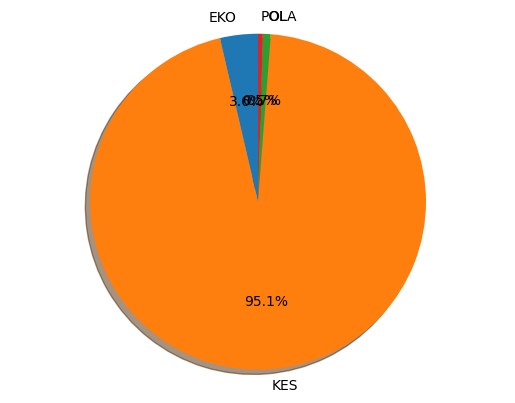

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'kenapa uban tidak boleh dicabut berikut 2 efek sampingnya'

19/19 [==============================] - 0s 4ms/step


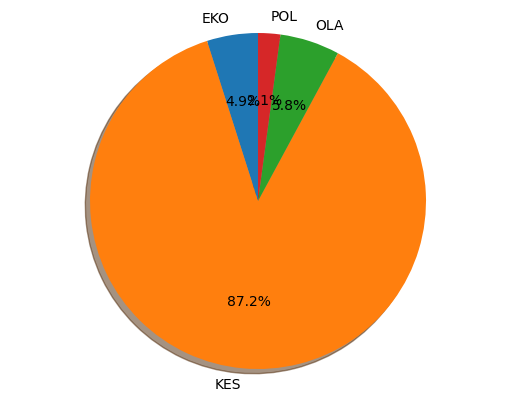

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'10 penyebab mata terasa perih dan cara mengatasinya'

19/19 [==============================] - 0s 4ms/step


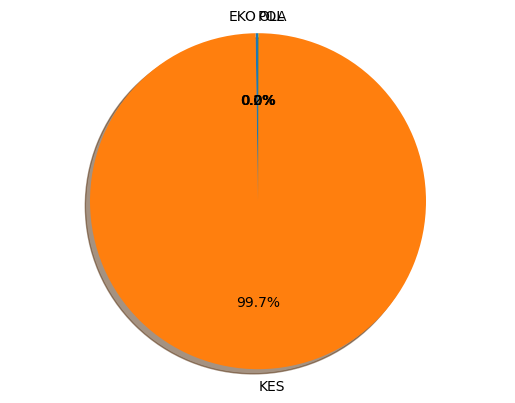

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'tips mencegah bahaya abu vulkanik untuk kesehatan'

19/19 [==============================] - 0s 4ms/step


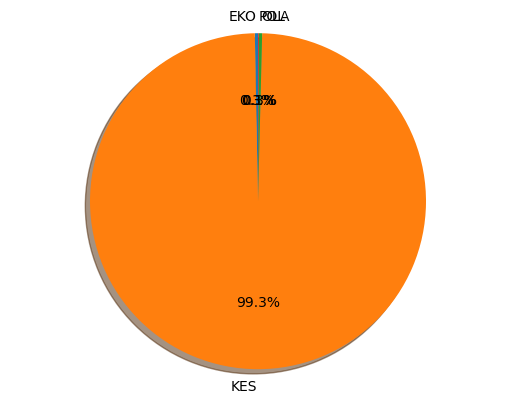

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'7 makanan dan minuman untuk bantu agar cepat tidur di malam hari'

19/19 [==============================] - 0s 3ms/step


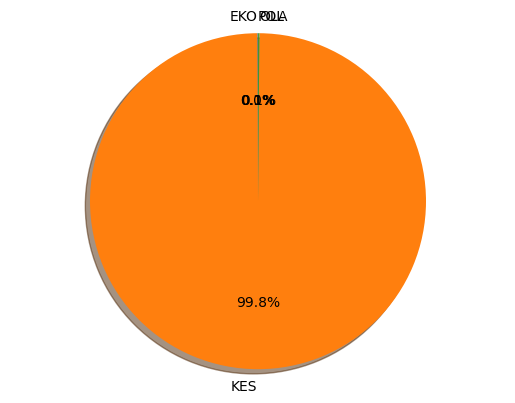

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'4 bahaya abu vulkanik untuk kesehatan yang harus diwaspadai'

19/19 [==============================] - 0s 3ms/step


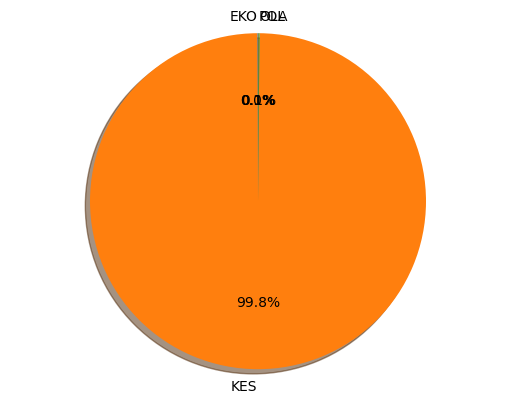

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'apakah radang otak bisa sembuh'

19/19 [==============================] - 0s 3ms/step


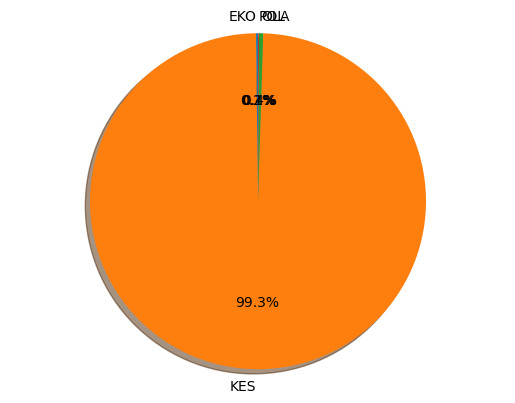

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'peningkatan kasus diabetes anak terkait tingginya konsumsi gula'

19/19 [==============================] - 0s 4ms/step


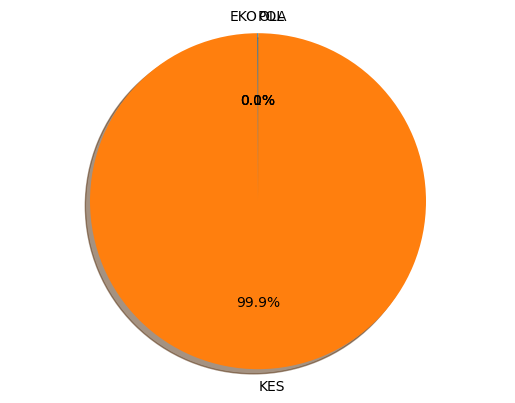

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'8 efek kerja tanpa libur untuk kesehatan mental dan fisik'

19/19 [==============================] - 0s 3ms/step


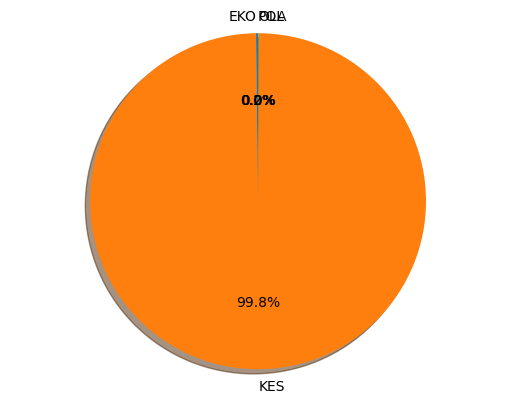

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'jaga tekanan darah normal dengan pola makan'

19/19 [==============================] - 0s 3ms/step


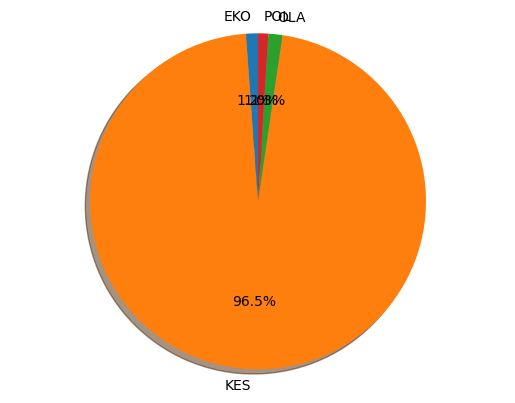

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'8 cara mengatasi burnout kelelahan mental dan fisik karena pekerjaan'

19/19 [==============================] - 0s 4ms/step


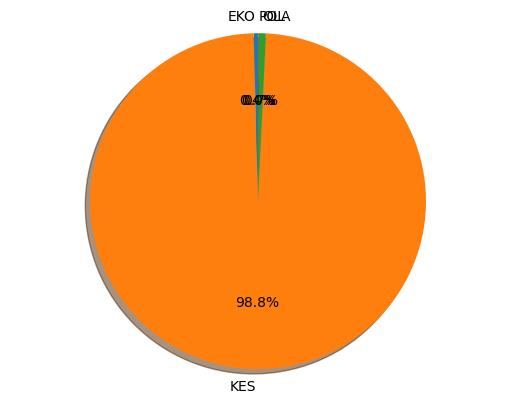

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'gampang berkeringat saat beraktivitas waspadai gejala hiperhidrosis'

19/19 [==============================] - 0s 4ms/step


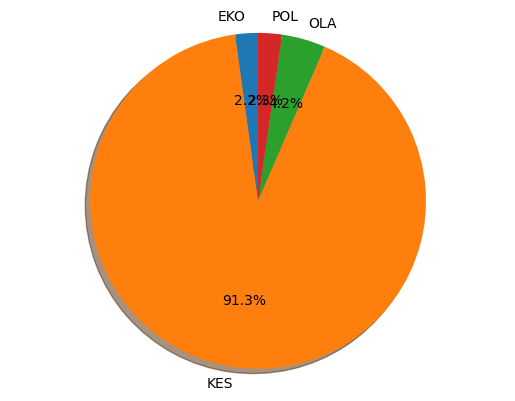

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'berapa kadar trigliserida normal di dalam darah'

19/19 [==============================] - 0s 4ms/step


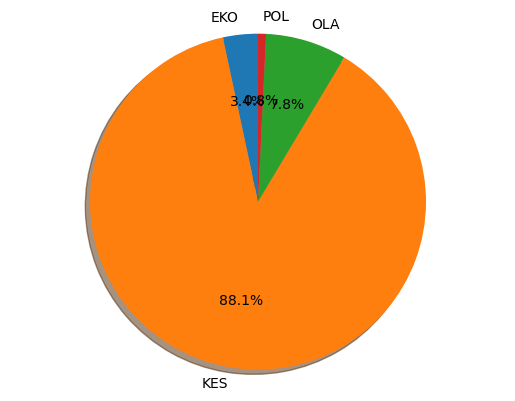

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'tandatanda radang otak yang harus diwaspadai'

19/19 [==============================] - 0s 4ms/step


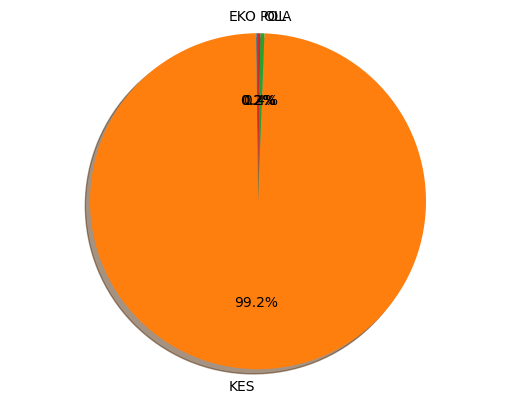

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'laga terakhir greysia polii'

19/19 [==============================] - 0s 3ms/step


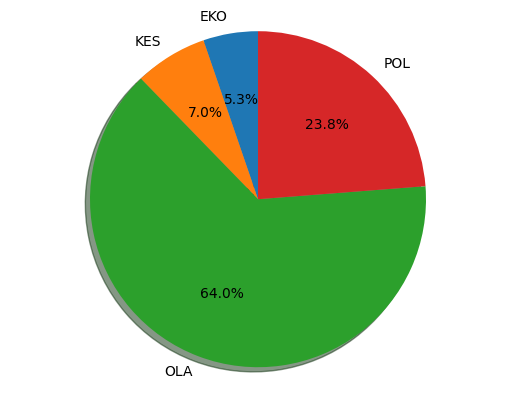

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'tangis greysia polii saat pamit'

19/19 [==============================] - 0s 3ms/step


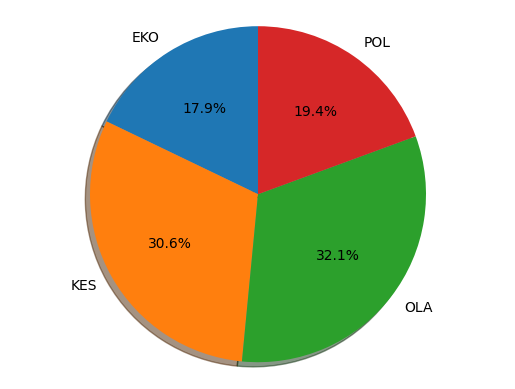

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'selebrasi fajarrian melenggang ke final usai kalahkan china'

19/19 [==============================] - 0s 3ms/step


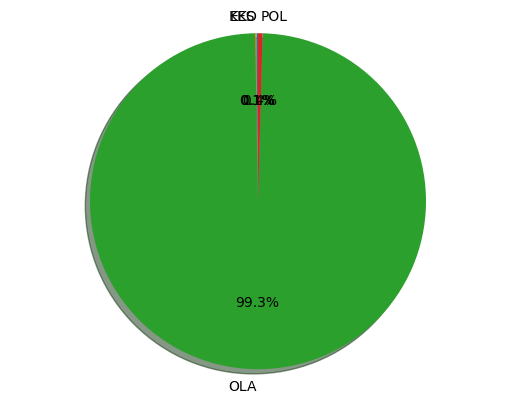

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'reaksi kevinmarcus usai kandas oleh pebulu tangkis china'

19/19 [==============================] - 0s 4ms/step


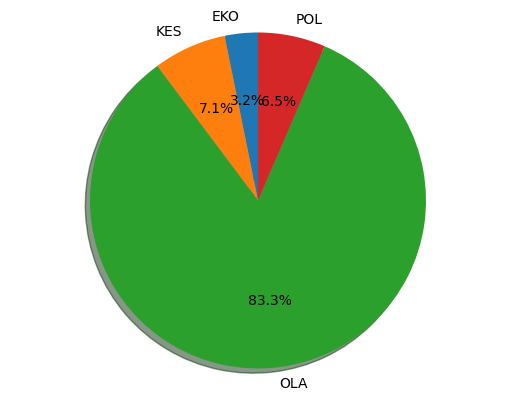

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'ekspresi anthony ginting gagal melaju ke final indonesia masters'

19/19 [==============================] - 0s 3ms/step


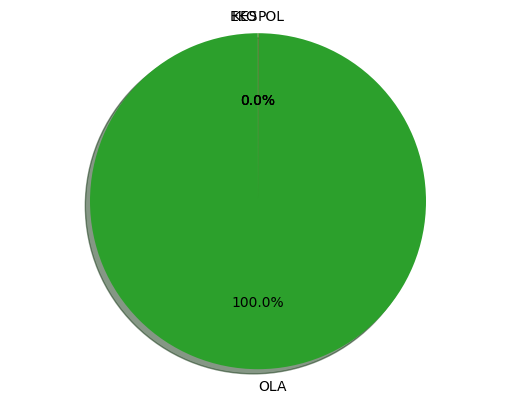

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'senyum apriyanifadia seusai tembus final indonesia masters 2022'

19/19 [==============================] - 0s 3ms/step


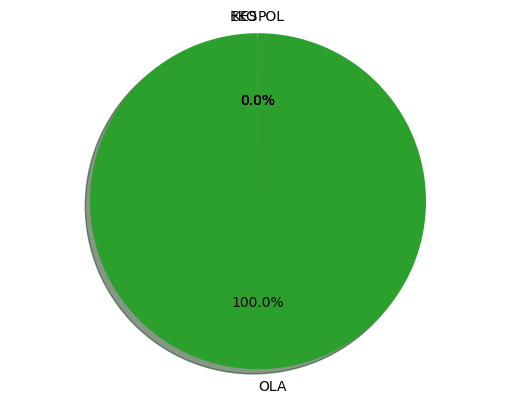

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'aksi fajarrian tumbangkan wakil china taipei di indonesia masters'

19/19 [==============================] - 0s 3ms/step


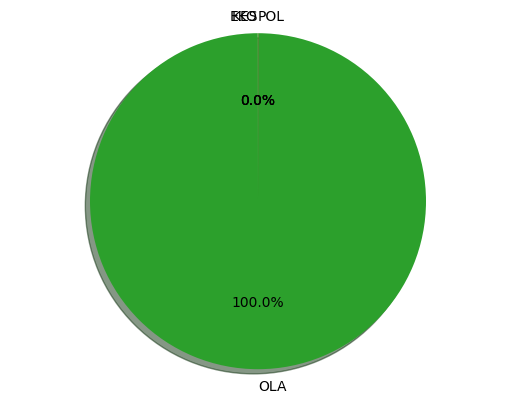

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'bekuk wakil korea apriyanifadia melenggang ke semifinal indonesia masters'

19/19 [==============================] - 0s 3ms/step


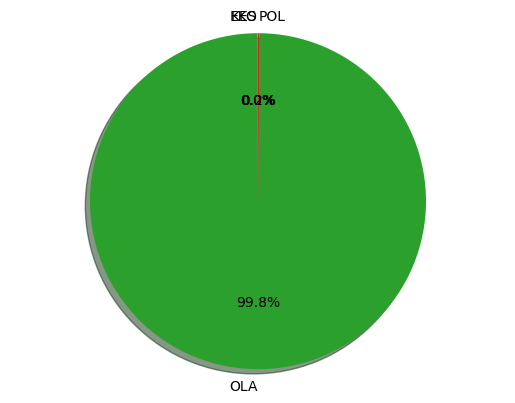

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'anthony ginting melaju ke semifinal indonesia masters 2022'

19/19 [==============================] - 0s 3ms/step


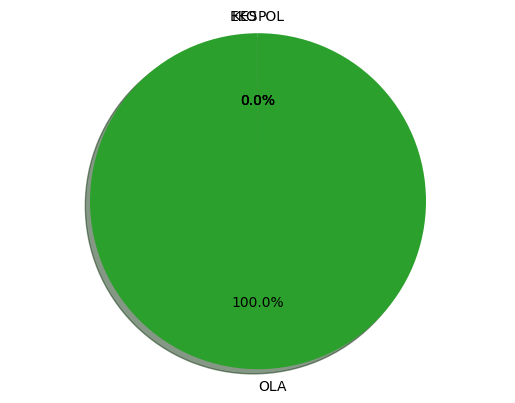

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'22 pembalap siap bersaing di formula e jakarta'

19/19 [==============================] - 0s 3ms/step


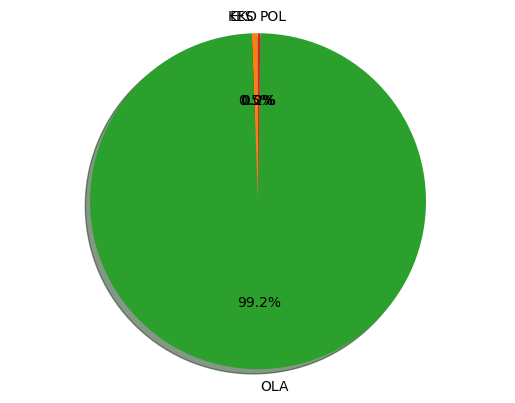

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'aksi rahmat erwin abdullah raih emas dan pecahkan rekor sea games'

19/19 [==============================] - 0s 4ms/step


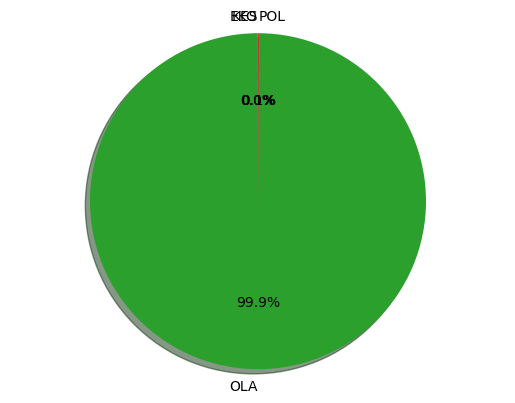

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'mohammad yasin raih medali perak sea games 2021'

19/19 [==============================] - 0s 4ms/step


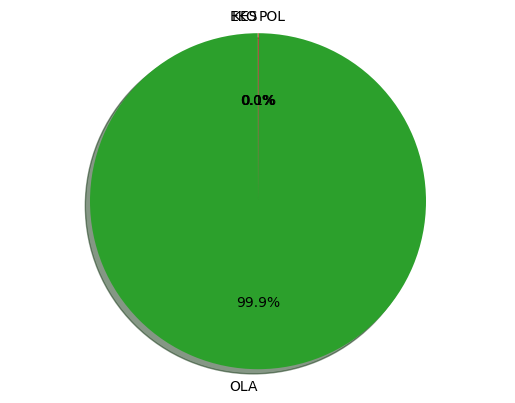

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'lifter papua natasya beteyob sumbangkan perunggu sea games untuk indonesia'

19/19 [==============================] - 0s 4ms/step


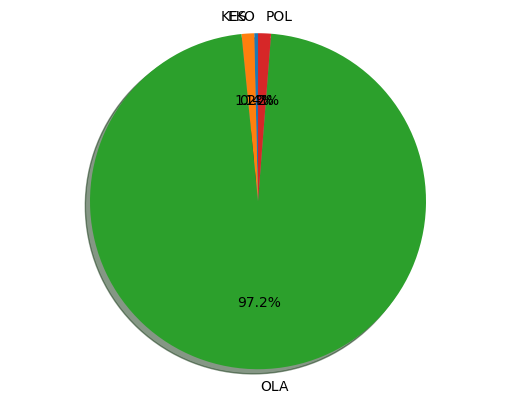

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'aksi eko yuli irawan raih medali emas sea games 2021'

19/19 [==============================] - 0s 3ms/step


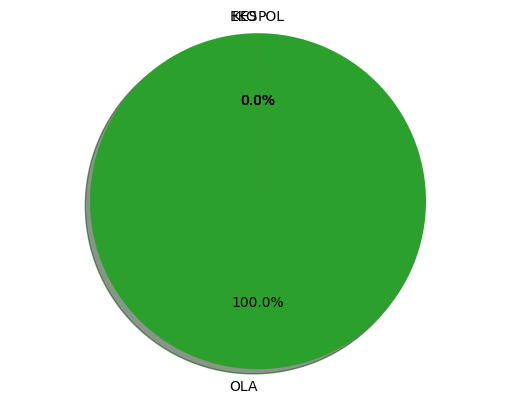

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'pembalap banyak terjatuh enea bastianini juara motogp prancis'

19/19 [==============================] - 0s 3ms/step


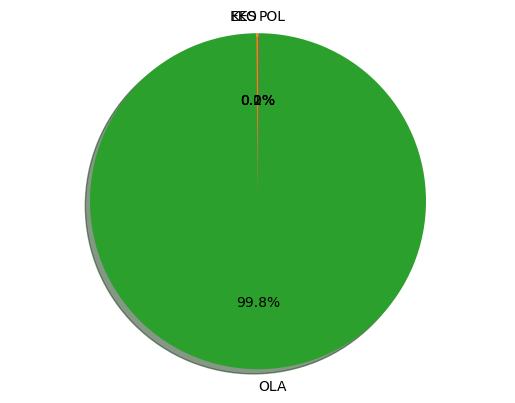

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'pln mobile proliga 2022 bogor lavani cetak sejarah bandung bjb tandamata juara lagi'

19/19 [==============================] - 0s 4ms/step


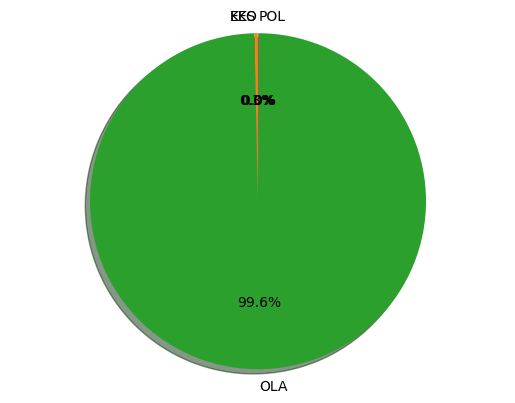

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'terkesan begini testimoni pengguna xl saat nonton motogp mandalika'

19/19 [==============================] - 0s 4ms/step


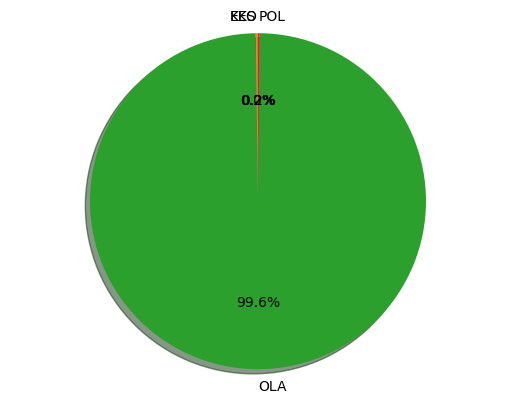

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'3 warna ban mobil formula 1 jadi strategi seru yang disajikan racing team'

19/19 [==============================] - 0s 4ms/step


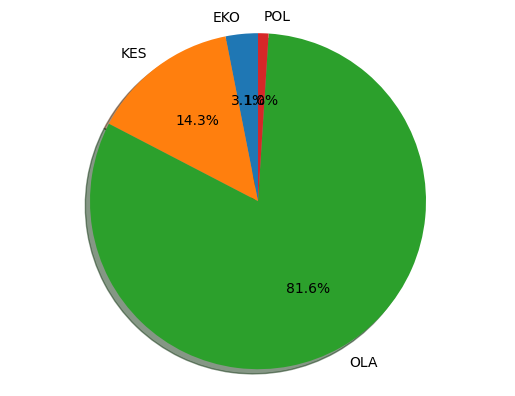

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'bukan asal ngegas ini 3 keseruan yang tersaji di sirkuit formula 1'

19/19 [==============================] - 0s 4ms/step


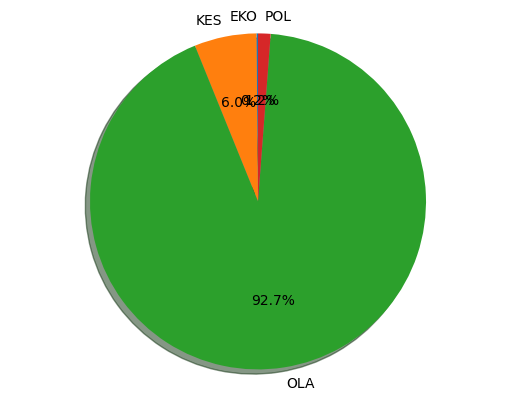

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'mengenal tugas dan fungsi marshal di ajang balap motogp'

19/19 [==============================] - 0s 3ms/step


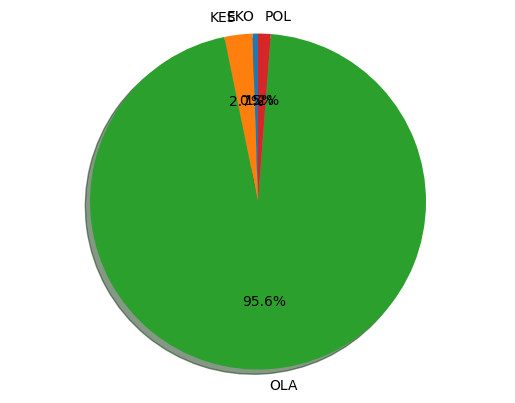

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'tempati janji aleix espargaro lempar helm ke tribun penonton'

19/19 [==============================] - 0s 3ms/step


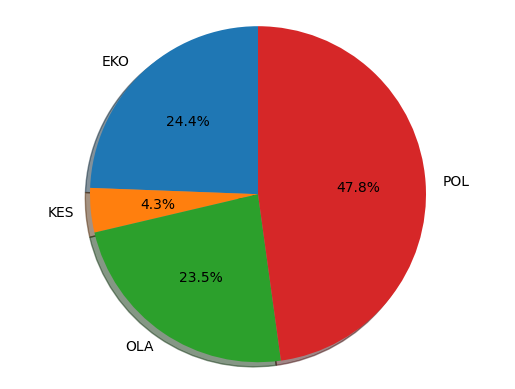

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'senyum kemenangan pembalap motogp di sirkuit mandalika'

19/19 [==============================] - 0s 3ms/step


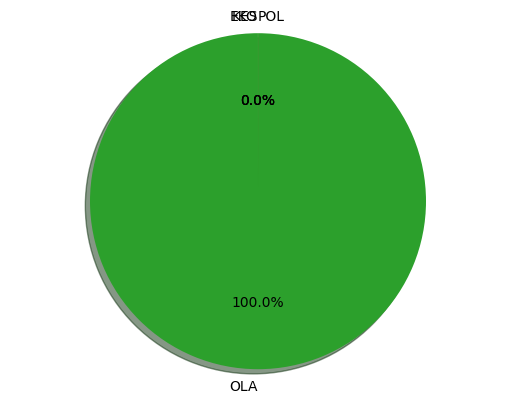

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'xl axiata hadirkan game simulator motogp di booth sirkuit mandalika seperti apa'

19/19 [==============================] - 0s 3ms/step


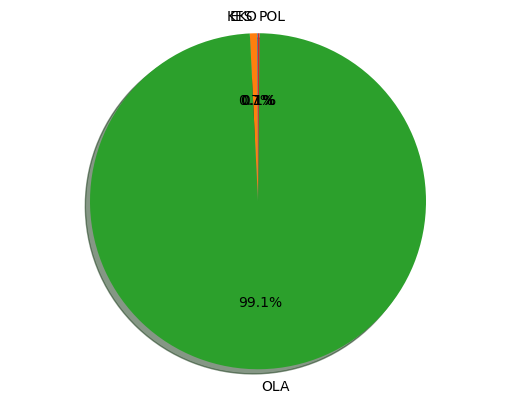

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'gaya jokowi turun ke lintasan motogp saat hujan mengguyur sirkuit mandalika'

19/19 [==============================] - 0s 4ms/step


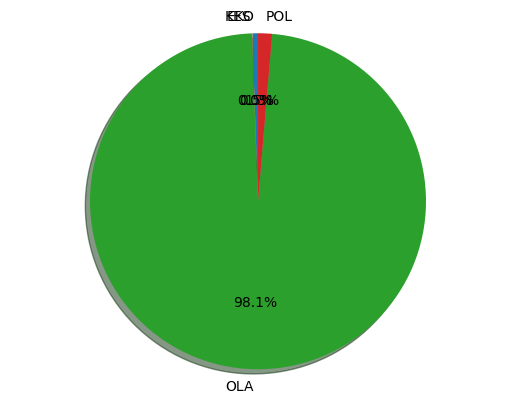

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'aksi pembalap motogp bersaing ketat di lintasan basah sirkuit mandalika'

19/19 [==============================] - 0s 5ms/step


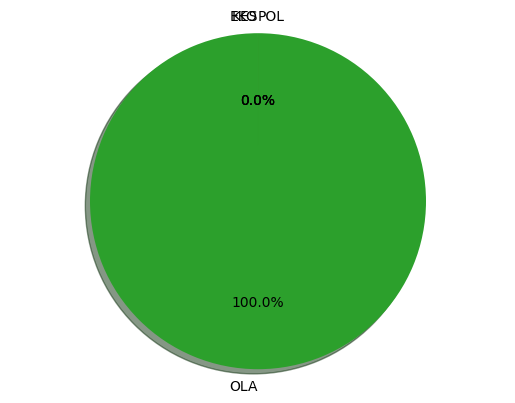

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'miguel oliveira dedikasikan kemenangan motogp mandalika untuk risman ini sosoknya'

19/19 [==============================] - 0s 4ms/step


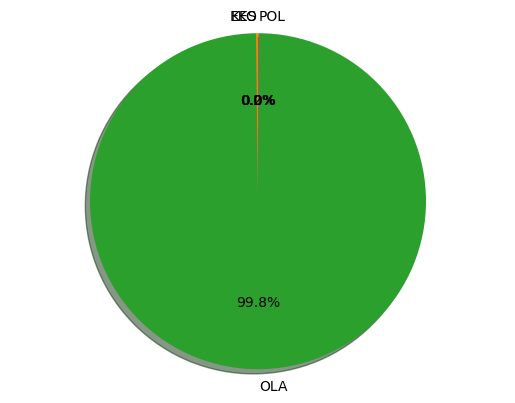

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'momen jokowi saat serahkan piala untuk juara motogp mandalika'

19/19 [==============================] - 0s 4ms/step


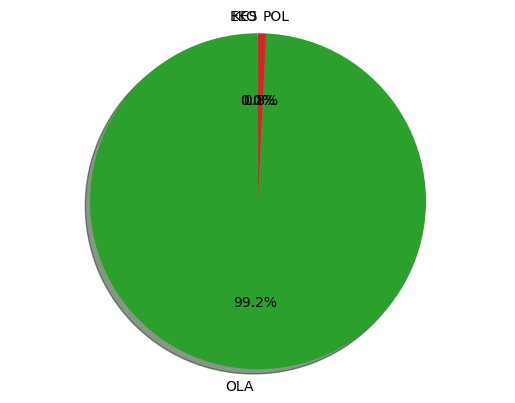

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'aksi pawang hujan curi perhatian di gelaran motogp mandalika'

19/19 [==============================] - 0s 3ms/step


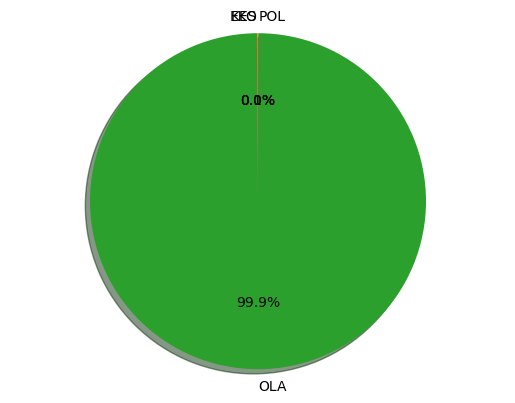

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'miguel oliveira berhasil jadi pemenang perdana motogp mandalika'

19/19 [==============================] - 0s 3ms/step


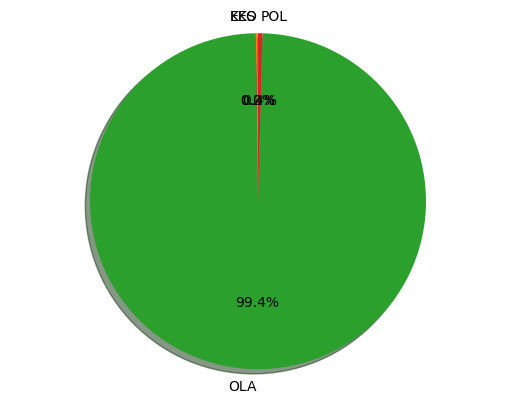

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'pembalap moto2 thailand juara di sirkuit mandalika'

19/19 [==============================] - 0s 3ms/step


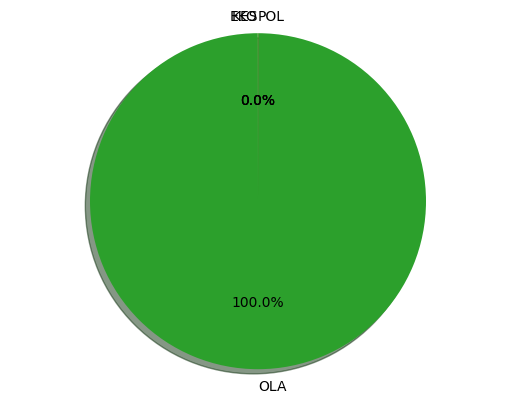

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'sirkuit mandalika diterpa hujan deras start motogp ditunda'

19/19 [==============================] - 0s 4ms/step


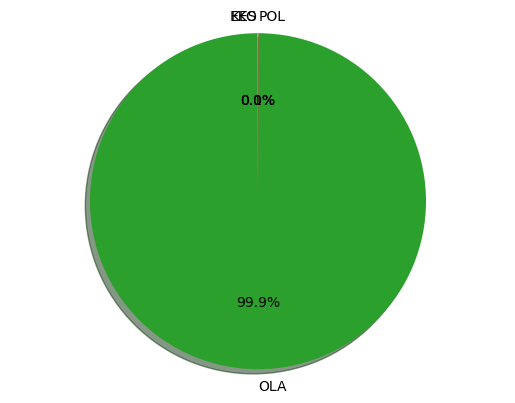

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'breaking news marc marquez gegar otak tak turun balap motogp mandalika'

19/19 [==============================] - 0s 4ms/step


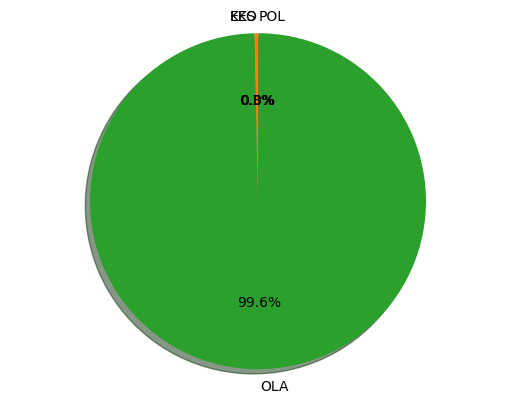

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'hasil moto3 gp mandalika dennis foggia menang mario aji raih poin perdana'

19/19 [==============================] - 0s 4ms/step


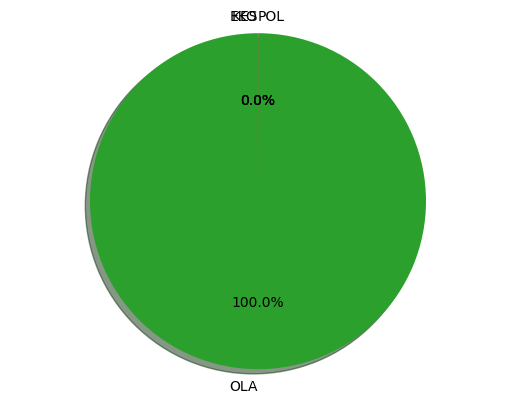

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'marc marquez alami insiden parah di sesi pemanasan dilarikan ke rumah sakit'

19/19 [==============================] - 0s 3ms/step


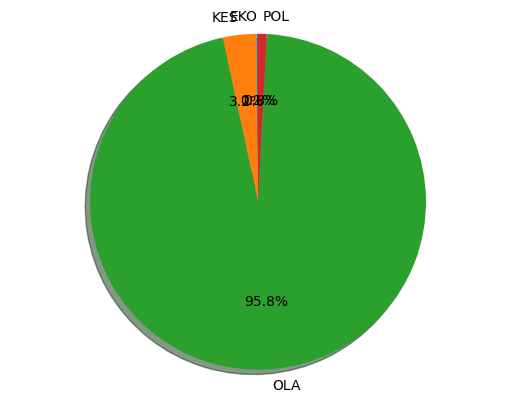

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'marc marquez jatuh di sesi pemanasan motogp mandalika quartararo tercepat'

19/19 [==============================] - 0s 3ms/step


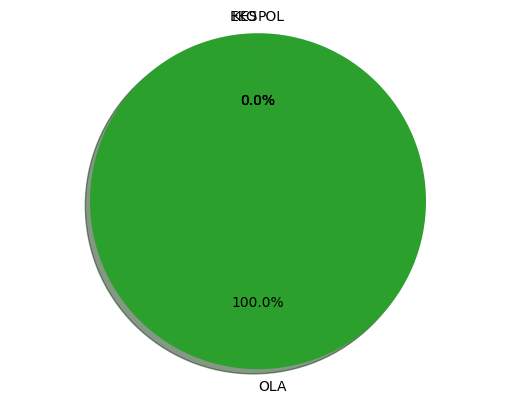

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'kesibukan pit lane sirkuit mandalika di sesi pemanasan motogp'

19/19 [==============================] - 0s 3ms/step


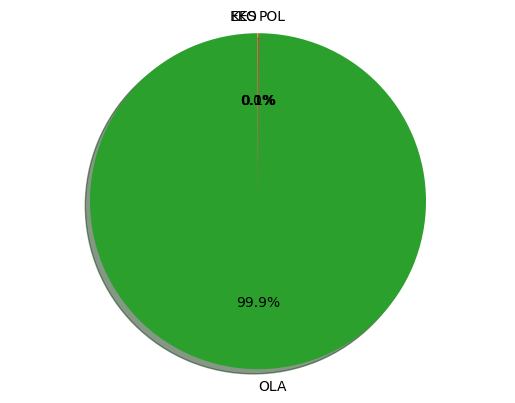

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'motogp mandalika quartararo tercepat di latihan bebas kedua marquez jatuh'

19/19 [==============================] - 0s 3ms/step


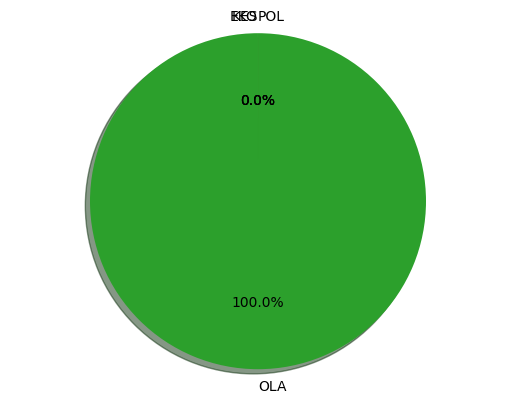

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'motogp mandalika suhu panas lombok jadi tantangan besar pembalap'

19/19 [==============================] - 0s 3ms/step


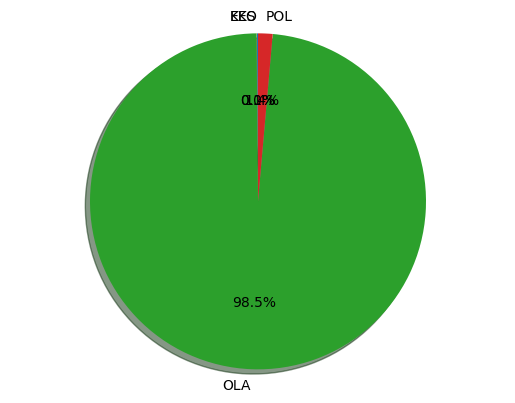

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'mandalika berlumpur saat fp1 moto3 petugas langsung bersihkan lintasan'

19/19 [==============================] - 0s 4ms/step


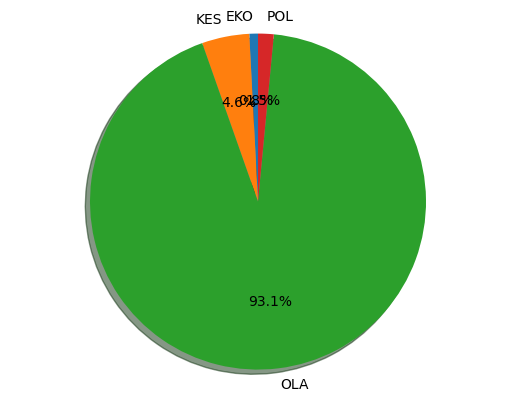

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'motogp mandalika pol espargaro pimpin sesi latihan bebas 1'

19/19 [==============================] - 0s 3ms/step


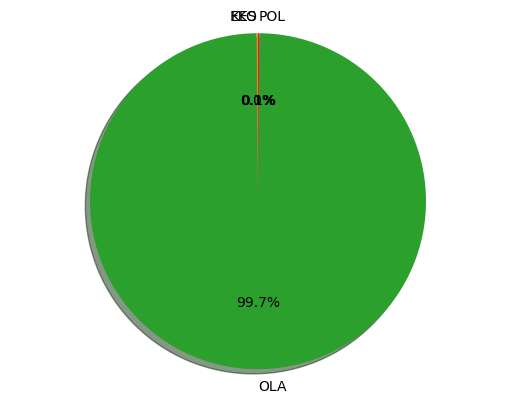

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'momen jokowi salam kepal dengan pembalap motogp'

19/19 [==============================] - 0s 4ms/step


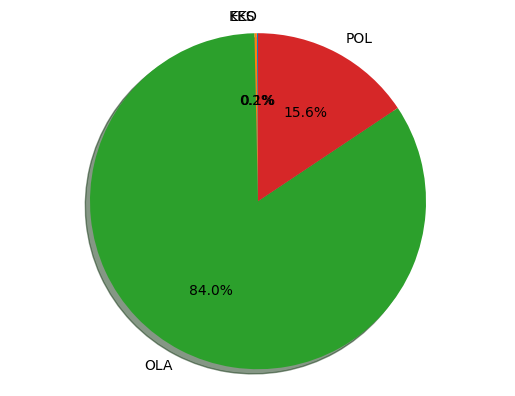

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'mau nonton langsung motogp mandalika baca alur masuknya agar tak tersesat'

19/19 [==============================] - 0s 4ms/step


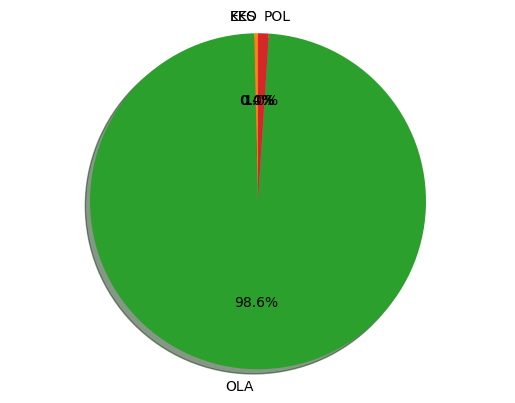

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'ini putra bangsa yang turun gelaran balap motogp mandalika 2022'

19/19 [==============================] - 0s 3ms/step


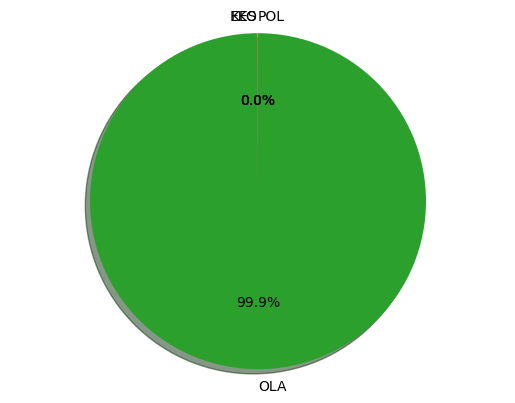

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'jadwal lengkap motogp mandalika 1820 maret 2022'

19/19 [==============================] - 0s 4ms/step


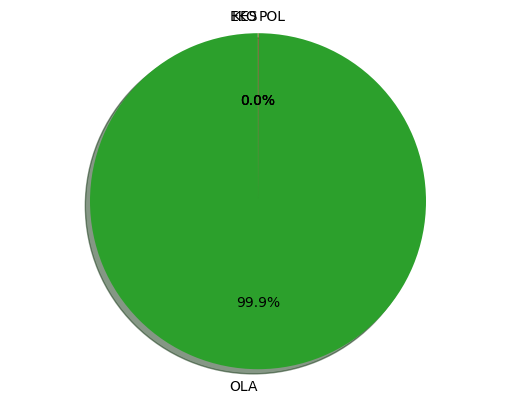

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'aksi tibo monabesa sukses pertahankan gelar wbc usai kalahkan petinju filipina'

19/19 [==============================] - 0s 3ms/step


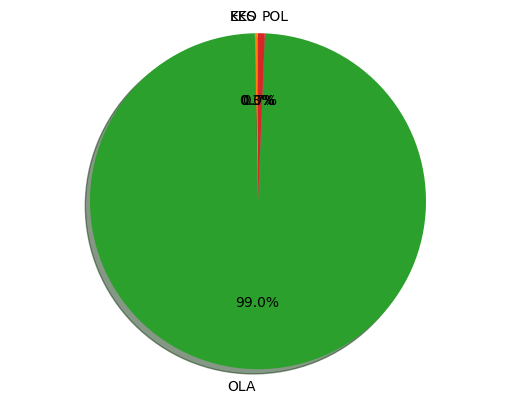

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'inagurasi lead by indihome telkom siapkan atlet esport terbaik'

19/19 [==============================] - 0s 3ms/step


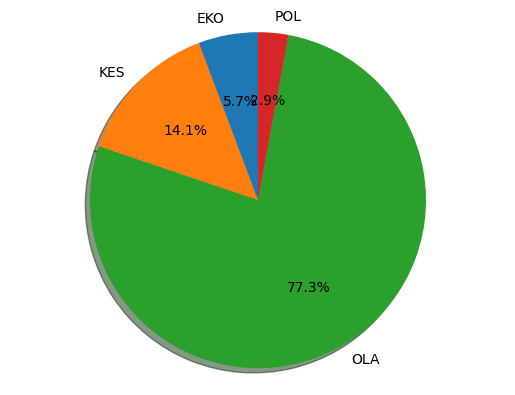

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'main solid di pln mobile proliga 2022 jakarta elektrik pln optimis meraih kemenangan'

19/19 [==============================] - 0s 3ms/step


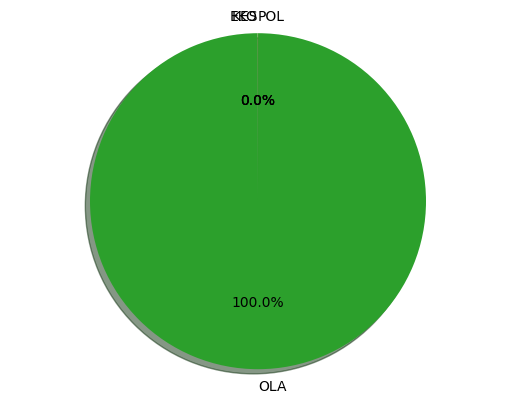

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'bersama spotv indihome hadirkan tayangan olahraga terbaik dunia'

19/19 [==============================] - 0s 3ms/step


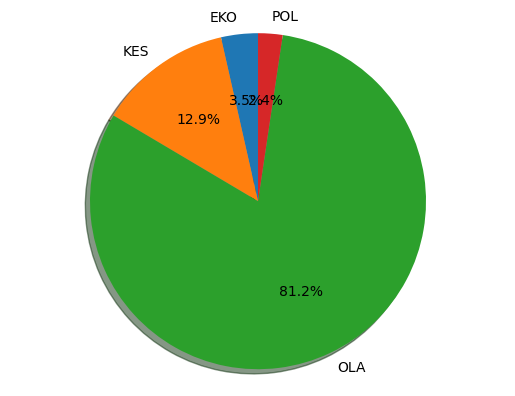

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'aksi pembalap reli dakar taklukkan ganasnya gurun arab saudi'

19/19 [==============================] - 0s 4ms/step


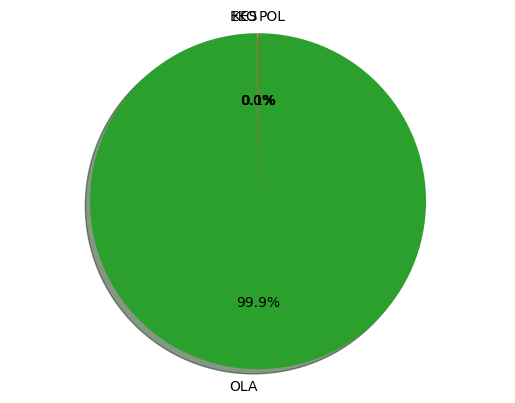

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'dengan skortv nex parabola hadirkan allinone sports eports wellness tv channel'

19/19 [==============================] - 0s 3ms/step


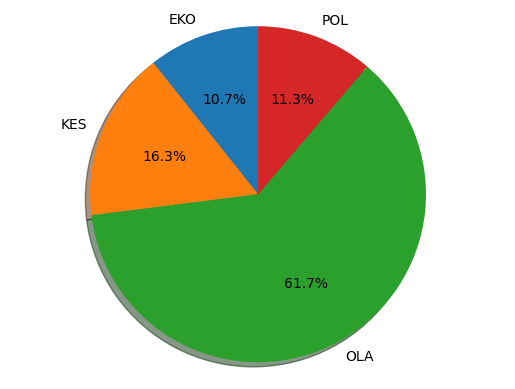

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'targetkan juara di pln mobile proliga 2022 ini susunan pemain jakarta elektrik pln'

19/19 [==============================] - 0s 4ms/step


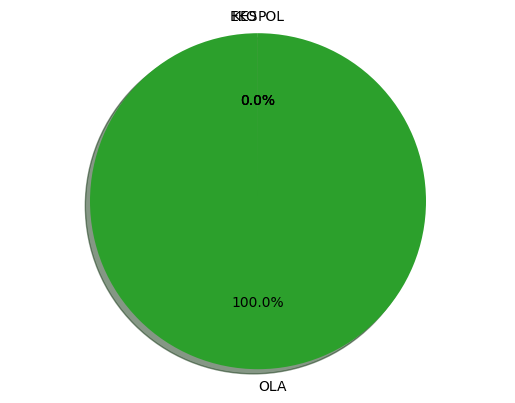

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'dipercaya lagi le minerale penuhi kebutuhan air mineral bwf world tour finals 2021'

19/19 [==============================] - 0s 4ms/step


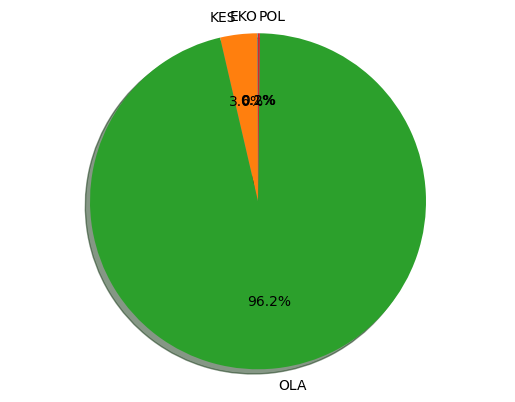

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'6 wakil tuan rumah siap berebut tiket final indonesia open 2021'

19/19 [==============================] - 0s 2ms/step


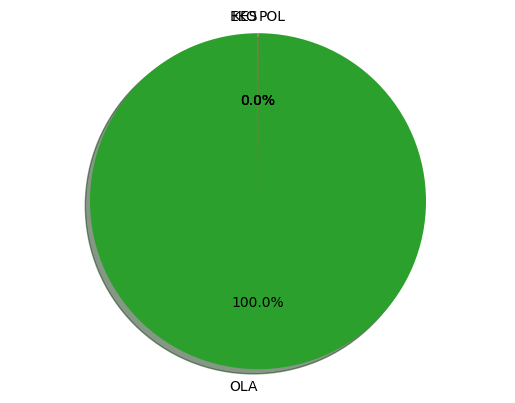

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'terus dukung indonesia atlet bulutangkis siap melaju ke final indonesia open 2021'

19/19 [==============================] - 0s 4ms/step


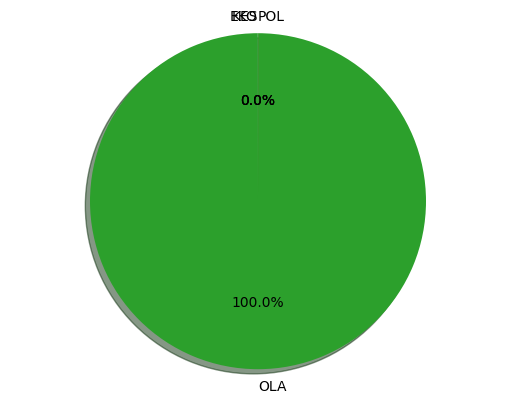

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'greysiaapriyani lolos ke final indonesia open 2021'

19/19 [==============================] - 0s 4ms/step


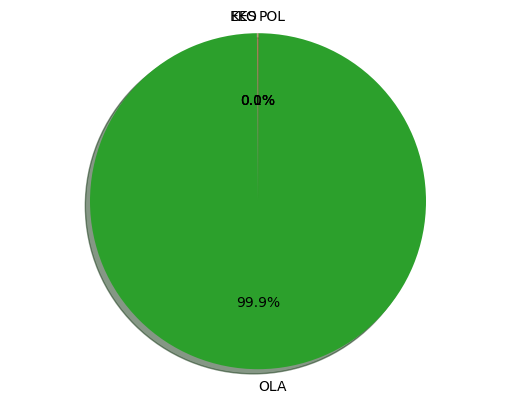

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'tni al gelar kasal cup 2021'

19/19 [==============================] - 0s 3ms/step


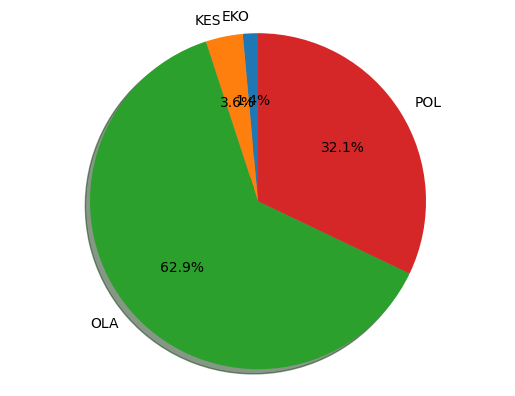

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'aksi minions tekuk wakil malaysia di indonesia open 2021'

19/19 [==============================] - 0s 3ms/step


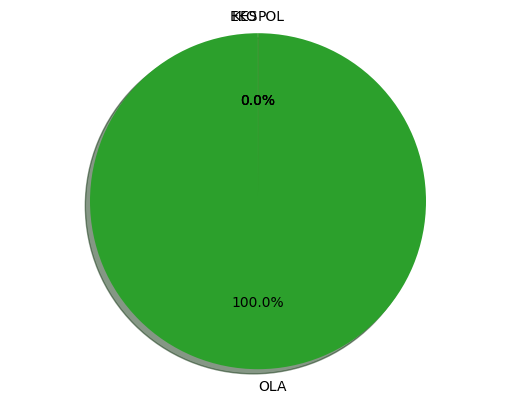

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'tumbangkan wakil jepang greysiaapriyani tembus semifinal indonesia open'

19/19 [==============================] - 0s 3ms/step


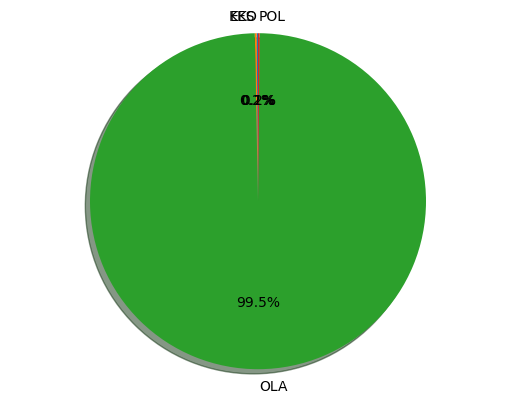

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'maju ke perempat final indonesia open 2021 greysiaapriyani siap lawan ganda jepang'

19/19 [==============================] - 0s 3ms/step


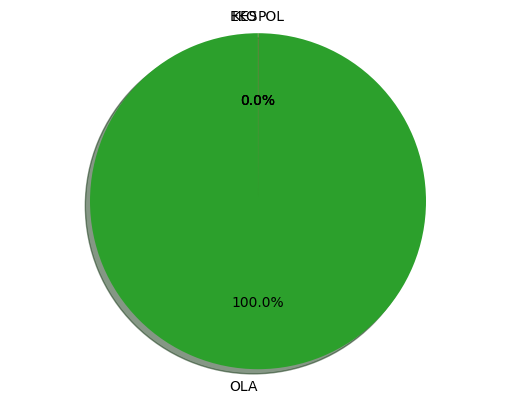

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'hujan deras tunda race 2 wsbk di sirkuit mandalika'

19/19 [==============================] - 0s 3ms/step


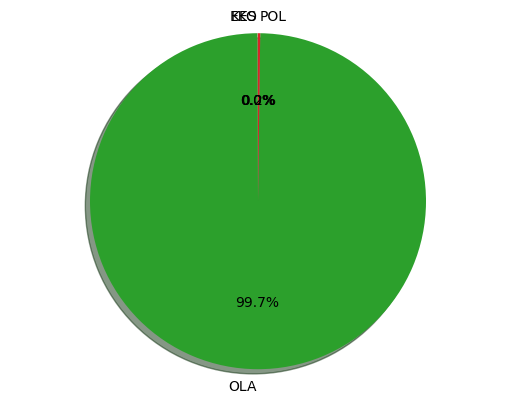

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'toprak razgatlioglu rebut juara dunia wsbk 2021 di sirkuit internasional mandalika'

19/19 [==============================] - 0s 4ms/step


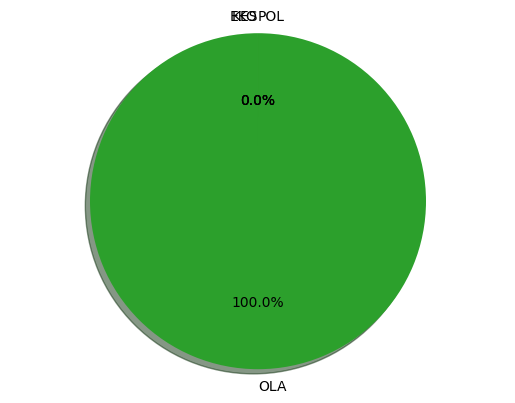

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'momen perpisahan valentino rossi di motogp'

19/19 [==============================] - 0s 3ms/step


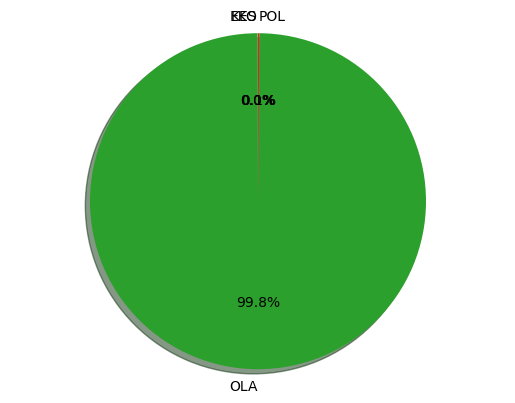

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'semarak penutupan peparnas papua 2021'

19/19 [==============================] - 0s 4ms/step


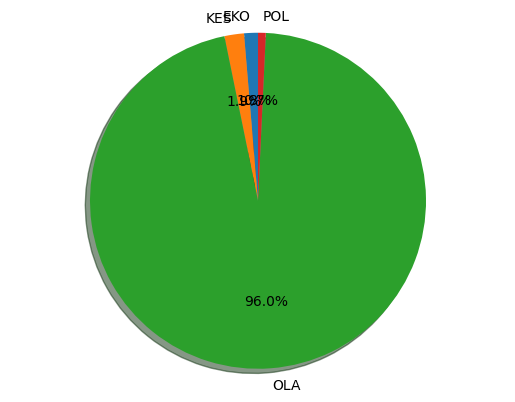

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'lifter rani puji astuti pecahkan rekor nasional di peparnas papua'

19/19 [==============================] - 0s 4ms/step


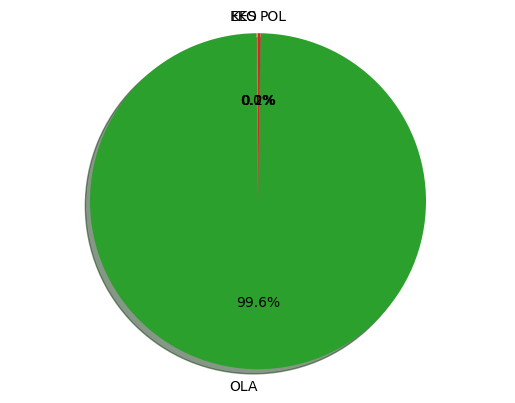

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'kegigihan atlet disabilitas di peparnas xvi papua'

19/19 [==============================] - 0s 4ms/step


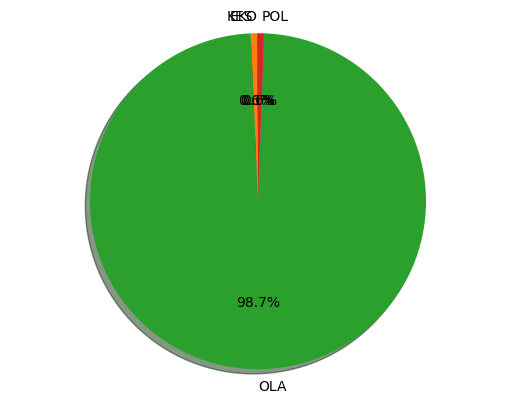

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'selebrasi quartararo kunci juara dunia motogp marquez menang gp misano'

19/19 [==============================] - 0s 4ms/step


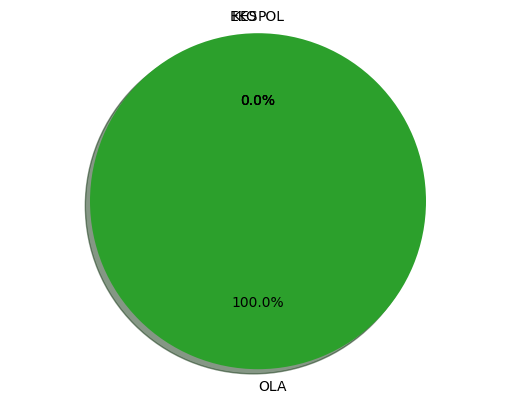

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'ekspresi valentino rossi terima penghargaan prestasi seumur hidup'

19/19 [==============================] - 0s 3ms/step


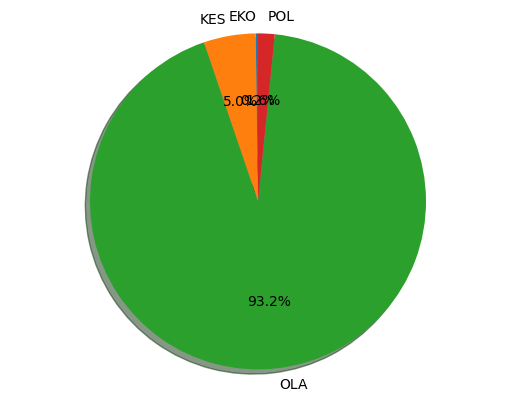

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'kejurda rc rally sejabodetabek di cirendeu'

19/19 [==============================] - 0s 3ms/step


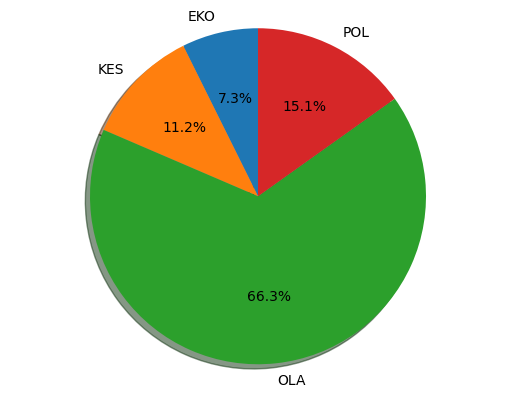

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'ingin nonton balap superbike di sirkuit mandalika wajib vaksin 2 kali'

19/19 [==============================] - 0s 4ms/step


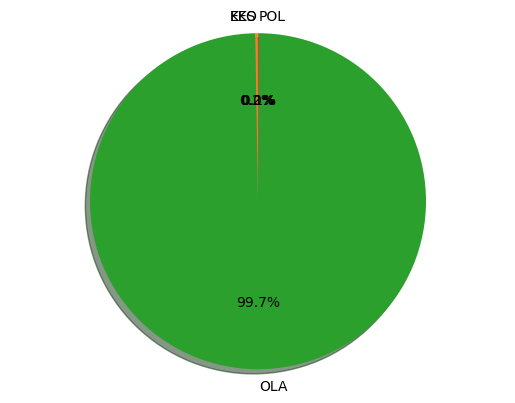

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'tim bulutangkis indonesia angkat piala thomas'

19/19 [==============================] - 0s 4ms/step


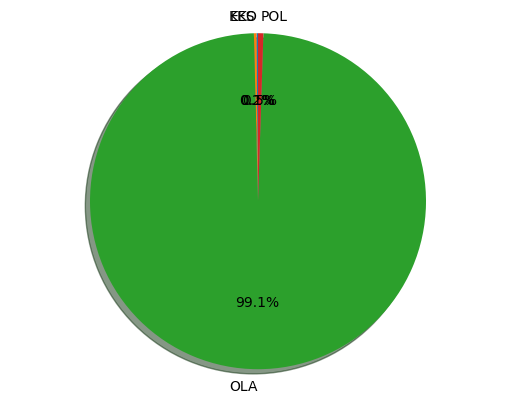

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'selebrasi anthony sinisuka ginting rebut piala thomas 2020'

19/19 [==============================] - 0s 3ms/step


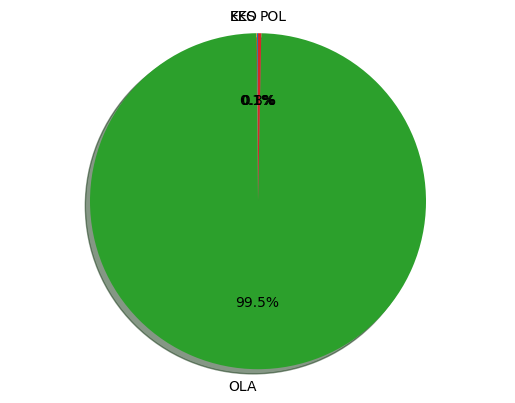

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'pameran seni untuk wisatawan dan memeriahkan pon papua'

19/19 [==============================] - 0s 3ms/step


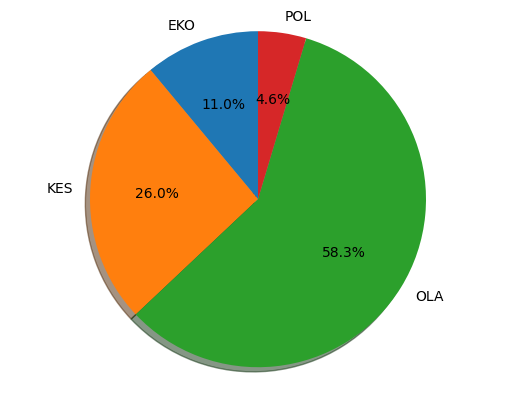

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'kiprah lokapala di pon xx bangkitkan industri game nasional'

19/19 [==============================] - 0s 4ms/step


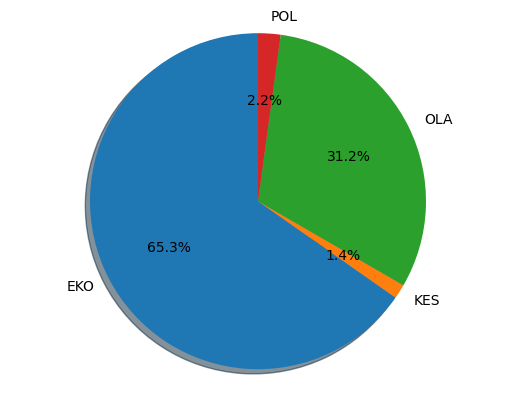

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'aksi lifter susi susanti pecahkan rekor asia di pon papua'

19/19 [==============================] - 0s 3ms/step


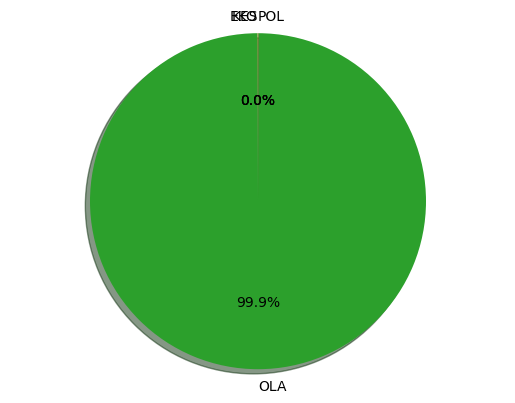

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'aksi tyson fury saat pukul ko deontay wilder'

19/19 [==============================] - 0s 4ms/step


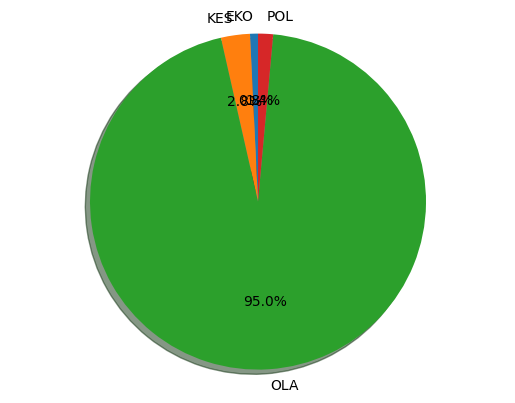

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'odekta sabet medali emas maraton putri'

19/19 [==============================] - 0s 4ms/step


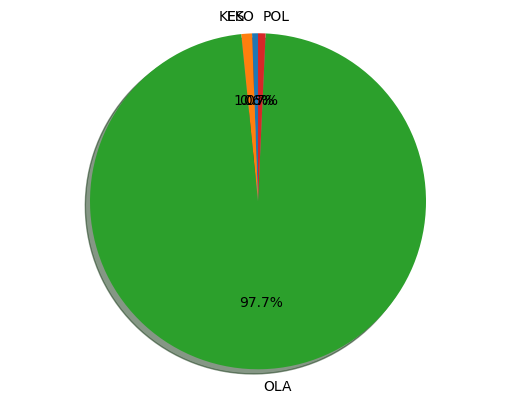

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'farrel armandio tangkas sabet emas nomor 200 meter gaya punggung'

19/19 [==============================] - 0s 4ms/step


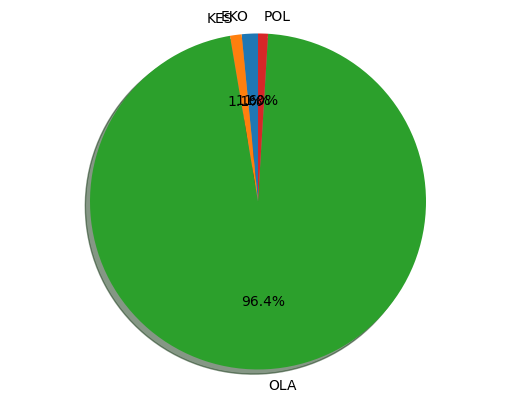

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'pesenam dki nabila evandestiera borong tiga emas pon papua'

19/19 [==============================] - 0s 3ms/step


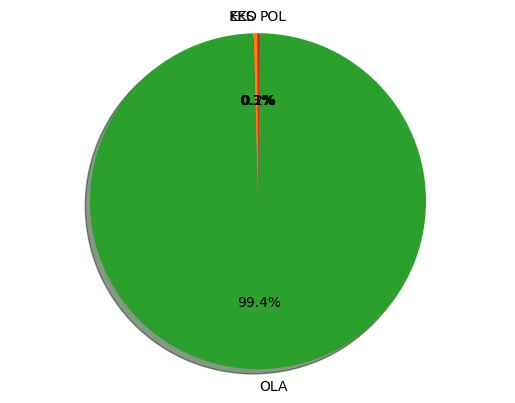

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'tim tenis jatim sapu bersih 7 medali emas pon papua'

19/19 [==============================] - 0s 3ms/step


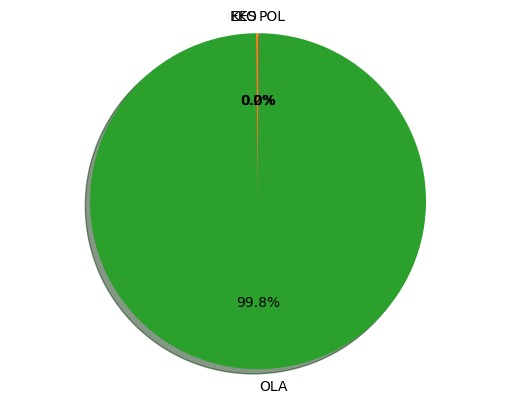

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'pesenam artistik putri dki raih empat medali emas pon papua'

19/19 [==============================] - 0s 3ms/step


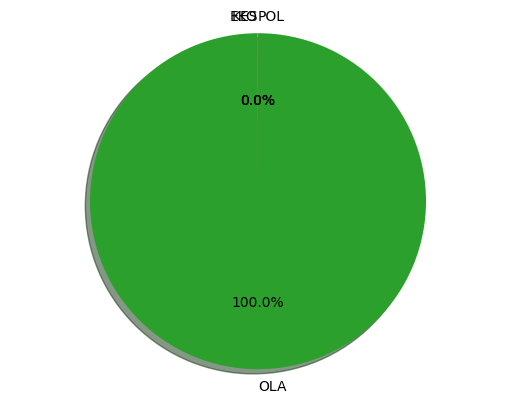

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'intip tim sepak bola wanita palestina latihan di hebron'

19/19 [==============================] - 0s 3ms/step


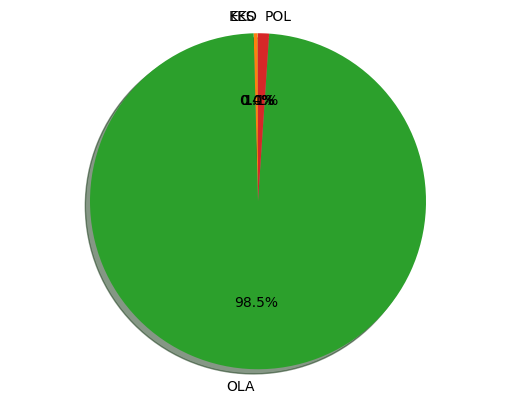

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'ressa kania dewi raih emas usai berenang 5000 meter di pon papua'

19/19 [==============================] - 0s 3ms/step


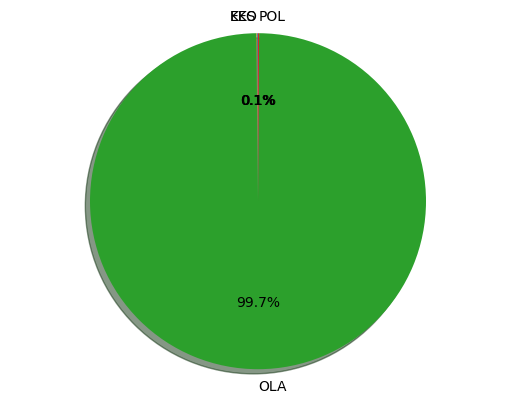

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'erick thohir kunjungi dan doakan legenda bulutangkis indonesia verawaty fajrin'

19/19 [==============================] - 0s 3ms/step


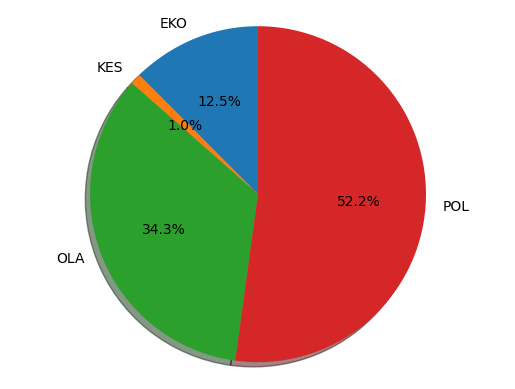

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'petenis cantik termuda emma raducanu raih juara as terbuka 2021'

19/19 [==============================] - 0s 4ms/step


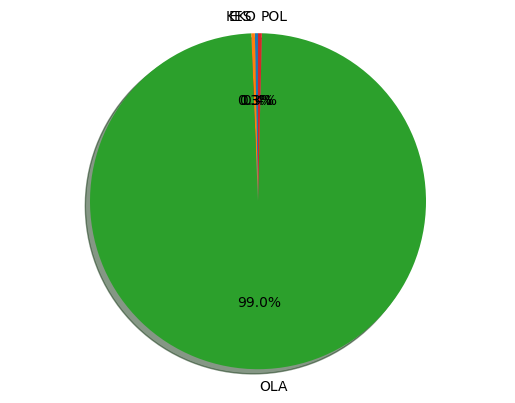

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'greysia apriyani berangkatkan asisten pelatih umrah setelah meraih medali emas olimpiade tokyo 2020'

19/19 [==============================] - 0s 3ms/step


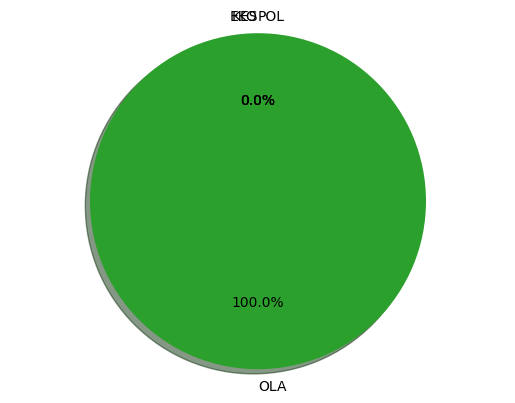

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'kegagalan di olimpiade tokyo 2020 membuat jonatan christie sempat susah move on'

19/19 [==============================] - 0s 3ms/step


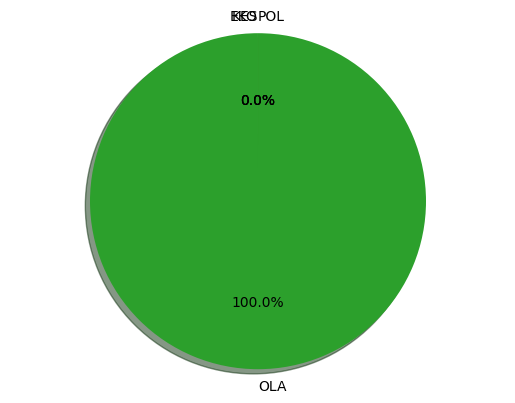

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'sprinter saptoyoga purnomo raih medali perunggu paralimpiade 2020'

19/19 [==============================] - 0s 4ms/step


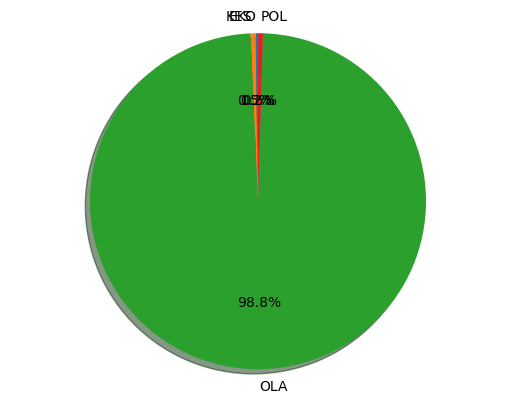

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'potret ni nengah widiasih pamerkan medali perak paralimpiade 2020'

19/19 [==============================] - 0s 2ms/step


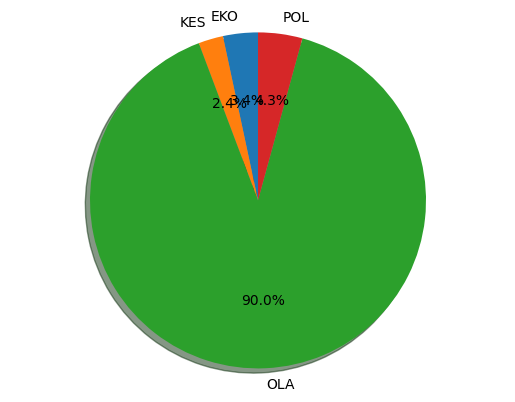

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'semarak pesta pembukaan paralimpiade tokyo 2020'

19/19 [==============================] - 0s 4ms/step


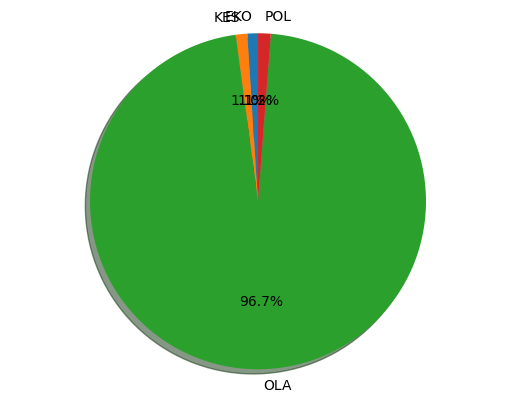

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'jokijoki cantik di kejuaraan dunia horse show 2021'

19/19 [==============================] - 0s 4ms/step


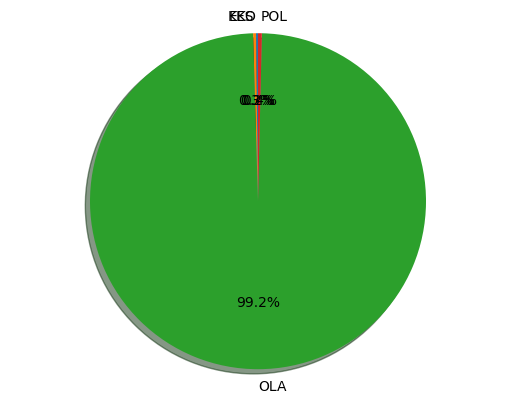

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'bonus olimpiade tokyo 2020 cair lagi greysia polii dan apriyani rahayu miliki hunian baru di utara'

19/19 [==============================] - 0s 3ms/step


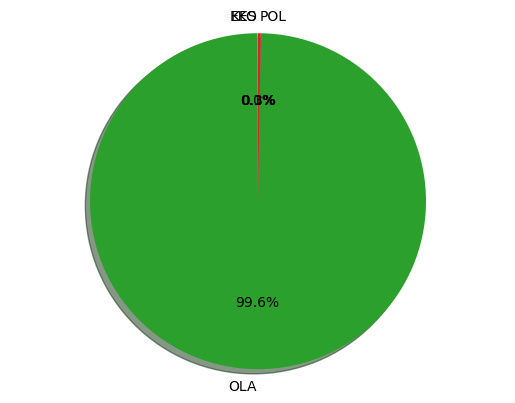

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'pukulan telak urga bikin manny pacquiao babak belur'

19/19 [==============================] - 0s 3ms/step


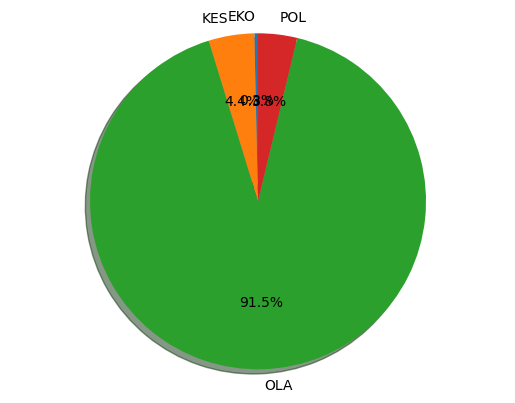

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'greysia apriyani dan anthony ginting diguyur bonus dari pbsi'

19/19 [==============================] - 0s 4ms/step


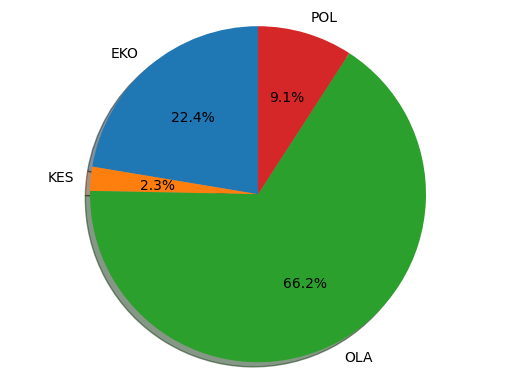

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'sukses di olimpiade tokyo anthony ginting dan windy cantika diguyur bonus dari pemprov jabar'

19/19 [==============================] - 0s 4ms/step


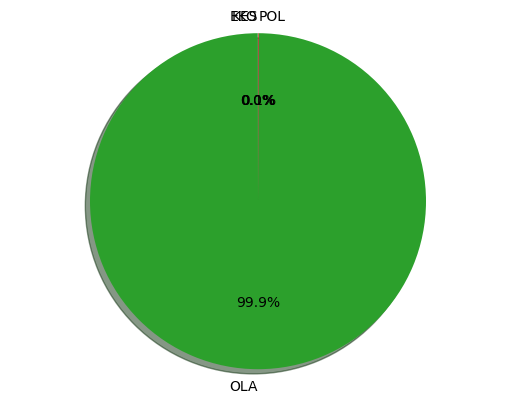

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'greysia apriyani dan anthony ginting diguyur bonus rp23 miliar dari pengusaha lukas buntoro'

19/19 [==============================] - 0s 3ms/step


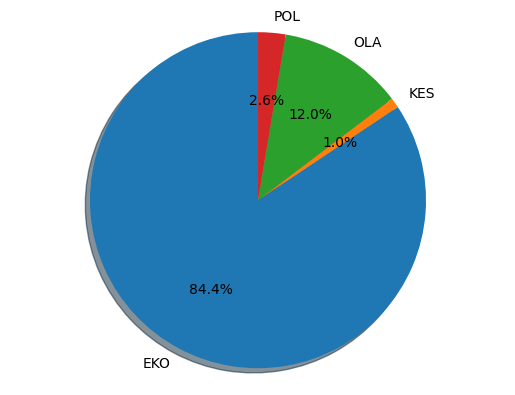

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'eko yuli irawan dianugerahi tanda kehormatan oleh gubernur jatim atas prestasi di olimpiade tokyo'

19/19 [==============================] - 0s 3ms/step


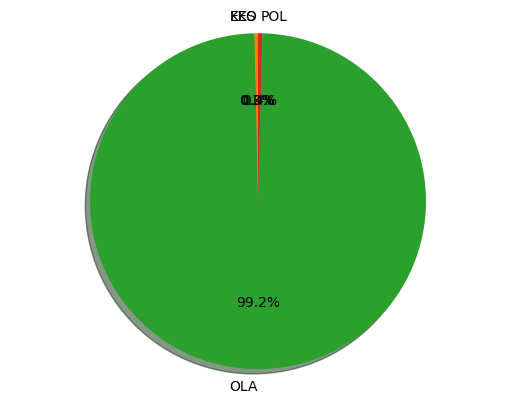

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'kisah perjuangan eko yuli irawan sebelum sukses persembahkan medali perak olimpiade tokyo 2020 untuk'

19/19 [==============================] - 0s 3ms/step


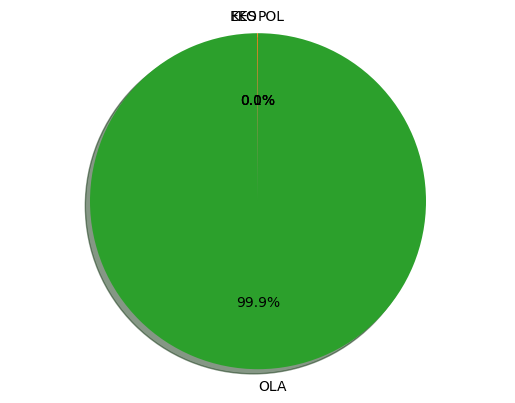

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'hebat kompleks pusat pelatihan olahraga diberi nama greysia polii apriyani rahayu'

19/19 [==============================] - 0s 3ms/step


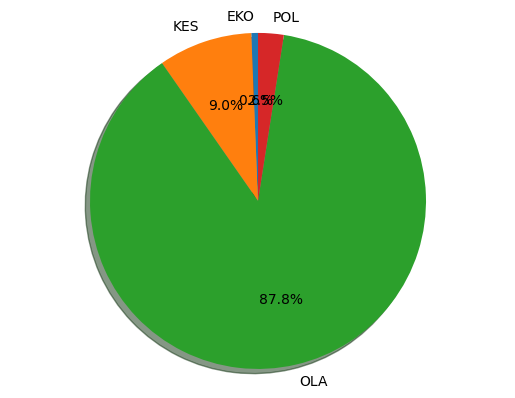

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'greysia apriyani banjir bonus lagi dapat rumah dari pb jaya raya pemprov jakarta guyur rp800 juta'

19/19 [==============================] - 0s 4ms/step


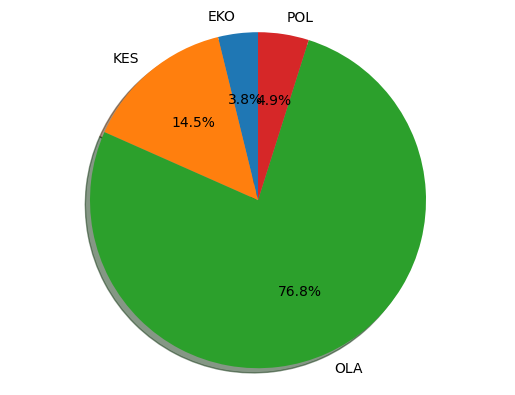

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'presiden jokowi serahkan bonus untuk atlet peraih medali di olimpiade tokyo 2020'

19/19 [==============================] - 0s 3ms/step


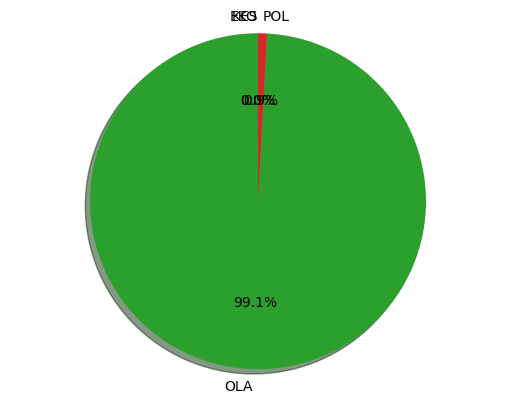

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'cerita anthony ginting dihinggapi rasa sedih dan kecewa sebelum bangkit rebut medali perunggu olimpi'

19/19 [==============================] - 0s 4ms/step


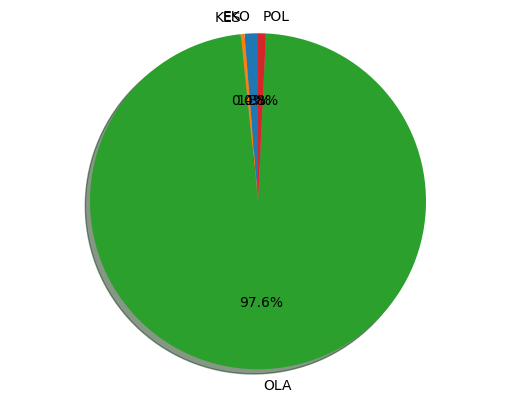

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'kisah lompatan karier anthony ginting masih di daftar tunggu indonesia open pada 2015 rebut perung'

19/19 [==============================] - 0s 4ms/step


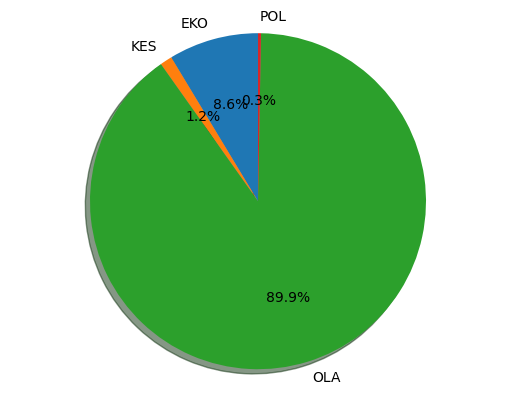

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'presiden oca mengapresiasi seluruh pihak yang membuat olimpiade tokyo 2020 sukses luar biasa'

19/19 [==============================] - 0s 3ms/step


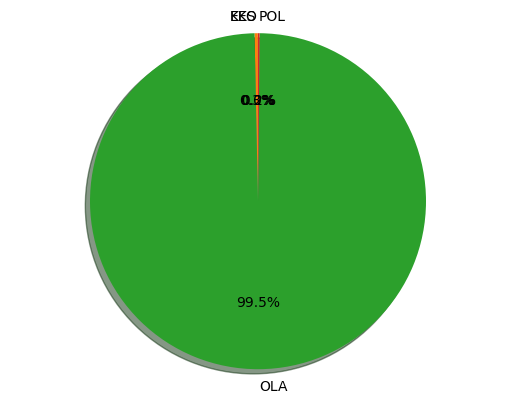

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'analisis imelda wiguna atas kesuksesan greysia apriyani di olimpiade tokyo 2020 peran pelatih dap'

19/19 [==============================] - 0s 4ms/step


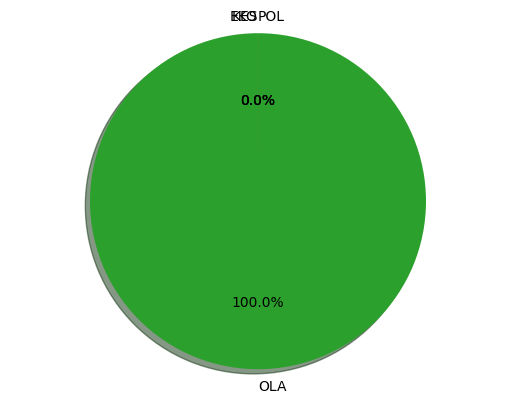

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'kondisi motor pedrosa dan savadori yang terbakar di motogp styria'

19/19 [==============================] - 0s 3ms/step


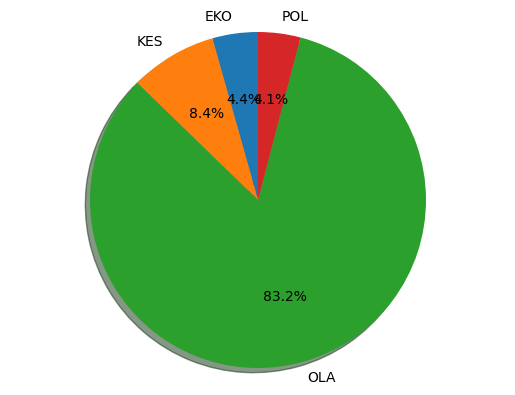

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'back to back medali emas yuk kita simak perjalanan tim sepak bola putra brasil di olimpiade tokyo 2'

19/19 [==============================] - 0s 3ms/step


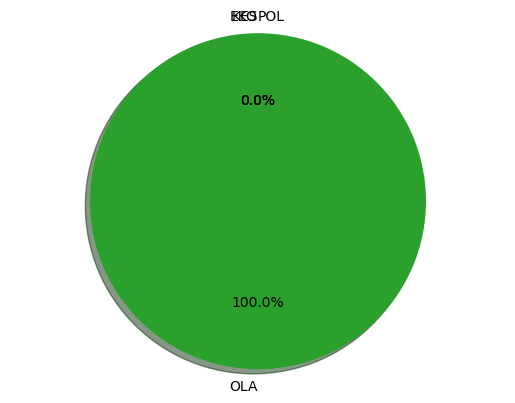

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'statistik pebasket sue bird selama olimpiade tokyo 2020 menakjubkan'

19/19 [==============================] - 0s 3ms/step


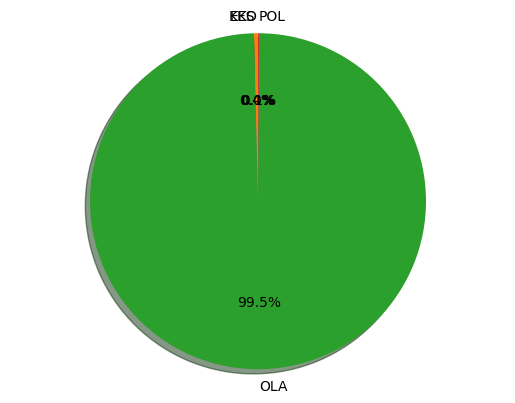

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'13 petinju peraih medali emas olimpiade tokyo 2020 siapa saja'

19/19 [==============================] - 0s 3ms/step


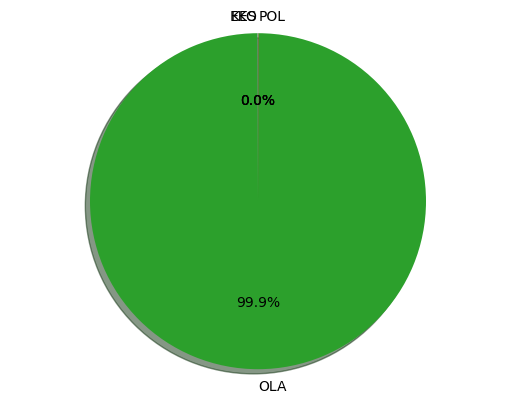

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'kawinkan medali emas tim putra dan putri yuk kita simak perjalanan timnas basket amerika serikat di'

19/19 [==============================] - 0s 3ms/step


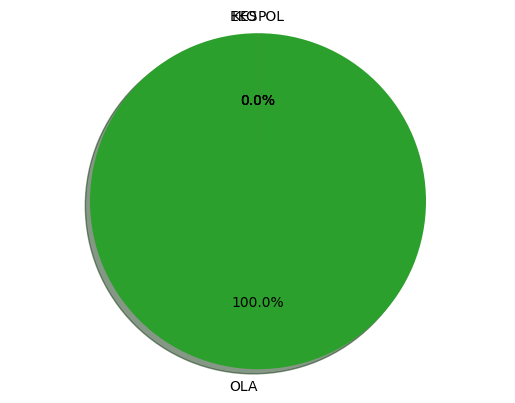

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'catatan mantan menpora serunya nonton olimpiade tokyo 2020 di vidiocom'

19/19 [==============================] - 0s 4ms/step


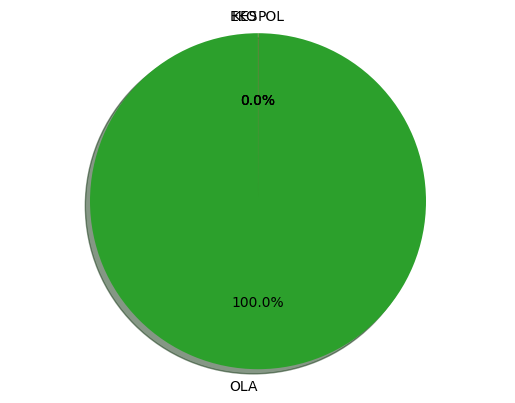

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'5 top skorer sepak bola putra olimpiade tokyo 2020'

19/19 [==============================] - 0s 3ms/step


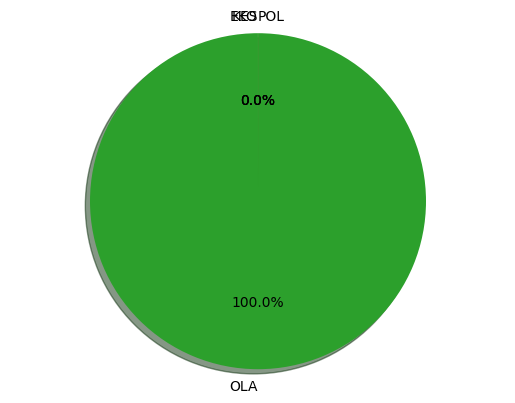

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'eks menpora andi mallarangeng puji layanan platform streaming vidiocom selama gelaran olimpiade tokyo'

19/19 [==============================] - 0s 4ms/step


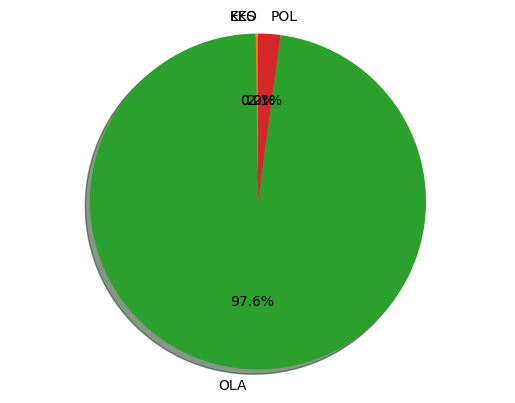

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'yang berjaya di olimpiade tokyo 2020'

19/19 [==============================] - 0s 3ms/step


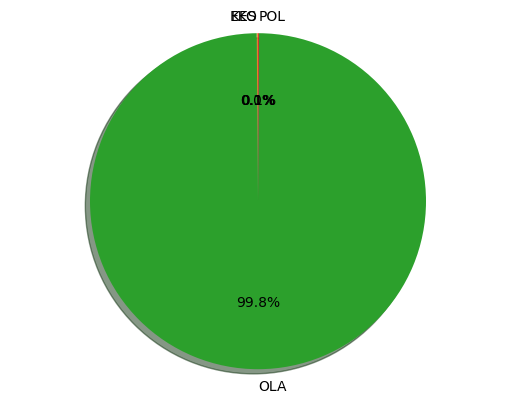

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'telah usai yuk simak serunya pertarungan bola voli olimpiade tokyo 2020'

19/19 [==============================] - 0s 4ms/step


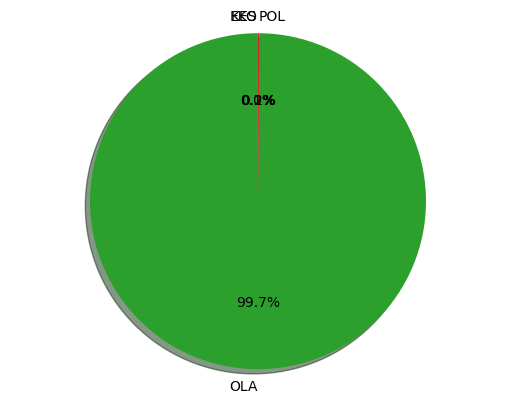

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'raih medali emas di olimpiade tokyo 2020 tim voli putri amerika serikat cetak sejarah'

19/19 [==============================] - 0s 4ms/step


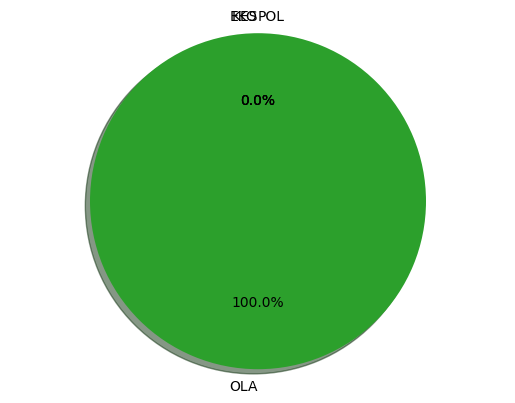

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'pemain dengan status pencetak gol terbanyak sepanjang sejarah cabor sepak bola di ajang olimpiade tokyo 2020'

19/19 [==============================] - 0s 4ms/step


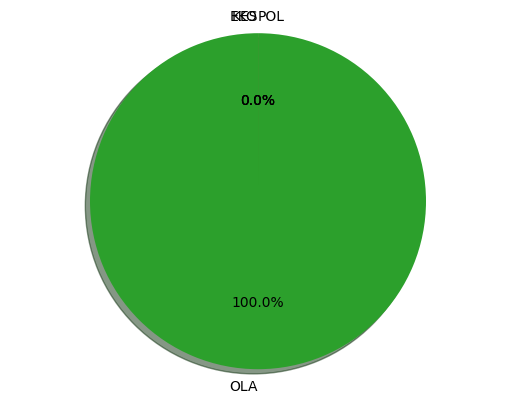

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'beragam catatan menarik milik kevin durant usai meraih medali emas ketiga di ajang olimpiade'

19/19 [==============================] - 0s 3ms/step


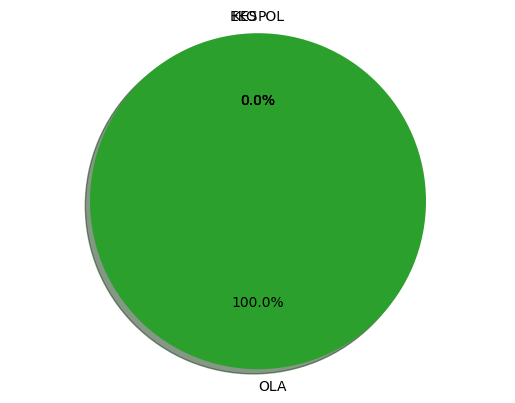

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'hasil final cabor tinju olimpiade tokyo 2020 kuba raih medali emas keempat'

19/19 [==============================] - 0s 3ms/step


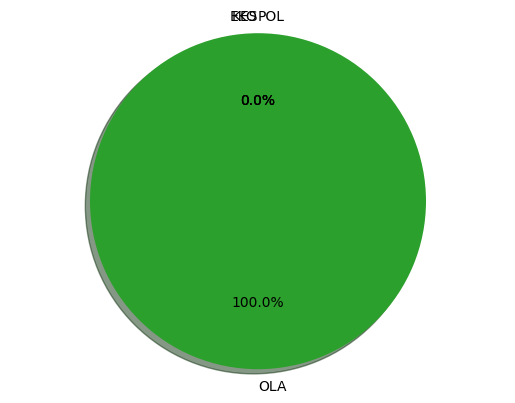

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'hasil final basket putri olimpiade tokyo 2020 tuan rumah jepang takluk ditangan juara bertahan as'

19/19 [==============================] - 0s 4ms/step


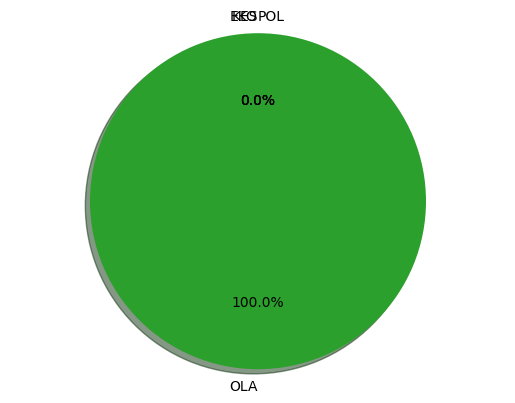

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'jadwal dan link live streaming final balap sepeda sprint putri olimpiade tokyo 2020'

19/19 [==============================] - 0s 4ms/step


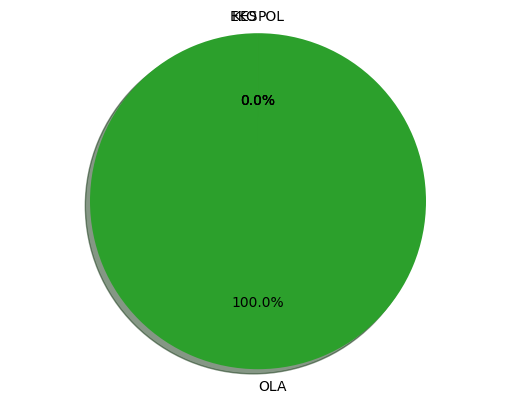

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'raih medali emas olimpiade tokyo 2020 koleksi trofi dani alves melebihi chelsea dan manchester city'

19/19 [==============================] - 0s 3ms/step


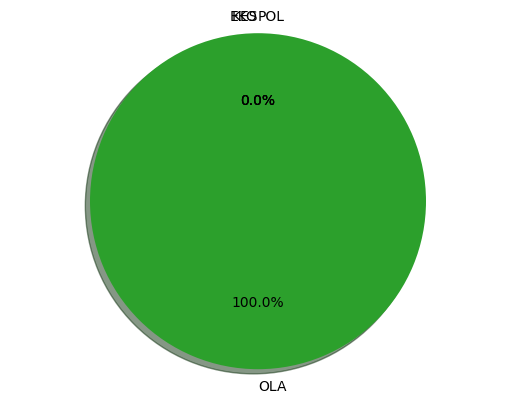

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'hasil sepak bola olimpiade tokyo 2020 kerja keras bungkam spanyol brasil raih medali emas'

19/19 [==============================] - 0s 4ms/step


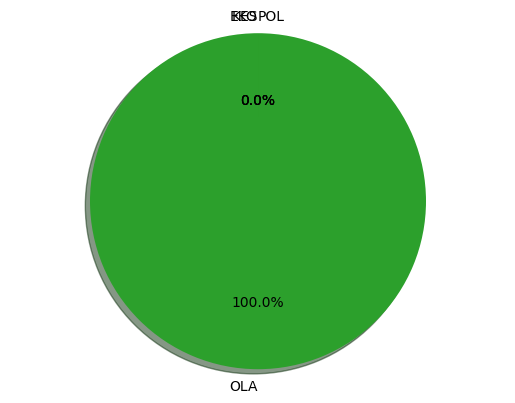

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'hasil olimpiade carlo paalam takluk ditangan galal yafai di final olimpiade tokyo 2020 kelas fly'

19/19 [==============================] - 0s 3ms/step


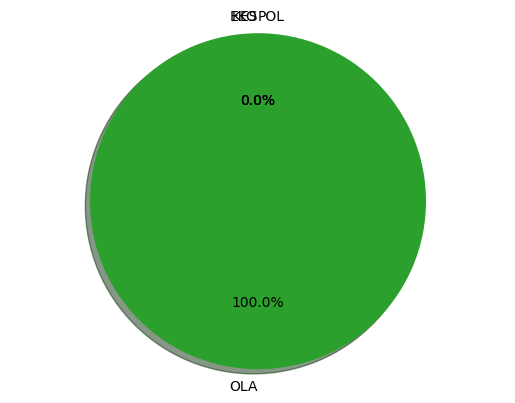

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'bungkam brasil argentina bawa pulang medali perunggu bola voli putra olimpiade tokyo 2020'

19/19 [==============================] - 0s 3ms/step


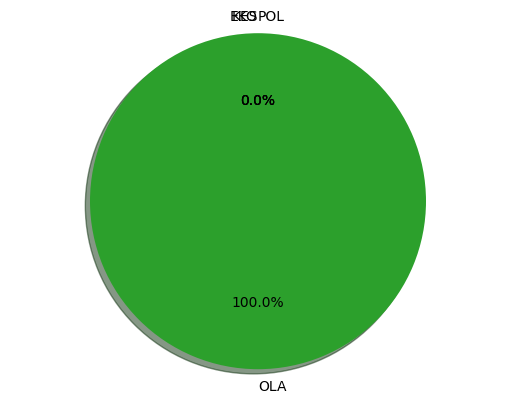

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'alasan greysia polii selalu tebar senyuman saat bertanding di olimpiade tokyo 2020'

19/19 [==============================] - 0s 4ms/step


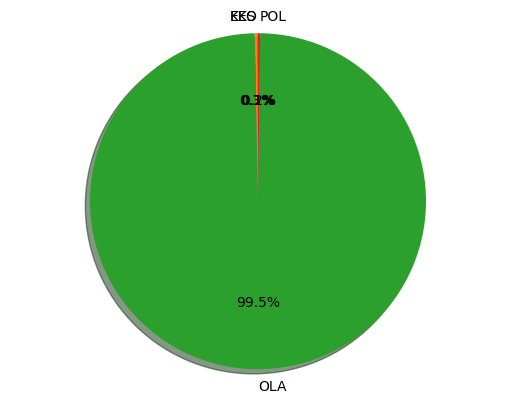

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'tundukkan prancis amerika serikat rebut medali emas basket olimpiade tokyo 2020'

19/19 [==============================] - 0s 3ms/step


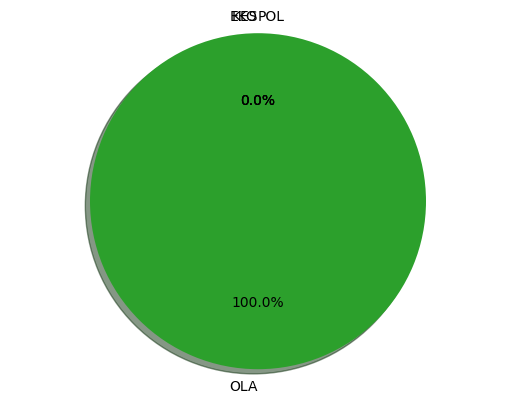

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'greysia polii tes covid19 lebih menegangkan ketimbang pertandingan olimpiade 2020'

19/19 [==============================] - 0s 3ms/step


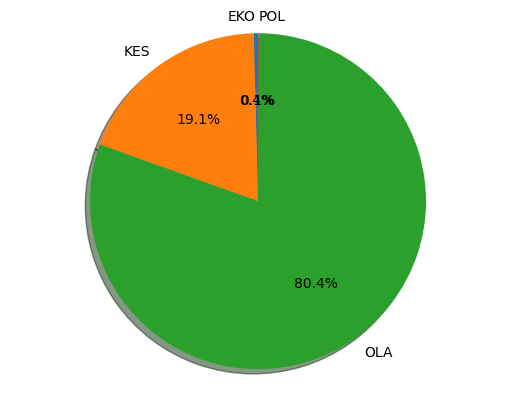

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'yuk tengok pemain kunci brasil vs spanyol di final sepak bola olimpiade tokyo adu hebat richarlison'

19/19 [==============================] - 0s 3ms/step


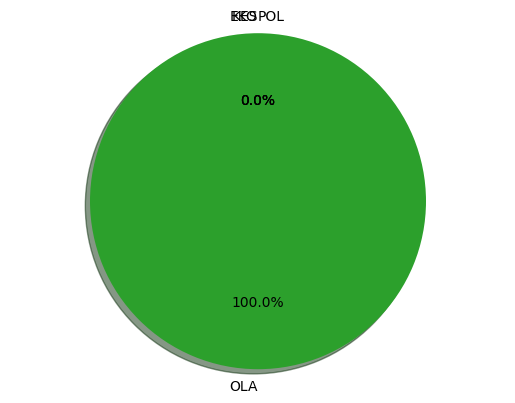

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'lisa carrington gagal raih medali emas keempatnya di ajang olimpiade tokyo 2020'

19/19 [==============================] - 0s 3ms/step


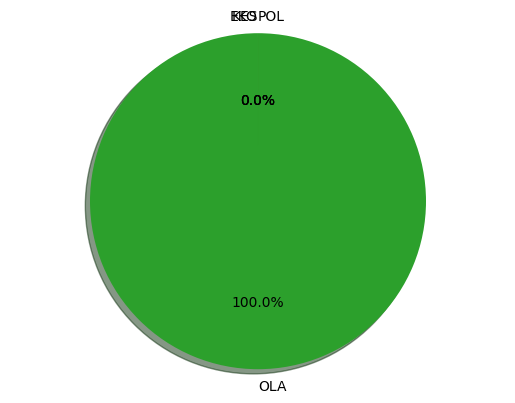

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'jadwal dan link live streaming final lari estafet 4x400 olimpiade tokyo 2020 di vidio sabtu 7 agustus'

19/19 [==============================] - 0s 4ms/step


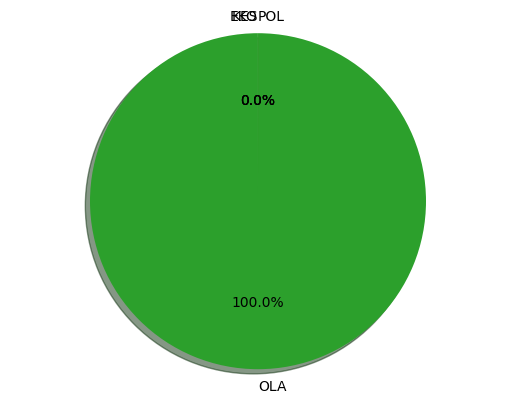

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'nurul akmal mohon warganet setop bahas body shaming noc indonesia minta ciptakan lingkungan kondusi'

19/19 [==============================] - 0s 3ms/step


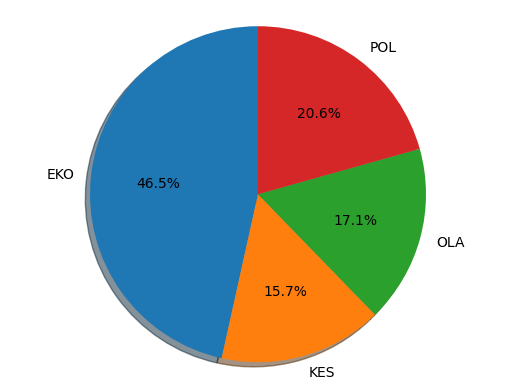

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'data dan fakta menarik final sepakbola putra brasil vs spanyol olimpiade tokyo 2020'

19/19 [==============================] - 0s 3ms/step


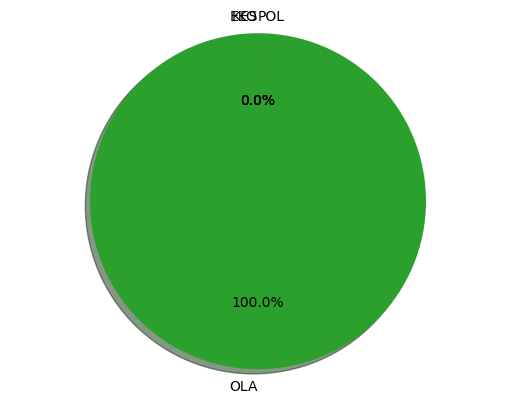

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'prediksi final sepak bola olimpiade tokyo 2020 brasil vs spanyol partai penentuan demi medali emas'

19/19 [==============================] - 0s 4ms/step


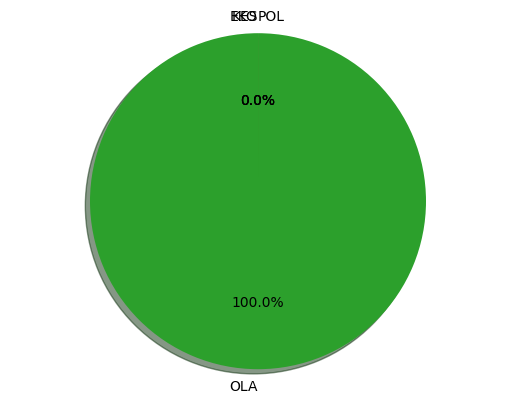

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'dramatis bekuk swedia kanada sabet medali emas sepak bola putri olimpiade tokyo 2020'

19/19 [==============================] - 0s 4ms/step


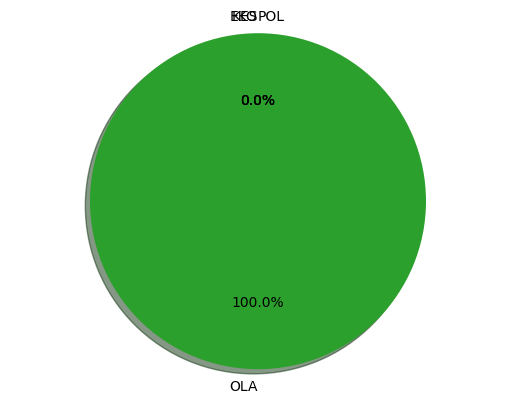

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'klasemen perolehan medali olimpiade tokyo 2020 6 agustus 2020 indonesia masih terbaik di asia tenggara'

19/19 [==============================] - 0s 4ms/step


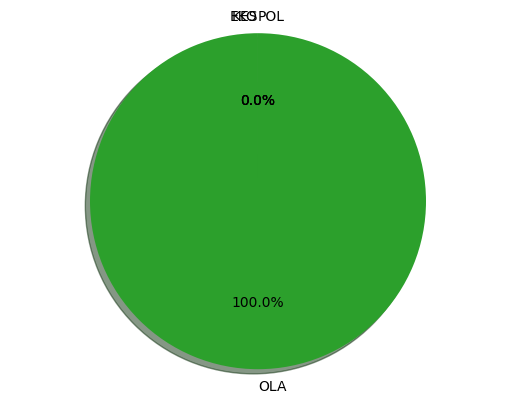

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'hasil olimpiade lisa carrington tembus semifinal nomor kayak empat putri 500m'

19/19 [==============================] - 0s 3ms/step


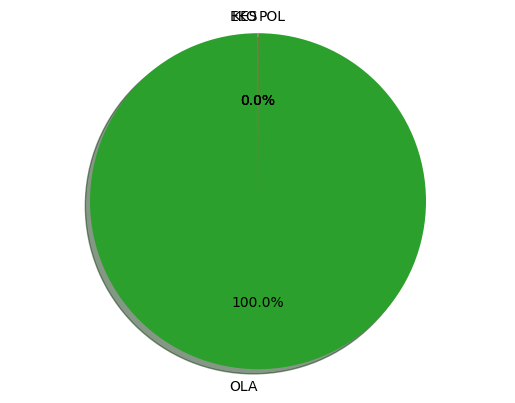

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'tidak terhentikan kuba rebut medali emas ketiga dari tinju di olimpiade tokyo 2020'

19/19 [==============================] - 0s 3ms/step


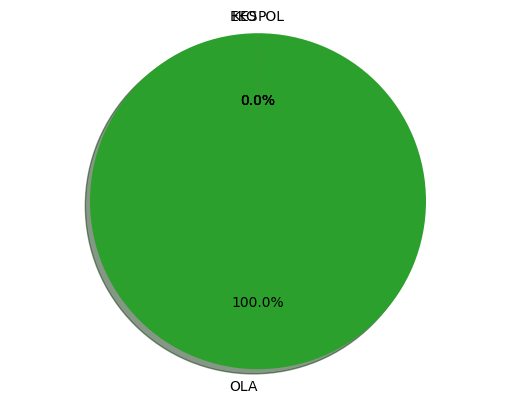

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'highlights timnas basket putri as melaju ke final olimpiade tokyo 2020'

19/19 [==============================] - 0s 4ms/step


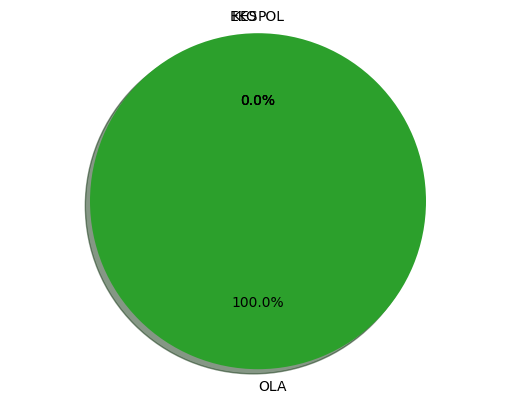

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'atlet olimpiade tokyo ambil bagian dalam konser amal indonesia tangguh untuk kapal isolasi terpusat'

19/19 [==============================] - 0s 3ms/step


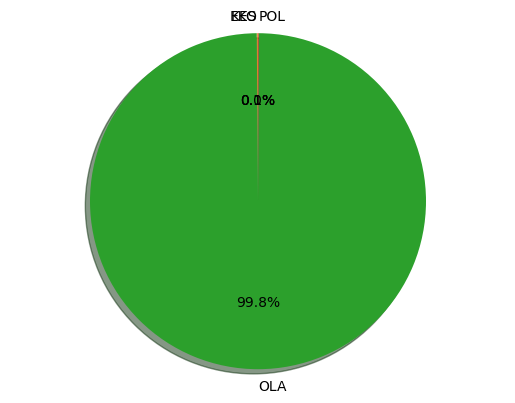

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'hasil sepak bola olimpiade tokyo 2020 bungkam jepang meksiko sabet perunggu'

19/19 [==============================] - 0s 3ms/step


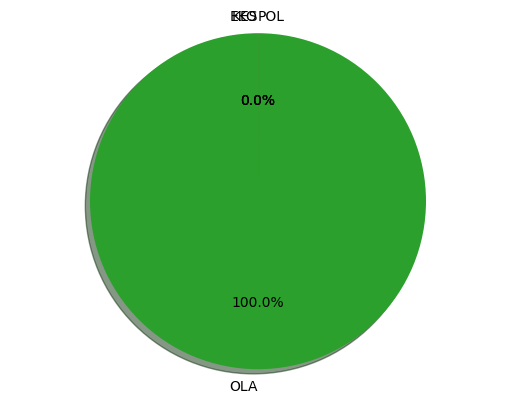

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'eng hian jangan cepat puas apriyani rahayu ayo pertahankan gelar di olimpiade 2024'

19/19 [==============================] - 0s 3ms/step


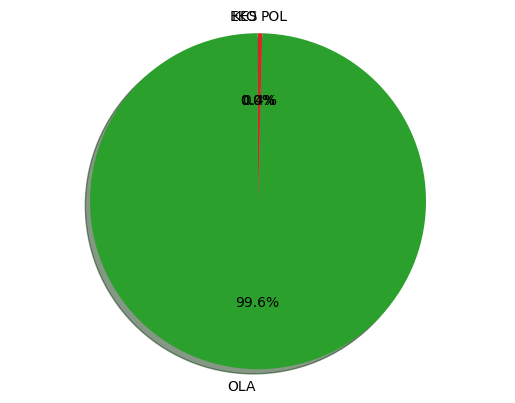

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'masih penasaran dengan medali emas olimpiade eko yuli belum mau pensiun'

19/19 [==============================] - 0s 4ms/step


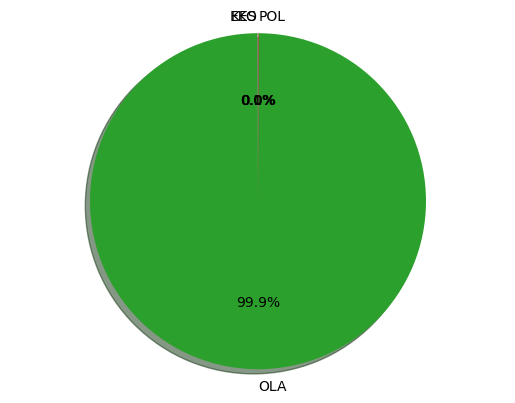

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'eko yuli ingin membangun sesuatu dari bonus olimpiade 2020 rahmat dan windy pilih ditabung'

19/19 [==============================] - 0s 3ms/step


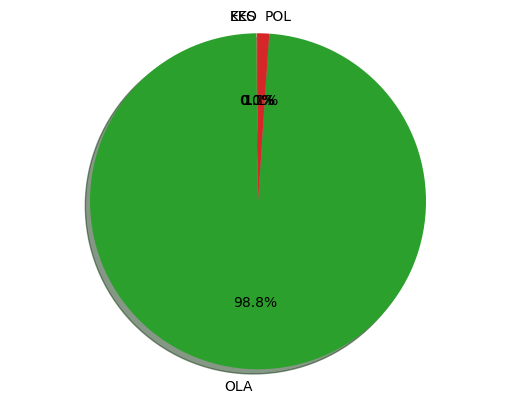

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'emas olimpiade tokyo persembahan apriyani rahayu bukti pondasi kuat pb pelita bakrie'

19/19 [==============================] - 0s 3ms/step


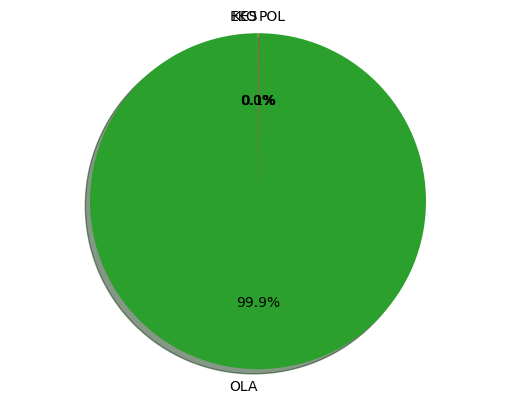

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'greysia polii tunggu waktu yang tepat untuk gantung raket'

19/19 [==============================] - 0s 3ms/step


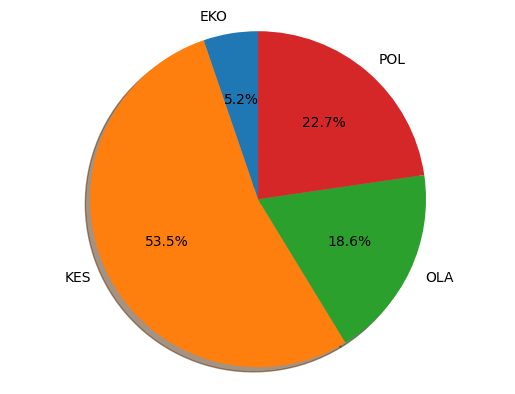

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'inilah 5 tim sepak bola putri tersukses dalam sejarah olimpiade'

19/19 [==============================] - 0s 3ms/step


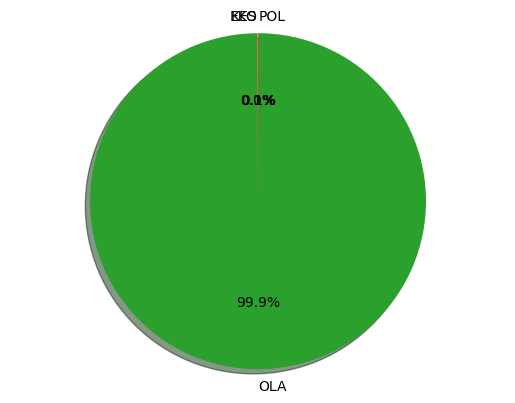

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'ekspresi valentino rossi umumkan pensiun dari motogp'

19/19 [==============================] - 0s 3ms/step


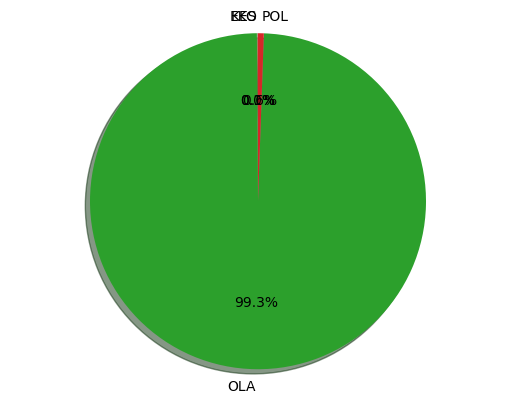

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'hasil orleans masters 2023 3 wakil indonesia tembus perempatfinal termasuk lanny triaribka sugiarto'

19/19 [==============================] - 0s 4ms/step


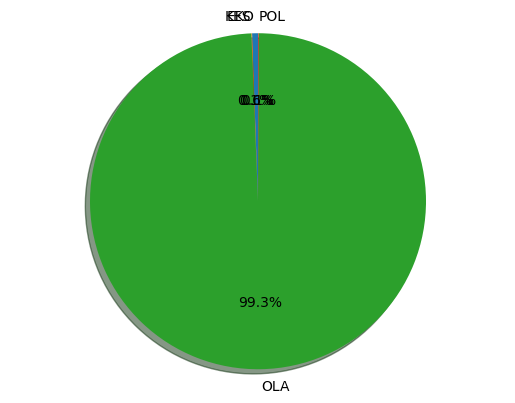

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'5 pebulu tangkis terbaik di dunia menurut legenda denmark mathias boe nomor 1 andalan ganda putra indonesia'

19/19 [==============================] - 0s 4ms/step


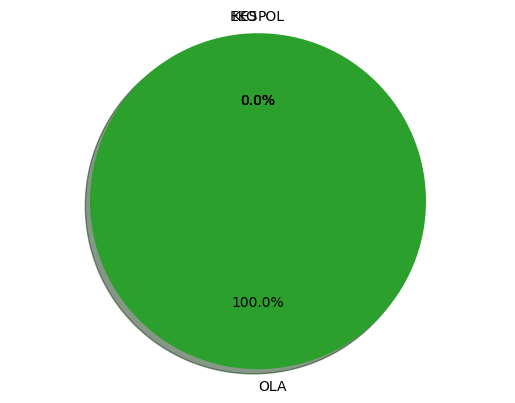

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'menpora dito ariotedjo bakal temui wayan koster untuk bahas anoc world beach games 2023'

19/19 [==============================] - 0s 4ms/step


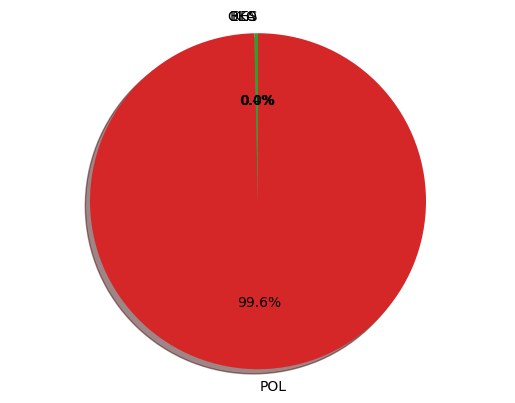

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'hasil nba 20222023 hari ini dallas mavericks dan la clippers samasama tumbang'

19/19 [==============================] - 0s 2ms/step


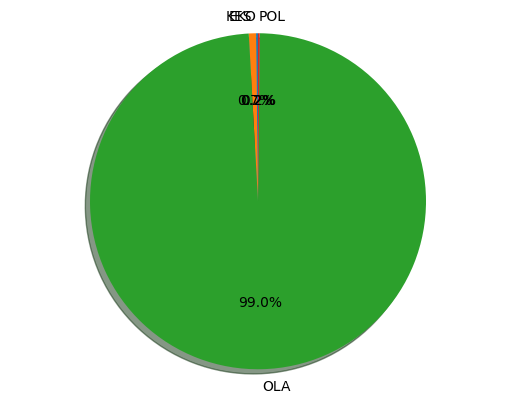

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'ketum partai prima pede jadi peserta pemilu 2024'

19/19 [==============================] - 0s 3ms/step


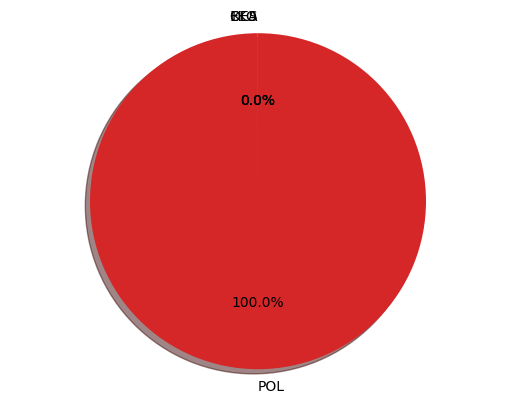

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'langgar kode etik ketua kpu disanksi peringatan keras terakhir oleh dkpp'

19/19 [==============================] - 0s 4ms/step


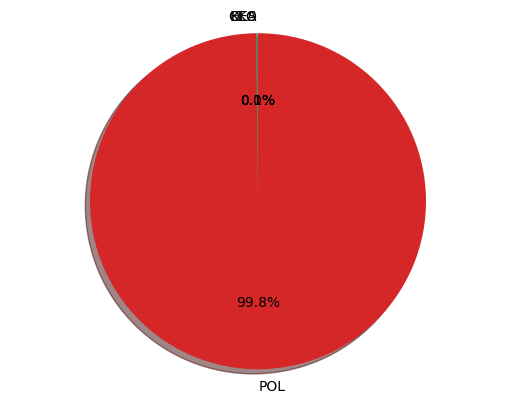

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'warga turki turun ke jalan protes serangan israel ke alaqsa'

19/19 [==============================] - 0s 4ms/step


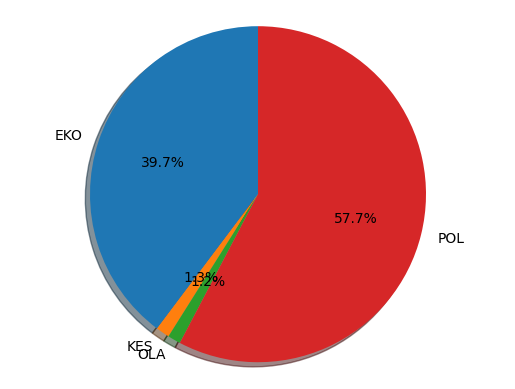

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'setelah prabowo kini giliran zulhas diajak jokowi naik mobil ri 1'

19/19 [==============================] - 0s 2ms/step


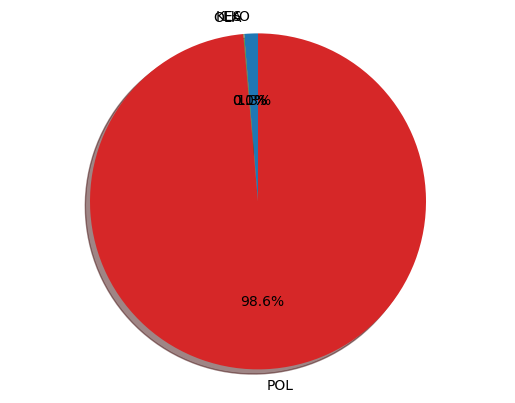

None

19/19 [==============================] - 0s 2ms/step
Best Prediction Adalah : Politik 



'kpu nyatakan partai prima lolos syarat verifikasi administrasi'

19/19 [==============================] - 0s 4ms/step


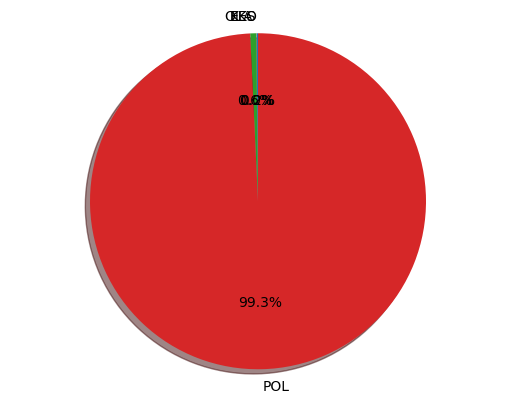

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'lebih dekat dengan kombes darmanto perwira sederhana tanpa merasa sederhana'

19/19 [==============================] - 0s 3ms/step


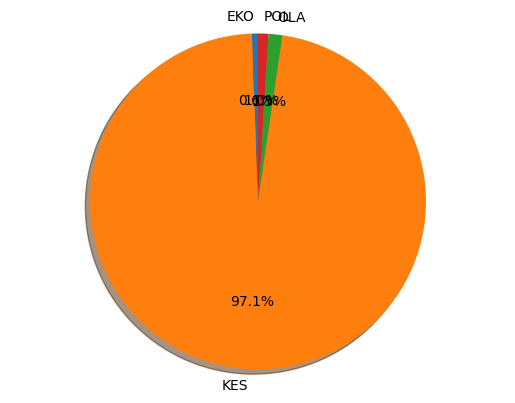

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'kementerian kelautan dan perikanan dapat anggaran rp 629 t tahun ini'

19/19 [==============================] - 0s 3ms/step


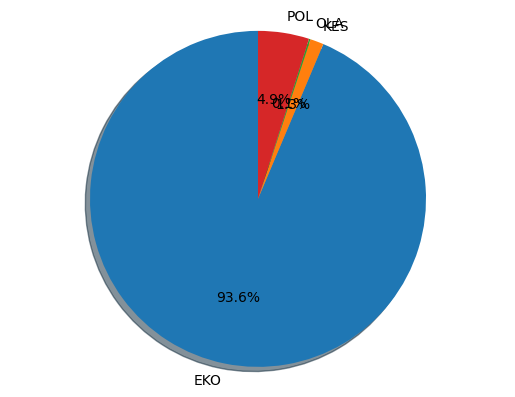

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'kedatangan sekda riau ke kpk klarifikasi lhkpn'

19/19 [==============================] - 0s 2ms/step


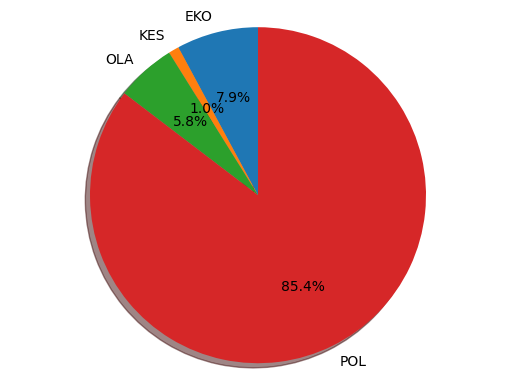

None

19/19 [==============================] - 0s 2ms/step
Best Prediction Adalah : Politik 



'tak dapat rekomendasi impor kci diminta poles krl yang mau pensiun'

19/19 [==============================] - 0s 3ms/step


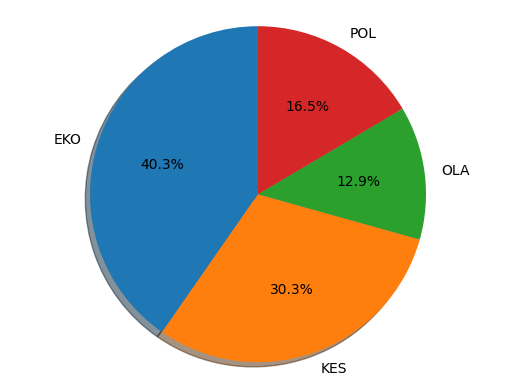

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'pengamat politik ugm apresiasi seleksi menteri detikcom'

19/19 [==============================] - 0s 3ms/step


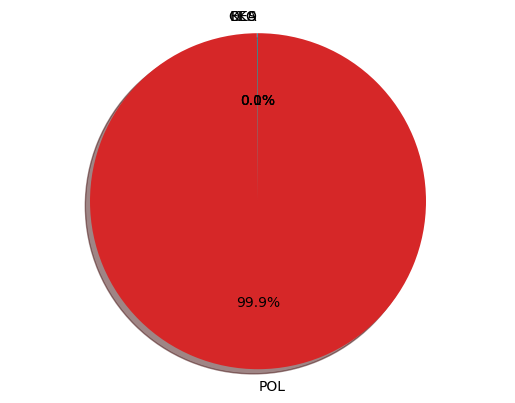

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'gembargembor koalisi besar senjata pamungkas pilpres 2024'

19/19 [==============================] - 0s 4ms/step


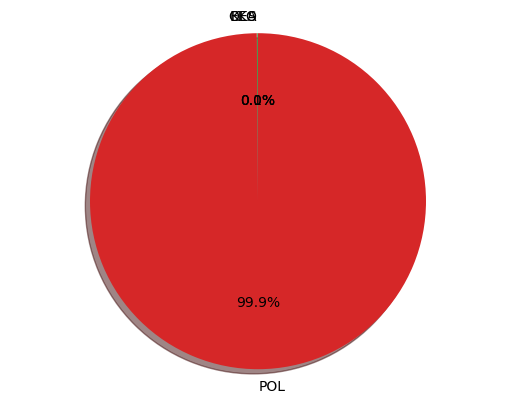

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'panas gelora dan pks sumsel saling lapor soal kantor dpw'

19/19 [==============================] - 0s 3ms/step


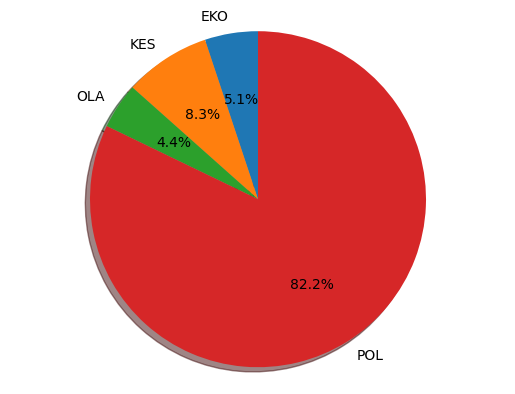

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'alasan pan tak undang nasdem dkk pro anies ke silaturahmi bareng jokowi'

19/19 [==============================] - 0s 4ms/step


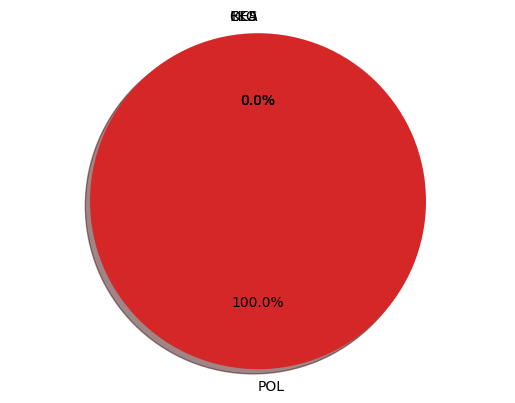

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'jelang pemilu kadiskominfo fokus perangi hoaks'

19/19 [==============================] - 0s 3ms/step


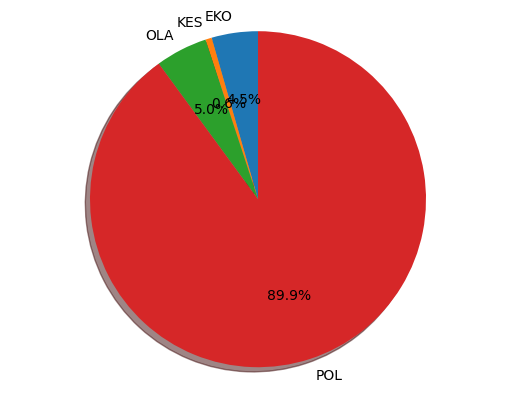

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'bukber golkar jabar kang ace sebut solidaritas jadi modal menang pemilu'

19/19 [==============================] - 0s 3ms/step


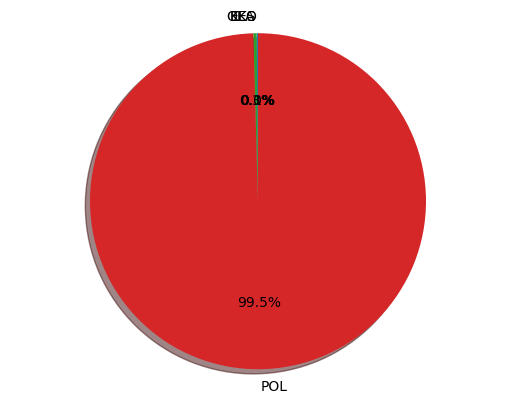

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'bawaslu tabanan fokus perlindungan hak pilih penyandang disabilitas'

19/19 [==============================] - 0s 4ms/step


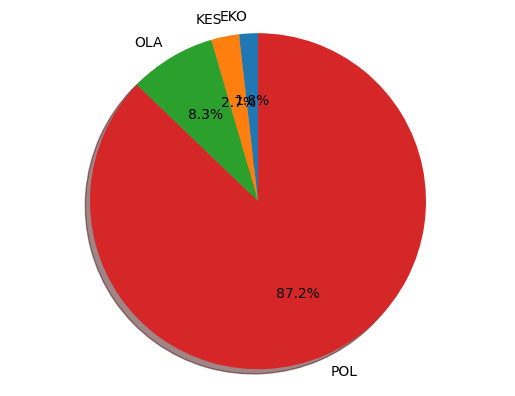

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'marak partai rekrut artiseks pejabat jadi bacaleg ngefek nggak sih'

19/19 [==============================] - 0s 4ms/step


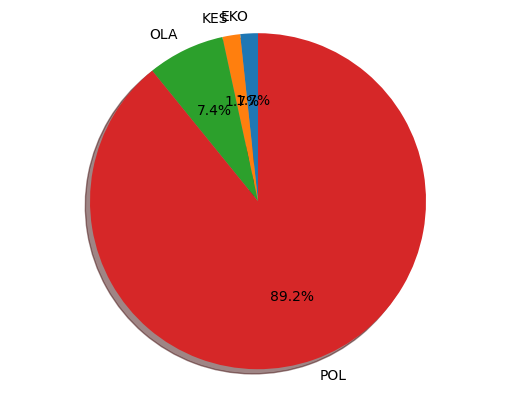

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'pkb bidik jabar jadi lumbung suara di pemilu 2024'

19/19 [==============================] - 0s 3ms/step


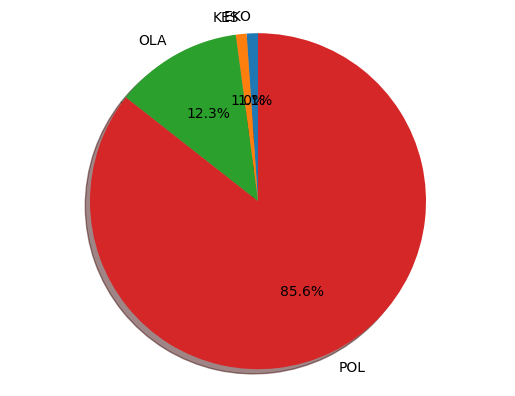

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'golkar jabar minta soksi jadi tulang punggung pemenangan partai'

19/19 [==============================] - 0s 4ms/step


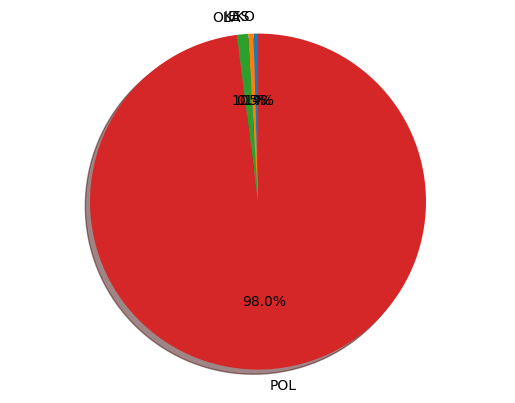

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'sandiaga bertemu ketua majelis ppp di tengah isu pindah partai insyaallah'

19/19 [==============================] - 0s 4ms/step


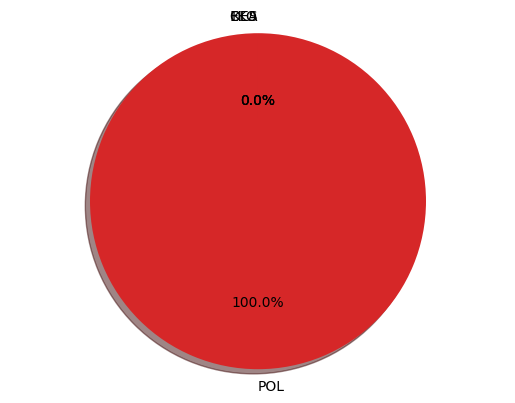

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'koalisi besar masih wacana tapi psi sudah gabung duluan'

19/19 [==============================] - 0s 3ms/step


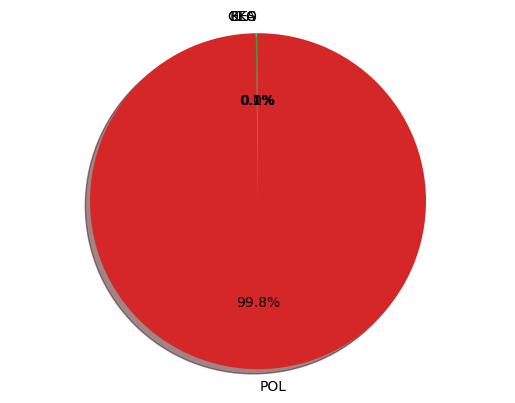

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'sekjen gerindra yakin wacana koalisi besar tak alot'

19/19 [==============================] - 0s 4ms/step


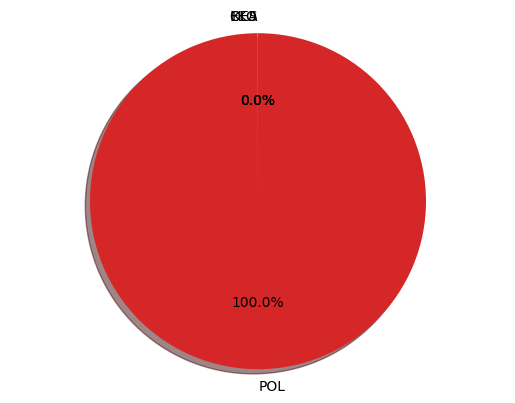

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'sowan ke ponpes raudlatut tarbiyyah airlangga didoakan jadi presiden'

19/19 [==============================] - 0s 4ms/step


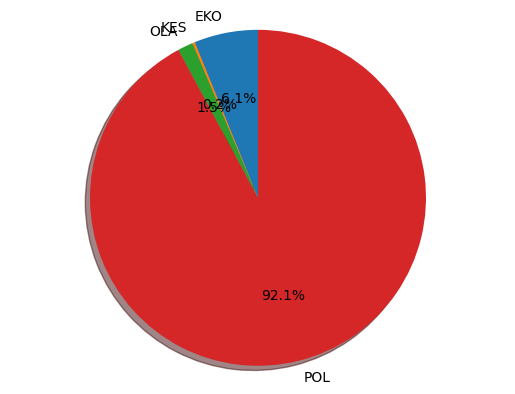

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'demokrat yakin nasdem tak tergoda koalisi besar sudah terikat sama kita'

19/19 [==============================] - 0s 4ms/step


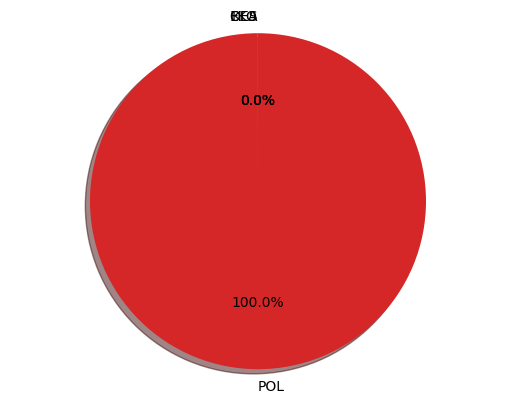

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'muzani sampaikan salam prabowo dan bicara politik saat bertemu khofifah'

19/19 [==============================] - 0s 3ms/step


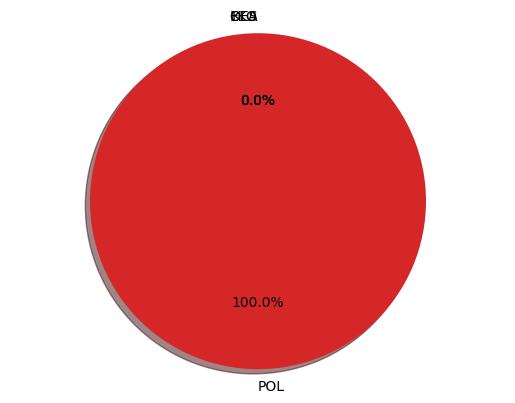

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'pkb koalisi besar akan sulit jika tak paham kesepakatan kkir'

19/19 [==============================] - 0s 4ms/step


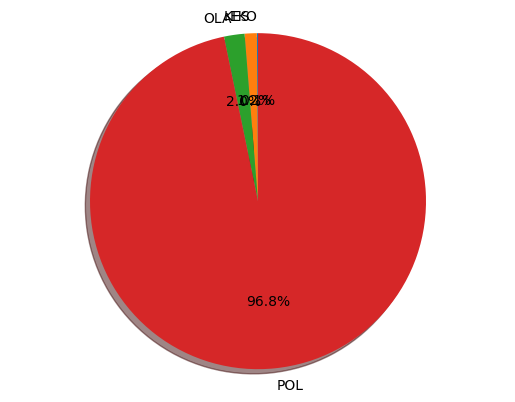

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'prabowo saya sama pdip tak seseram yang diharapkan'

19/19 [==============================] - 0s 3ms/step


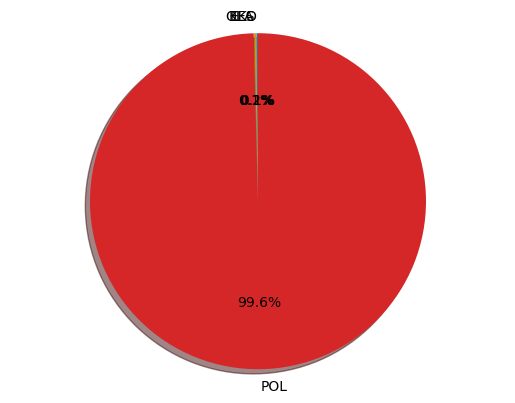

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'prabowo dunia alami ketegangan indonesia harus bersatu'

19/19 [==============================] - 0s 4ms/step


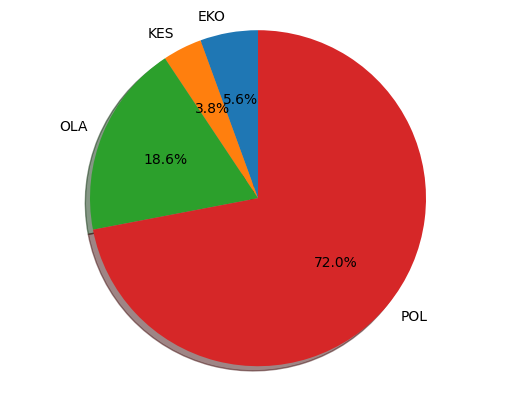

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'megawati ingin jatah ri 1 di koalisi besar golkar gabung saja dulu'

19/19 [==============================] - 0s 4ms/step


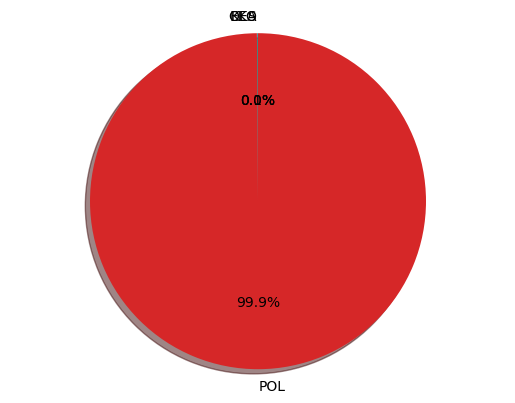

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'survei capres mipos usai pildun u20 ri batal ganjar melorot ke urutan 3'

19/19 [==============================] - 0s 4ms/step


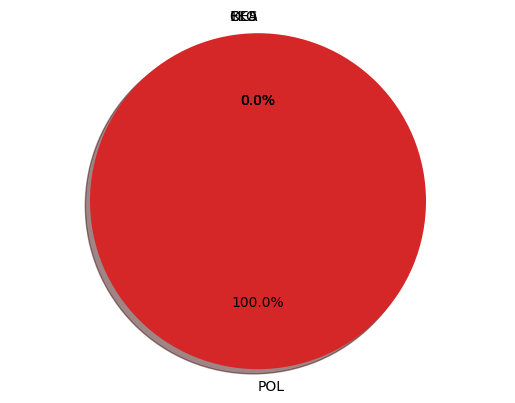

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'mega ingin jatah ri 1 jika gabung koalisi besar pan perlu kesepakatan'

19/19 [==============================] - 0s 4ms/step


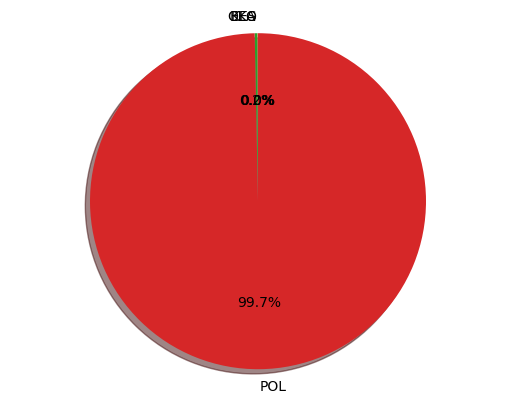

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'sandiaga dikabarkan pindah ppp gerindra ungkit lagi soal koordinasi'

19/19 [==============================] - 0s 5ms/step


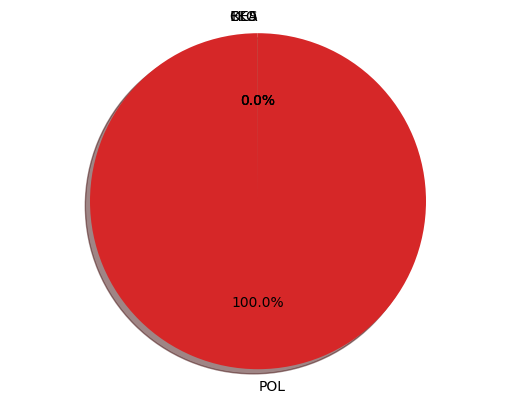

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'ppp anggap wajar megawati minta jatah ri 1 jika gabung koalisi besar'

19/19 [==============================] - 0s 4ms/step


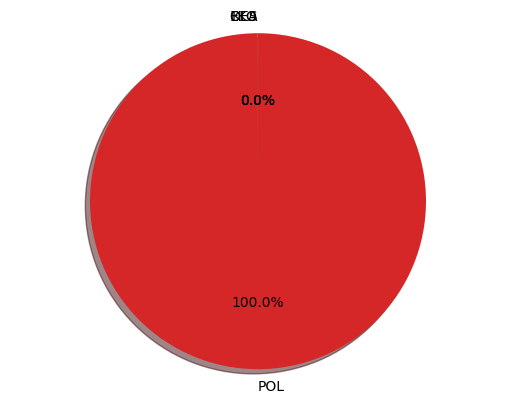

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'moeldoko tak menyerah picu gejolak demokrat daerah'

19/19 [==============================] - 0s 3ms/step


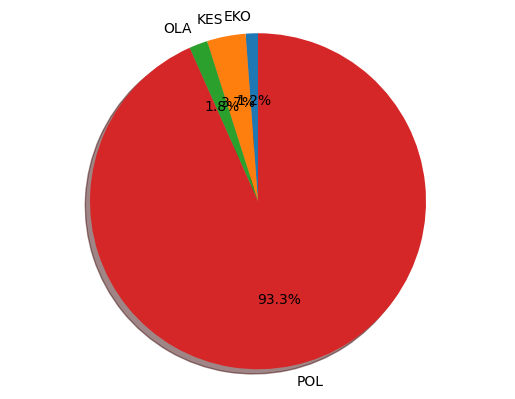

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'regina anggota termuda dprd kediri ajukan mundur pdip bilang dipecat'

19/19 [==============================] - 0s 4ms/step


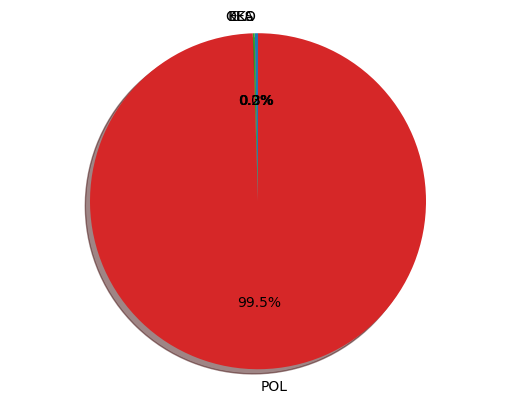

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'pd ungkap pengurus di 34 provinsi sambangi pengadilan usai pk moeldoko'

19/19 [==============================] - 0s 3ms/step


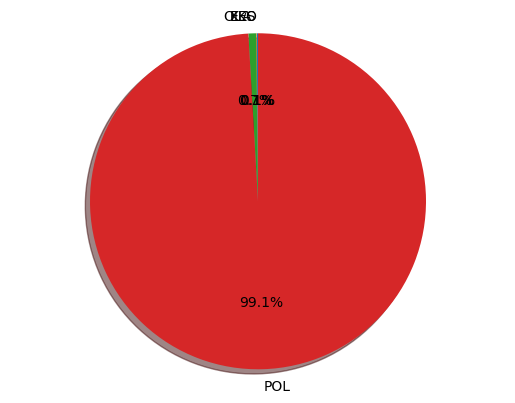

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'ppi pildun u20 batal di ri tak berdampak ke elektabilitas pdip dan ganjar'

19/19 [==============================] - 0s 3ms/step


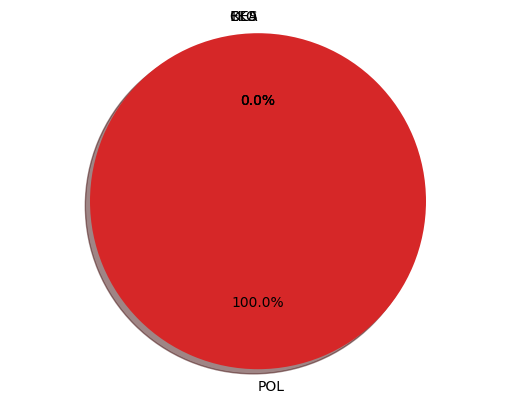

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'ppp eks kepala bnpt boy rafli amar bakal gabung ke partai'

19/19 [==============================] - 0s 3ms/step


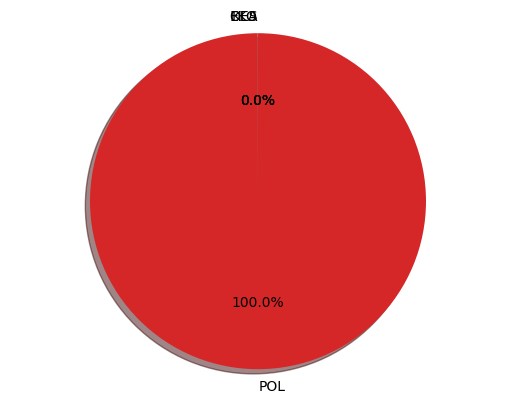

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'ppp ungkap sandiaga uno akan gabung partainya'

19/19 [==============================] - 0s 3ms/step


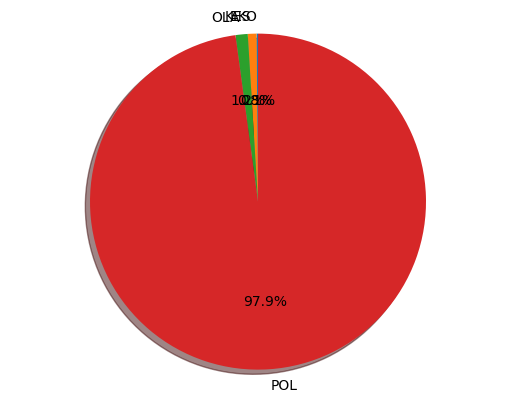

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'bakal bertemu ahy yang safari ramadan di solo ini jawaban gibran'

19/19 [==============================] - 0s 3ms/step


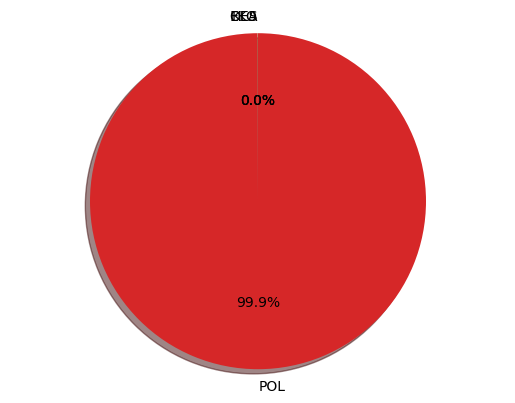

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'polri verifikasi ulang temuan 9198 personel masuk daftar pemilih 2024'

19/19 [==============================] - 0s 3ms/step


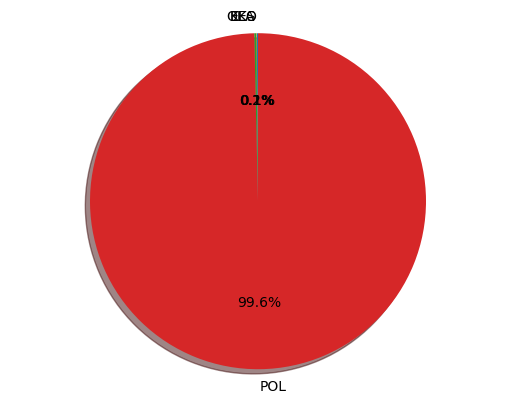

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'dpr sahkan perppu pemilu dan 8 ruu provinsi tito sekali pukul 9 uu'

19/19 [==============================] - 0s 3ms/step


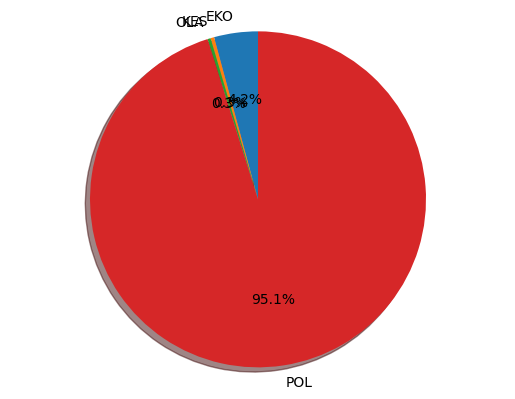

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'klasemen sementara the matchmaker berubah prabowoerick kini di puncak'

19/19 [==============================] - 0s 3ms/step


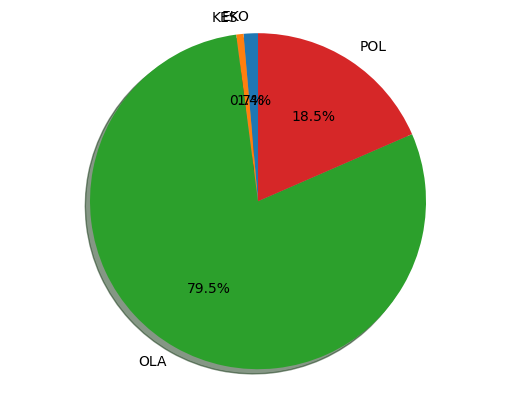

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'ahli hukum tata negara beberkan relasi parpol pengusung dengan presiden'

19/19 [==============================] - 0s 3ms/step


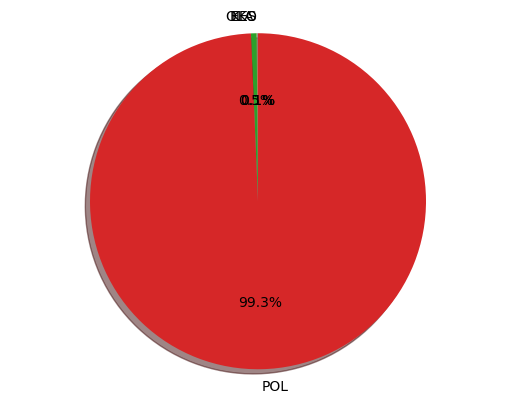

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'dpr sahkan perppu pemilu jadi undangundang'

19/19 [==============================] - 0s 3ms/step


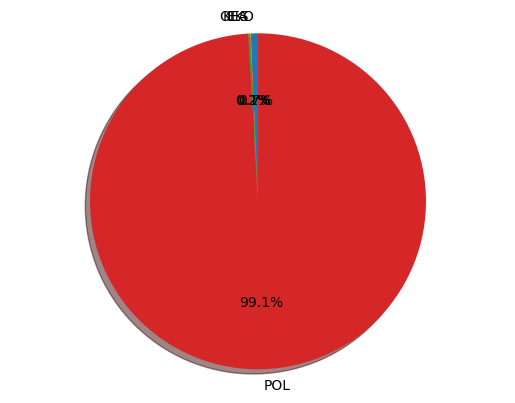

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'rapat paripurna pengesahan perppu pemilu jadi uu 43 anggota dpr hadir fisik'

19/19 [==============================] - 0s 2ms/step


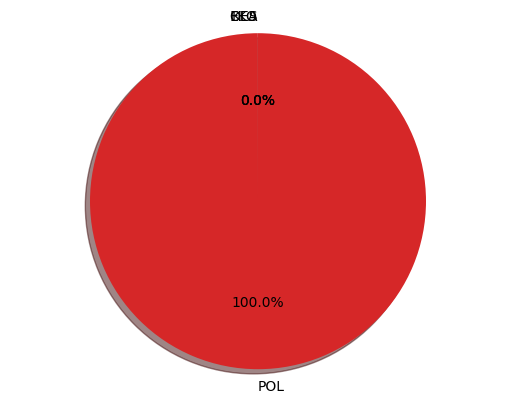

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'makin banyak tokoh angkat kaki dari nasdem'

19/19 [==============================] - 0s 3ms/step


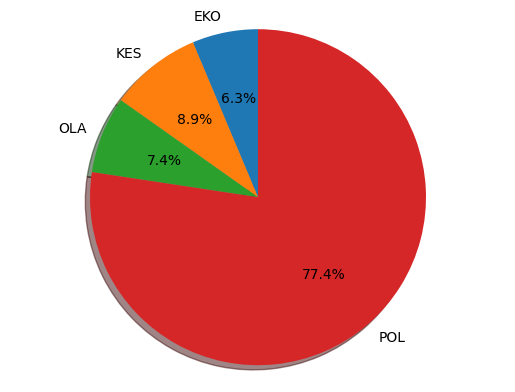

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'kpu gandeng himpunan psikologi cek kesehatan caleg dprdprd untuk 2024'

19/19 [==============================] - 0s 4ms/step


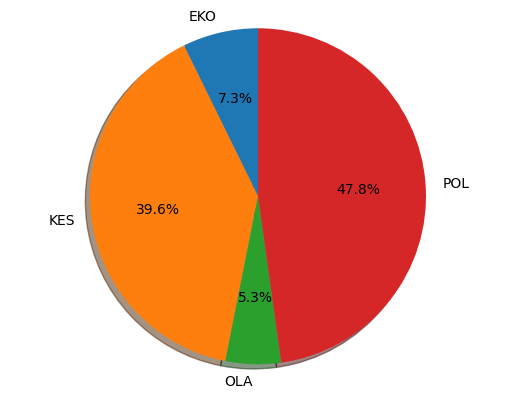

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'ketua kpu ogah komentar sanksi dkpp sudah disidang sudah cukup'

19/19 [==============================] - 0s 3ms/step


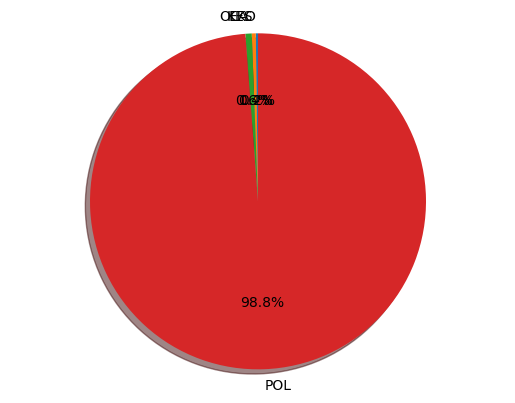

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'alasan connie bakrie mundur nasdem berorientasi flying highplaying cheap'

19/19 [==============================] - 0s 3ms/step


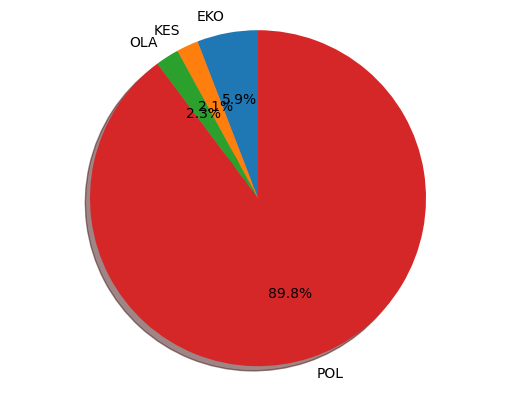

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'dkpp nyatakan komisioner kpu idham tak lakukan intimidasi'

19/19 [==============================] - 0s 4ms/step


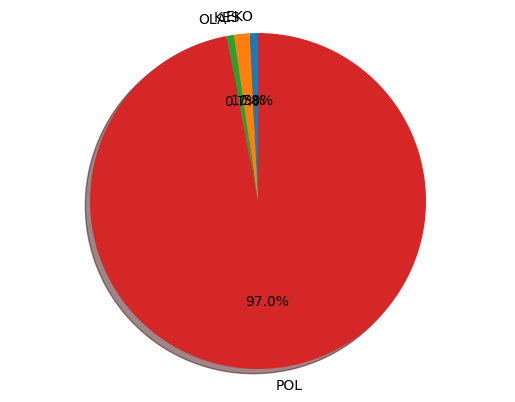

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'ketua komisi ii dpr insyaallah besok pagi perppu pemilu jadi uu'

19/19 [==============================] - 0s 3ms/step


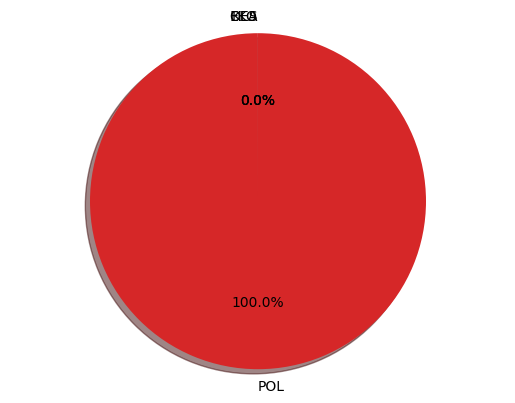

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'yusril ihza mahendra kunjungi prabowo kamis sore ini bahas pilpres 2024'

19/19 [==============================] - 0s 3ms/step


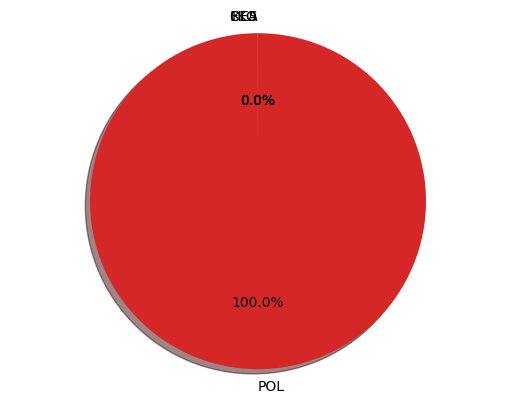

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'pkb pertemuan elite partai politik hanya bicara elektabilitas capres minim gagasan'

19/19 [==============================] - 0s 3ms/step


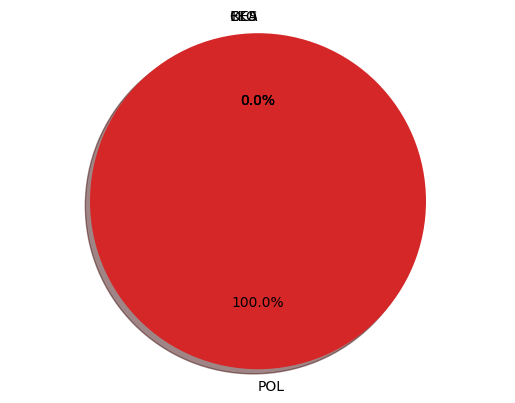

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'ditanya soal pembahasan capres hary tanoe koalisinya dulu yang dibicarakan'

19/19 [==============================] - 0s 3ms/step


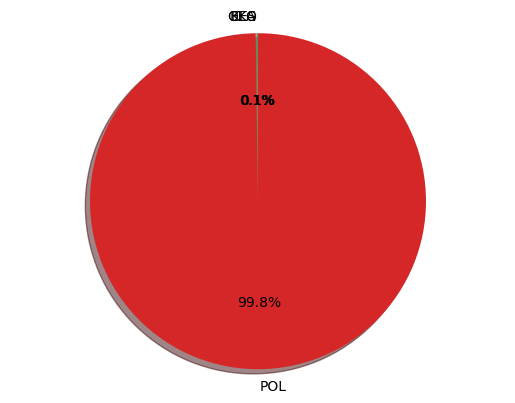

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'gerindra serahkan ke sandiaga uno soal rencana gabung ppp'

19/19 [==============================] - 0s 4ms/step


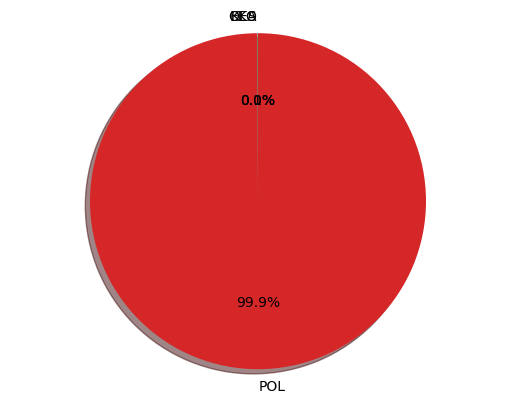

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'prabowo kita ingin barisan cukup besar untuk jamin keberlangsungan pembangunan'

19/19 [==============================] - 0s 3ms/step


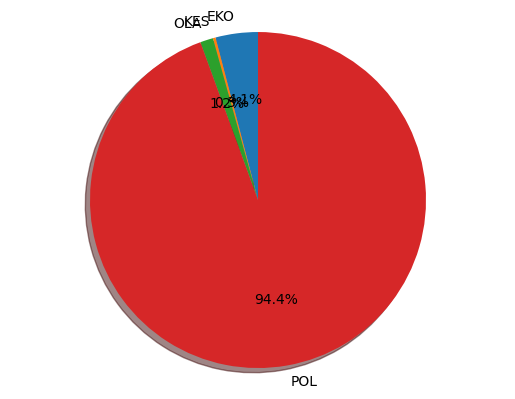

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'besok bawaslu umumkan hasil pengusutan kasus bagibagi amplop berlogo pdip di sumenep'

19/19 [==============================] - 0s 4ms/step


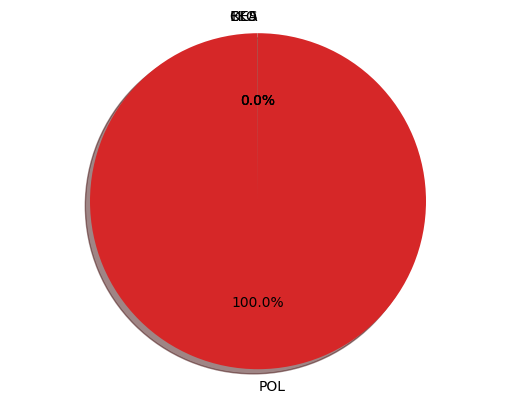

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'punya kualitas erick thohir dinilai layak jadi cawapres terkuat'

19/19 [==============================] - 0s 3ms/step


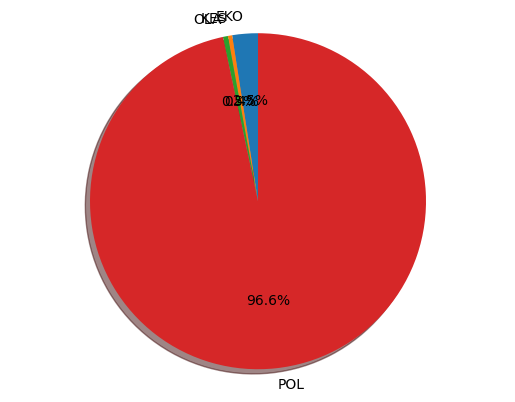

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'sandiaga uno positif pindah ppp kata politikus gerindra'

19/19 [==============================] - 0s 4ms/step


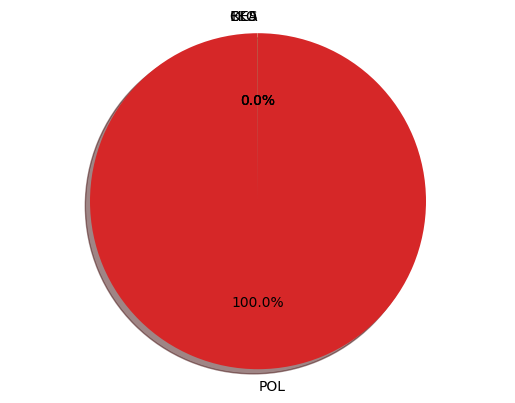

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'dpr undang sri mulyani dan mahfud md rapat bersama komisi iii bukan untuk ributribut'

19/19 [==============================] - 0s 3ms/step


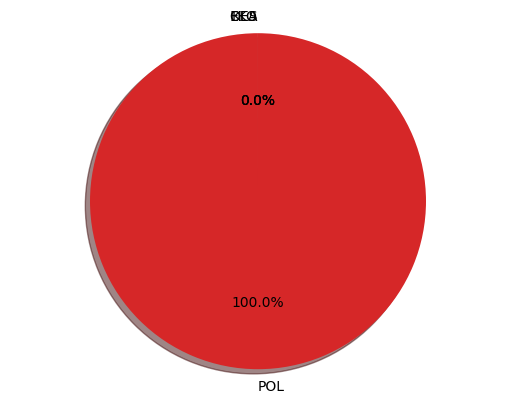

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'wacana koalisi besar di pilpres 2024 ppp tinggal finalisasi siapa capresnya'

19/19 [==============================] - 0s 3ms/step


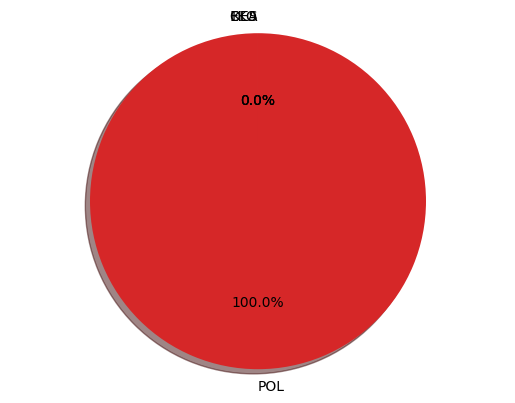

None

19/19 [==============================] - 0s 2ms/step
Best Prediction Adalah : Politik 



'setia pada jokowi alasan psi gabung ke koalisi besar kib dan kir'

19/19 [==============================] - 0s 4ms/step


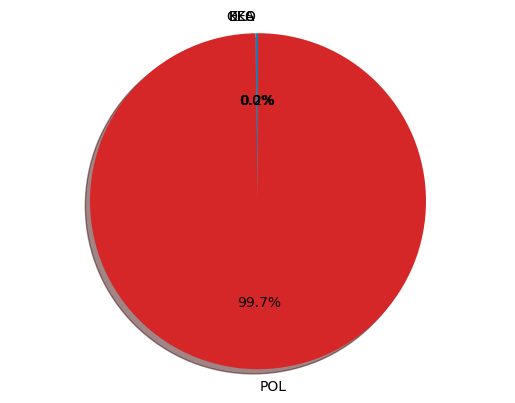

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'5 parpol betuk koalisi besar pengamat capres dari kkir cawapres dari kib'

19/19 [==============================] - 0s 3ms/step


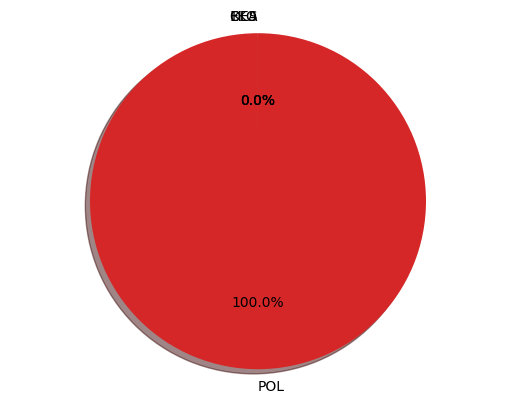

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'megawati bakal adakan pertemuan dengan kib dan kkir bahas wacana koalisi besar di pemilu 2024'

19/19 [==============================] - 0s 3ms/step


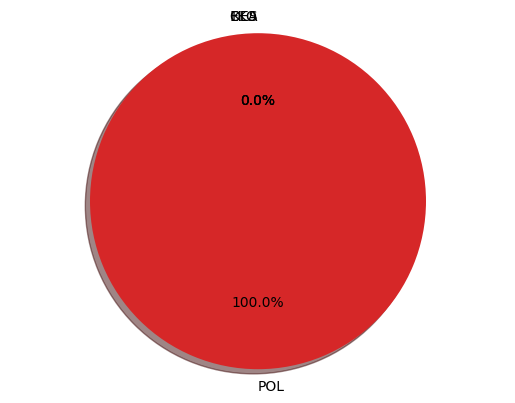

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'demokrat klaim koalisi besar sulit terbentuk sebut semuanya berebut posisi capres'

19/19 [==============================] - 0s 3ms/step


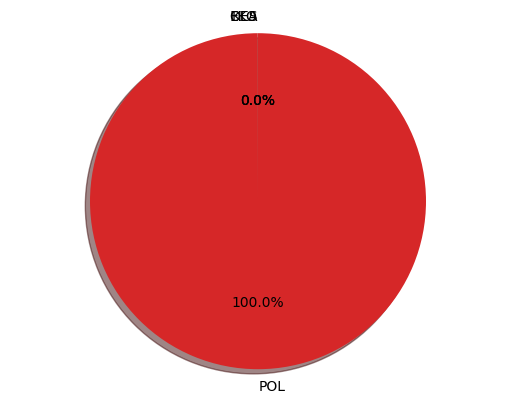

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'waketum golkar ide koalisi besar dari kelima parpol kemudian disambut baik jokowi'

19/19 [==============================] - 0s 3ms/step


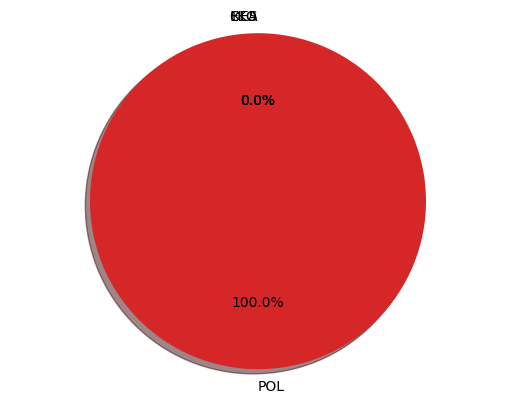

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'koalisi besar diwacanakan pks sebut bukan ancaman bagi koalisi perubahan'

19/19 [==============================] - 0s 3ms/step


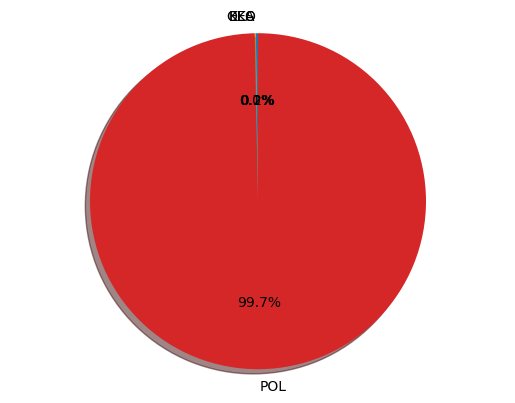

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'giring bismillah psi masuk koalisi besar tim jokowi hari ini'

19/19 [==============================] - 0s 3ms/step


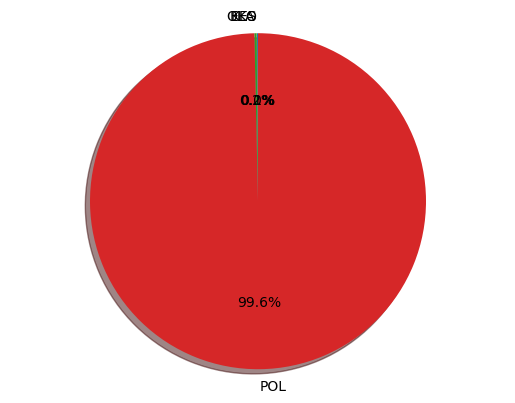

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'megawati setuju rencana koalisi besar budiman pdip boleh dong ajukan jadi ri 1'

19/19 [==============================] - 0s 3ms/step


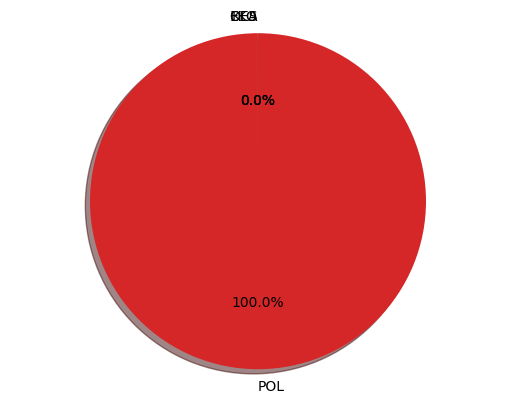

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'partai berkarya gugat kpu minta pemilu 2024 ditunda'

19/19 [==============================] - 0s 3ms/step


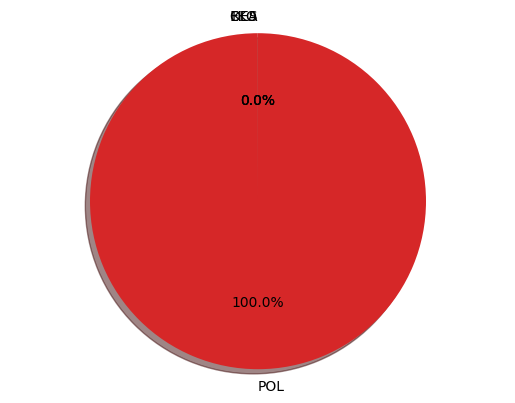

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'puan naiknya elektabilitas erick thohir sebagai cawapres 2024 bisa dijelaskan melalui data'

19/19 [==============================] - 0s 4ms/step


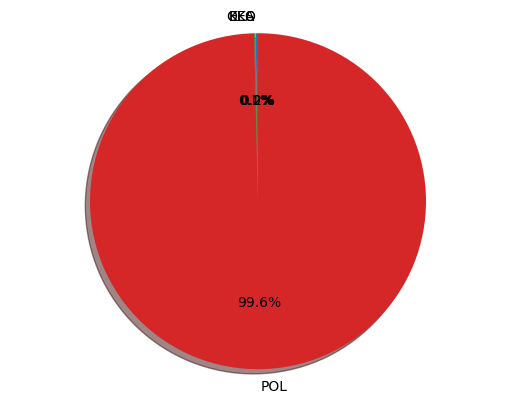

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'sanksi dkpp ke kpu dinilai bisa munculkan rasa ketidakpercayaan publik ke penyelenggara pemilu'

19/19 [==============================] - 0s 3ms/step


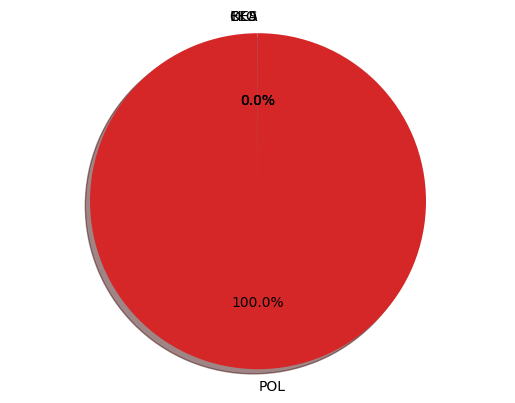

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'pan jika kibkkir bersatu banyak keuntungan elektoral bagi parpol'

19/19 [==============================] - 0s 3ms/step


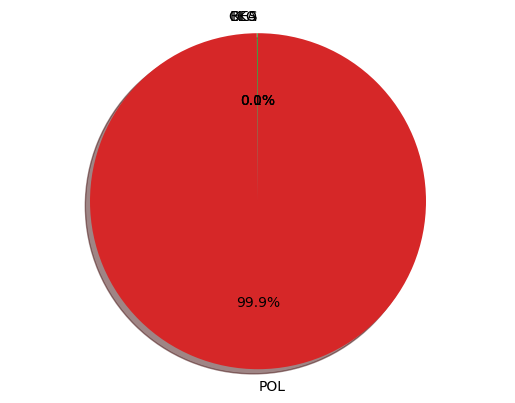

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'buka peluang koalisi dengan gerindra pdip prosesnya masih panjang'

19/19 [==============================] - 0s 4ms/step


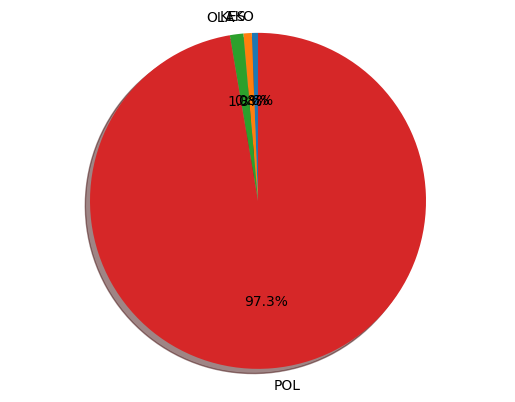

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'wacana duet prabowoairlangga untuk pilpres 2024 golkar kita belum bicara caprescawapres'

19/19 [==============================] - 0s 3ms/step


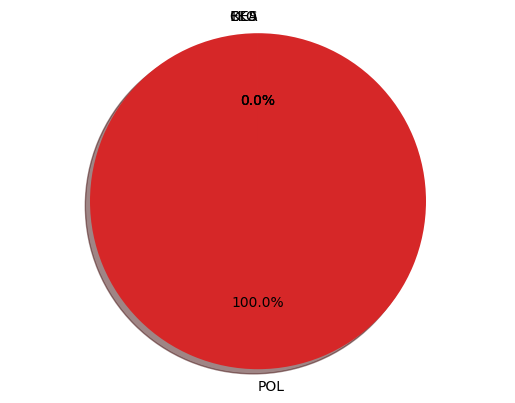

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'jubir ahlan wa sahlan sandiaga uno dan boy rafli amar akan gabung ppp'

19/19 [==============================] - 0s 3ms/step


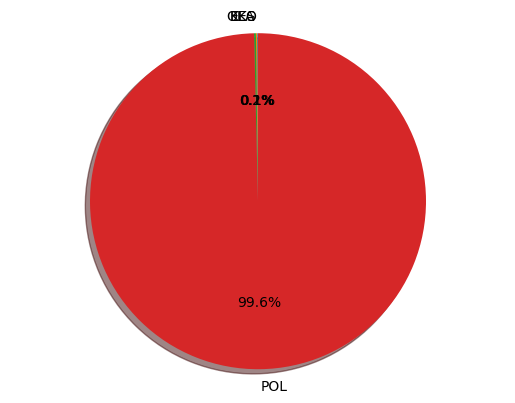

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'peluang dampingi prabowo airlangga pimpinan koalisi besar dibahas pada chapter berikutnya'

19/19 [==============================] - 0s 3ms/step


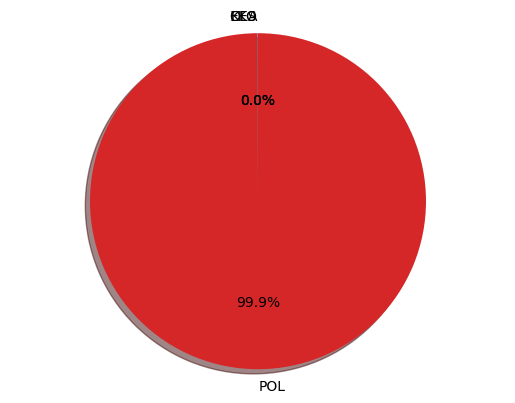

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'mahfud md lebih baik punya dpr dan parpol jelek daripada tak ada sama sekali'

19/19 [==============================] - 0s 4ms/step


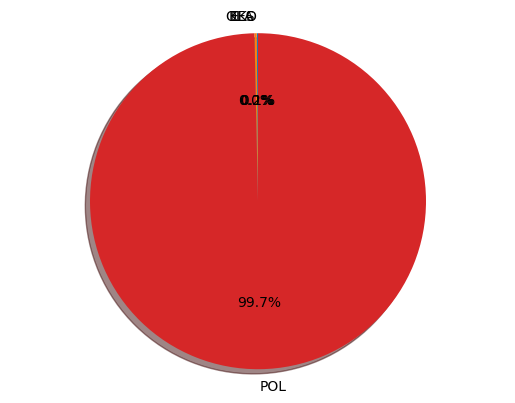

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'loyalis murka anas urbaningrum disebut sejarah kelam partai demokrat'

19/19 [==============================] - 0s 3ms/step


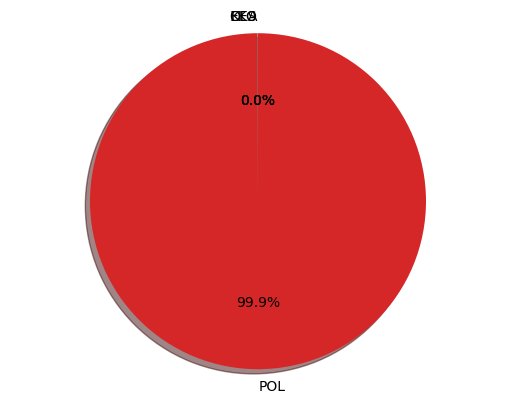

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'dpr setujui perppu pemilu menjadi undangundang'

19/19 [==============================] - 0s 3ms/step


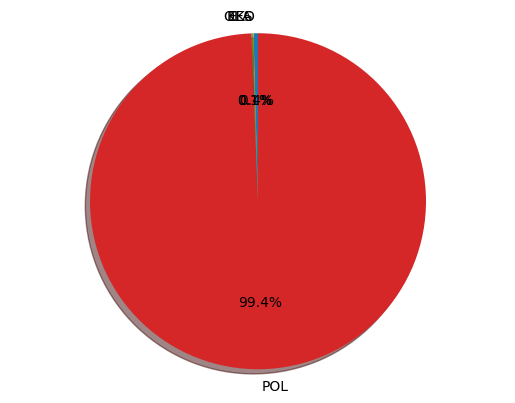

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'pengamat politik jika koalisi besar kibkkir terbentuk jokowi jadi king maker 2024'

19/19 [==============================] - 0s 3ms/step


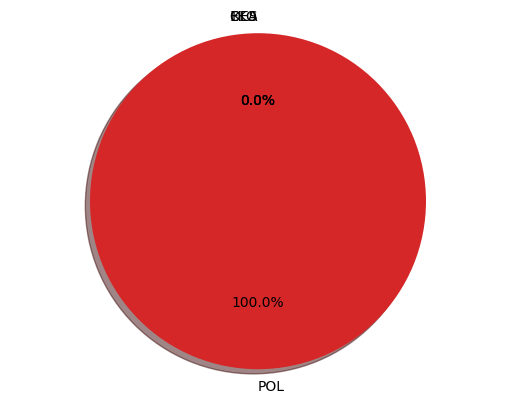

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'wacana koalisi besar kibkkir pks lebih baik diputaran kedua'

19/19 [==============================] - 0s 3ms/step


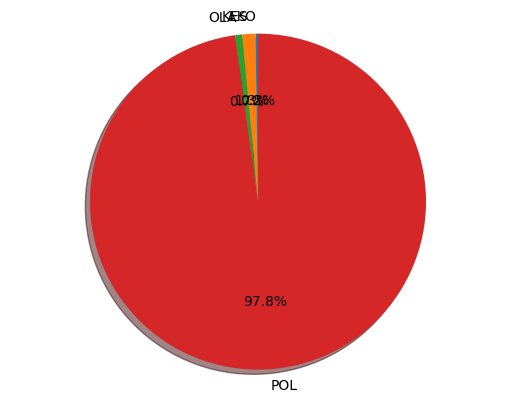

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'pengamat duet prabowoairlangga merepresentasikan arah politik jokowi'

19/19 [==============================] - 0s 3ms/step


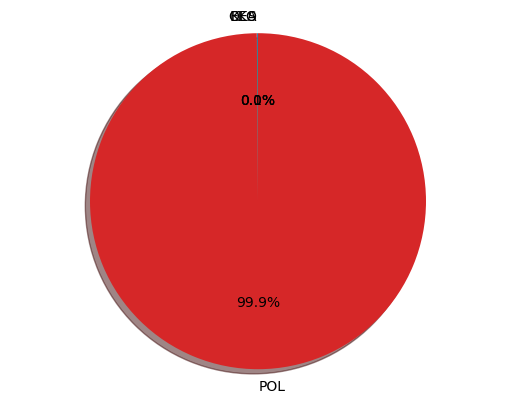

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'gugat batas minimal usia capres dan cawapres ke mk psi sebut ingin anak muda punya hak'

19/19 [==============================] - 0s 3ms/step


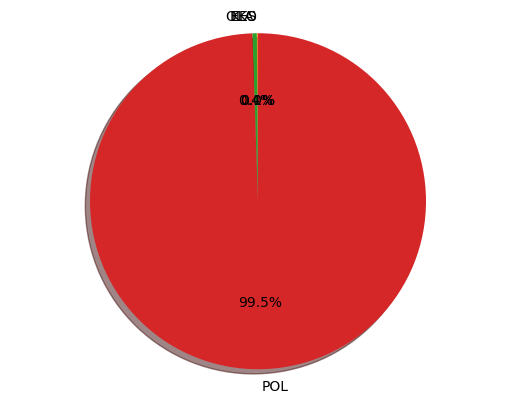

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'kasus rafael alun bawa nama artis sahroni minta dicek kebenarannya'

19/19 [==============================] - 0s 3ms/step


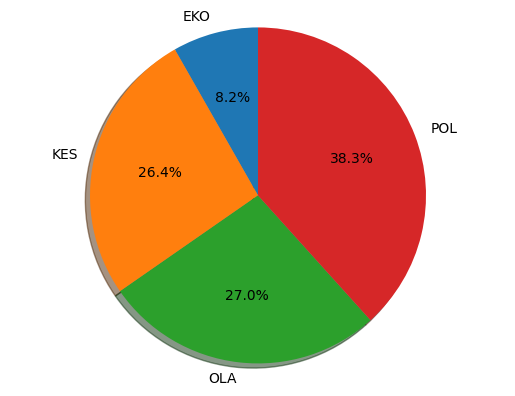

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'golkar singgung soal koalisi besar pdip masih ambil posisi sendiri kita hormati'

19/19 [==============================] - 0s 3ms/step


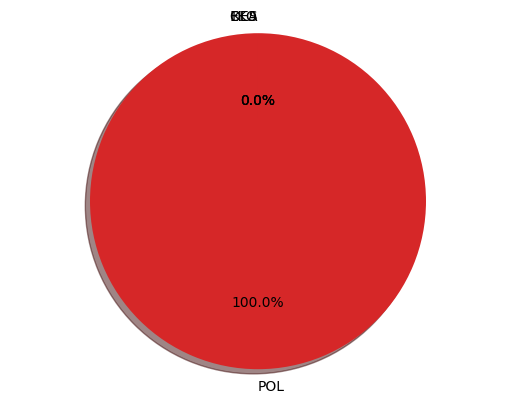

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'hasto ingatkan penataan kampus harus terintegrasi dengan kebijakan strategis pembangunan'

19/19 [==============================] - 0s 3ms/step


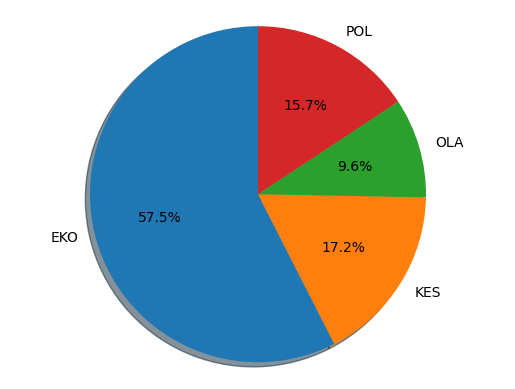

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'sahroni soal dito jadi menpora akhirnya dijabat anak muda punya track record baik'

19/19 [==============================] - 0s 4ms/step


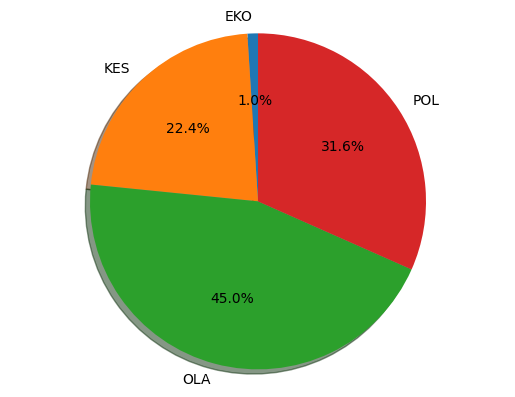

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Olahraga 



'golkar serius matangkan konsep pembentukan koalisi besar menang pilpres 2024 jadi target utama'

19/19 [==============================] - 0s 3ms/step


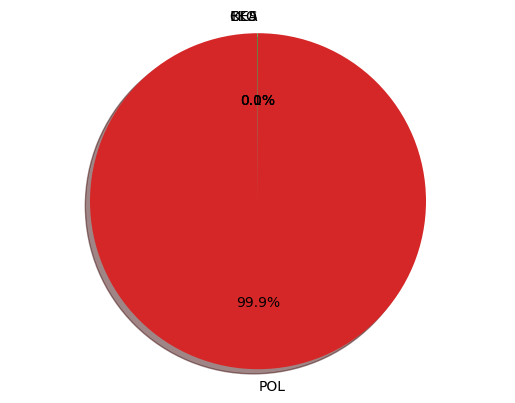

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'alasan airlangga ajukan dito ariotedjo jadi menpora termuda gantikan zainudin amali'

19/19 [==============================] - 0s 3ms/step


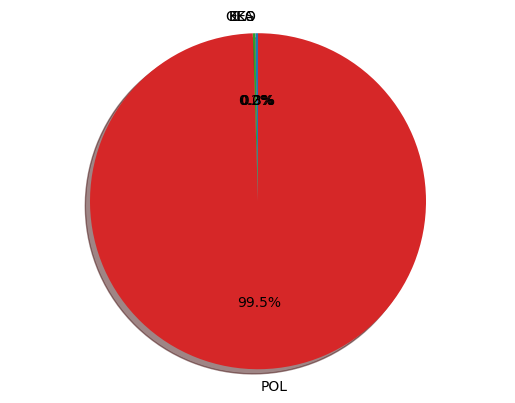

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'tak ikut pertemuan 5 ketum parpol dengan jokowi pdip kami diundang kok'

19/19 [==============================] - 0s 3ms/step


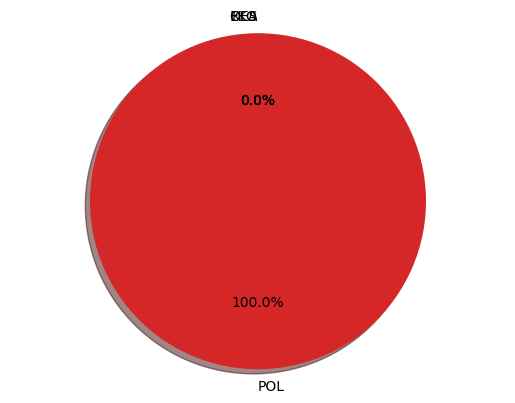

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'soal upaya pk demokrat deli serdang moeldoko ora ngerti aku'

19/19 [==============================] - 0s 4ms/step


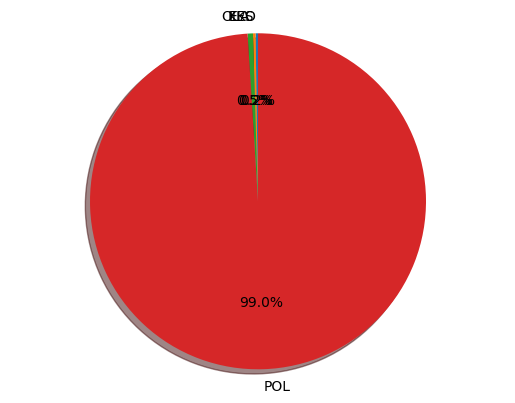

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'pdip nilai wajar adanya koalisi besar parpol walau terminologi ini tak dianut indonesia'

19/19 [==============================] - 0s 3ms/step


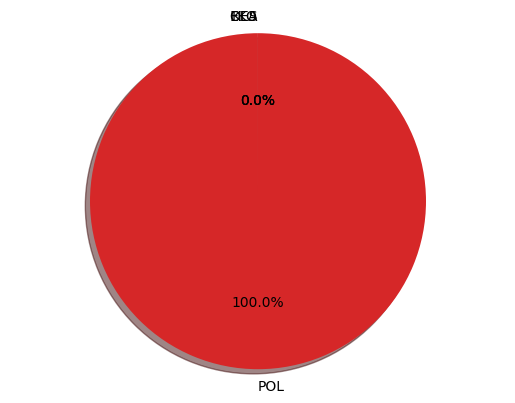

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'golkar dito ariotedjo anak muda kreatif dan inovasinya terlihat selama pimpin ampi'

19/19 [==============================] - 0s 2ms/step


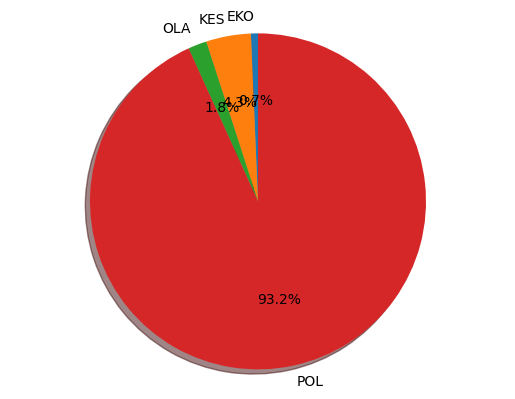

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'ahy perilaku moeldoko tidak mencerminkan sikap kesatria'

19/19 [==============================] - 0s 3ms/step


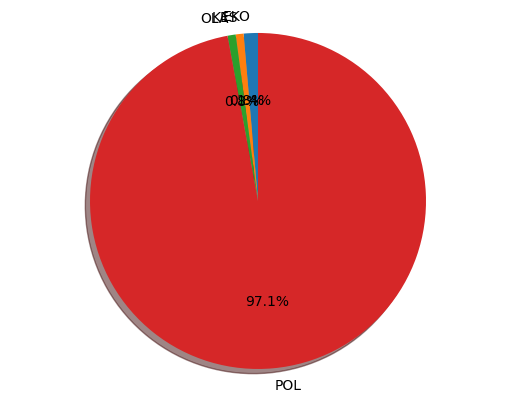

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'pdip koalisi besar tidak menjamin kemenangan pemilu 2024 ditentukan figur capres'

19/19 [==============================] - 0s 3ms/step


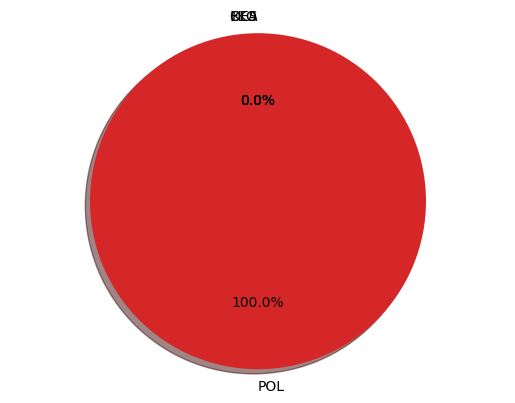

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'gigih perjuangkan piala dunia u20 nama erick thohir melejit'

19/19 [==============================] - 0s 4ms/step


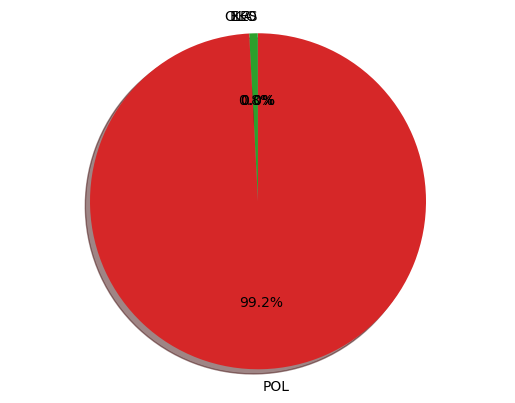

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'pdip nyatakan siap bekerja sama dengan koalisi besar'

19/19 [==============================] - 0s 3ms/step


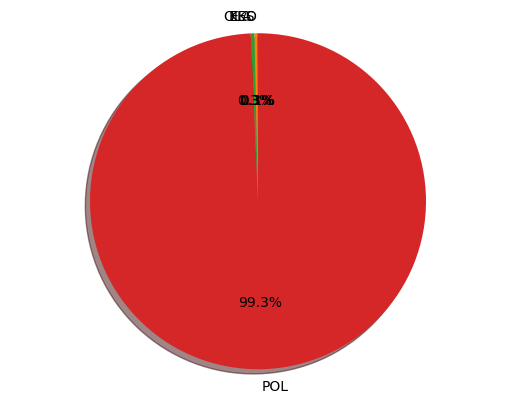

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'ahy ungkap motif moeldoko rebut demokrat ingin gagalkan pencapresan anies dan bubarkan koalisi perubahan'

19/19 [==============================] - 0s 3ms/step


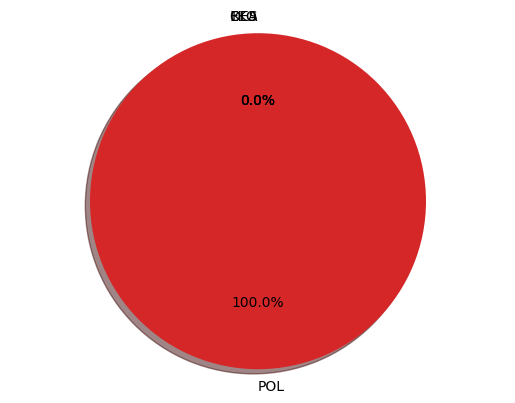

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'pdip soal gagasan koalisi besar bagus sekali semakin baik dan ringan untuk menang'

19/19 [==============================] - 0s 4ms/step


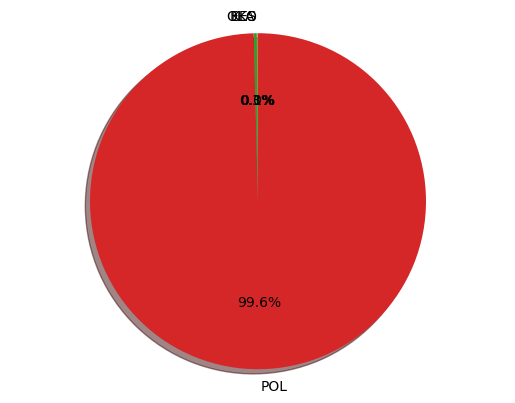

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'csis gelar konferensi dorong minat anak muda dalam politik'

19/19 [==============================] - 0s 3ms/step


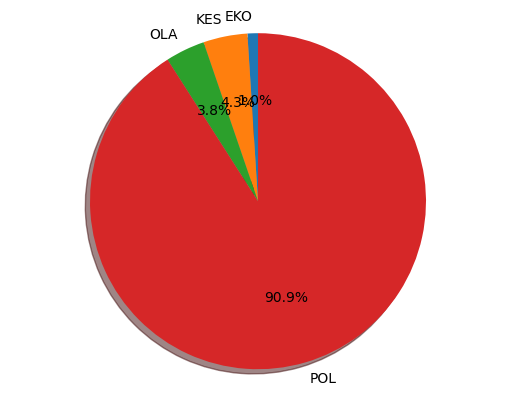

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'partai perindo komitmen siapkan kuota keterwakilan perempuan di politik'

19/19 [==============================] - 0s 3ms/step


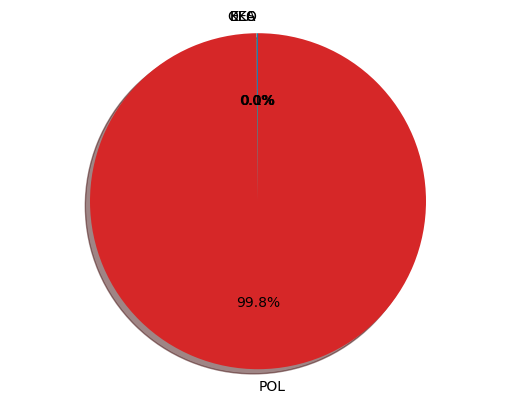

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'menguak siapa dalang yang memulai perang dunia ke2'

19/19 [==============================] - 0s 3ms/step


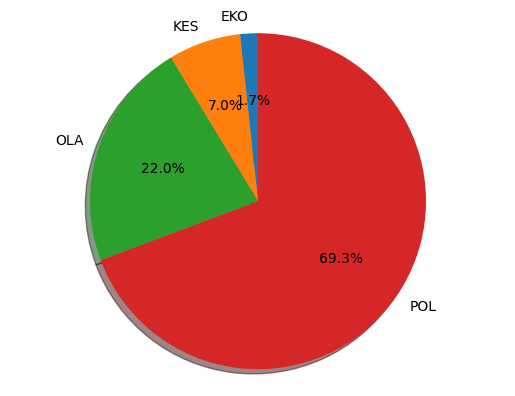

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'sri mulyani tahun politik perbedaan tak berarti saya benci kamu'

19/19 [==============================] - 0s 3ms/step


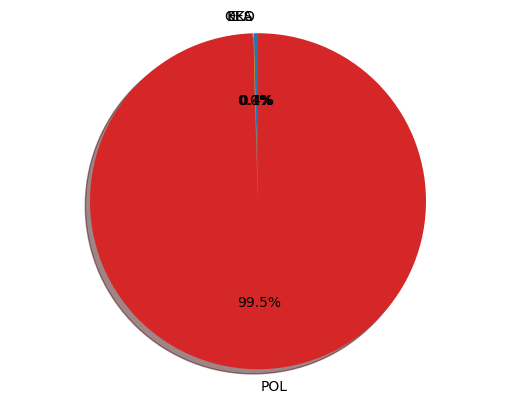

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'kaesang mau terjun ke politik jokowi saya tidak mempengaruhi'

19/19 [==============================] - 0s 4ms/step


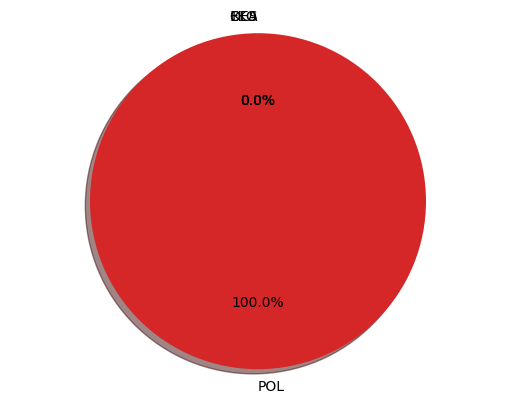

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'indonesia political power sistem proporsional tertutup menghambat partisipasi politik'

19/19 [==============================] - 0s 3ms/step


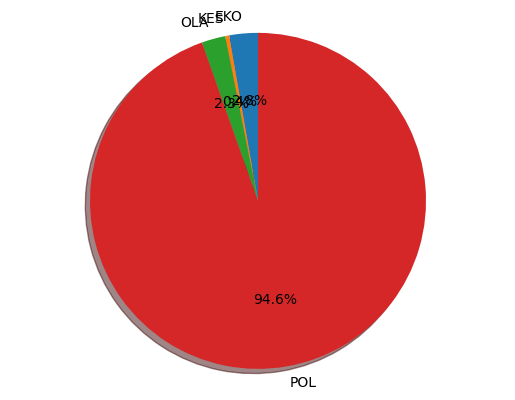

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'cerita ketua dpw pemuda perindo dki punya keinginan harus buat proposal ke orangtua'

19/19 [==============================] - 0s 3ms/step


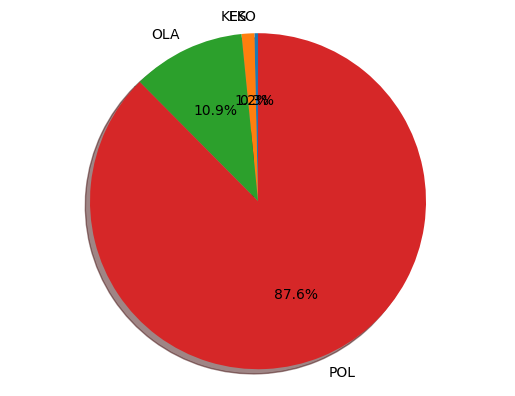

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'demo bubar jalan di depan gedung dpr kembali dibuka'

19/19 [==============================] - 0s 3ms/step


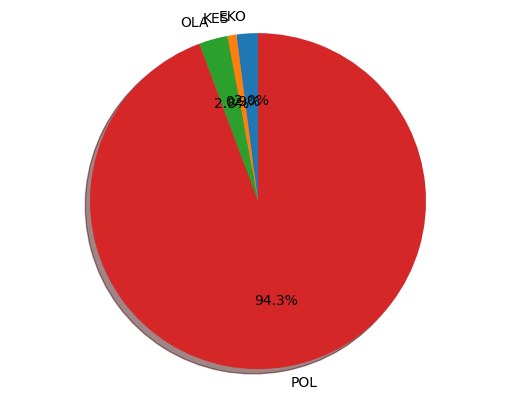

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'meski terbuka sidang vonis anak ag dibatasi untuk 20 orang'

19/19 [==============================] - 0s 4ms/step


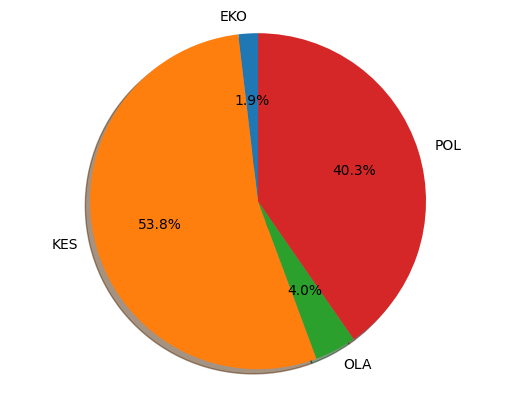

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'ada demo mahasiswa di dpr arus lalu lintas dialihkan'

19/19 [==============================] - 0s 3ms/step


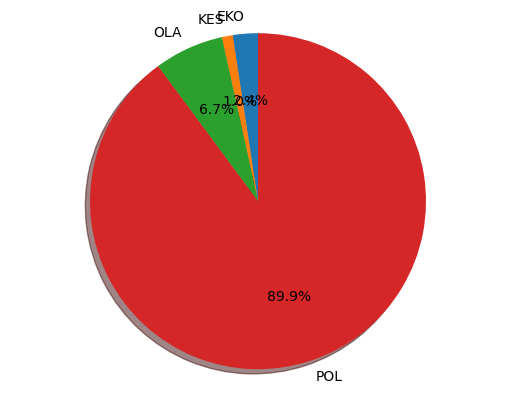

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'pj gubernur dki geram kasi sudin perumahan rakyat selvy mandagi nginap di kempinski rp27 juta'

19/19 [==============================] - 0s 3ms/step


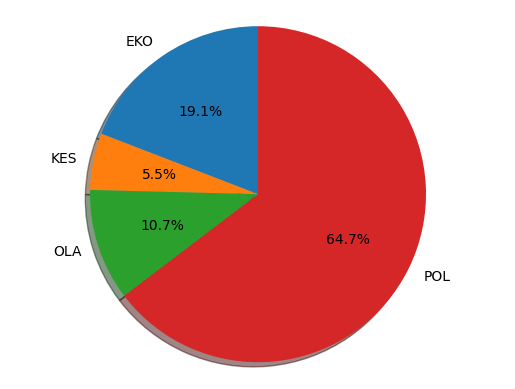

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'mars perindo versi terbaru tunjukkan keindahan keberagaman indonesia'

19/19 [==============================] - 0s 4ms/step


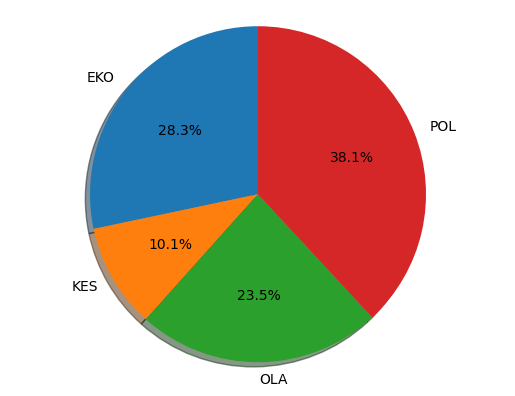

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'dpp rpa perindo gelar konsolidasi dengan dpd rpa perindo jaksel'

19/19 [==============================] - 0s 4ms/step


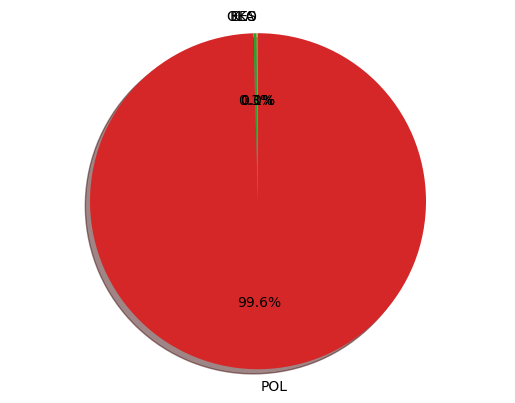

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'silaturahmi dengan pbb prabowo kami terbuka kerja sama dengan siapa saja'

19/19 [==============================] - 0s 3ms/step


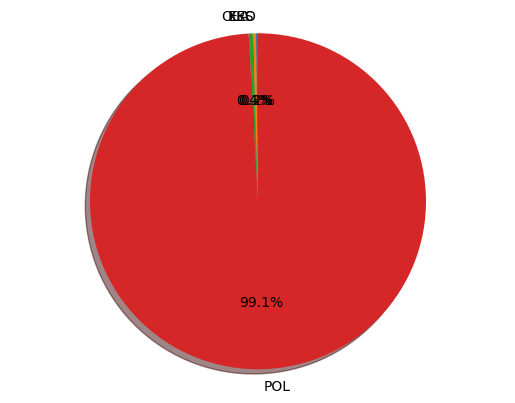

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'heboh ruang penyidik kosong buntut polemik brigjen endar ini kata kpk'

19/19 [==============================] - 0s 3ms/step


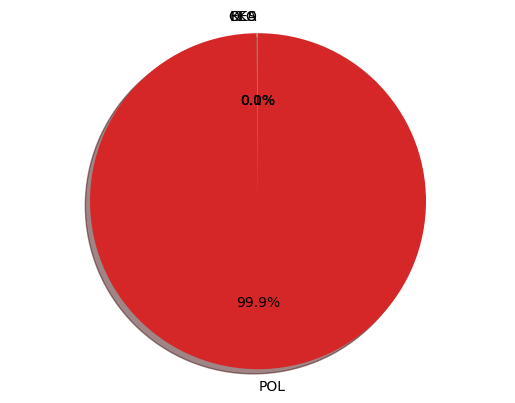

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'berkat kunjungan zelensky polandia janji pasok lebih banyak jet tempur ke ukraina'

19/19 [==============================] - 0s 3ms/step


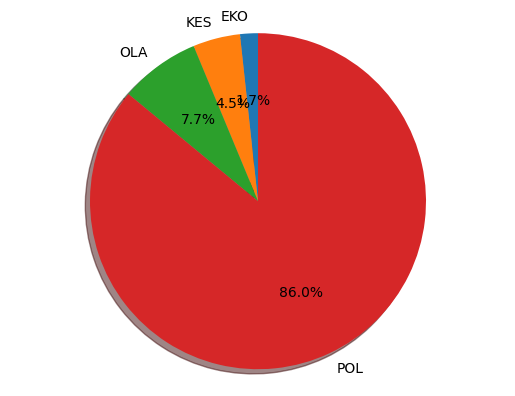

None

19/19 [==============================] - 0s 2ms/step
Best Prediction Adalah : Politik 



'modus gratifikasi rafael alun giring wajib pajak bermasalah konsul ke perusahaannya hasilkan rp 13 miliar'

19/19 [==============================] - 0s 3ms/step


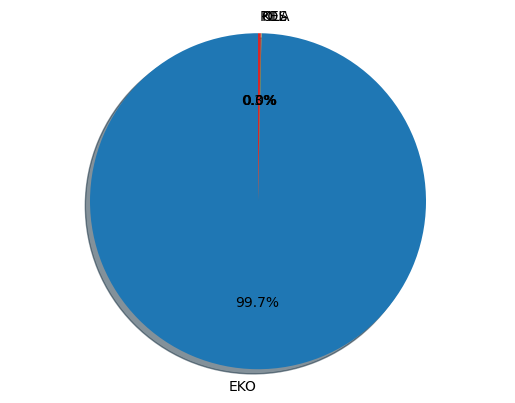

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Ekonomi 



'pemberi gratifikasi rafael alun trisambaodo bisa dipidana jika'

19/19 [==============================] - 0s 3ms/step


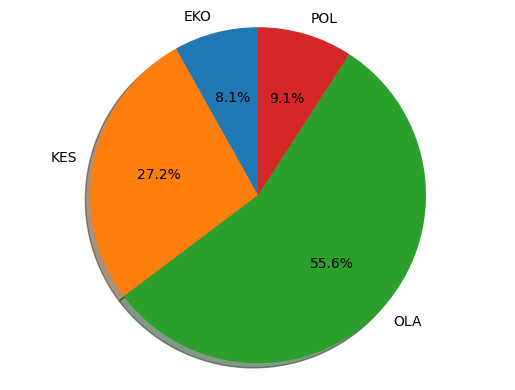

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Olahraga 



'banyak polemik pendirian rumah ibadah kemenag pemda wajib fasilitasi'

19/19 [==============================] - 0s 3ms/step


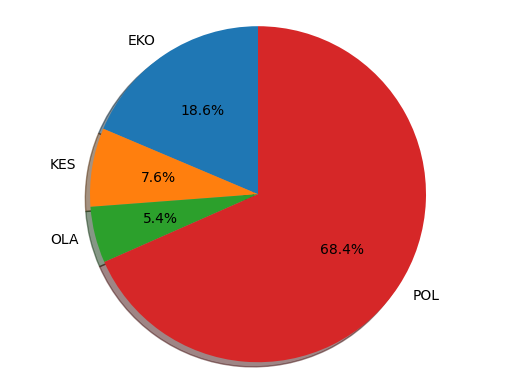

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'kuasa hukum d harap hakim tunggal vonis ag dengan enam tahun penjara'

19/19 [==============================] - 0s 4ms/step


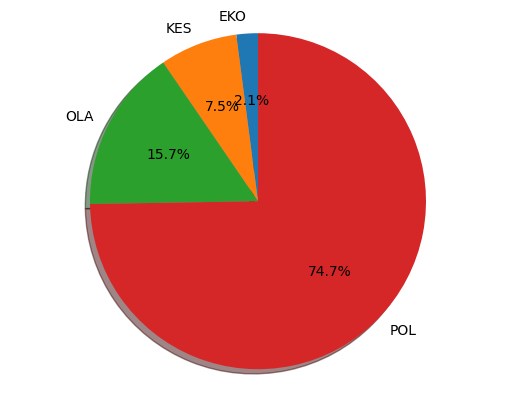

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'mui sebut pihak bermesraan dengan israel tak punya hati nurani'

19/19 [==============================] - 0s 3ms/step


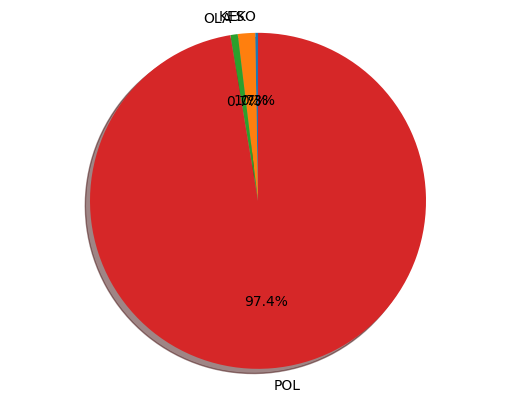

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'rudiantara ungkap kemenhan kembalikan operator satelit ke kominfo tahun 2018'

19/19 [==============================] - 0s 4ms/step


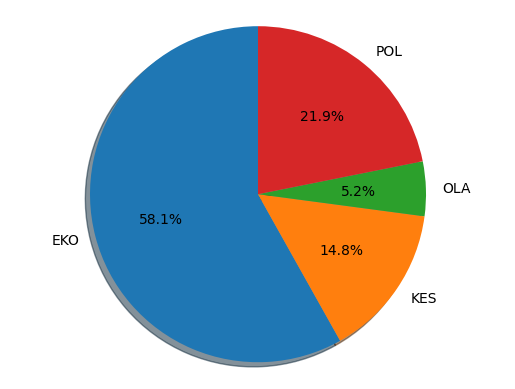

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Ekonomi 



'pemilu 2024 kurang dari satu tahun lagi prabowo anggap wajar pimpinan parpol kerap bertemu'

19/19 [==============================] - 0s 3ms/step


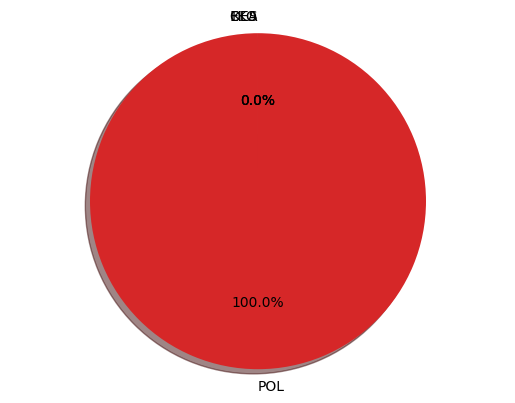

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'gerindra masih berharap sandiaga uno tidak pindah ke partai lain'

19/19 [==============================] - 0s 5ms/step


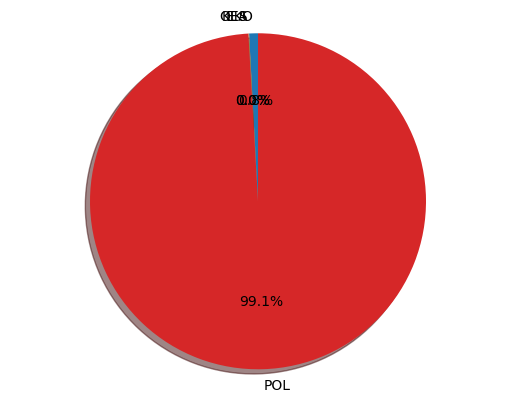

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'penasihat hukum minta ag divonis bebas'

19/19 [==============================] - 0s 3ms/step


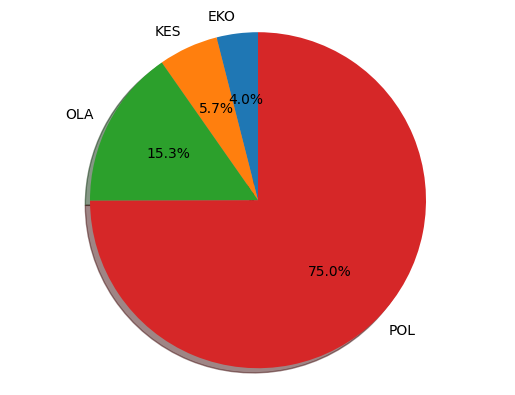

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'prabowo di depan yusril jangan saling hujat dan ejek hal negatif itu tak cocok untuk budaya indonesia'

19/19 [==============================] - 0s 3ms/step


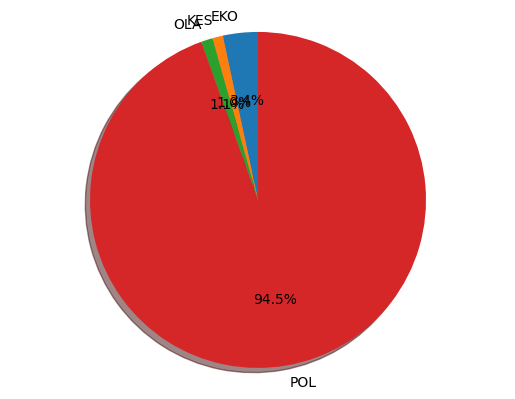

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'anggota komisi ii tata ruang ikn dan daerah penyangga harus segera diselesaikan'

19/19 [==============================] - 0s 3ms/step


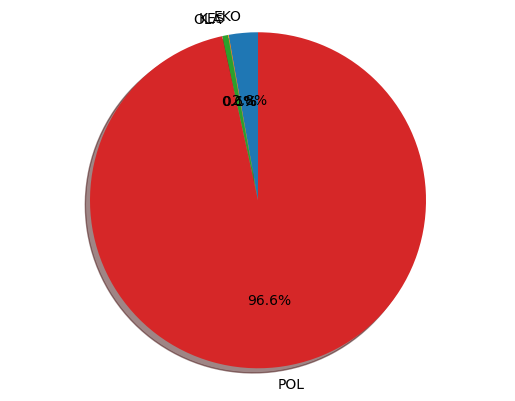

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'demokrat anggap kemacetan jakarta bertambah parah karena anies tak lagi memimpin'

19/19 [==============================] - 0s 3ms/step


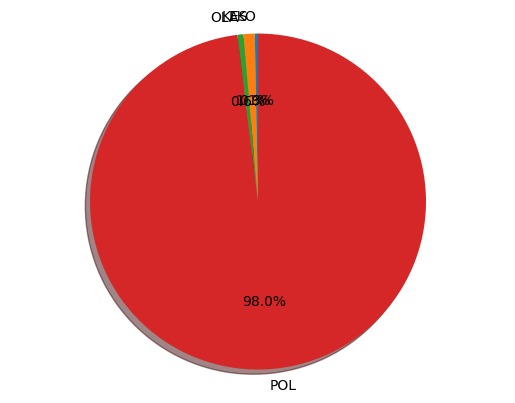

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'singgung soal bagibagi amplop berlogo pdip di masjid bawaslu ingatkan sanksi berat politik uang'

19/19 [==============================] - 0s 3ms/step


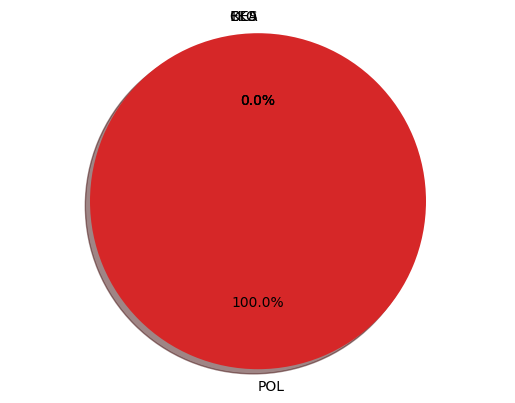

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'komisi v dpr minta stmkg tingkatkan kompetensi lulusannya'

19/19 [==============================] - 0s 3ms/step


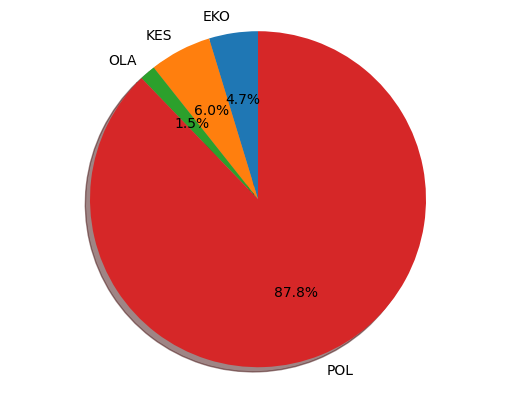

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'demo minta firli bahuri dicopot memanas massa nyalakan flare dan bentrok dengan polisi'

19/19 [==============================] - 0s 3ms/step


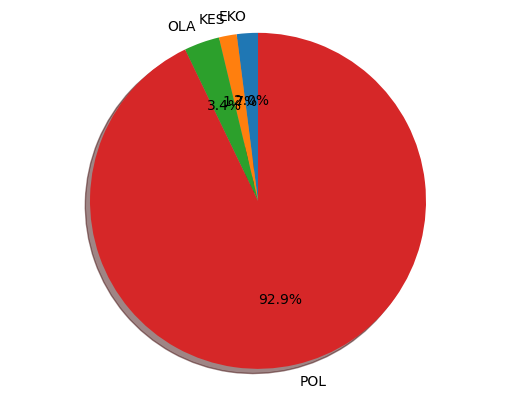

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'kapolri sebut masalah endar priantoro akan diselesaikan di internal kpk'

19/19 [==============================] - 0s 3ms/step


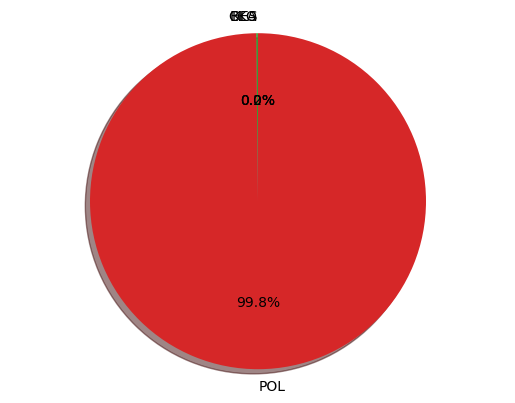

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'bupati zaki terima delegasi as yang tinjau program sanitasi dan air minum di tangerang'

19/19 [==============================] - 0s 3ms/step


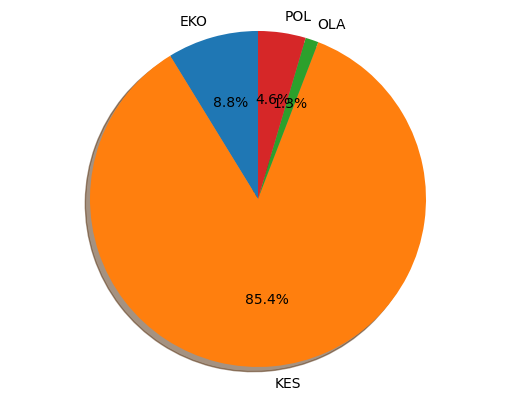

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Kesehatan 



'rudiantara ungkap alasan kemenhan jadi operator satelit slot orbit 123'

19/19 [==============================] - 0s 3ms/step


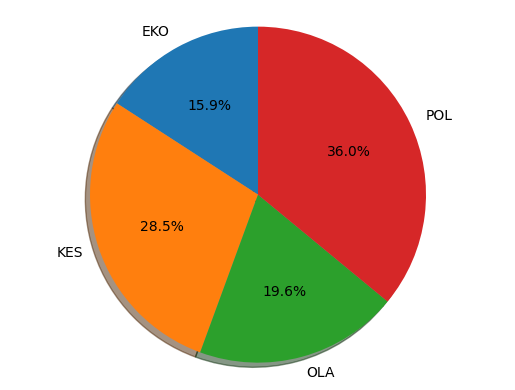

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'pb pmii hingga hmi geruduk kpk protes pencopotan endar priantoro oleh firli'

19/19 [==============================] - 0s 4ms/step


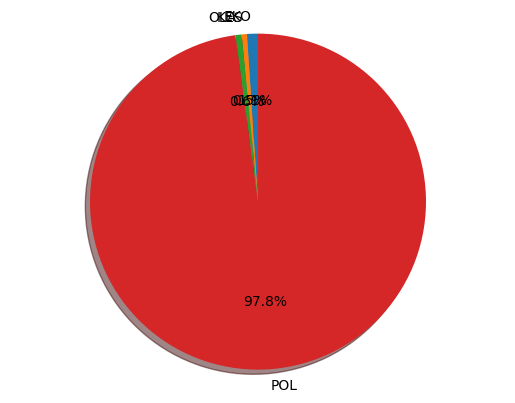

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'pleidoi ag ditolak jaksa minta hakim tetap jatuhkan hukuman 4 tahun penjara'

19/19 [==============================] - 0s 4ms/step


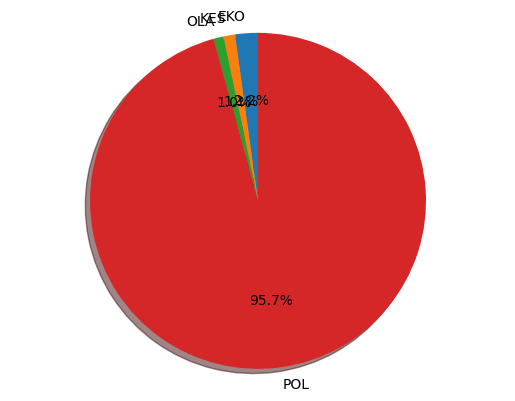

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'hasto sebut anies tak berani bersikap soal piala dunia u20 demokrat jangan orang diam ditanggapi'

19/19 [==============================] - 0s 3ms/step


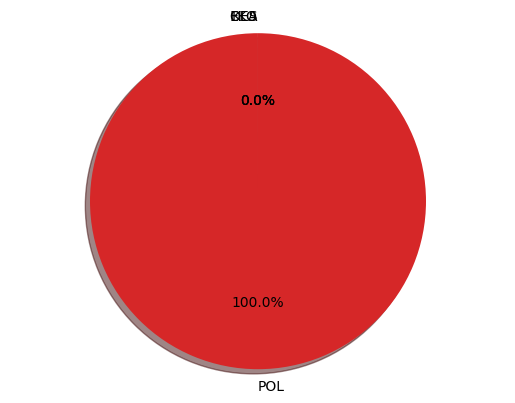

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'inspektorat dki diminta segera ungkap hasil pemeriksaan kabid dishub dki yang anakistrinya pamer harta'

19/19 [==============================] - 0s 3ms/step


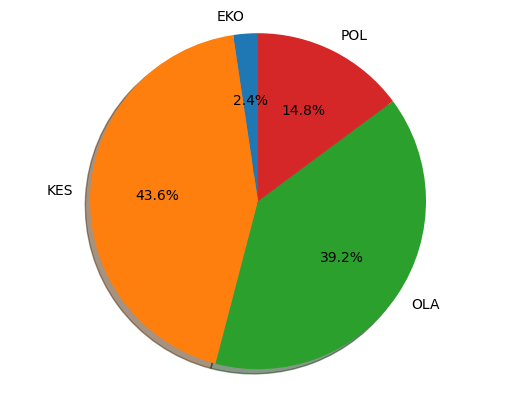

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'gaspol hari ini jalan politik megawati di mata hasto kristiyanto'

19/19 [==============================] - 0s 3ms/step


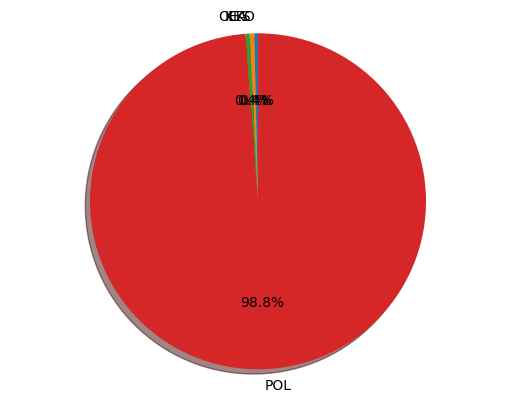

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'prabowo kalau pbb tidak dukung saya kali ini kebangetan'

19/19 [==============================] - 0s 3ms/step


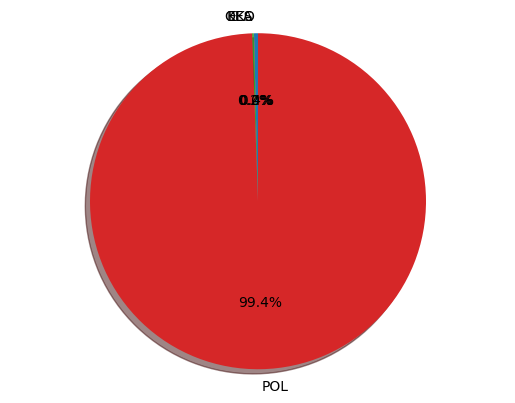

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'safari ramadhan bupati trenggalek buka endorse gratis untuk umkm'

19/19 [==============================] - 0s 2ms/step


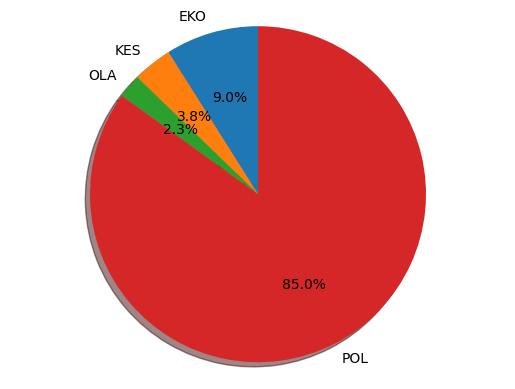

None

19/19 [==============================] - 0s 6ms/step
Best Prediction Adalah : Politik 



'yusril ingin jadi cawapres prabowo pkb tutup pintu untuk figur luar koalisi'

19/19 [==============================] - 0s 4ms/step


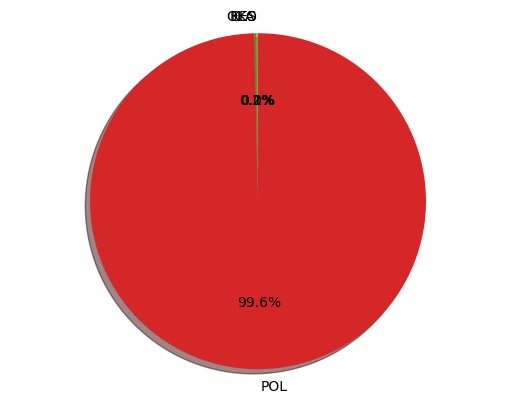

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'riset litbang kompas kubu kontra ganjar tunggangi isu piala dunia u20 buat naikkan tokoh lain'

19/19 [==============================] - 0s 5ms/step


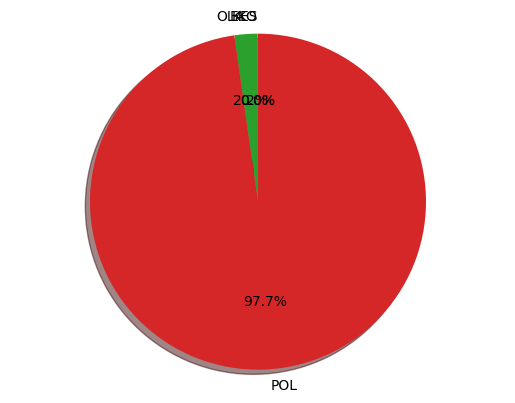

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'hasto sebut anies belum setara dengan jokowi demokrat ojo dibandingke'

19/19 [==============================] - 0s 4ms/step


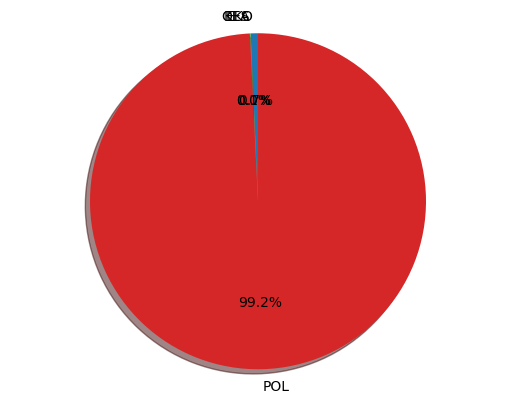

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'sekda riau mengaku diklarifikasi lhkpn dan tas mewah istri'

19/19 [==============================] - 0s 3ms/step


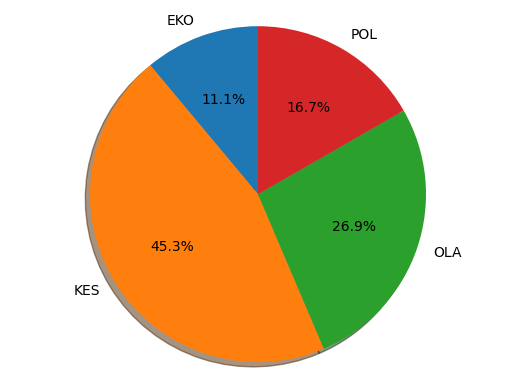

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Kesehatan 



'din syamsudin akui terlibat diskusi dengan hasto pdip untuk tolak timnas israel'

19/19 [==============================] - 0s 4ms/step


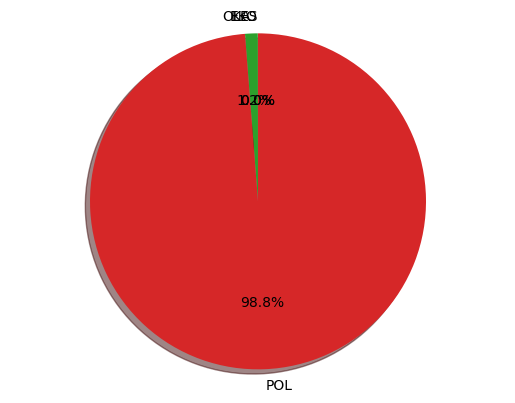

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'pemeriksaan kabid dishub soal flexing tak kunjung selesai anggota dprd inspektorat kenapa selama itu'

19/19 [==============================] - 0s 3ms/step


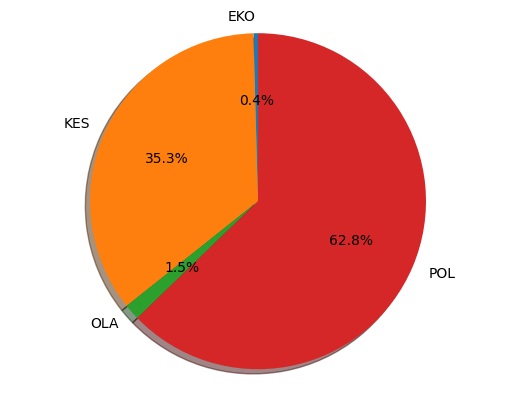

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'riset litbang kompas pendukung munculkan narasi positif hingga tafsir politik buat bela ganjar di medsos'

19/19 [==============================] - 0s 3ms/step


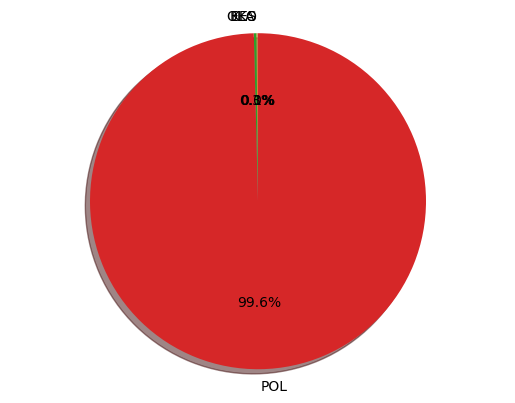

None

19/19 [==============================] - 0s 4ms/step
Best Prediction Adalah : Politik 



'eks pegawai kpk sebut kisruh pencopotan endar priantoro dimulai firli dkk'

19/19 [==============================] - 0s 4ms/step


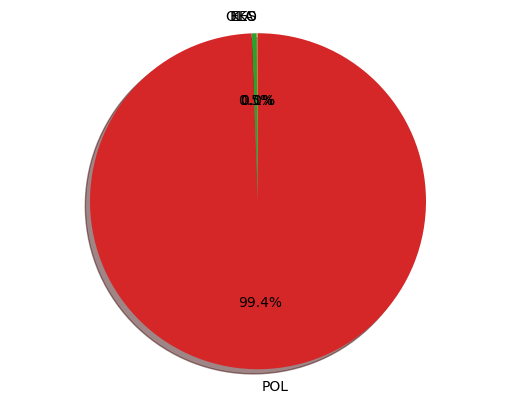

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



'sama seperti pdip muhammadiyah juga dukung sistem pemilu diubah'

19/19 [==============================] - 0s 3ms/step


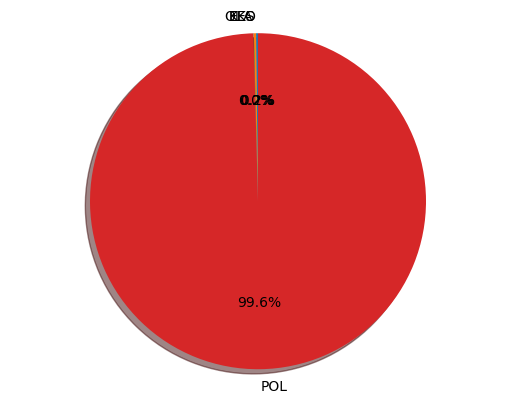

None

19/19 [==============================] - 0s 3ms/step
Best Prediction Adalah : Politik 



In [34]:
for x in range(len(prediksi_rnn_berita['Judul_Berita'])):
  display(prediksi_rnn_berita['Judul_Berita'][x])
  display(Pie_Chart_Visualization(x))
  Winner(x)

In [35]:
display(prediksi_rnn_berita)

,No,Judul_Berita,Kategori_Berita,Hasil_Prediksi
0,1,luhut akan rapat bahas hasil audit impor krl b...,Ekonomi,EKONOMI
1,2,cara bayar zakat fitrah lewat tokopedia,Ekonomi,EKONOMI
2,3,simak promo bsi jelang lebaran 2023,Ekonomi,EKONOMI
3,4,dubes ri untuk as kunjungan kongres as ke ri u...,Ekonomi,EKONOMI
4,5,waspada banyak tawaran investasi bodong dan pi...,Ekonomi,EKONOMI
...,...,...,...,...
599,600,din syamsudin akui terlibat diskusi dengan has...,Politik,POLITIK
600,601,pemeriksaan kabid dishub soal flexing tak kunj...,Politik,POLITIK
601,602,riset litbang kompas pendukung munculkan naras...,Politik,POLITIK
602,603,eks pegawai kpk sebut kisruh pencopotan endar ...,Politik,POLITIK



 Masukan Judul Berita yang akan diperdiksi: 10 Manfaat Buah Melon Untuk Kesehatan Tubuh
1/1 [==============================] - 0s 283ms/step

 Nilai Probabilitasnya:
 [[6.2657193e-05 9.9989653e-01 3.1755542e-05 9.0790809e-06]]
1/1 [==============================] - 0s 77ms/step


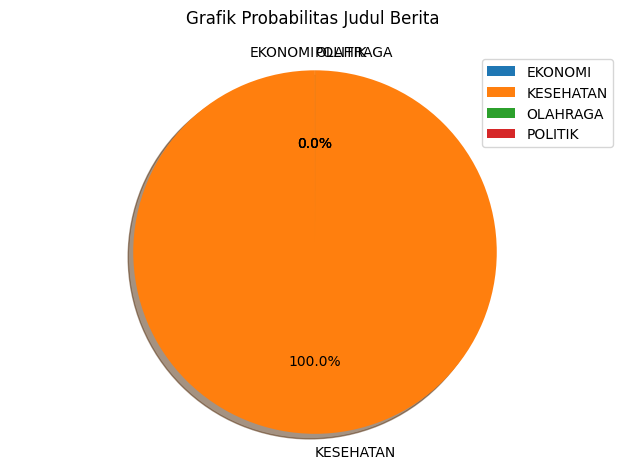

None

Best Prediction Adalah: KESEHATAN



In [47]:
export_model = tf.keras.Sequential([
    vectorize_layer,
    tf.keras.models.load_model('D:\BISMILLAH SKRIPSI\Codingan Skripsi\RNN_MULTIKLASIFIKASI_JUDUL_BERITA\RNN_MODEL_BASIC_210523.h5'),
    layers.Activation('softmax')
])
export_model.compile(loss=losses.SparseCategoricalCrossentropy(from_logits=True), optimizer='adam', metrics=['accuracy'])

examples = [input('\n Masukan Judul Berita yang akan diperdiksi: ')]

def pie_chart_visualization(x):
    labels = ['EKONOMI', 'KESEHATAN', 'OLAHRAGA', 'POLITIK']
    sizes = export_model.predict(examples)[0].tolist()
    explode = (0, 0, 0, 0)

    fig1, ax1 = plt.subplots()
    patches, _, _ = ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90)
    ax1.axis('equal')

    # Add legends
    plt.legend(patches, labels, loc='best')
    
    # Add Header
    ax1.set_title('Grafik Probabilitas Judul Berita \n')

    # Improve appearance
    plt.tight_layout()

    plt.show()


predictions = export_model.predict(examples)
print(f"\n Nilai Probabilitasnya:\n {predictions}")
display(pie_chart_visualization(0))

categories = {0: 'EKONOMI', 1: 'KESEHATAN', 2: 'OLAHRAGA', 3: 'POLITIK'}
winner = np.argmax(predictions[0])
print(f"Best Prediction Adalah: {categories.get(winner, 'Unknown')}\n")
